# Notebook demonstrating the use of Timeseriesai for generating predictions
https://github.com/timeseriesAI/timeseriesAI

## The below is done using the tutorial data set (one state, one season) and is a very small dataset so the results are only intended for use on how to use this, not necessarily what the ML capability is

### uses env timeseriesai

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from tsai.all import *
from joblib import Parallel, delayed
from openavalancheproject.tsai_utilities import *
import numpy as np
import zarr
from fastai.callback.tracker import EarlyStoppingCallback

In [3]:
#set_seed(42,False)

In [4]:
data_root = 'D:/OAPMLData/'

ml_path = data_root + '/4.MLData/'
num_features = 82 
interpolation = 1
label = 'Day1DangerAboveTreeline'
file_label = 'ca_co_day1above_3h_84d_small'

In [5]:
X = zarr.open(ml_path + 'X_' + file_label + '.zarr', mode='r')

In [6]:
X.shape

(48000, 82, 673)

In [7]:
utils = TSAIUtilities(X, label)

In [8]:
feature_names = pd.read_csv(ml_path + 'FeatureLabels_' + file_label + '.csv')
feature_names = feature_names['0'].sort_values().values

In [9]:
#read in the corresponding label files and concat them
#can get the right values here based on the contents of hte ml_path directory


num_train_files = 20 
file_list = []
for i in range(num_train_files):
    file_list.append(pd.read_parquet(ml_path + '/y_train_batch_' + str(i) + '_' + file_label + '.parquet'))

    
num_test_files = 4
for i in range(num_test_files):
    file_list.append(pd.read_parquet(ml_path + '/y_test_batch_' + str(i + num_train_files) + '_' + file_label + '.parquet'))
    
y_df = pd.concat(file_list).reset_index(drop=True)

In [10]:
y_df.shape

(48000, 304)

In [11]:
utils = TSAIUtilities(X, 'Day1DangerAboveTreeline')

In [12]:
y_df['season'].value_counts()

season
17-18    9093
18-19    8702
19-20    8297
20-21    8000
16-17    6993
15-16    6915
Name: count, dtype: int64

In [13]:
#y_df['Day1DangerAboveTreelineWithTrend'].value_counts()
y_df['Day1DangerAboveTreeline'].value_counts()

Day1DangerAboveTreeline
Considerable    12000
Moderate        12000
High            12000
Low             12000
Name: count, dtype: int64

In [14]:
X.shape

(48000, 82, 673)

In [15]:
train_test_seperator = len(y_df[y_df['season'] != '20-21'])

In [16]:
calc_min_train = False 
if calc_min_train == True:
    feature_mins, feature_maxs = utils.calc_min_max(X, 0, train_test_seperator)

In [17]:
calc_std_train = False 
if calc_std_train == True:
    feature_std, feature_mean = utils.calc_std_and_mean(X, 0, train_test_seperator)

In [25]:
#save feature_mins and feature_maxes to disk
np.save(ml_path + 'feature_std_' + file_label + '.npy', feature_std)
np.save(ml_path + 'feature_mean_' + file_label + '.npy', feature_mean)

In [36]:
#save feature_mins and feature_maxes to disk
np.save(ml_path + 'feature_mins_' + file_label + '.npy', feature_mins)
np.save(ml_path + 'feature_maxs_' + file_label + '.npy', feature_maxs)

In [16]:
feature_mins = np.load(ml_path + 'feature_mins_' + file_label + '.npy')
feature_maxs = np.load(ml_path + 'feature_maxs_' + file_label + '.npy')

In [17]:
feature_std = np.load(ml_path + 'feature_std_' + file_label + '.npy')
feature_mean = np.load(ml_path + 'feature_mean_' + file_label + '.npy')

In [18]:
y, cat_dict = utils.get_y_as_cat(y_df)
cat_dict

{0: 'Low', 1: 'Moderate', 2: 'Considerable', 3: 'High'}

In [19]:
y.shape

(48000,)

In [20]:
splits2 = (L(list(y_df[y_df['season']!='20-21'].index.values)).shuffle(), L(list(y_df[y_df['season']=='20-21'].index.values)).shuffle())

In [30]:
splits, dls = utils.create_dls(X, y, splits=splits2, feature_mins=np.asarray(feature_mins), feature_maxs=np.asarray(feature_maxs), sample_frac=1)#, num_test_files=12)
splits

((#40000) [16305,7999,3517,3298,15843,31611,24138,20450,15808,16701...],
 (#8000) [44265,46060,46446,44094,42241,45822,46056,41882,45815,43603...])

In [35]:
splits, dls = utils.create_dls(X, y, splits=splits2, feature_std=np.asarray(feature_std), feature_mean=np.asarray(feature_mean), sample_frac=1)#, num_test_files=12)

CPU times: total: 2.19 s
Wall time: 2.36 s


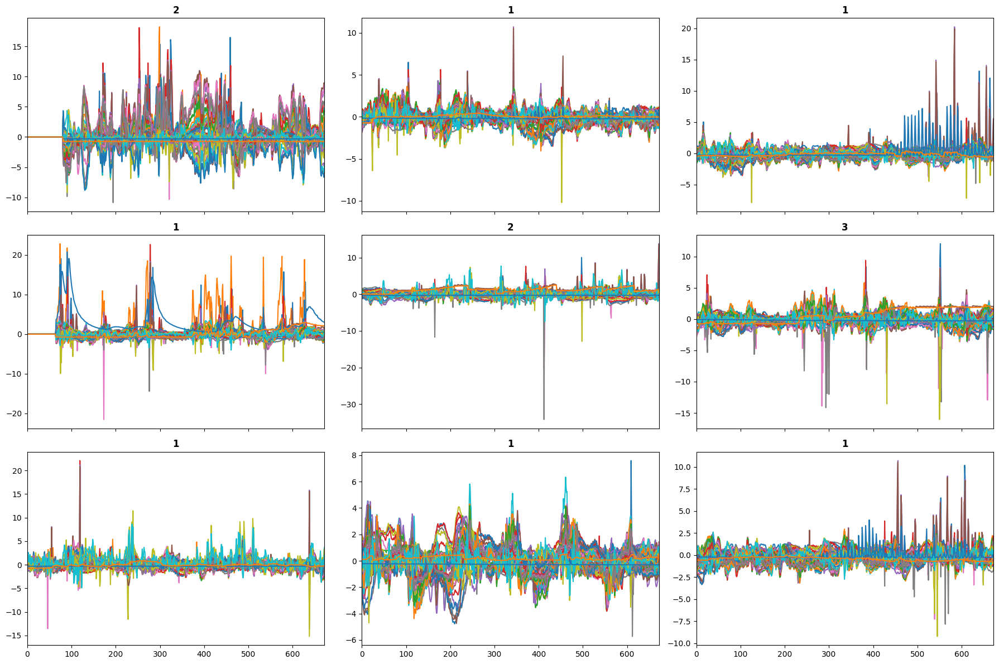

In [36]:
%%time
dls.show_batch()

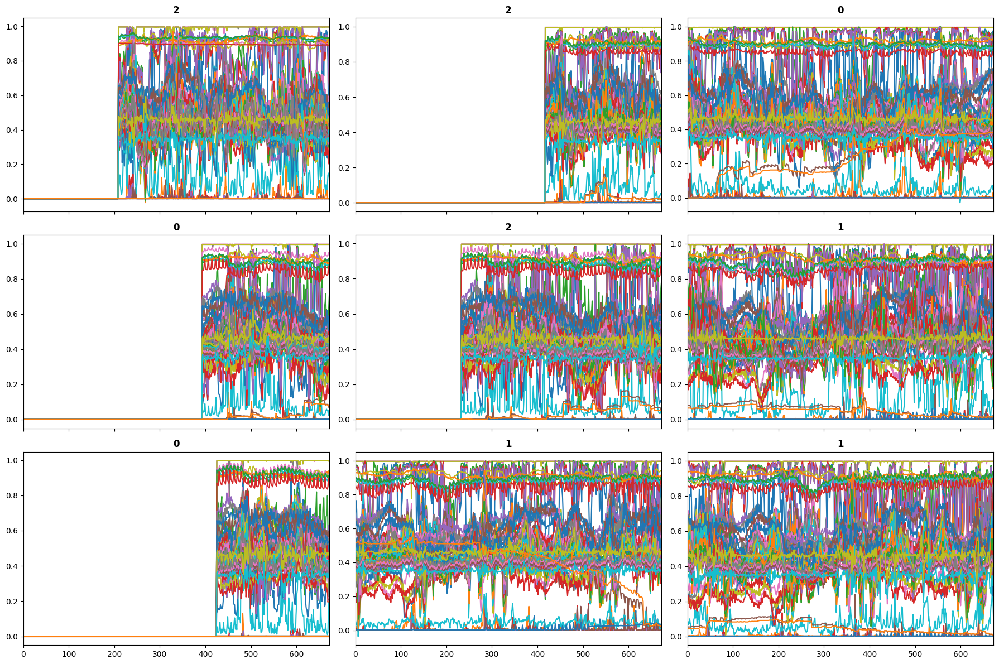

In [32]:
dls.valid.show_batch()

In [4]:
import optuna
from optuna.integration import FastAIPruningCallback
from matplotlib.pyplot import plot, show
import gc
import joblib
from os.path import exists

In [5]:

def objective(trial:optuna.Trial):
  
    
    num_days = trial.suggest_int('num_days', 7, 84, step=7)
    X_sub = X[:, :, -num_days*8:]
    #s_frac = trial.suggest_float('sample_frac', .1, 1, step=.1)
    s_frac = 1
    batch_size = trial.suggest_int('batch_size', 4, 32, step=4)
    normalize = trial.suggest_categorical('normalize', [True, False])
    if normalize == True:
        splits, dls = utils.create_dls(X_sub, y, feature_mins=np.asarray(feature_mins), 
                                    feature_maxs=np.asarray(feature_maxs), 
                                    splits=splits2, sample_frac=s_frac, batch_size=batch_size)
    else:
        splits, dls = utils.create_dls(X_sub, y, feature_std=np.asarray(feature_std), 
                                    feature_mean=np.asarray(feature_mean), 
                                    splits=splits2, sample_frac=s_frac, batch_size=batch_size)
    #fp = trial.suggest_categorical('fp', [16, 32])
    normalize = trial.suggest_categorical('normalize', [True, False])
    # model_type = trial.suggest_categorical('model', ['InceptionTimePlus', 'TST', 'XCM', 
    #                                                  'LSTM', 'FCN', 'LSTM_FCNPlus', 'TCN',
    #                                                  'ResNetPlus', 'OmniScaleCNN','TSiTPlus', 'XceptionTimePlus'] )
    model_type = 'TST'
    learn = None
    if model_type == 'InceptionTimePlus':
        # Define search space here. More info here https://optuna.readthedocs.io/en/stable/tutorial/10_key_features/002_configurations.html
        itp_nf = trial.suggest_categorical('itp_num_filters', [32, 64, 96]) # search through all categorical values in the provided list
        itp_depth = 12 #trial.suggest_int('itp_depth', 3, 13, step=3) # search through all integer values between 3 and 9 with 3 increment steps
        itp_dropout_rate = trial.suggest_float("itp_dropout_rate", 0.0, 0.8, step=.2) 
        itp_fc_dropout_rate = trial.suggest_float("itp_fc_dropout_rate", 0.0, 0.8, step=.2) 
        itp_ks = trial.suggest_int('itp_ks', 20, 60, step=10 )
        # search through all float values between 0.0 and 0.5 in log increment steps
        model = InceptionTimePlus(dls.vars, dls.c, seq_len = num_days * 8, depth=itp_depth, conv_dropout=itp_dropout_rate, fc_dropout=itp_fc_dropout_rate)
    elif model_type == 'TST':
        n_heads = trial.suggest_int('n_heads', 1,64, step=1)
        d_model = n_heads * trial.suggest_int('d_model', 1,5, step=1)
        d_k = trial.suggest_int('d_k', 1, 5, step=1)
        d_v = trial.suggest_int('d_v', 1, 5, step=1)
        d_ff = trial.suggest_int('d_ff', 128, 512, step=128)
        tst_dropout = trial.suggest_float("tst_dropout", 0.0, 0.8, step=.2)
        n_layers = trial.suggest_int('n_layers', 1, 27, step=3)
        tst_attn_dropout = trial.suggest_float("tst_attn_dropout", 0.0, 0.8, step=.2)
        tst_fc_dropout = trial.suggest_float("tst_fc_dropout", 0.0, 0.8, step=.2)
        model = TSTPlus(dls.vars, dls.c, dls.len, d_model=d_model, n_heads=n_heads, d_k=d_k, d_v=d_v, d_ff=d_ff, store_attn=False, dropout=tst_dropout, n_layers=n_layers, attn_dropout=tst_attn_dropout, fc_dropout=tst_fc_dropout)
    elif model_type == 'XCM':       
        window_perc = trial.suggest_float('window_perc', .2, 1, step=.2)
        xcm_nf = trial.suggest_int('xcm_nf', 64, 256, step=64)
        xcm_fc_dropout = trial.suggest_float("xcm_fc_dropout", 0.0, 0.8, step=.2)
        model = XCMPlus(dls.vars, dls.c, dls.len, window_perc=window_perc, nf=xcm_nf, fc_dropout=xcm_fc_dropout)
    elif model_type == 'LSTM':        
        hidden_size = trial.suggest_int('hidden_size', 100, 250, step=50)
        lstm_n_layers = trial.suggest_int('lstm_n_layers', 1, 10, step=2)
        rnn_dropout = trial.suggest_float('rnn_dropout', 0, .8, step=.2)
        bidirectional = trial.suggest_categorical('bidirectional', [True, False])
        lstm_fc_dropout = trial.suggest_float('lstm_fc_dropout', 0, .8, step=.2)
        cell_type = trial.suggest_categorical('lstm_cell_type', ['LSTM', 'RNN', 'GRU'])
        if cell_type == 'LSTM':
            model = LSTMPlus(dls.vars, dls.c, hidden_size=hidden_size, n_layers=lstm_n_layers, rnn_dropout=rnn_dropout, bidirectional=bidirectional, fc_dropout=lstm_fc_dropout)
        elif cell_type == 'RNN':
            model = RNNPlus(dls.vars, dls.c, hidden_size=hidden_size, n_layers=lstm_n_layers, rnn_dropout=rnn_dropout, bidirectional=bidirectional, fc_dropout=lstm_fc_dropout)
        elif cell_type == 'GRU':
            model = GRUPlus(dls.vars, dls.c, hidden_size=hidden_size, n_layers=lstm_n_layers, rnn_dropout=rnn_dropout, bidirectional=bidirectional, fc_dropout=lstm_fc_dropout)
    elif model_type =='FCN':
        fcn_fc_dropout = trial.suggest_float('fcn_fc_dropout', 0, .8, step=.2)
        model = FCNPlus(dls.vars, dls.c, fc_dropout=fcn_fc_dropout)
    elif model_type == 'OmniScaleCNN':
        model = TSTPlus(dls.vars, dls.c, dls.len)
    elif model_type == 'LSTM_FCNPlus':
        lstm_fcn_hidden_size = trial.suggest_int('lstm_fcn_hidden_size', 100, 250, step=50)
        lstm_fcn_n_layers = trial.suggest_int('lstm_fcn_n_layers', 1, 10, step=2)        
        lstm_fcn_rnn_dropout = trial.suggest_float('lstm_fcn_rnn_dropout', 0, .8, step=.2)
        lstm_fcn_bidirectional = trial.suggest_categorical('lstm_fcn_bidirectional', [True, False])        
        lstm_fcn_cell_dropout = trial.suggest_float('lstm_fcn_cell_dropout', 0, .8, step=.2)
        lstm_fcn_cell_type = trial.suggest_categorical('lstm_fcn_cell_type', ['LSTM', 'RNN', 'GRU'])
        if lstm_fcn_cell_type == 'LSTM':
            model = LSTM_FCNPlus(dls.vars, dls.c, dls.len, hidden_size=lstm_fcn_hidden_size, rnn_layers=lstm_fcn_n_layers, rnn_dropout=lstm_fcn_rnn_dropout, bidirectional=lstm_fcn_bidirectional, cell_dropout=lstm_fcn_cell_dropout)
        elif lstm_fcn_cell_type == 'RNN':
            model = RNN_FCNPlus(dls.vars, dls.c, dls.len, hidden_size=lstm_fcn_hidden_size, rnn_layers=lstm_fcn_n_layers, rnn_dropout=lstm_fcn_rnn_dropout, bidirectional=lstm_fcn_bidirectional, cell_dropout=lstm_fcn_cell_dropout)
        elif lstm_fcn_cell_type == 'GRU':
            model = GRU_FCNPlus(dls.vars, dls.c, dls.len, hidden_size=lstm_fcn_hidden_size, rnn_layers=lstm_fcn_n_layers, rnn_dropout=lstm_fcn_rnn_dropout, bidirectional=lstm_fcn_bidirectional, cell_dropout=lstm_fcn_cell_dropout)
    elif model_type=='ResNetPlus':
        resnetplus_fc_dropout = trial.suggest_float('resnetplus_fc_dropout', 0, .8, step=.2)
        model = ResNetPlus(dls.vars, dls.c, fc_dropout=resnetplus_fc_dropout)
    elif model_type=='TCN':
        TCN_fc_dropout = trial.suggest_float('TCN_fc_dropout', 0, .8, step=.2)
        TCN_conv_dropout = trial.suggest_float('TCN_conv_dropout', 0, .8, step=.2)
        model = TCN(dls.vars, dls.c, conv_dropout=TCN_conv_dropout, fc_dropout=TCN_fc_dropout)
    elif model_type=='TSiTPlus':
        TSiTPlus_attn_dropout = trial.suggest_float('TSiTPlus_attn_dropout', 0, .8, step=.2)
        TSiTPlus_dropout = trial.suggest_float('TSiTPlus_dropout', 0, .8, step=.2)
        model = TSiTPlus(dls.vars, dls.c, dls.len, attn_dropout=TSiTPlus_dropout, dropout=TSiTPlus_dropout)
    elif model_type=='XceptionTimePlus':       
        model = XceptionTimePlus(dls.vars, dls.c)
        
    loss_func = trial.suggest_categorical('loss_func', ['LabelSmoothingCrossEntropy', 'LabelSmoothingCrossEntropyFlat', 'None'])
    actual_loss_func = None
    if loss_func == 'LabelSmoothingCrossEntropy':
         actual_loss_func = LabelSmoothingCrossEntropy()
    elif loss_func == 'LabelSmoothingCrossEntropyFlat':
         actual_loss_func = LabelSmoothingCrossEntropyFlat()
    
    #learning_rate = 10 ** trial.suggest_int("learning_rate", -5, -2, step=1)
    learning_rate = 10e-5
    actual_learner_callback = None
    learner_callback = trial.suggest_categorical('learner_callback', ['None', 'CutMix1d', 'IntraClassCutMix1d'])
    actual_learner_callback = None
    if learner_callback == 'CutMix1d':
        actual_learner_callback = CutMix1d()
    elif learner_callback == 'IntraClassCutMix1d':
        actual_learner_callback = IntraClassCutMix1d()
    
    optimizer = trial.suggest_categorical('optimizer', ['AdamWDTrue', 'AdamWDFalse'])
    actual_optimizer = None 
    actual_optimizer = partial(Adam, decouple_wd=True)
    if optimizer == 'AdamWDTrue':
        actual_optimizer = partial(Adam, decouple_wd=True)
    elif optimizer == 'AdamWDFalse':
        actual_optimizer = partial(Adam, decouple_wd=False)
        
    #if fp == 32:
    learn = Learner(dls, model, metrics=[accuracy, BalancedAccuracy()], opt_func=actual_optimizer, loss_func=actual_loss_func, cbs=actual_learner_callback)
    #learn = Learner(dls, model, metrics=[accuracy, BalancedAccuracy()])
    #else:
    #    learn = Learner(dls, model, metrics=[accuracy, BalancedAccuracy()], loss_func=actual_loss_func).to_fp16()
    
    print(str(trial.params))
    try:
        learn.fit_one_cycle(200, learning_rate, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.001, patience=5)])
    except RuntimeError as e:
        print('Runtime error ' + str(e))
        
        del(model)
        del(learn)
        del(dls)
        gc.collect()
        try:
            torch.cuda.empty_cache()
        except RuntimeError as e_inner:
            print('Runtime error ' + str(e_inner))
        
        joblib.dump(study, "study.pkl")
        return 0 
    objective = max([x[3] for x in learn.recorder.values]) #2 is accuracy 3 is balaned accuracy
    
    learn.recorder.plot_metrics()    
    
    try:        
        interp = ClassificationInterpretation.from_learner(learn)
        conf_matrix = interp.plot_confusion_matrix(normalize=True)
        show(block=False)
    except BaseException as e:
        print('Error showing stats' + str(e))
        #learn = learn.to_native_fp32()
        #interp = ClassificationInterpretation.from_learner(learn)
        #conf_matrix = interp.plot_confusion_matrix(normalize=True)
        #show(block=False)
    
    #clean up
    del(model)
    del(learn)
    del(dls)
    gc.collect()
    torch.cuda.empty_cache()
    
    joblib.dump(study, "study.pkl")
    return objective
    

In [9]:
optuna.importance.get_param_importances(study)

{'learning_rate': 0.3052546063861139,
 'tst_dropout': 0.258986415877516,
 'learner_callback': 0.12198012610124913,
 'n_layers': 0.0970463562873049,
 'd_model': 0.04356789423353251,
 'itp_heads': 0.04093774889894361,
 'batch_size': 0.028282717879133282,
 'sample_frac': 0.024224206350276473,
 'itp_d_v': 0.023817354385036217,
 'num_days': 0.019945075383573232,
 'loss_func': 0.010544580681868117,
 'd_ff': 0.01015370803880342,
 'optimizer': 0.004612146144867558,
 'itp_d_k': 0.004184343035892492,
 'tst_attn_dropout': 0.0036016631276038526,
 'tst_fc_dropout': 0.0028610571882853684}

In [20]:
fig = optuna.visualization.plot_contour(study, params=['num_days', 'learning_rate', 'tst_dropout', 'learner_callback', 'n_layers', 'd_model', 'itp_heads', 'tst_attn_dropout', 'tst_fc_dropout'])
#make fig larger
fig.update_layout(width=2000, height=1200)
fig.show()

[I 2023-10-31 08:32:36,331] A new study created in memory with name: no-name-4319aff4-2552-4ea1-a43b-d2f83f468144


{'num_days': 63, 'batch_size': 16, 'normalize': False, 'n_heads': 15, 'd_model': 5, 'd_k': 2, 'd_v': 1, 'd_ff': 128, 'tst_dropout': 0.4, 'n_layers': 1, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.182187,1.178910,0.465125,0.465125,01:17
1,1.148150,1.166577,0.482375,0.482375,01:16
2,1.168644,1.158524,0.484375,0.484375,01:13
3,1.111204,1.171082,0.467375,0.467375,01:18
4,1.104406,1.169059,0.469000,0.469000,01:18
5,1.104329,1.168298,0.472125,0.472125,01:18
6,1.073883,1.168409,0.474375,0.474375,01:19
7,1.069130,1.173121,0.473125,0.473125,01:19


No improvement since epoch 2: early stopping


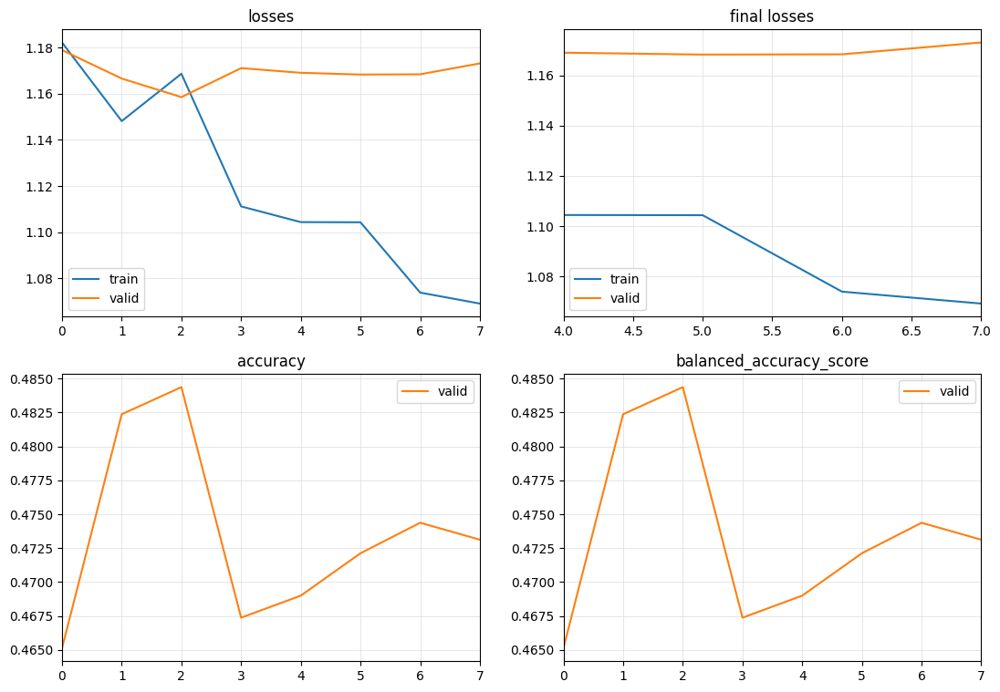

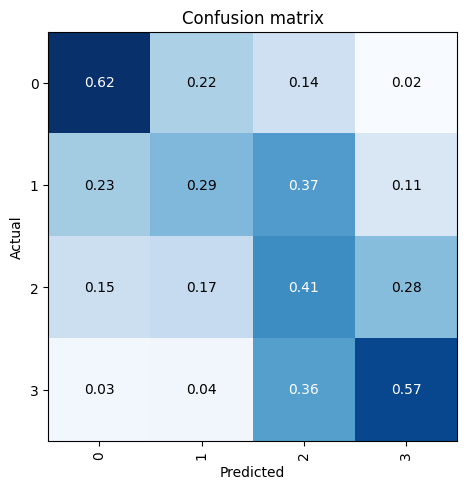

[I 2023-10-31 08:44:08,681] Trial 0 finished with value: 0.484375 and parameters: {'num_days': 63, 'batch_size': 16, 'normalize': False, 'n_heads': 15, 'd_model': 5, 'd_k': 2, 'd_v': 1, 'd_ff': 128, 'tst_dropout': 0.4, 'n_layers': 1, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 0 with value: 0.484375.


{'num_days': 77, 'batch_size': 16, 'normalize': False, 'n_heads': 12, 'd_model': 5, 'd_k': 3, 'd_v': 5, 'd_ff': 512, 'tst_dropout': 0.6000000000000001, 'n_layers': 7, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.4, 'loss_func': 'None', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.417766,1.380767,0.322125,0.322125,08:02
1,1.427588,1.371881,0.325875,0.325875,07:30
2,1.414122,1.371231,0.312750,0.312750,07:44
3,1.390788,1.364957,0.331375,0.331375,08:10
4,1.358459,1.353788,0.361750,0.361750,08:13
5,1.359360,1.329844,0.386500,0.386500,07:59
6,1.353397,1.311321,0.396375,0.396375,08:01
7,1.341061,1.309098,0.392000,0.392000,07:57
8,1.304510,1.296414,0.393625,0.393625,07:58
9,1.304760,1.263993,0.415750,0.415750,07:57


No improvement since epoch 19: early stopping


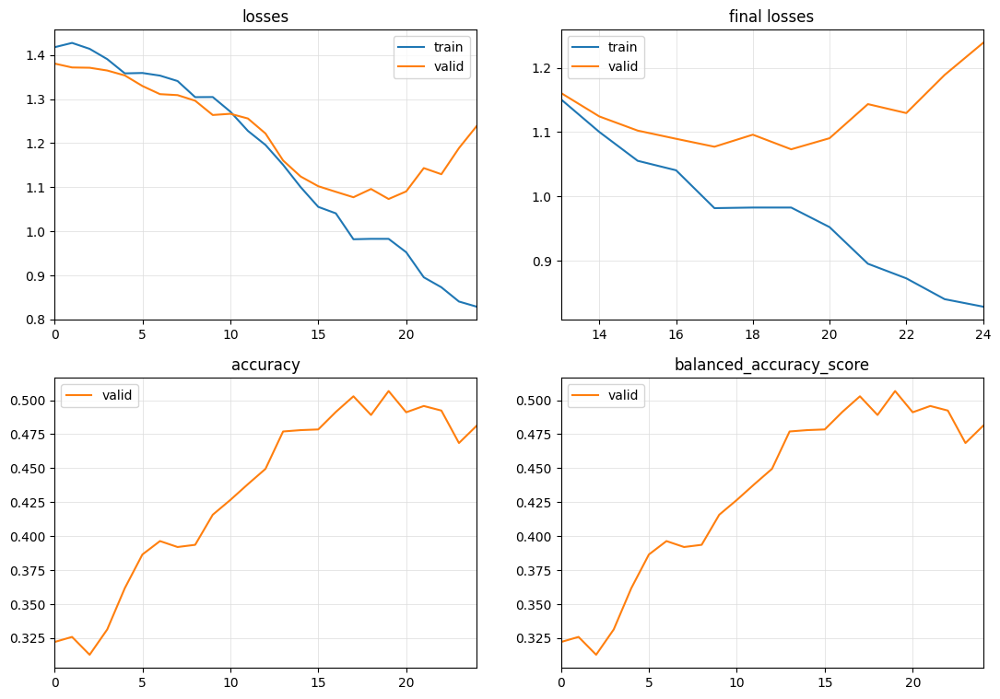

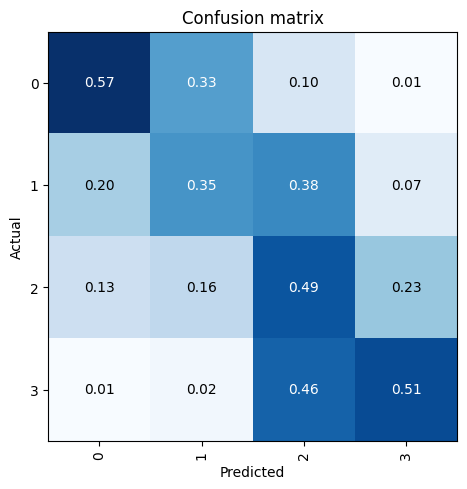

[I 2023-10-31 12:05:41,375] Trial 1 finished with value: 0.50675 and parameters: {'num_days': 77, 'batch_size': 16, 'normalize': False, 'n_heads': 12, 'd_model': 5, 'd_k': 3, 'd_v': 5, 'd_ff': 512, 'tst_dropout': 0.6000000000000001, 'n_layers': 7, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.4, 'loss_func': 'None', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}. Best is trial 1 with value: 0.50675.


{'num_days': 42, 'batch_size': 32, 'normalize': False, 'n_heads': 45, 'd_model': 2, 'd_k': 1, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.4, 'n_layers': 4, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.368565,1.262220,0.427125,0.427125,06:03
1,1.347827,1.211470,0.460250,0.460250,06:13
2,1.303355,1.178976,0.465375,0.465375,06:01
3,1.266968,1.165839,0.468750,0.468750,06:04
4,1.258038,1.148843,0.473875,0.473875,06:33
5,1.227436,1.123962,0.469375,0.469375,06:03
6,1.232139,1.102460,0.478625,0.478625,05:58
7,1.207924,1.088721,0.488625,0.488625,06:07
8,1.195108,1.093211,0.482875,0.482875,05:58
9,1.189076,1.065038,0.510125,0.510125,05:54


No improvement since epoch 17: early stopping


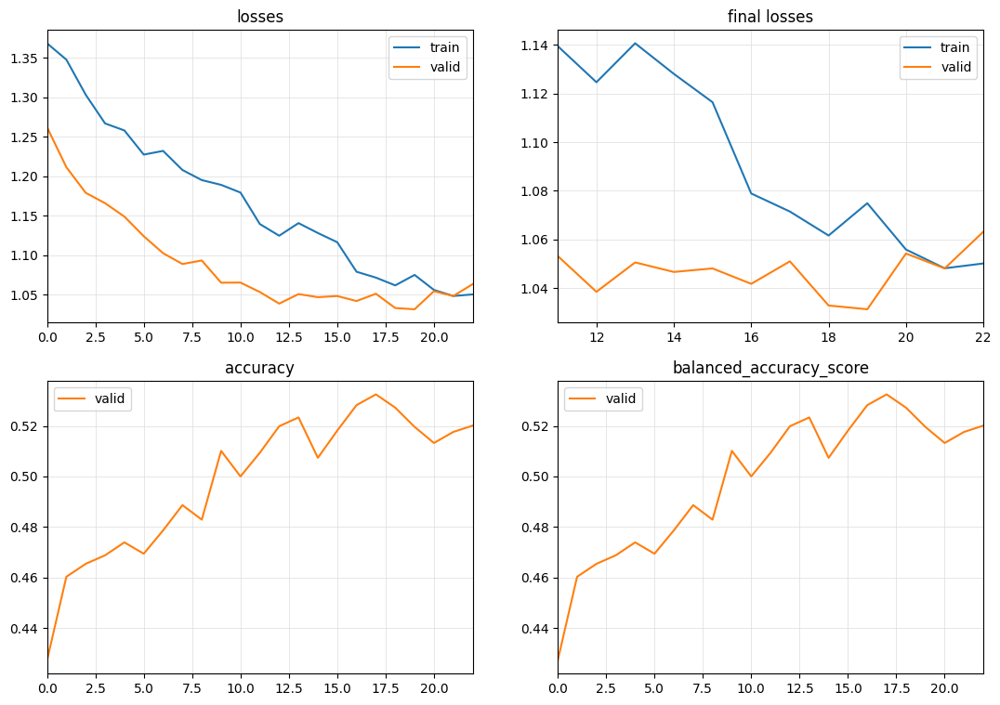

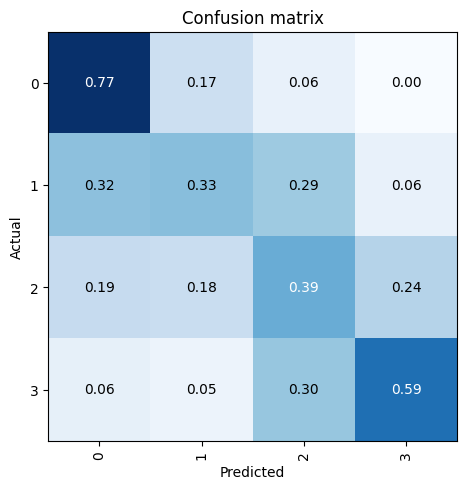

[I 2023-10-31 14:27:19,245] Trial 2 finished with value: 0.5325 and parameters: {'num_days': 42, 'batch_size': 32, 'normalize': False, 'n_heads': 45, 'd_model': 2, 'd_k': 1, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.4, 'n_layers': 4, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 2 with value: 0.5325.


{'num_days': 84, 'batch_size': 12, 'normalize': False, 'n_heads': 40, 'd_model': 5, 'd_k': 3, 'd_v': 4, 'd_ff': 256, 'tst_dropout': 0.4, 'n_layers': 16, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[W 2023-10-31 14:27:49,351] Trial 3 failed with parameters: {'num_days': 84, 'batch_size': 12, 'normalize': False, 'n_heads': 40, 'd_model': 5, 'd_k': 3, 'd_v': 4, 'd_ff': 256, 'tst_dropout': 0.4, 'n_layers': 16, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'} because of the following error: RuntimeError('CUDA error: out of memory\nCUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.\nFor debugging consider passing CUDA_LAUNCH_BLOCKING=1.\nCompile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.\n').
Traceback (most recent call last):
  File "C:\Users\scott\AppData\Local\Temp\ipykernel_4032\1492194965.py", line 128, in objective
    learn.fit_one_cycle(200, learning_rate, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.001, patience=5)])
  File "c:\Users\scott\miniconda3\envs\tsai\lib\si

Runtime error CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.



RuntimeError: CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [39]:
study = optuna.create_study(direction='maximize', sampler=optuna.samplers.NSGAIISampler())
#if exists("study.pkl"):
#   study = joblib.load("study.pkl")
    
study.optimize(objective, n_trials=200)

{'num_days': 63, 'batch_size': 24, 'normalize': True, 'n_heads': 30, 'd_model': 5, 'd_k': 5, 'd_v': 1, 'd_ff': 128, 'tst_dropout': 0.4, 'n_layers': 25, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[I 2023-11-02 06:44:28,700] Trial 17 finished with value: 0.0 and parameters: {'num_days': 63, 'batch_size': 24, 'normalize': True, 'n_heads': 30, 'd_model': 5, 'd_k': 5, 'd_v': 1, 'd_ff': 128, 'tst_dropout': 0.4, 'n_layers': 25, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 15 with value: 0.55975.


Runtime error CUDA out of memory. Tried to allocate 698.00 MiB (GPU 0; 11.00 GiB total capacity; 9.41 GiB already allocated; 0 bytes free; 10.09 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
{'num_days': 77, 'batch_size': 28, 'normalize': False, 'n_heads': 52, 'd_model': 4, 'd_k': 3, 'd_v': 3, 'd_ff': 256, 'tst_dropout': 0.8, 'n_layers': 4, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[I 2023-11-02 06:44:48,257] Trial 18 finished with value: 0.0 and parameters: {'num_days': 77, 'batch_size': 28, 'normalize': False, 'n_heads': 52, 'd_model': 4, 'd_k': 3, 'd_v': 3, 'd_ff': 256, 'tst_dropout': 0.8, 'n_layers': 4, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 15 with value: 0.55975.


Runtime error CUDA out of memory. Tried to allocate 1.42 GiB (GPU 0; 11.00 GiB total capacity; 8.15 GiB already allocated; 0 bytes free; 9.57 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
{'num_days': 14, 'batch_size': 28, 'normalize': False, 'n_heads': 3, 'd_model': 3, 'd_k': 1, 'd_v': 4, 'd_ff': 256, 'tst_dropout': 0.0, 'n_layers': 7, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.0, 'loss_func': 'None', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.304182,1.276860,0.417750,0.417750,01:14
1,1.178948,1.159405,0.477875,0.477875,01:14
2,1.089075,1.108978,0.494875,0.494875,01:17
3,1.053606,1.067952,0.515500,0.515500,01:18
4,1.018579,1.052958,0.517000,0.517000,01:17
5,1.023061,1.047503,0.517625,0.517625,01:17
6,0.959273,1.034662,0.521250,0.521250,01:18
7,0.945025,1.025787,0.530625,0.530625,01:18
8,0.950045,1.008508,0.537000,0.537000,01:18
9,0.917662,0.999760,0.540625,0.540625,01:17


No improvement since epoch 15: early stopping


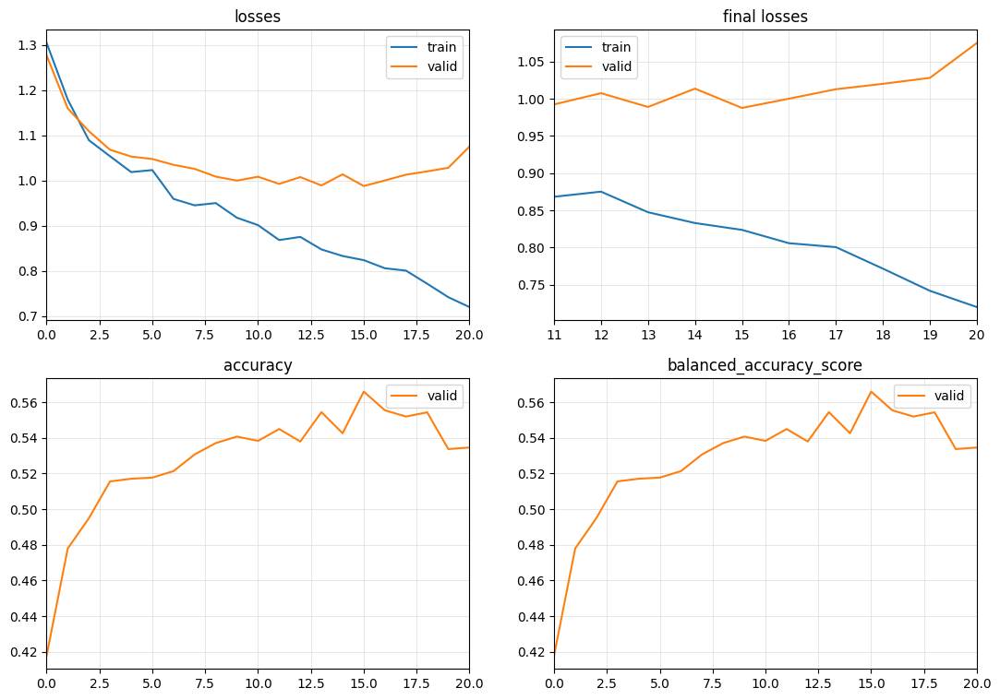

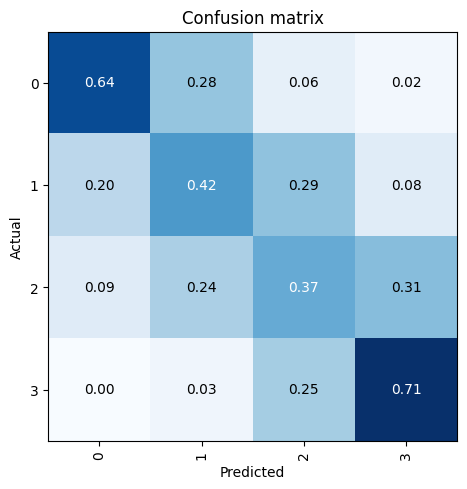

[I 2023-11-02 07:12:22,748] Trial 19 finished with value: 0.565875 and parameters: {'num_days': 14, 'batch_size': 28, 'normalize': False, 'n_heads': 3, 'd_model': 3, 'd_k': 1, 'd_v': 4, 'd_ff': 256, 'tst_dropout': 0.0, 'n_layers': 7, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.0, 'loss_func': 'None', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}. Best is trial 19 with value: 0.565875.


{'num_days': 14, 'batch_size': 4, 'normalize': False, 'n_heads': 49, 'd_model': 5, 'd_k': 3, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.2, 'n_layers': 4, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.131581,1.107258,0.543500,0.543500,05:19
1,0.972010,1.079864,0.554750,0.554750,05:34
2,0.947956,1.083926,0.569625,0.569625,05:30
3,0.921746,1.075836,0.556125,0.556125,05:33
4,0.990733,1.103016,0.540750,0.540750,05:33
5,0.880696,1.091259,0.559250,0.559250,05:33
6,0.913654,1.113202,0.542625,0.542625,05:27
7,0.855290,1.117200,0.557750,0.557750,05:34


No improvement since epoch 2: early stopping


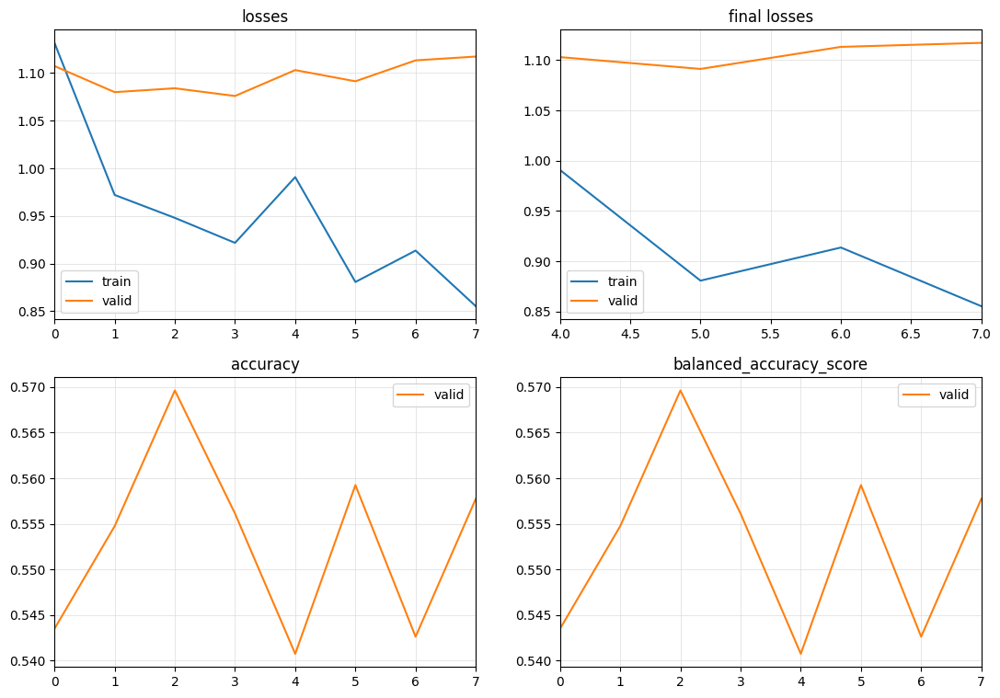

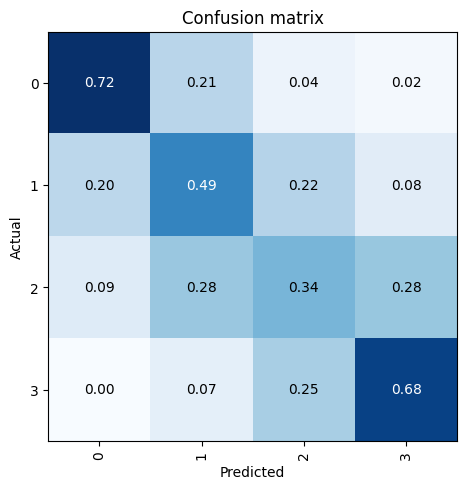

[I 2023-11-02 07:57:17,598] Trial 20 finished with value: 0.569625 and parameters: {'num_days': 14, 'batch_size': 4, 'normalize': False, 'n_heads': 49, 'd_model': 5, 'd_k': 3, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.2, 'n_layers': 4, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}. Best is trial 20 with value: 0.569625.


{'num_days': 42, 'batch_size': 16, 'normalize': False, 'n_heads': 15, 'd_model': 5, 'd_k': 2, 'd_v': 1, 'd_ff': 512, 'tst_dropout': 0.0, 'n_layers': 7, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.200263,1.153304,0.505375,0.505375,04:04
1,1.108188,1.122771,0.535250,0.535250,04:05
2,1.048372,1.110267,0.545500,0.545500,04:04
3,1.035704,1.097926,0.551125,0.551125,04:05
4,0.973598,1.119347,0.543375,0.543375,04:05
5,0.952630,1.121378,0.543375,0.543375,04:05
6,0.958179,1.126330,0.531750,0.531750,04:13
7,0.923288,1.131653,0.536750,0.536750,04:27
8,0.902540,1.155288,0.515375,0.515375,04:05


No improvement since epoch 3: early stopping


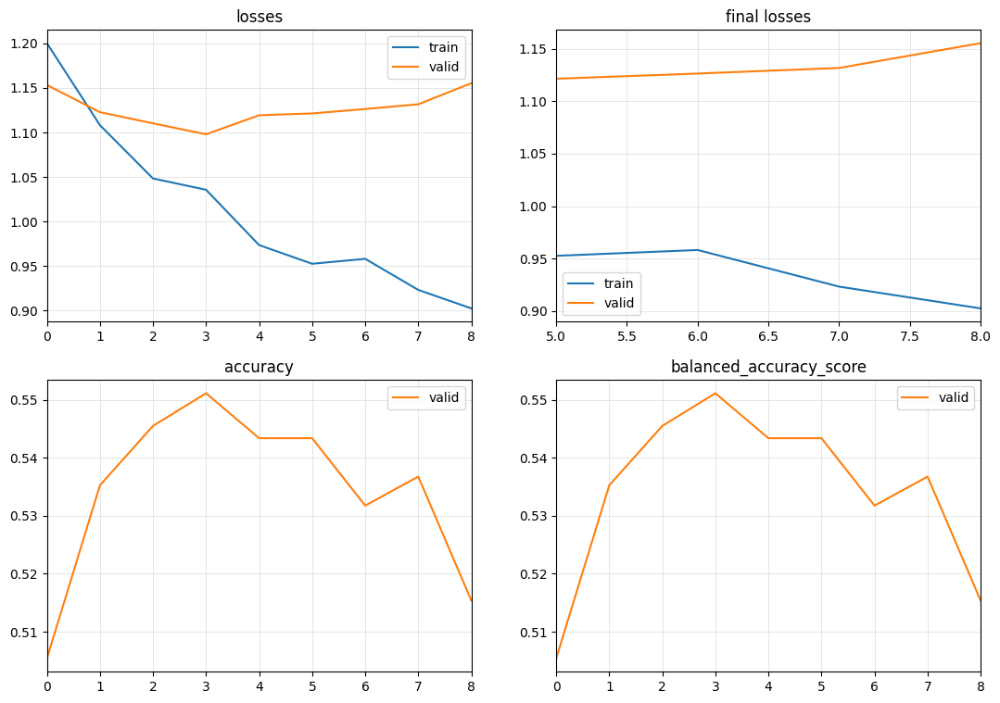

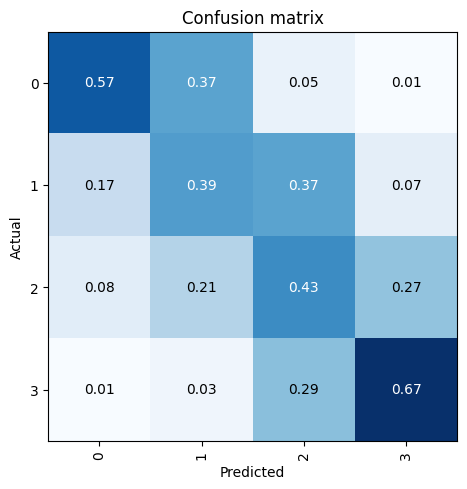

[I 2023-11-02 08:35:20,160] Trial 21 finished with value: 0.551125 and parameters: {'num_days': 42, 'batch_size': 16, 'normalize': False, 'n_heads': 15, 'd_model': 5, 'd_k': 2, 'd_v': 1, 'd_ff': 512, 'tst_dropout': 0.0, 'n_layers': 7, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 20 with value: 0.569625.


{'num_days': 28, 'batch_size': 20, 'normalize': False, 'n_heads': 58, 'd_model': 4, 'd_k': 4, 'd_v': 4, 'd_ff': 128, 'tst_dropout': 0.0, 'n_layers': 19, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.2, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[I 2023-11-02 08:35:38,727] Trial 22 finished with value: 0.0 and parameters: {'num_days': 28, 'batch_size': 20, 'normalize': False, 'n_heads': 58, 'd_model': 4, 'd_k': 4, 'd_v': 4, 'd_ff': 128, 'tst_dropout': 0.0, 'n_layers': 19, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.2, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


Runtime error CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.

Runtime error CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.



[W 2023-11-02 08:35:54,169] Trial 23 failed with parameters: {'num_days': 49, 'batch_size': 4, 'normalize': False, 'n_heads': 44, 'd_model': 5, 'd_k': 5, 'd_v': 5, 'd_ff': 128, 'tst_dropout': 0.4, 'n_layers': 1, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.0} because of the following error: RuntimeError('CUDA error: out of memory\nCUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.\nFor debugging consider passing CUDA_LAUNCH_BLOCKING=1.\nCompile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.\n').
Traceback (most recent call last):
  File "c:\Users\scott\miniconda3\envs\tsai\lib\site-packages\optuna\study\_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
  File "C:\Users\scott\AppData\Local\Temp\ipykernel_25020\2406734117.py", line 44, in objective
    model = TSTPlus(dls.vars, dls.c, dls.len, d_model=d_model, n_heads=n_heads, d_k=d_k, d_v=d_v, d_ff=d_ff, store_attn=False, dropout=tst

RuntimeError: CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [24]:
study.optimize(objective, n_trials=200)

{'num_days': 49, 'batch_size': 4, 'normalize': False, 'n_heads': 44, 'd_model': 5, 'd_k': 5, 'd_v': 5, 'd_ff': 128, 'tst_dropout': 0.4, 'n_layers': 1, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.128543,1.148607,0.508375,0.508375,03:22
1,1.071152,1.162999,0.494625,0.494625,03:16
2,0.990752,1.166508,0.502125,0.502125,03:16
3,0.969226,1.181985,0.472000,0.472000,03:16
4,0.954644,1.161742,0.495125,0.495125,03:17
5,0.910733,1.199982,0.482375,0.482375,03:39


No improvement since epoch 0: early stopping


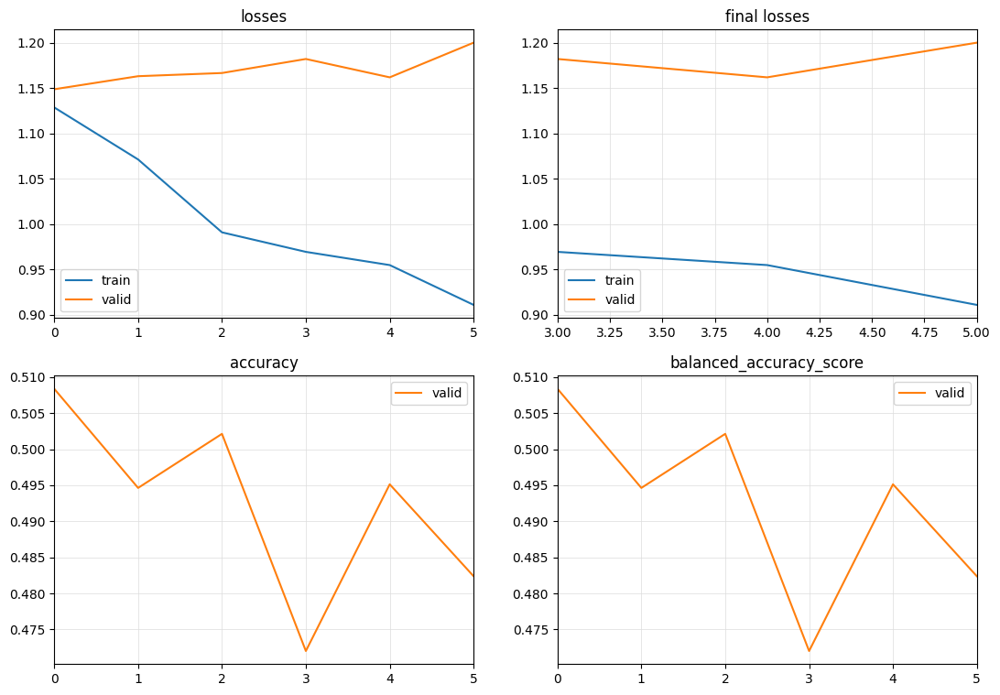

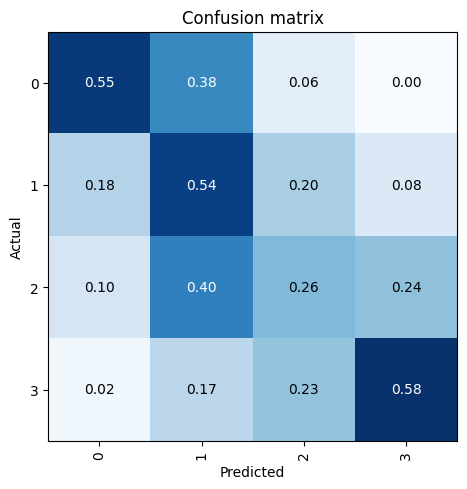

[I 2023-11-02 09:13:59,829] Trial 23 finished with value: 0.508375 and parameters: {'num_days': 49, 'batch_size': 4, 'normalize': False, 'n_heads': 44, 'd_model': 5, 'd_k': 5, 'd_v': 5, 'd_ff': 128, 'tst_dropout': 0.4, 'n_layers': 1, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


{'num_days': 7, 'batch_size': 20, 'normalize': True, 'n_heads': 40, 'd_model': 1, 'd_k': 4, 'd_v': 4, 'd_ff': 384, 'tst_dropout': 0.6000000000000001, 'n_layers': 19, 'tst_attn_dropout': 0.6000000000000001, 'tst_fc_dropout': 0.4, 'loss_func': 'None', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.452882,1.386316,0.250000,0.250000,04:31
1,1.440906,1.386314,0.250000,0.250000,04:29
2,1.442494,1.386306,0.250000,0.250000,04:20
3,1.441177,1.386299,0.250000,0.250000,04:16
4,1.436767,1.386292,0.250000,0.250000,04:21
5,1.448535,1.386299,0.250000,0.250000,04:24


No improvement since epoch 0: early stopping


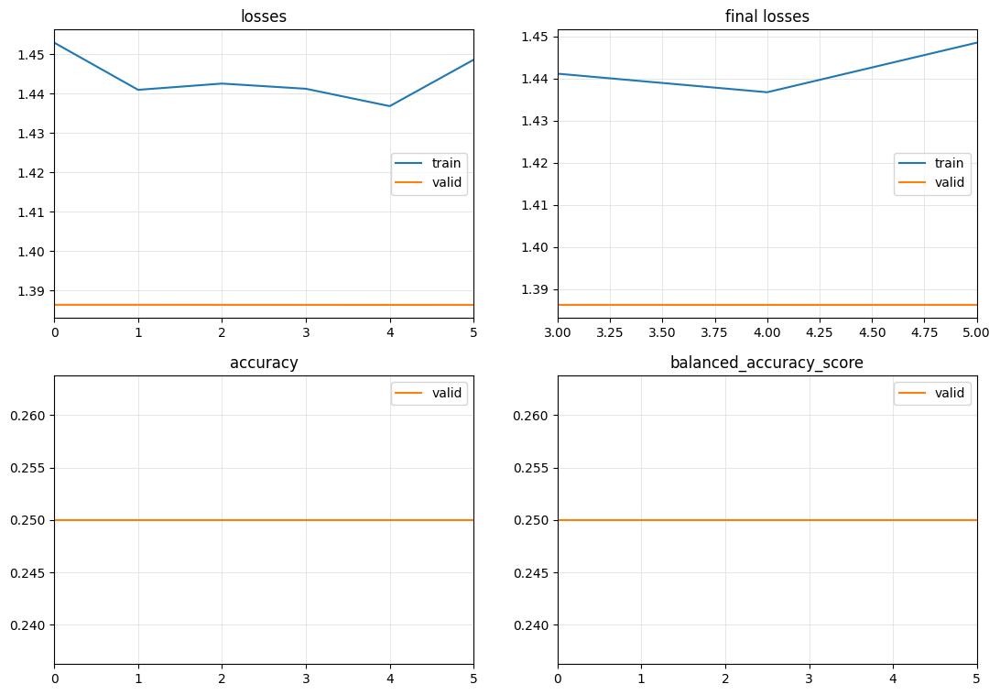

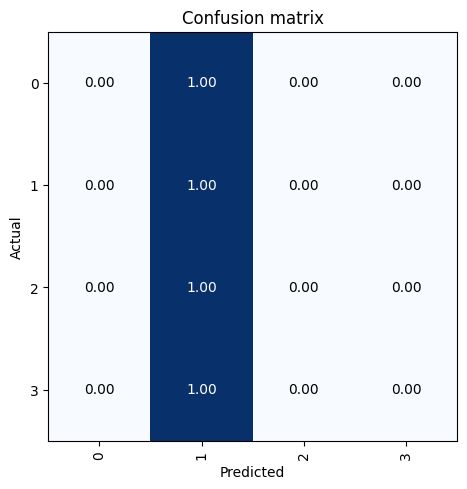

[I 2023-11-02 09:40:58,880] Trial 24 finished with value: 0.25 and parameters: {'num_days': 7, 'batch_size': 20, 'normalize': True, 'n_heads': 40, 'd_model': 1, 'd_k': 4, 'd_v': 4, 'd_ff': 384, 'tst_dropout': 0.6000000000000001, 'n_layers': 19, 'tst_attn_dropout': 0.6000000000000001, 'tst_fc_dropout': 0.4, 'loss_func': 'None', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


{'num_days': 28, 'batch_size': 20, 'normalize': False, 'n_heads': 62, 'd_model': 4, 'd_k': 1, 'd_v': 4, 'd_ff': 128, 'tst_dropout': 0.4, 'n_layers': 10, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.2, 'loss_func': 'None', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.134950,1.138807,0.480500,0.480500,10:56
1,1.066717,1.092928,0.493500,0.493500,11:00
2,1.003963,1.069908,0.503875,0.503875,10:59
3,0.998599,1.052250,0.520500,0.520500,11:05
4,0.975131,1.050601,0.526750,0.526750,11:03
5,0.939087,1.029409,0.535000,0.535000,11:01
6,0.918051,1.053694,0.536250,0.536250,11:03
7,0.877427,1.036936,0.544000,0.544000,10:46
8,0.897727,1.017847,0.548625,0.548625,10:32
9,0.829075,1.051665,0.538250,0.538250,10:16


No improvement since epoch 10: early stopping


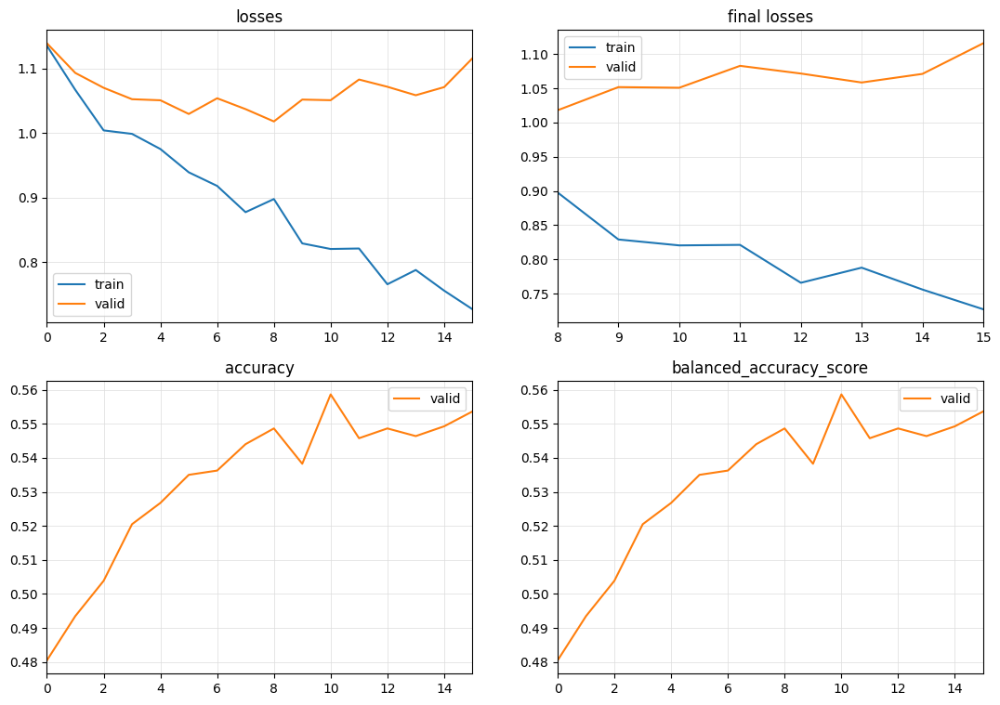

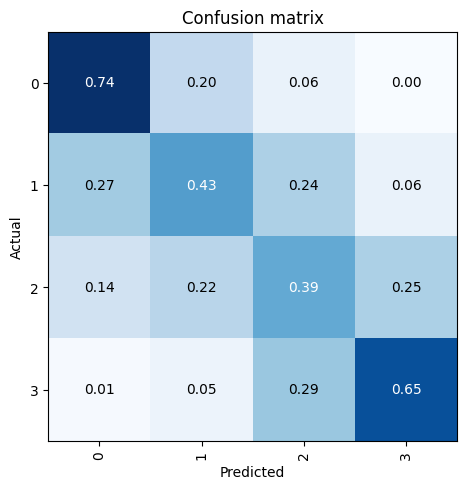

[I 2023-11-02 12:36:54,315] Trial 25 finished with value: 0.558625 and parameters: {'num_days': 28, 'batch_size': 20, 'normalize': False, 'n_heads': 62, 'd_model': 4, 'd_k': 1, 'd_v': 4, 'd_ff': 128, 'tst_dropout': 0.4, 'n_layers': 10, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.2, 'loss_func': 'None', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


{'num_days': 21, 'batch_size': 8, 'normalize': False, 'n_heads': 34, 'd_model': 4, 'd_k': 5, 'd_v': 3, 'd_ff': 384, 'tst_dropout': 0.4, 'n_layers': 25, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.427425,1.379884,0.304375,0.304375,17:19
1,1.411414,1.370916,0.340625,0.340625,16:35
2,1.391532,1.342846,0.400375,0.400375,16:33
3,1.388779,1.309720,0.405125,0.405125,16:34
4,1.367716,1.280705,0.424750,0.424750,16:33
5,1.334695,1.268694,0.430125,0.430125,16:34
6,1.301761,1.252680,0.452875,0.452875,16:49
7,1.253893,1.216296,0.483875,0.483875,16:56
8,1.204030,1.173509,0.505000,0.505000,17:27
9,1.177973,1.144770,0.503250,0.503250,17:22


No improvement since epoch 18: early stopping


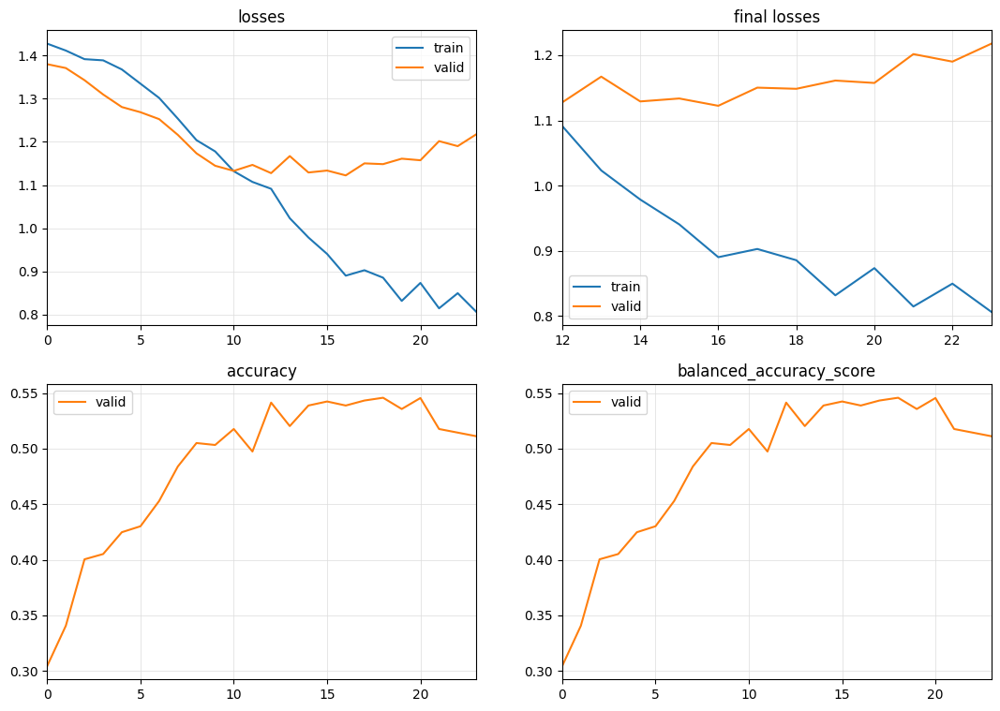

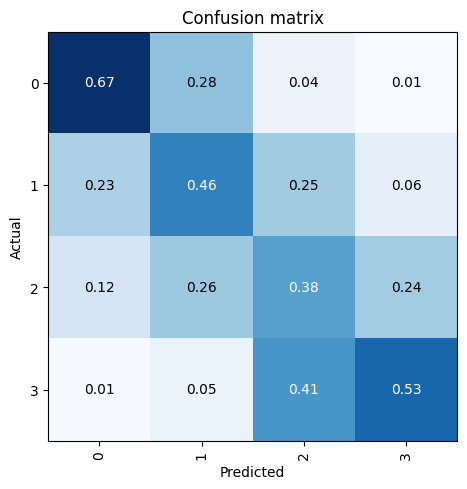

[I 2023-11-02 19:20:40,334] Trial 26 finished with value: 0.54575 and parameters: {'num_days': 21, 'batch_size': 8, 'normalize': False, 'n_heads': 34, 'd_model': 4, 'd_k': 5, 'd_v': 3, 'd_ff': 384, 'tst_dropout': 0.4, 'n_layers': 25, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 20 with value: 0.569625.


{'num_days': 84, 'batch_size': 4, 'normalize': True, 'n_heads': 16, 'd_model': 1, 'd_k': 1, 'd_v': 3, 'd_ff': 128, 'tst_dropout': 0.8, 'n_layers': 13, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.437755,1.386342,0.250000,0.250000,22:15
1,1.431238,1.386315,0.250000,0.250000,22:16
2,1.426480,1.386308,0.250000,0.250000,22:16
3,1.413994,1.386312,0.250000,0.250000,23:24
4,1.425427,1.386293,0.250000,0.250000,22:18
5,1.415687,1.386318,0.250000,0.250000,22:16


No improvement since epoch 0: early stopping


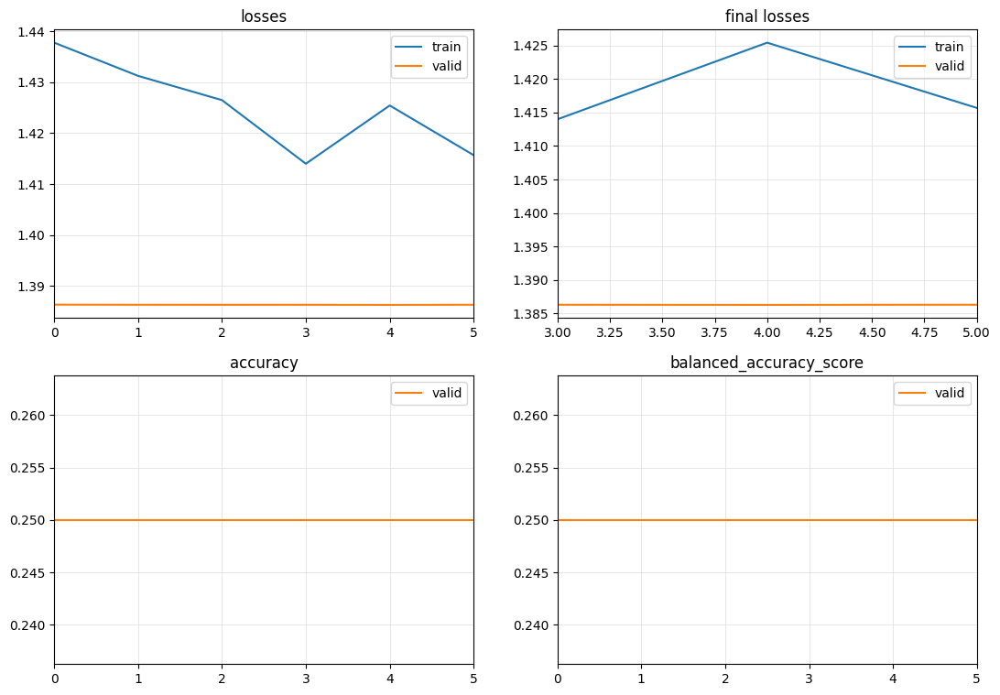

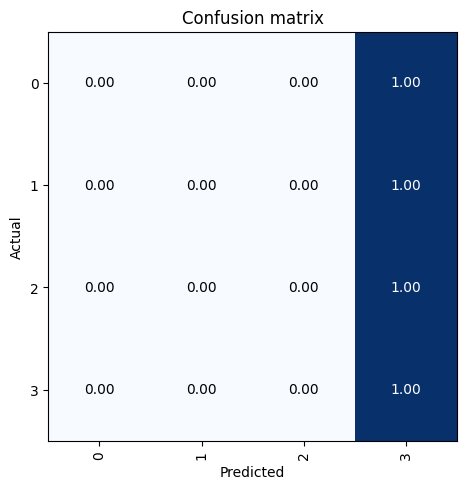

[I 2023-11-02 21:40:45,410] Trial 27 finished with value: 0.25 and parameters: {'num_days': 84, 'batch_size': 4, 'normalize': True, 'n_heads': 16, 'd_model': 1, 'd_k': 1, 'd_v': 3, 'd_ff': 128, 'tst_dropout': 0.8, 'n_layers': 13, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


{'num_days': 70, 'batch_size': 28, 'normalize': True, 'n_heads': 52, 'd_model': 5, 'd_k': 3, 'd_v': 1, 'd_ff': 128, 'tst_dropout': 0.8, 'n_layers': 19, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[I 2023-11-02 21:41:11,986] Trial 28 finished with value: 0.0 and parameters: {'num_days': 70, 'batch_size': 28, 'normalize': True, 'n_heads': 52, 'd_model': 5, 'd_k': 3, 'd_v': 1, 'd_ff': 128, 'tst_dropout': 0.8, 'n_layers': 19, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


Runtime error CUDA out of memory. Tried to allocate 1.42 GiB (GPU 0; 11.00 GiB total capacity; 8.13 GiB already allocated; 0 bytes free; 9.58 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
{'num_days': 49, 'batch_size': 20, 'normalize': True, 'n_heads': 37, 'd_model': 1, 'd_k': 4, 'd_v': 5, 'd_ff': 512, 'tst_dropout': 0.4, 'n_layers': 4, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.0, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.330989,1.218893,0.409375,0.409375,07:42
1,1.267283,1.152736,0.473500,0.473500,07:41
2,1.214338,1.100552,0.499500,0.499500,07:42
3,1.202861,1.076413,0.510750,0.510750,07:41
4,1.163073,1.062256,0.524375,0.524375,07:56
5,1.124261,1.056143,0.532500,0.532500,07:41
6,1.137462,1.046785,0.539500,0.539500,07:41
7,1.103394,1.052740,0.539125,0.539125,07:42
8,1.112557,1.068191,0.529625,0.529625,07:42
9,1.102788,1.050594,0.541250,0.541250,07:42


No improvement since epoch 9: early stopping


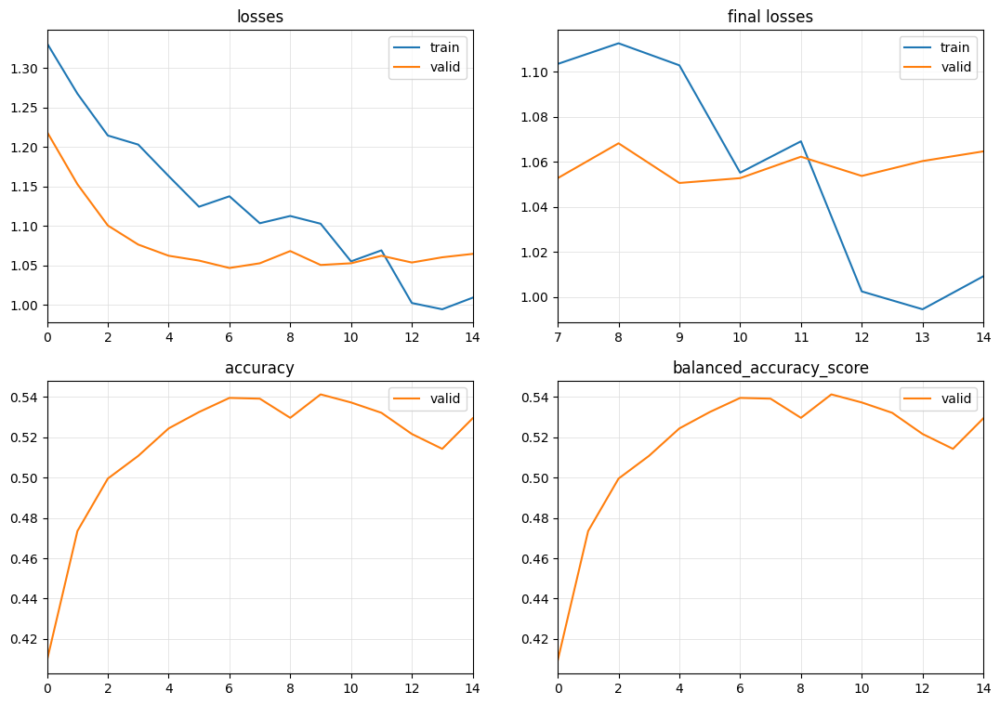

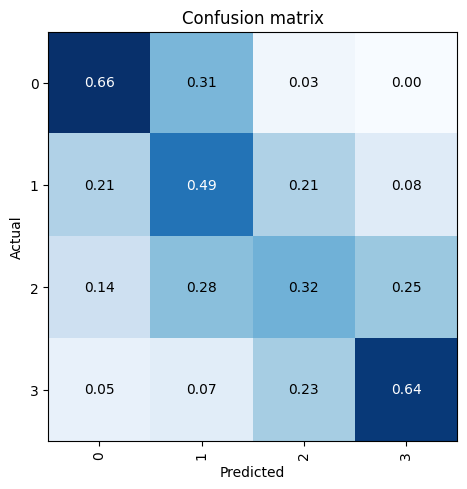

[I 2023-11-02 23:38:18,367] Trial 29 finished with value: 0.54125 and parameters: {'num_days': 49, 'batch_size': 20, 'normalize': True, 'n_heads': 37, 'd_model': 1, 'd_k': 4, 'd_v': 5, 'd_ff': 512, 'tst_dropout': 0.4, 'n_layers': 4, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.0, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


{'num_days': 70, 'batch_size': 24, 'normalize': True, 'n_heads': 39, 'd_model': 4, 'd_k': 4, 'd_v': 3, 'd_ff': 512, 'tst_dropout': 0.8, 'n_layers': 1, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.465156,1.342543,0.368500,0.368500,02:51
1,1.399223,1.303413,0.398375,0.398375,02:51
2,1.338494,1.278012,0.419750,0.419750,02:51
3,1.324901,1.254677,0.449375,0.449375,02:50
4,1.259509,1.232400,0.471500,0.471500,02:50
5,1.231697,1.206207,0.484250,0.484250,02:51
6,1.171703,1.178364,0.498000,0.498000,02:50
7,1.127759,1.158863,0.512000,0.512000,02:51
8,1.099054,1.137093,0.520875,0.520875,02:51
9,1.109982,1.124474,0.533125,0.533125,02:50


No improvement since epoch 12: early stopping


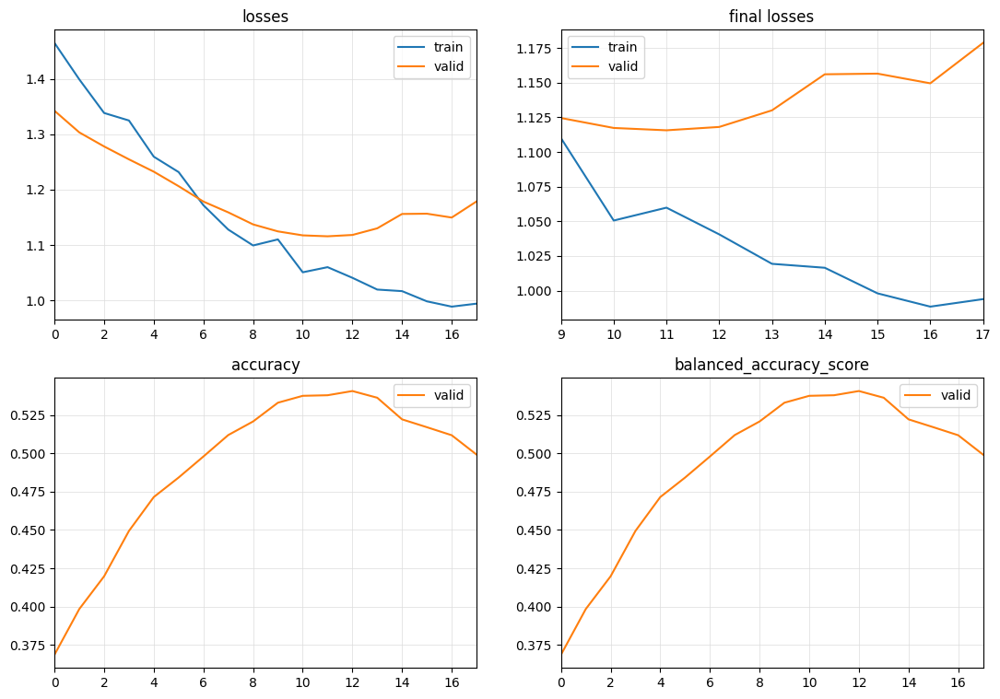

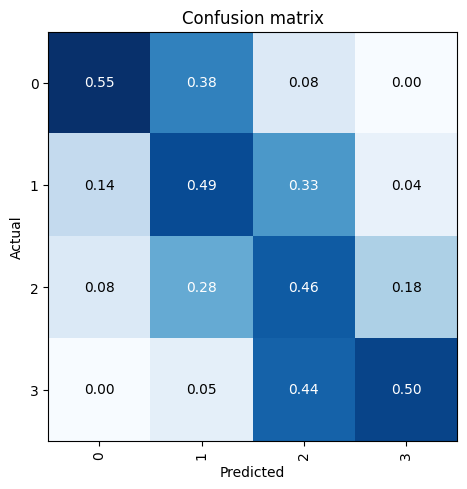

[I 2023-11-03 00:30:20,549] Trial 30 finished with value: 0.54075 and parameters: {'num_days': 70, 'batch_size': 24, 'normalize': True, 'n_heads': 39, 'd_model': 4, 'd_k': 4, 'd_v': 3, 'd_ff': 512, 'tst_dropout': 0.8, 'n_layers': 1, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


{'num_days': 28, 'batch_size': 28, 'normalize': False, 'n_heads': 14, 'd_model': 4, 'd_k': 5, 'd_v': 3, 'd_ff': 128, 'tst_dropout': 0.4, 'n_layers': 22, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.472515,1.386317,0.247250,0.247250,07:00
1,1.464652,1.386215,0.248500,0.248500,07:00
2,1.474657,1.386134,0.268250,0.268250,07:00
3,1.463962,1.386090,0.283375,0.283375,07:00
4,1.474442,1.385933,0.323375,0.323375,06:59
5,1.473030,1.385668,0.266500,0.266500,07:00
6,1.463103,1.385453,0.262625,0.262625,07:00
7,1.457059,1.385474,0.266000,0.266000,06:59
8,1.446472,1.385204,0.273750,0.273750,06:59
9,1.441869,1.384515,0.286875,0.286875,07:00


No improvement since epoch 4: early stopping


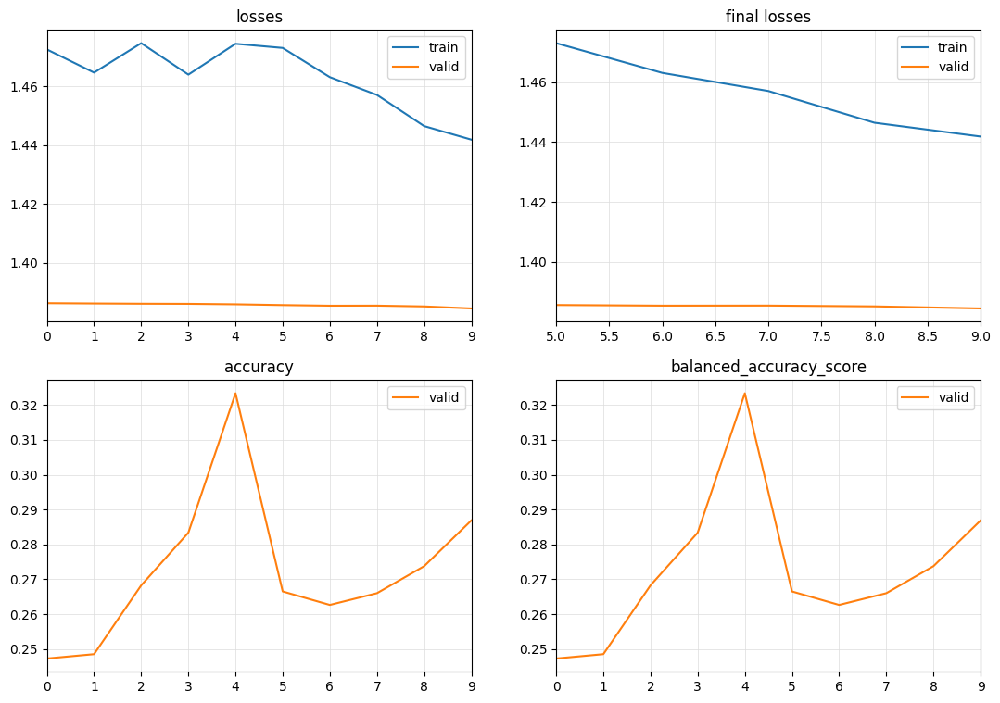

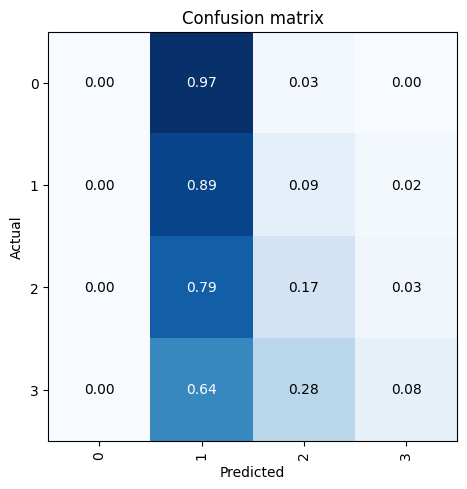

[I 2023-11-03 01:41:28,770] Trial 31 finished with value: 0.323375 and parameters: {'num_days': 28, 'batch_size': 28, 'normalize': False, 'n_heads': 14, 'd_model': 4, 'd_k': 5, 'd_v': 3, 'd_ff': 128, 'tst_dropout': 0.4, 'n_layers': 22, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 20 with value: 0.569625.


{'num_days': 14, 'batch_size': 12, 'normalize': True, 'n_heads': 27, 'd_model': 1, 'd_k': 4, 'd_v': 4, 'd_ff': 512, 'tst_dropout': 0.6000000000000001, 'n_layers': 4, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.471667,1.358132,0.384625,0.384625,02:01
1,1.429097,1.285999,0.413500,0.413500,01:59
2,1.395519,1.229446,0.420250,0.420250,02:00
3,1.394701,1.209945,0.434375,0.434375,02:00
4,1.336703,1.193579,0.462750,0.462750,01:59
5,1.349635,1.178490,0.495000,0.495000,02:00
6,1.305613,1.186321,0.516875,0.516875,02:01
7,1.296944,1.188227,0.513500,0.513500,02:00
8,1.267506,1.166748,0.518125,0.518125,02:00
9,1.265404,1.175966,0.502750,0.502750,02:00


No improvement since epoch 23: early stopping


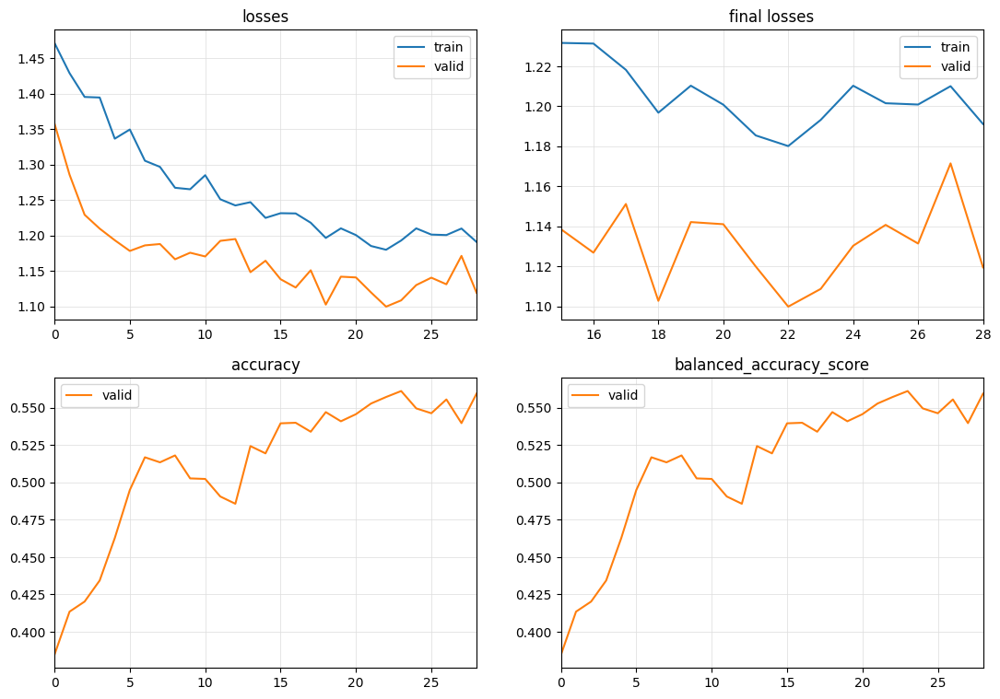

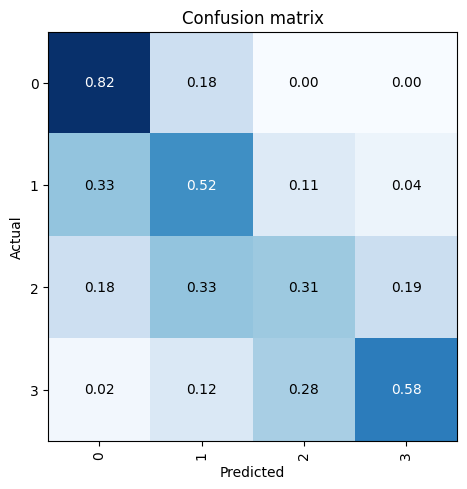

[I 2023-11-03 02:42:54,661] Trial 32 finished with value: 0.56125 and parameters: {'num_days': 14, 'batch_size': 12, 'normalize': True, 'n_heads': 27, 'd_model': 1, 'd_k': 4, 'd_v': 4, 'd_ff': 512, 'tst_dropout': 0.6000000000000001, 'n_layers': 4, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


{'num_days': 28, 'batch_size': 4, 'normalize': True, 'n_heads': 54, 'd_model': 1, 'd_k': 2, 'd_v': 1, 'd_ff': 256, 'tst_dropout': 0.8, 'n_layers': 22, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.435902,1.386370,0.250000,0.250000,27:03
1,1.434586,1.386318,0.250000,0.250000,27:05
2,1.416587,1.386341,0.250000,0.250000,27:05
3,1.430151,1.386313,0.250000,0.250000,27:06
4,1.425132,1.386311,0.250000,0.250000,27:06
5,1.410179,1.386378,0.250000,0.250000,27:05


No improvement since epoch 0: early stopping


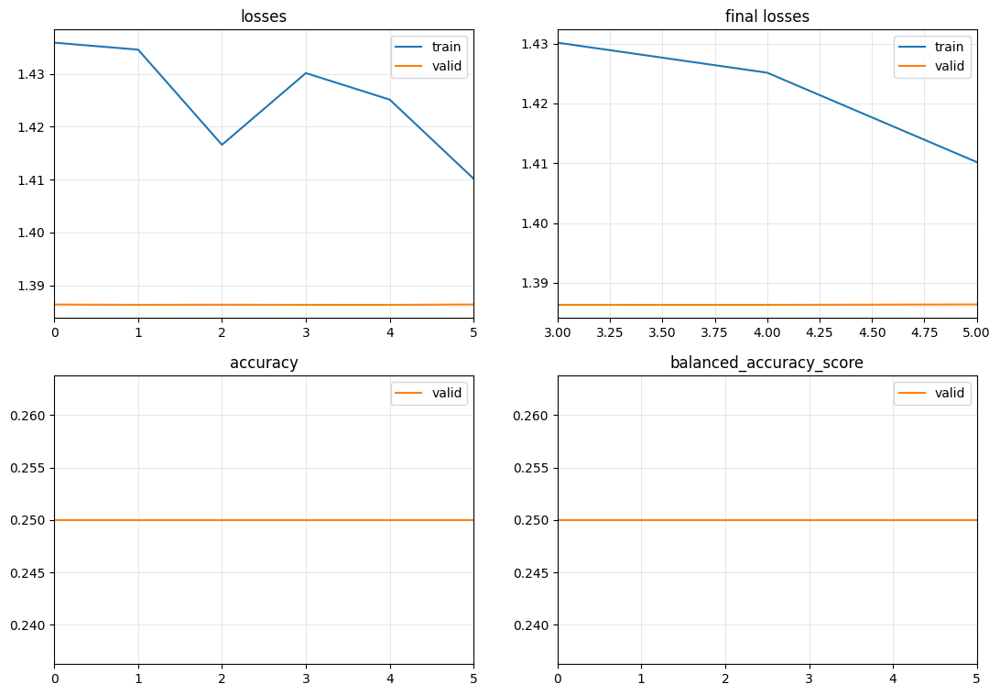

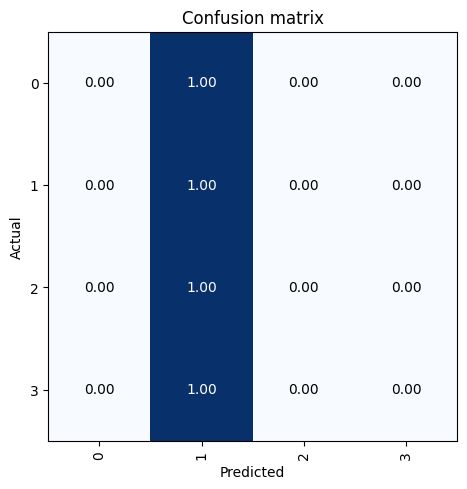

[I 2023-11-03 05:28:12,545] Trial 33 finished with value: 0.25 and parameters: {'num_days': 28, 'batch_size': 4, 'normalize': True, 'n_heads': 54, 'd_model': 1, 'd_k': 2, 'd_v': 1, 'd_ff': 256, 'tst_dropout': 0.8, 'n_layers': 22, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 20 with value: 0.569625.


{'num_days': 21, 'batch_size': 32, 'normalize': True, 'n_heads': 11, 'd_model': 1, 'd_k': 1, 'd_v': 3, 'd_ff': 256, 'tst_dropout': 0.2, 'n_layers': 13, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.395351,1.413546,0.264500,0.264500,02:22
1,1.296638,1.410376,0.327500,0.327500,02:23
2,1.267140,1.387509,0.360125,0.360125,02:23
3,1.224370,1.342629,0.388125,0.388125,02:23
4,1.200629,1.325199,0.423125,0.423125,02:23
5,1.189618,1.311959,0.449000,0.449000,02:23
6,1.146549,1.305181,0.469875,0.469875,02:23
7,1.114097,1.251615,0.491000,0.491000,02:24
8,1.103152,1.260826,0.493250,0.493250,02:24
9,1.088555,1.219612,0.514375,0.514375,02:24


No improvement since epoch 20: early stopping


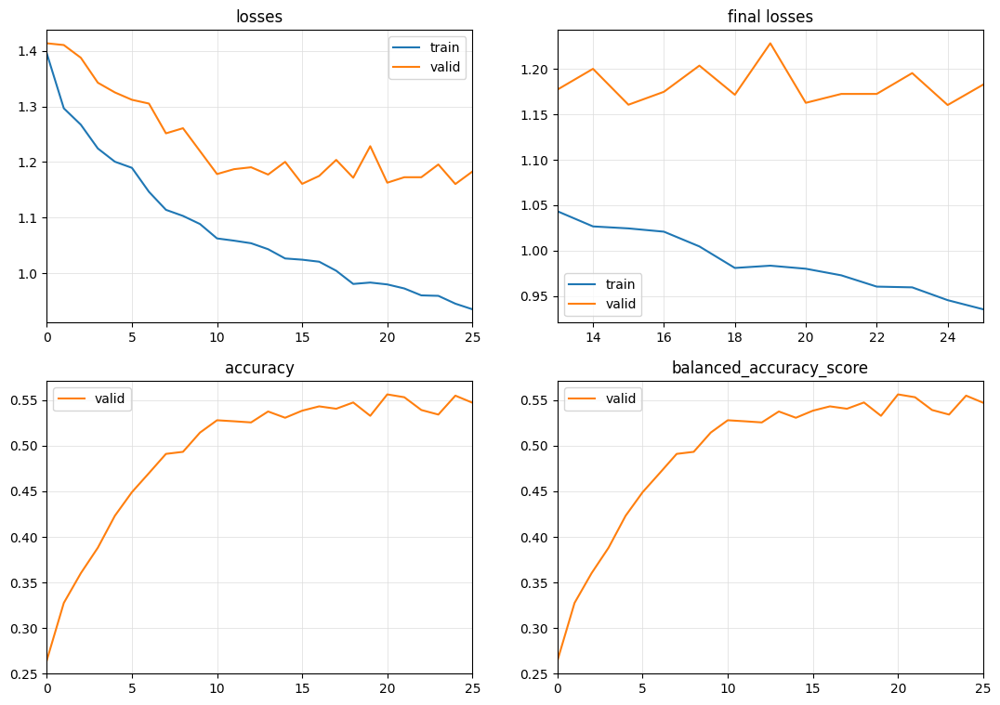

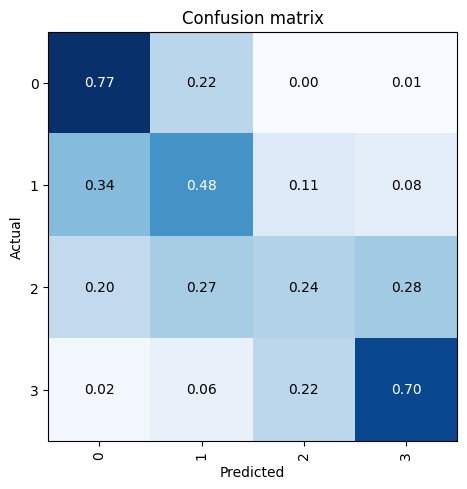

[I 2023-11-03 06:31:20,647] Trial 34 finished with value: 0.5562499999999999 and parameters: {'num_days': 21, 'batch_size': 32, 'normalize': True, 'n_heads': 11, 'd_model': 1, 'd_k': 1, 'd_v': 3, 'd_ff': 256, 'tst_dropout': 0.2, 'n_layers': 13, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


In [24]:
study.optimize(objective, n_trials=200)

{'num_days': 70, 'batch_size': 32, 'normalize': False, 'n_heads': 15, 'd_model': 5, 'd_k': 3, 'd_v': 1, 'd_ff': 384, 'tst_dropout': 0.0, 'n_layers': 1, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.265722,1.205481,0.450125,0.450125,01:08
1,1.193742,1.181769,0.458625,0.458625,01:07
2,1.116080,1.179162,0.472625,0.472625,01:05
3,1.048671,1.178427,0.473625,0.473625,01:03
4,1.005371,1.184600,0.469250,0.469250,01:02
5,0.971818,1.186375,0.471500,0.471500,01:02
6,0.964249,1.198398,0.467875,0.467875,01:02
7,0.933270,1.181921,0.489625,0.489625,01:02
8,0.890002,1.190331,0.482875,0.482875,01:02
9,0.894879,1.193084,0.474375,0.474375,01:02


No improvement since epoch 7: early stopping


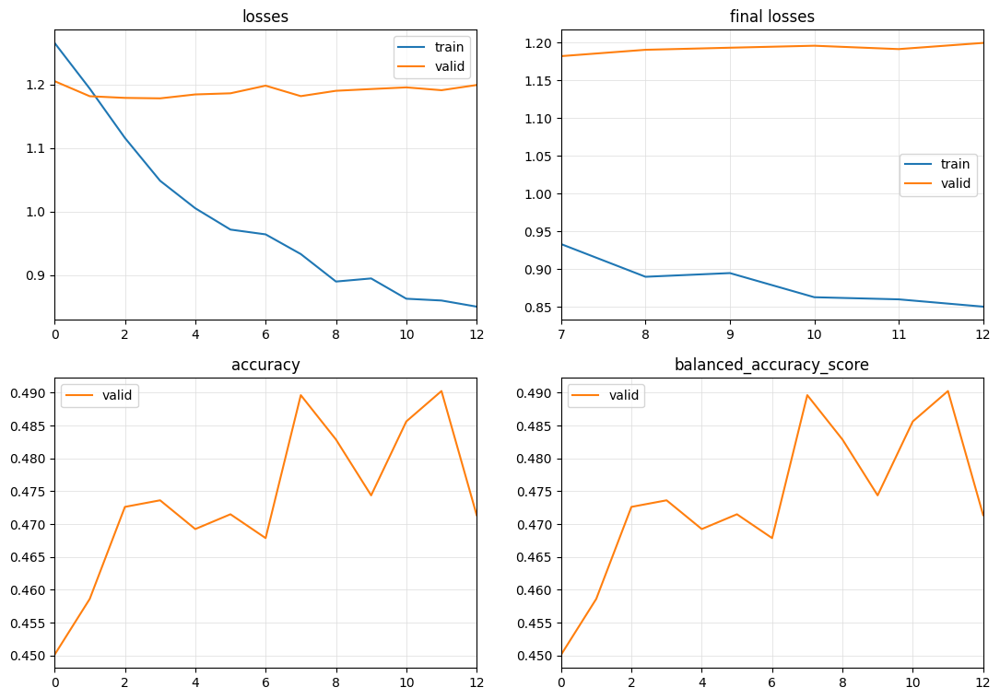

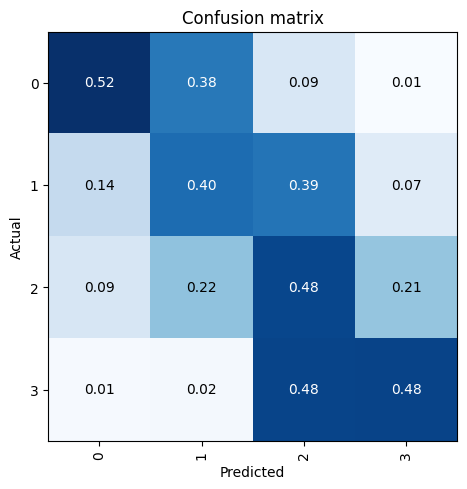

[I 2023-11-03 06:56:12,290] Trial 35 finished with value: 0.49025 and parameters: {'num_days': 70, 'batch_size': 32, 'normalize': False, 'n_heads': 15, 'd_model': 5, 'd_k': 3, 'd_v': 1, 'd_ff': 384, 'tst_dropout': 0.0, 'n_layers': 1, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}. Best is trial 20 with value: 0.569625.


{'num_days': 49, 'batch_size': 24, 'normalize': False, 'n_heads': 44, 'd_model': 3, 'd_k': 1, 'd_v': 5, 'd_ff': 512, 'tst_dropout': 0.0, 'n_layers': 22, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[I 2023-11-03 06:56:32,423] Trial 36 finished with value: 0.0 and parameters: {'num_days': 49, 'batch_size': 24, 'normalize': False, 'n_heads': 44, 'd_model': 3, 'd_k': 1, 'd_v': 5, 'd_ff': 512, 'tst_dropout': 0.0, 'n_layers': 22, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


Runtime error CUDA out of memory. Tried to allocate 620.00 MiB (GPU 0; 11.00 GiB total capacity; 10.09 GiB already allocated; 0 bytes free; 10.21 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
Runtime error CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.



[W 2023-11-03 06:56:49,654] Trial 37 failed with parameters: {'num_days': 84, 'batch_size': 28, 'normalize': True, 'n_heads': 26, 'd_model': 1, 'd_k': 2, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.2, 'n_layers': 1, 'tst_attn_dropout': 0.6000000000000001, 'tst_fc_dropout': 0.2} because of the following error: RuntimeError('CUDA error: out of memory\nCUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.\nFor debugging consider passing CUDA_LAUNCH_BLOCKING=1.\nCompile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.\n').
Traceback (most recent call last):
  File "c:\Users\scott\miniconda3\envs\tsai\lib\site-packages\optuna\study\_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
  File "C:\Users\scott\AppData\Local\Temp\ipykernel_26568\2406734117.py", line 44, in objective
    model = TSTPlus(dls.vars, dls.c, dls.len, d_model=d_model, n_heads=n_heads, d_k=d_k, d_v=d_v, d_ff=d_ff, store_attn=Fal

RuntimeError: CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [25]:
study.optimize(objective, n_trials=150)

{'num_days': 84, 'batch_size': 28, 'normalize': True, 'n_heads': 26, 'd_model': 1, 'd_k': 2, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.2, 'n_layers': 1, 'tst_attn_dropout': 0.6000000000000001, 'tst_fc_dropout': 0.2, 'loss_func': 'None', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.261100,1.245397,0.378500,0.378500,02:12
1,1.127824,1.189140,0.413250,0.413250,02:04
2,1.016740,1.144697,0.434625,0.434625,02:02
3,0.922904,1.104389,0.458125,0.458125,02:01
4,0.852884,1.091497,0.469250,0.469250,02:02
5,0.826183,1.079507,0.495250,0.495250,02:10
6,0.798017,1.084035,0.487375,0.487375,02:08
7,0.745604,1.088680,0.498625,0.498625,02:02
8,0.747638,1.123006,0.494750,0.494750,02:02
9,0.708462,1.144287,0.486625,0.486625,02:02


No improvement since epoch 7: early stopping


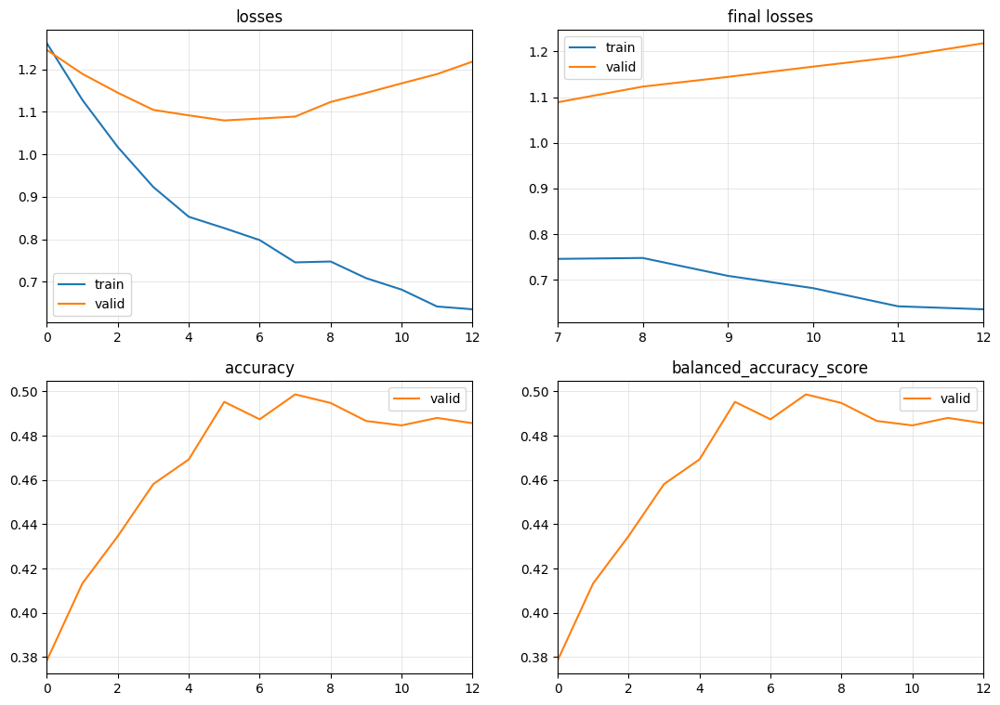

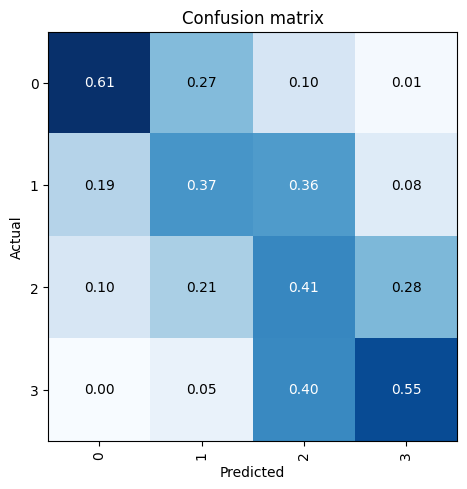

[I 2023-11-03 07:35:36,737] Trial 37 finished with value: 0.498625 and parameters: {'num_days': 84, 'batch_size': 28, 'normalize': True, 'n_heads': 26, 'd_model': 1, 'd_k': 2, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.2, 'n_layers': 1, 'tst_attn_dropout': 0.6000000000000001, 'tst_fc_dropout': 0.2, 'loss_func': 'None', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 20 with value: 0.569625.


{'num_days': 21, 'batch_size': 32, 'normalize': True, 'n_heads': 11, 'd_model': 5, 'd_k': 1, 'd_v': 2, 'd_ff': 256, 'tst_dropout': 0.4, 'n_layers': 16, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.574944,1.348557,0.381000,0.381000,02:59
1,1.475912,1.285130,0.394750,0.394750,02:59
2,1.426990,1.271911,0.406500,0.406500,02:59
3,1.418538,1.254214,0.414750,0.414750,02:59
4,1.394525,1.248190,0.419750,0.419750,02:59
5,1.360523,1.216759,0.435750,0.435750,02:59
6,1.315540,1.182403,0.470500,0.470500,02:59
7,1.251011,1.150467,0.517250,0.517250,03:08
8,1.194714,1.119634,0.551750,0.551750,03:02
9,1.169147,1.121843,0.550000,0.550000,03:00


No improvement since epoch 8: early stopping


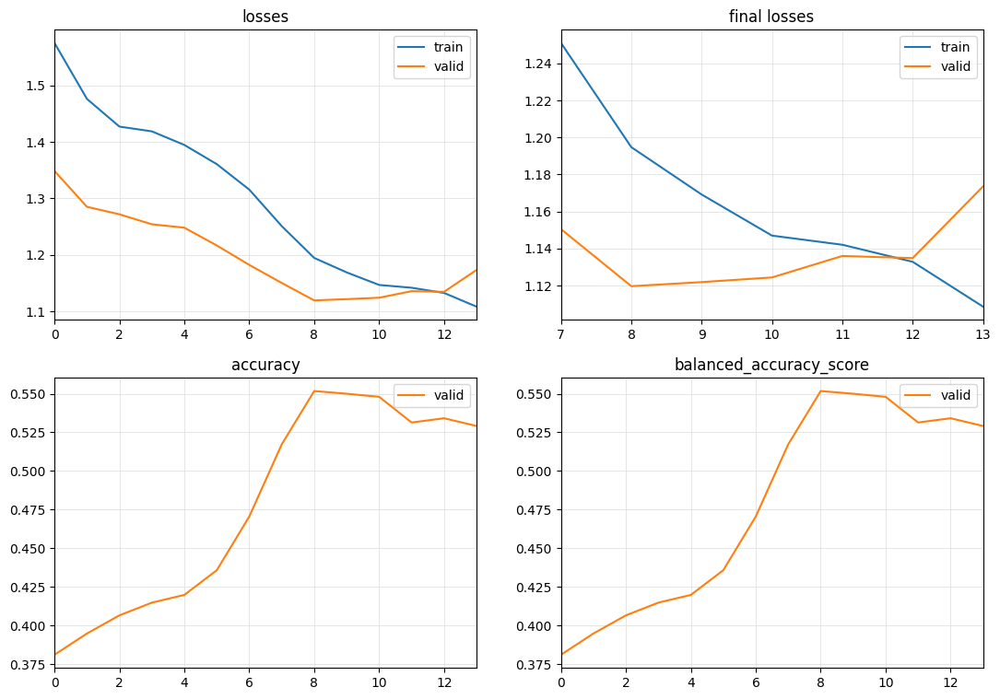

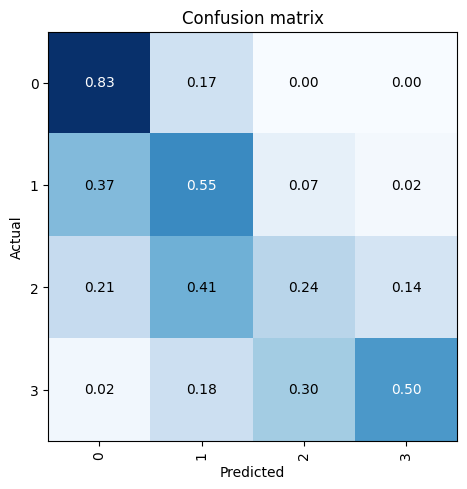

[I 2023-11-03 08:18:19,007] Trial 38 finished with value: 0.55175 and parameters: {'num_days': 21, 'batch_size': 32, 'normalize': True, 'n_heads': 11, 'd_model': 5, 'd_k': 1, 'd_v': 2, 'd_ff': 256, 'tst_dropout': 0.4, 'n_layers': 16, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


{'num_days': 70, 'batch_size': 16, 'normalize': True, 'n_heads': 46, 'd_model': 5, 'd_k': 3, 'd_v': 5, 'd_ff': 128, 'tst_dropout': 0.6000000000000001, 'n_layers': 4, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.318891,1.261275,0.413375,0.413375,14:05
1,1.210917,1.219057,0.453125,0.453125,14:04
2,1.136726,1.179654,0.480500,0.480500,14:05
3,1.089728,1.159455,0.511875,0.511875,14:05
4,1.036796,1.152622,0.516625,0.516625,14:05
5,1.059896,1.144926,0.537750,0.537750,14:05
6,1.031770,1.144762,0.524125,0.524125,14:05
7,0.995866,1.172966,0.528000,0.528000,14:05
8,0.962124,1.162960,0.526875,0.526875,14:05
9,0.996160,1.239853,0.489625,0.489625,14:04


No improvement since epoch 5: early stopping


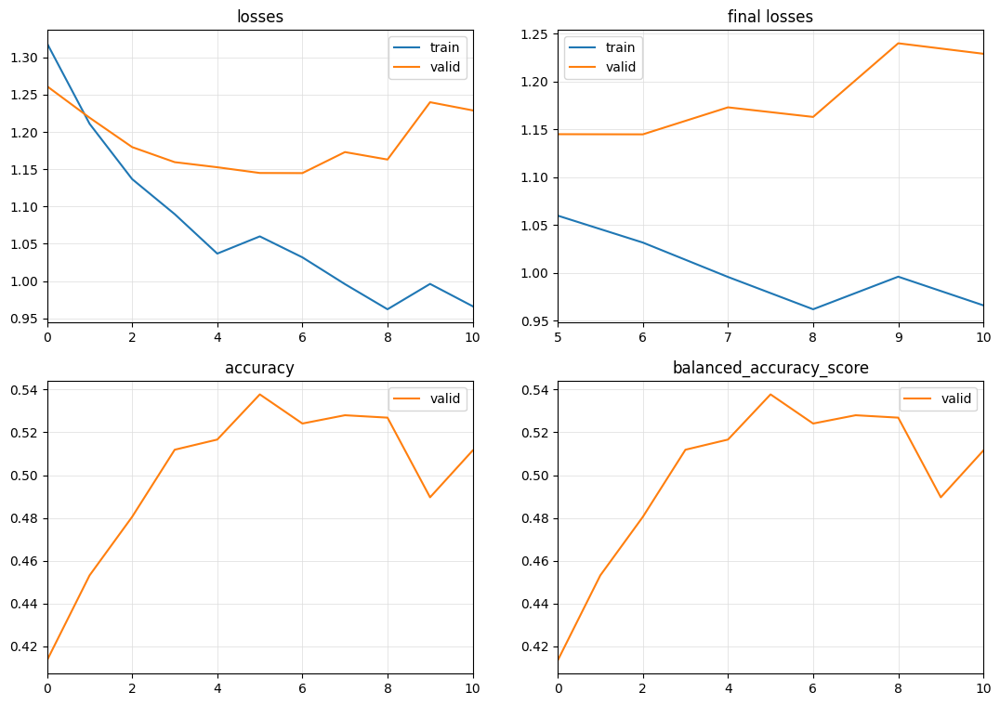

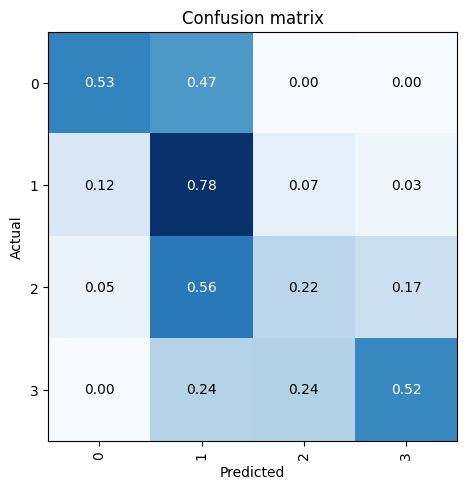

[I 2023-11-03 10:55:21,783] Trial 39 finished with value: 0.53775 and parameters: {'num_days': 70, 'batch_size': 16, 'normalize': True, 'n_heads': 46, 'd_model': 5, 'd_k': 3, 'd_v': 5, 'd_ff': 128, 'tst_dropout': 0.6000000000000001, 'n_layers': 4, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


{'num_days': 28, 'batch_size': 20, 'normalize': True, 'n_heads': 34, 'd_model': 2, 'd_k': 1, 'd_v': 3, 'd_ff': 256, 'tst_dropout': 0.0, 'n_layers': 13, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.2, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.162831,1.086970,0.493500,0.493500,07:54
1,1.080812,1.057963,0.511250,0.511250,07:55
2,1.083092,1.081222,0.505375,0.505375,07:53
3,1.023875,1.061169,0.521250,0.521250,07:53
4,1.018634,1.085420,0.517125,0.517125,07:54
5,1.004195,1.089833,0.503875,0.503875,07:53
6,1.000674,1.125275,0.489750,0.489750,07:53
7,0.978171,1.093484,0.489125,0.489125,07:55
8,0.948205,1.102175,0.483125,0.483125,07:55


No improvement since epoch 3: early stopping


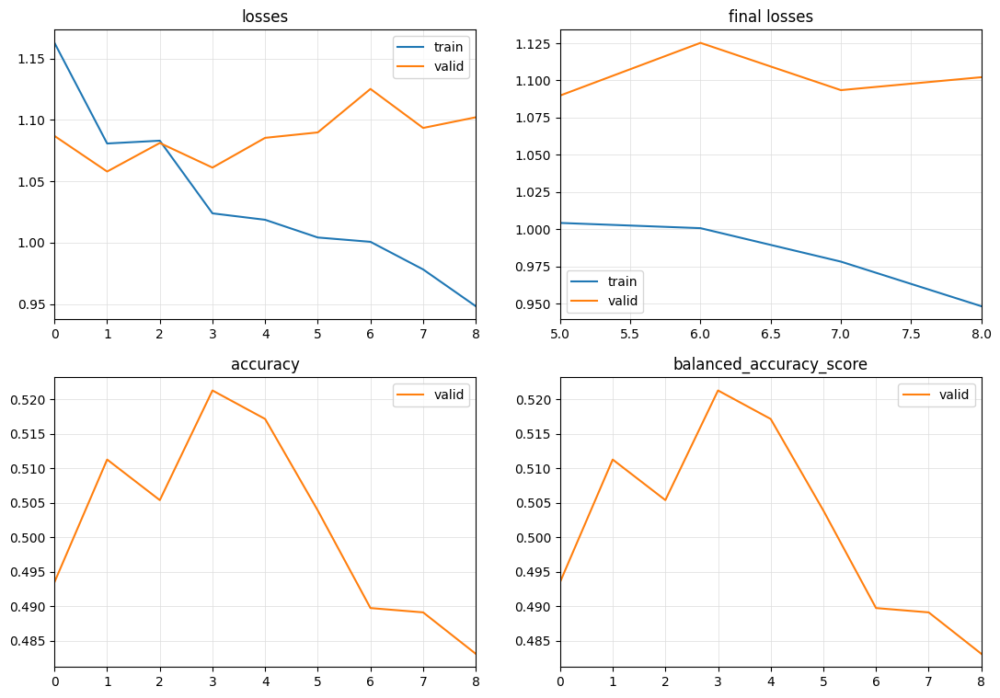

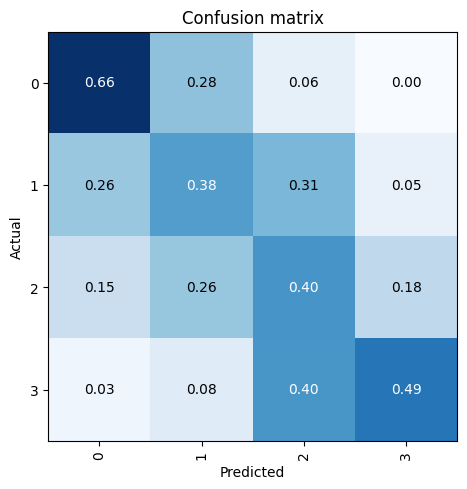

[I 2023-11-03 12:07:46,301] Trial 40 finished with value: 0.52125 and parameters: {'num_days': 28, 'batch_size': 20, 'normalize': True, 'n_heads': 34, 'd_model': 2, 'd_k': 1, 'd_v': 3, 'd_ff': 256, 'tst_dropout': 0.0, 'n_layers': 13, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.2, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


{'num_days': 35, 'batch_size': 8, 'normalize': True, 'n_heads': 10, 'd_model': 4, 'd_k': 3, 'd_v': 3, 'd_ff': 256, 'tst_dropout': 0.6000000000000001, 'n_layers': 25, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.430048,1.386350,0.250625,0.250625,14:29
1,1.432337,1.386306,0.250000,0.250000,14:30
2,1.451089,1.386275,0.253875,0.253875,14:30
3,1.425052,1.386265,0.240000,0.240000,14:31
4,1.432082,1.386287,0.259625,0.259625,14:30
5,1.434403,1.386264,0.250000,0.250000,14:31
6,1.423389,1.386277,0.250000,0.250000,14:32
7,1.428529,1.386175,0.250000,0.250000,14:31
8,1.419084,1.386145,0.292500,0.292500,14:54
9,1.414758,1.386108,0.250000,0.250000,14:37


No improvement since epoch 8: early stopping


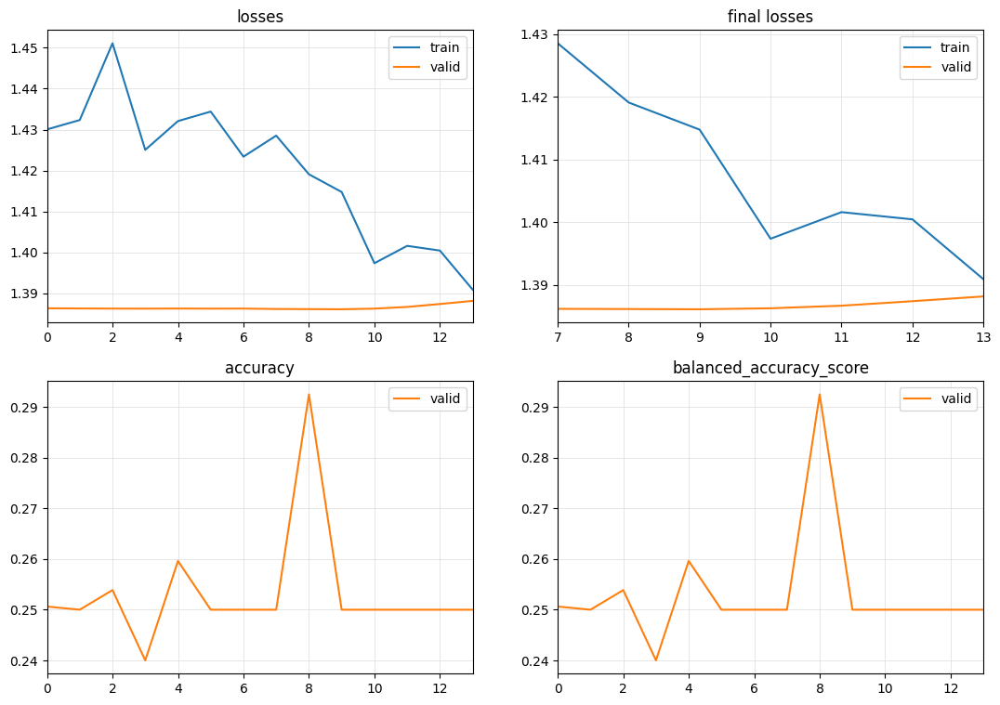

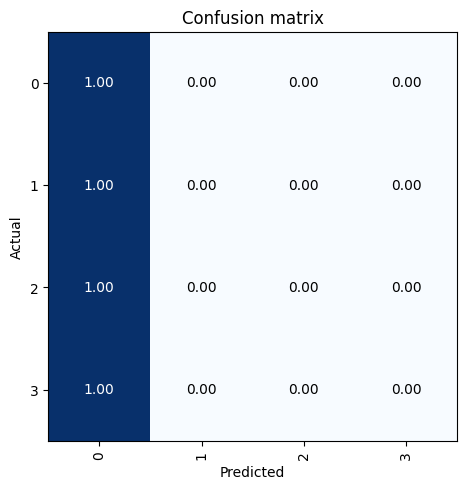

[I 2023-11-03 15:33:31,120] Trial 41 finished with value: 0.2925 and parameters: {'num_days': 35, 'batch_size': 8, 'normalize': True, 'n_heads': 10, 'd_model': 4, 'd_k': 3, 'd_v': 3, 'd_ff': 256, 'tst_dropout': 0.6000000000000001, 'n_layers': 25, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


{'num_days': 28, 'batch_size': 24, 'normalize': False, 'n_heads': 37, 'd_model': 3, 'd_k': 5, 'd_v': 4, 'd_ff': 384, 'tst_dropout': 0.4, 'n_layers': 7, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.2, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.333693,1.242179,0.469375,0.469375,04:52
1,1.278486,1.162683,0.468750,0.468750,04:53
2,1.258785,1.131817,0.477250,0.477250,04:52
3,1.227245,1.093037,0.493000,0.493000,04:52
4,1.211545,1.080057,0.508875,0.508875,04:52
5,1.213197,1.053810,0.515875,0.515875,04:52
6,1.193377,1.050552,0.512750,0.512750,04:52
7,1.169908,1.042152,0.519375,0.519375,04:53
8,1.154582,1.039575,0.519125,0.519125,04:52
9,1.144676,1.030779,0.532500,0.532500,04:53


No improvement since epoch 11: early stopping


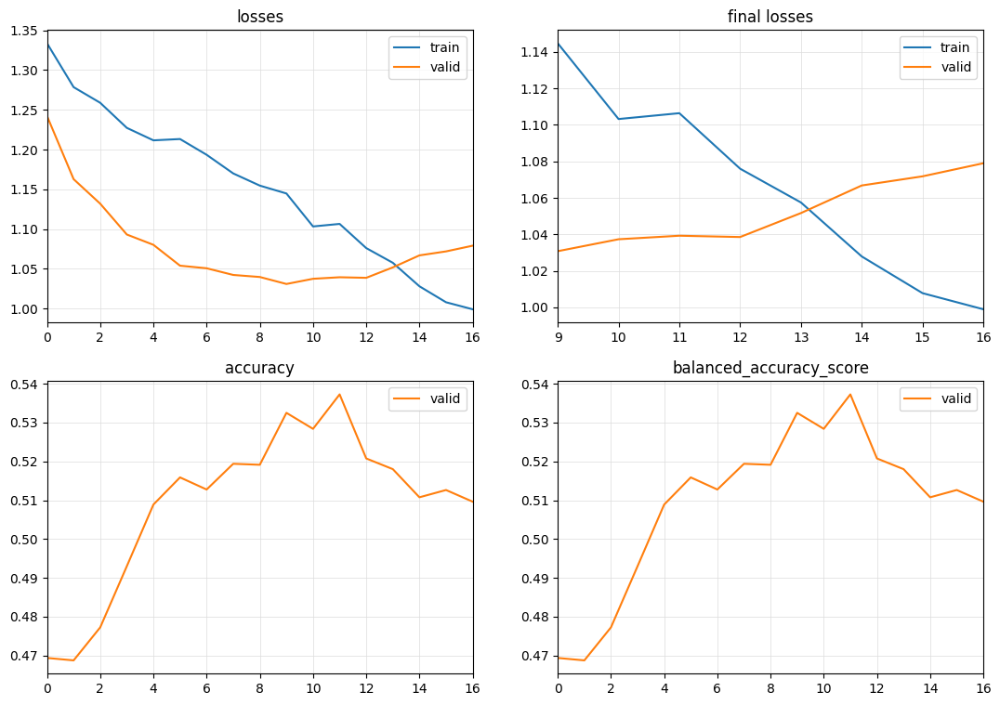

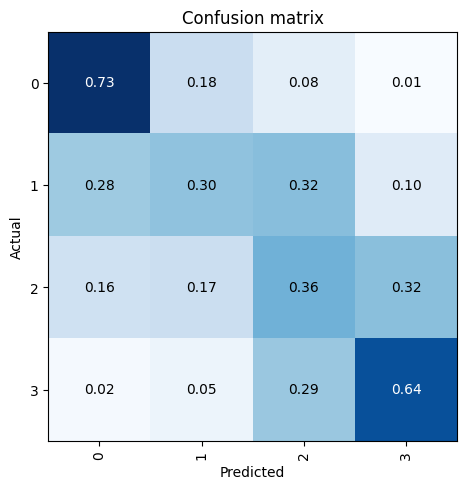

[I 2023-11-03 16:59:50,040] Trial 42 finished with value: 0.53725 and parameters: {'num_days': 28, 'batch_size': 24, 'normalize': False, 'n_heads': 37, 'd_model': 3, 'd_k': 5, 'd_v': 4, 'd_ff': 384, 'tst_dropout': 0.4, 'n_layers': 7, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.2, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 20 with value: 0.569625.


{'num_days': 14, 'batch_size': 4, 'normalize': False, 'n_heads': 11, 'd_model': 4, 'd_k': 2, 'd_v': 3, 'd_ff': 128, 'tst_dropout': 0.2, 'n_layers': 19, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.296776,1.178430,0.484625,0.484625,21:03
1,1.290259,1.148783,0.495500,0.495500,21:10
2,1.245413,1.115881,0.530625,0.530625,21:08
3,1.256727,1.120738,0.514500,0.514500,21:10
4,1.229536,1.087057,0.550000,0.550000,21:15
5,1.240227,1.086550,0.559750,0.559750,21:14
6,1.226866,1.078677,0.555500,0.555500,21:09
7,1.183241,1.078659,0.553750,0.553750,21:23
8,1.187817,1.082491,0.559625,0.559625,21:13
9,1.145305,1.088715,0.559750,0.559750,21:36


No improvement since epoch 5: early stopping


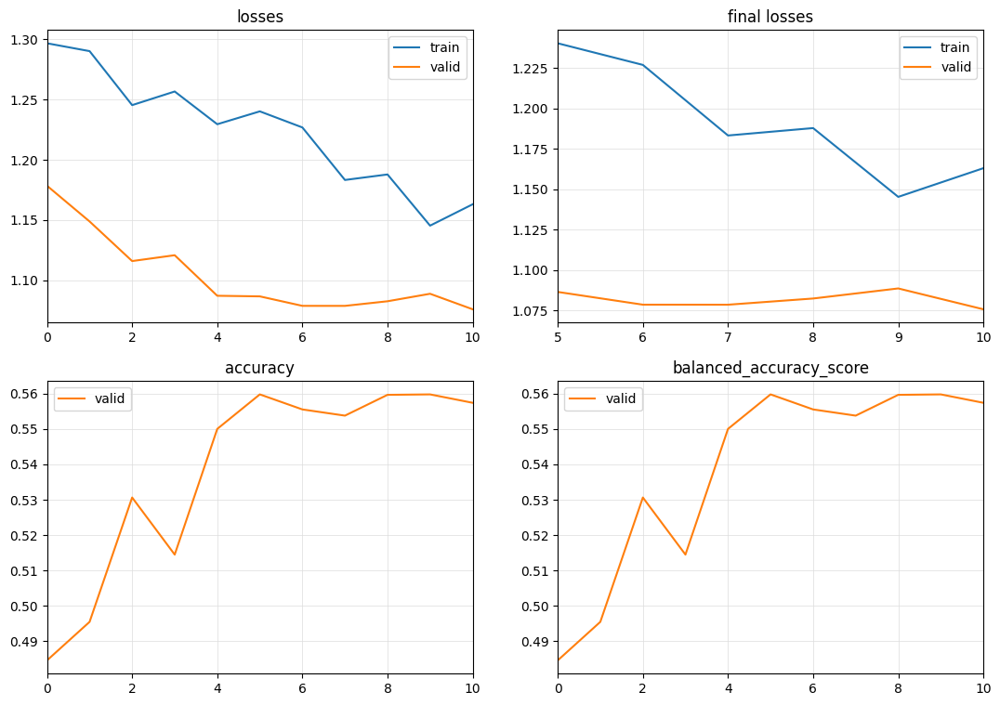

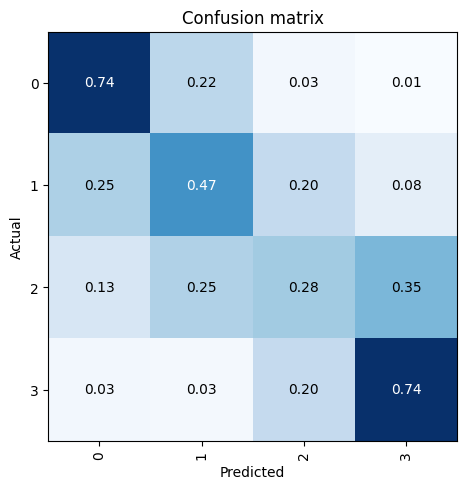

[I 2023-11-03 20:55:36,772] Trial 43 finished with value: 0.5597500000000001 and parameters: {'num_days': 14, 'batch_size': 4, 'normalize': False, 'n_heads': 11, 'd_model': 4, 'd_k': 2, 'd_v': 3, 'd_ff': 128, 'tst_dropout': 0.2, 'n_layers': 19, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


{'num_days': 70, 'batch_size': 4, 'normalize': True, 'n_heads': 39, 'd_model': 5, 'd_k': 4, 'd_v': 1, 'd_ff': 512, 'tst_dropout': 0.2, 'n_layers': 7, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.006130,1.133534,0.527875,0.527875,20:59
1,0.905525,1.212211,0.495250,0.495250,20:44
2,0.807332,1.240137,0.475250,0.475250,20:45
3,0.819082,1.262801,0.461250,0.461250,20:44
4,0.768478,1.356536,0.440000,0.440000,20:44
5,0.786673,1.560671,0.398125,0.398125,20:44


No improvement since epoch 0: early stopping


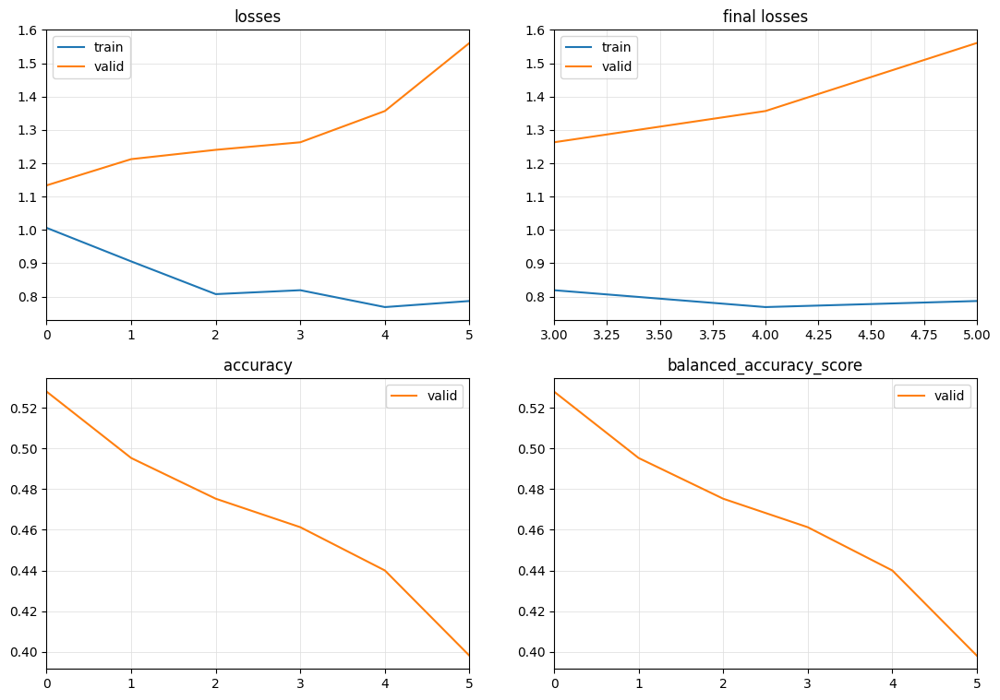

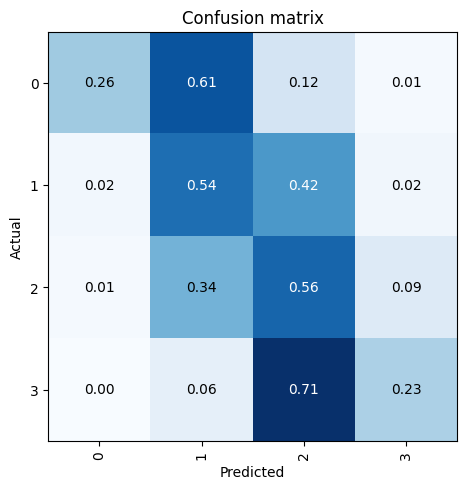

[I 2023-11-03 23:05:38,854] Trial 44 finished with value: 0.527875 and parameters: {'num_days': 70, 'batch_size': 4, 'normalize': True, 'n_heads': 39, 'd_model': 5, 'd_k': 4, 'd_v': 1, 'd_ff': 512, 'tst_dropout': 0.2, 'n_layers': 7, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 20 with value: 0.569625.


{'num_days': 28, 'batch_size': 16, 'normalize': True, 'n_heads': 31, 'd_model': 5, 'd_k': 3, 'd_v': 1, 'd_ff': 512, 'tst_dropout': 0.6000000000000001, 'n_layers': 22, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.632520,1.379264,0.260125,0.260125,12:14
1,1.570108,1.349776,0.334125,0.334125,12:13
2,1.460767,1.276605,0.412875,0.412875,12:13
3,1.431309,1.248855,0.440250,0.440250,12:14
4,1.395230,1.237682,0.446125,0.446125,12:13
5,1.399489,1.234977,0.444375,0.444375,12:14
6,1.383602,1.239612,0.456250,0.456250,12:15
7,1.370136,1.241971,0.422125,0.422125,12:14
8,1.334364,1.235638,0.454875,0.454875,12:14
9,1.320955,1.239912,0.443375,0.443375,12:14


No improvement since epoch 6: early stopping


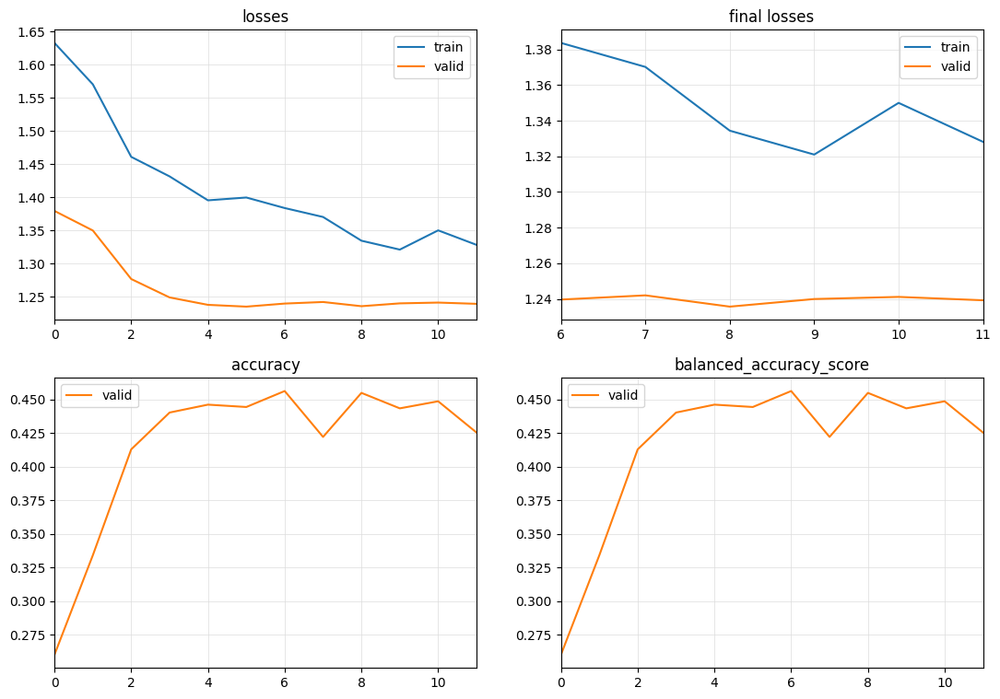

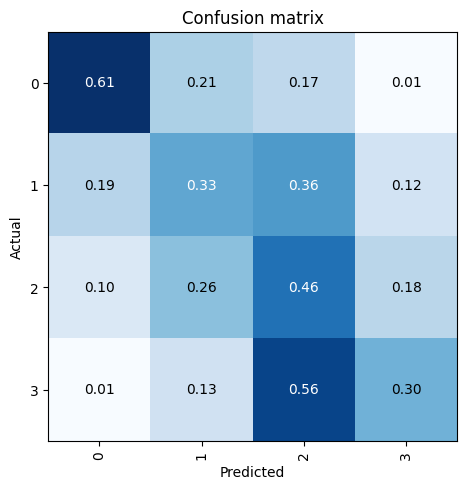

[I 2023-11-04 01:34:06,738] Trial 45 finished with value: 0.45625 and parameters: {'num_days': 28, 'batch_size': 16, 'normalize': True, 'n_heads': 31, 'd_model': 5, 'd_k': 3, 'd_v': 1, 'd_ff': 512, 'tst_dropout': 0.6000000000000001, 'n_layers': 22, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


{'num_days': 14, 'batch_size': 20, 'normalize': False, 'n_heads': 34, 'd_model': 3, 'd_k': 5, 'd_v': 4, 'd_ff': 512, 'tst_dropout': 0.8, 'n_layers': 4, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.455955,1.386389,0.250000,0.250000,01:20
1,1.443601,1.386398,0.249500,0.249500,01:21
2,1.478119,1.386431,0.250000,0.250000,01:21
3,1.437753,1.386421,0.250000,0.250000,01:21
4,1.439390,1.386444,0.250000,0.250000,01:20
5,1.445581,1.386474,0.250000,0.250000,01:21


No improvement since epoch 0: early stopping


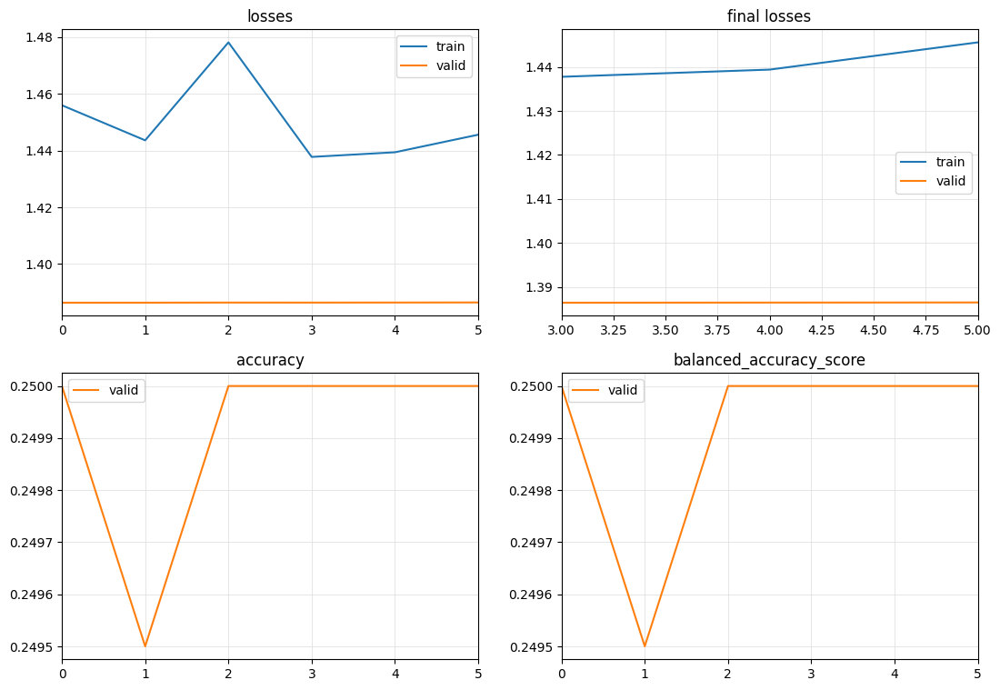

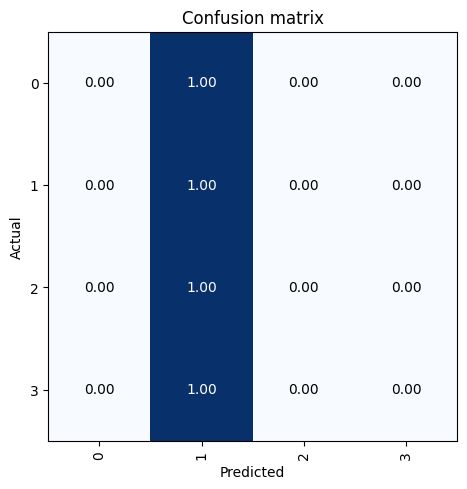

[I 2023-11-04 01:42:40,577] Trial 46 finished with value: 0.25 and parameters: {'num_days': 14, 'batch_size': 20, 'normalize': False, 'n_heads': 34, 'd_model': 3, 'd_k': 5, 'd_v': 4, 'd_ff': 512, 'tst_dropout': 0.8, 'n_layers': 4, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


{'num_days': 49, 'batch_size': 12, 'normalize': True, 'n_heads': 3, 'd_model': 5, 'd_k': 5, 'd_v': 3, 'd_ff': 128, 'tst_dropout': 0.8, 'n_layers': 16, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'None', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.526773,1.386364,0.250000,0.250000,06:00
1,1.514275,1.386359,0.250000,0.250000,05:59
2,1.491221,1.386349,0.250000,0.250000,06:03
3,1.464736,1.386349,0.250000,0.250000,06:00
4,1.473566,1.386346,0.250000,0.250000,05:59
5,1.462747,1.386338,0.250000,0.250000,06:01


No improvement since epoch 0: early stopping


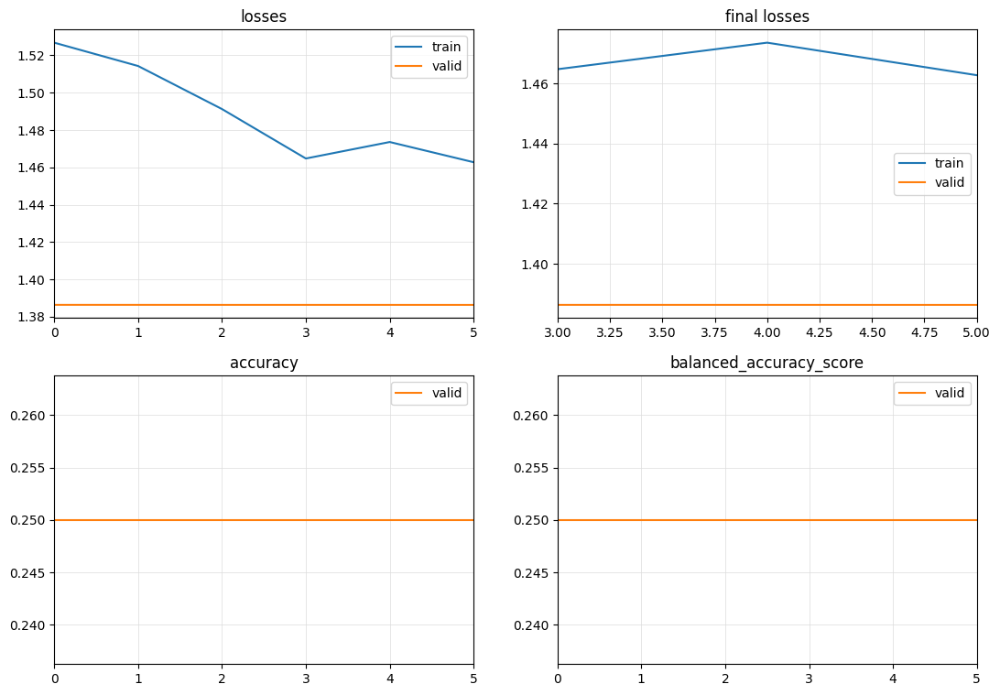

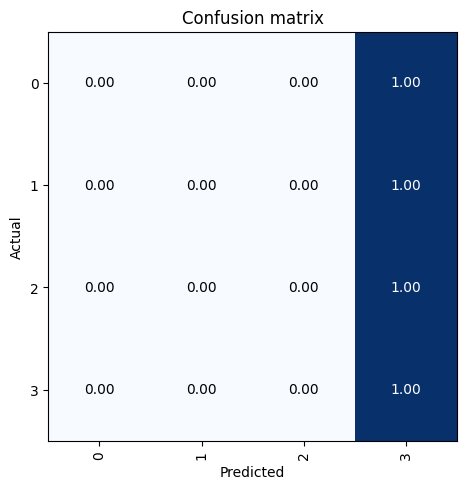

[I 2023-11-04 02:19:36,729] Trial 47 finished with value: 0.25 and parameters: {'num_days': 49, 'batch_size': 12, 'normalize': True, 'n_heads': 3, 'd_model': 5, 'd_k': 5, 'd_v': 3, 'd_ff': 128, 'tst_dropout': 0.8, 'n_layers': 16, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'None', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}. Best is trial 20 with value: 0.569625.


{'num_days': 14, 'batch_size': 24, 'normalize': False, 'n_heads': 26, 'd_model': 2, 'd_k': 1, 'd_v': 4, 'd_ff': 512, 'tst_dropout': 0.0, 'n_layers': 16, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.451503,1.360501,0.402750,0.402750,03:25
1,1.400422,1.320570,0.437625,0.437625,03:26
2,1.351054,1.305223,0.450875,0.450875,03:26
3,1.293882,1.228324,0.451750,0.451750,03:26
4,1.254594,1.212038,0.484250,0.484250,03:27
5,1.227144,1.176546,0.490625,0.490625,03:27
6,1.224438,1.176740,0.498125,0.498125,03:27
7,1.202094,1.146684,0.511000,0.511000,03:27
8,1.183355,1.123484,0.525750,0.525750,03:26
9,1.174834,1.129858,0.517250,0.517250,03:27


No improvement since epoch 22: early stopping


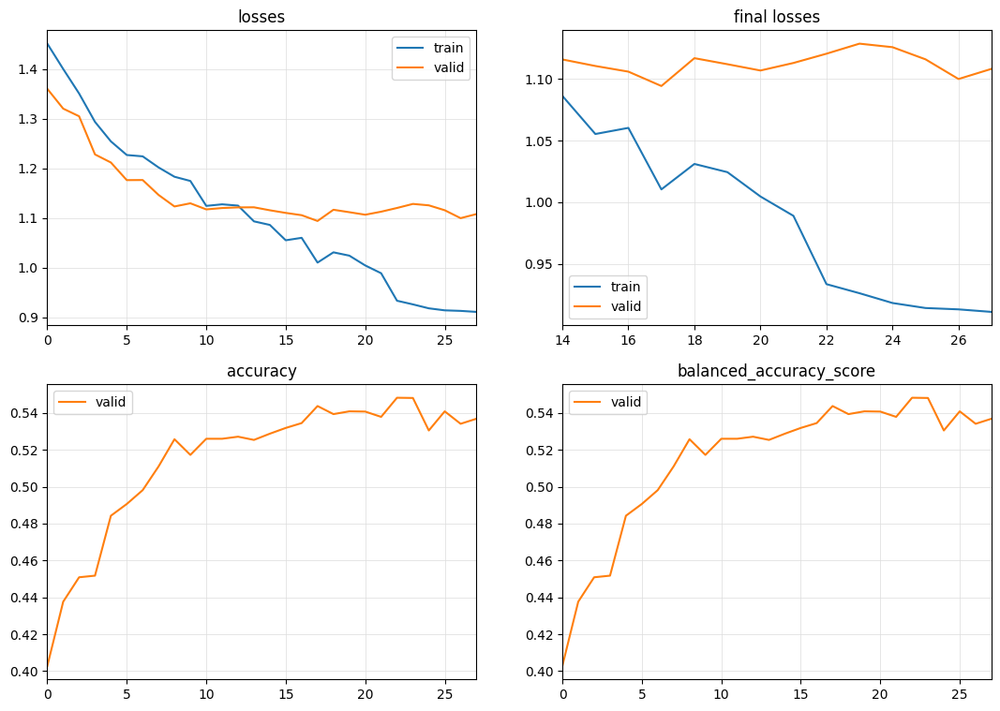

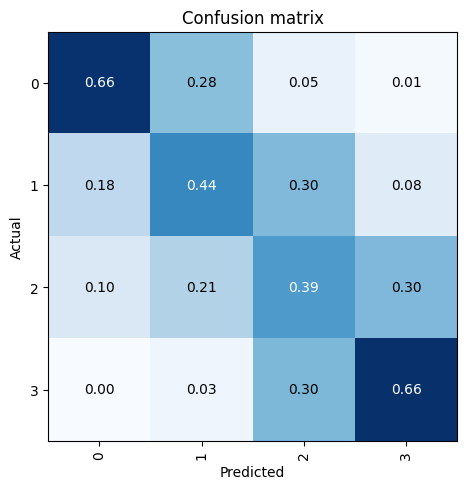

[I 2023-11-04 03:59:17,021] Trial 48 finished with value: 0.5482500000000001 and parameters: {'num_days': 14, 'batch_size': 24, 'normalize': False, 'n_heads': 26, 'd_model': 2, 'd_k': 1, 'd_v': 4, 'd_ff': 512, 'tst_dropout': 0.0, 'n_layers': 16, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 20 with value: 0.569625.


{'num_days': 84, 'batch_size': 32, 'normalize': False, 'n_heads': 36, 'd_model': 5, 'd_k': 3, 'd_v': 1, 'd_ff': 512, 'tst_dropout': 0.8, 'n_layers': 1, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.237536,1.258050,0.449375,0.449375,02:21
1,1.133427,1.215459,0.451125,0.451125,02:21
2,1.075602,1.193655,0.445625,0.445625,02:20
3,1.024376,1.189445,0.444625,0.444625,02:20
4,0.993352,1.188912,0.450125,0.450125,02:21
5,0.977915,1.190559,0.451250,0.451250,02:21
6,0.953212,1.202736,0.449750,0.449750,02:21


No improvement since epoch 1: early stopping


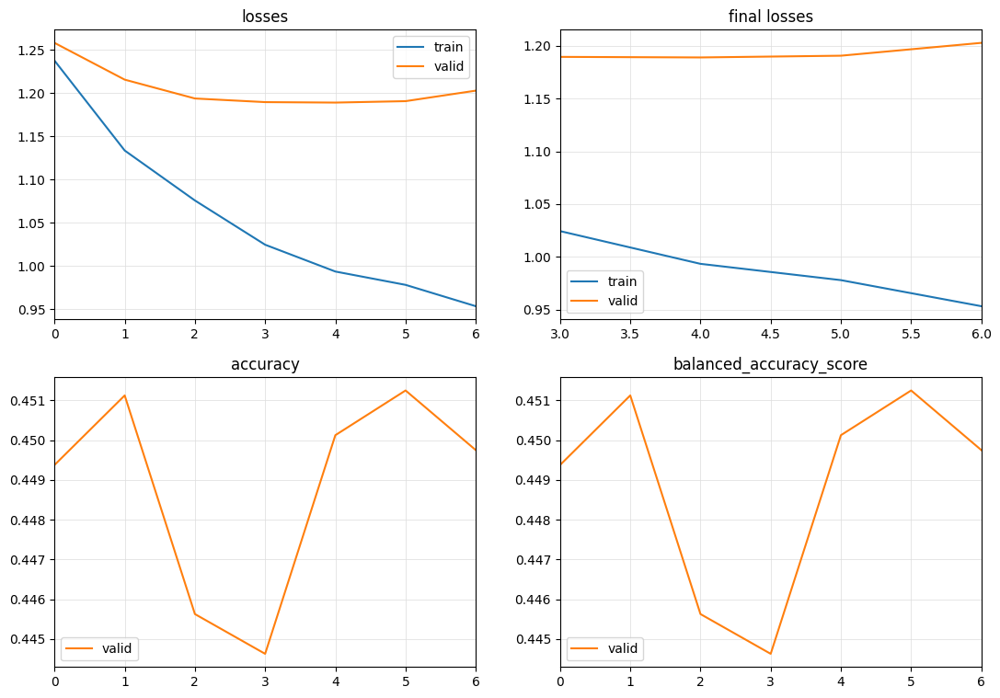

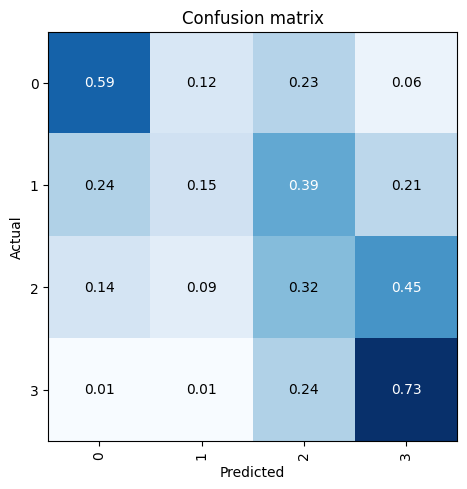

[I 2023-11-04 04:16:22,260] Trial 49 finished with value: 0.45125000000000004 and parameters: {'num_days': 84, 'batch_size': 32, 'normalize': False, 'n_heads': 36, 'd_model': 5, 'd_k': 3, 'd_v': 1, 'd_ff': 512, 'tst_dropout': 0.8, 'n_layers': 1, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}. Best is trial 20 with value: 0.569625.


{'num_days': 14, 'batch_size': 4, 'normalize': True, 'n_heads': 46, 'd_model': 3, 'd_k': 2, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.6000000000000001, 'n_layers': 25, 'tst_attn_dropout': 0.6000000000000001, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.389236,1.416146,0.250000,0.250000,25:49
1,1.312281,1.571371,0.257500,0.257500,25:55
2,1.169123,1.636545,0.262750,0.262750,26:04
3,1.212862,1.786802,0.250875,0.250875,26:00
4,1.114001,1.625683,0.281000,0.281000,25:57
5,1.076990,1.438037,0.338500,0.338500,25:54
6,1.071293,1.182148,0.480125,0.480125,26:09
7,1.061617,1.086690,0.555375,0.555375,25:58
8,1.017806,1.081752,0.553875,0.553875,25:51
9,1.010388,1.066205,0.574500,0.574500,26:09


No improvement since epoch 9: early stopping


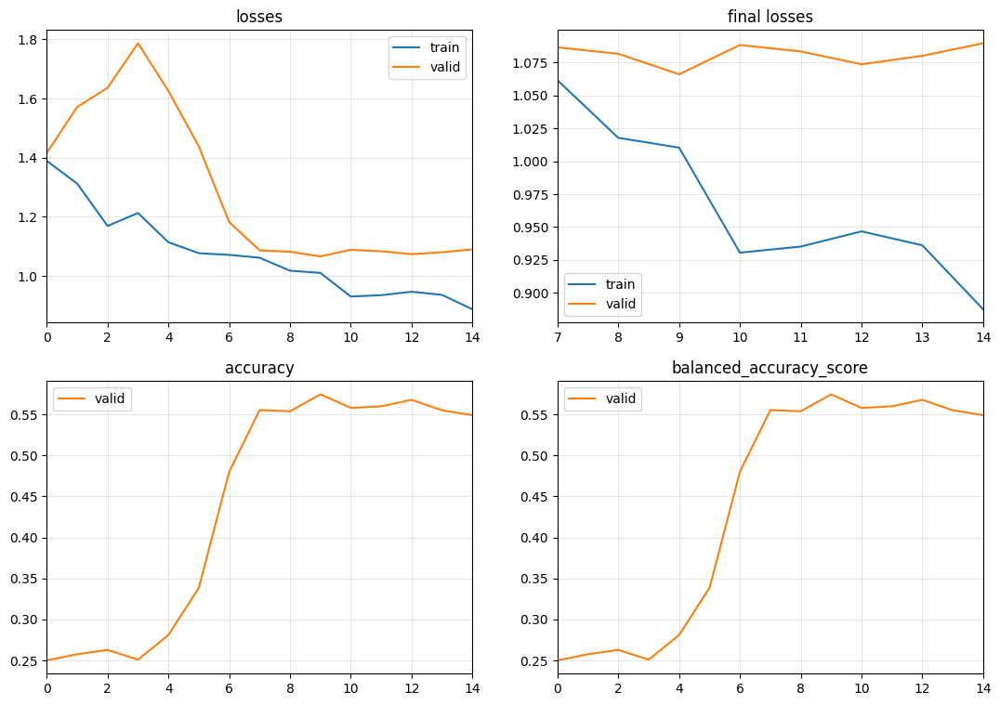

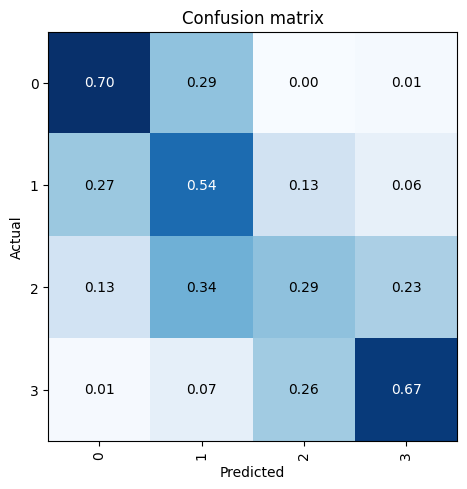

[I 2023-11-04 10:49:10,138] Trial 50 finished with value: 0.5745 and parameters: {'num_days': 14, 'batch_size': 4, 'normalize': True, 'n_heads': 46, 'd_model': 3, 'd_k': 2, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.6000000000000001, 'n_layers': 25, 'tst_attn_dropout': 0.6000000000000001, 'tst_fc_dropout': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


{'num_days': 21, 'batch_size': 16, 'normalize': False, 'n_heads': 14, 'd_model': 4, 'd_k': 4, 'd_v': 5, 'd_ff': 256, 'tst_dropout': 0.4, 'n_layers': 4, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.207459,1.200142,0.457500,0.457500,01:32
1,1.141483,1.174748,0.480500,0.480500,01:31
2,1.070625,1.143622,0.514500,0.514500,01:32
3,1.072289,1.135870,0.521875,0.521875,01:32
4,1.087080,1.121305,0.526500,0.526500,01:32
5,1.037645,1.144029,0.534375,0.534375,01:32
6,1.020813,1.129369,0.533625,0.533625,01:32
7,1.008092,1.119606,0.540250,0.540250,01:32
8,1.003528,1.110378,0.549125,0.549125,01:32
9,0.972211,1.114576,0.542875,0.542875,01:32


No improvement since epoch 8: early stopping


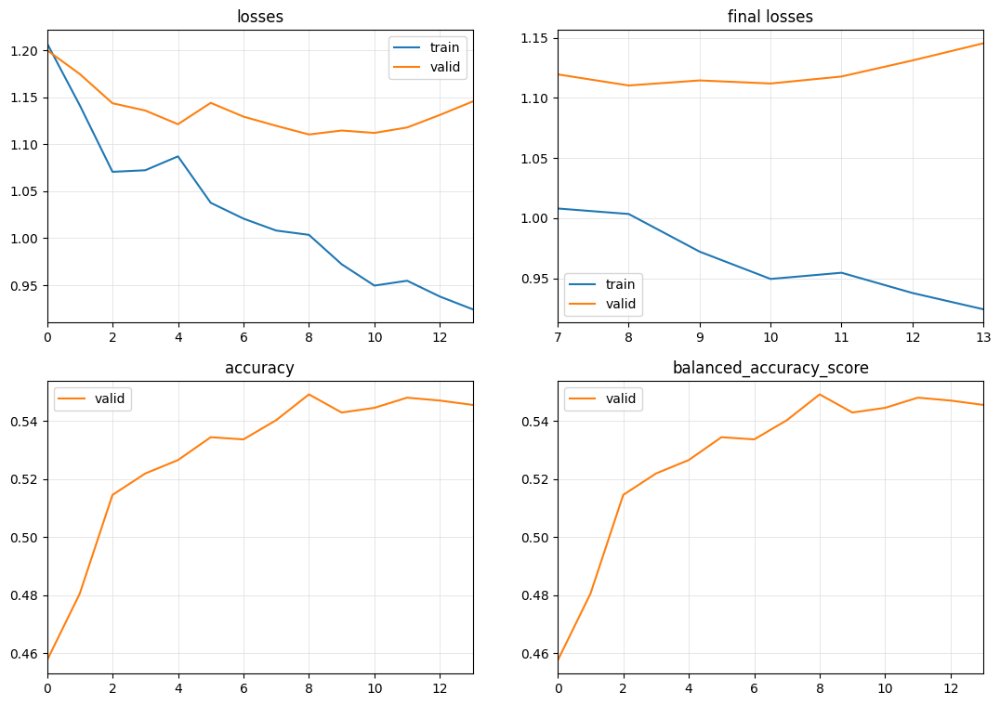

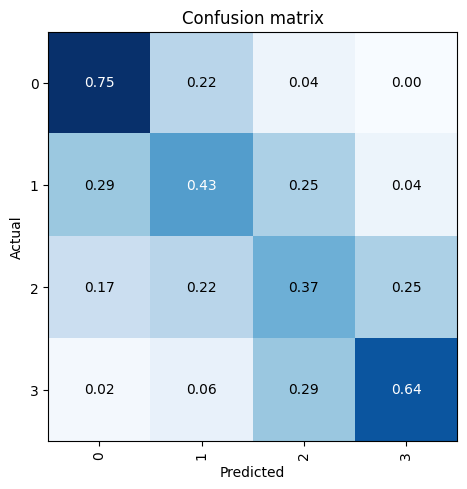

[I 2023-11-04 11:11:15,046] Trial 51 finished with value: 0.549125 and parameters: {'num_days': 21, 'batch_size': 16, 'normalize': False, 'n_heads': 14, 'd_model': 4, 'd_k': 4, 'd_v': 5, 'd_ff': 256, 'tst_dropout': 0.4, 'n_layers': 4, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 50 with value: 0.5745.


{'num_days': 21, 'batch_size': 12, 'normalize': False, 'n_heads': 28, 'd_model': 2, 'd_k': 1, 'd_v': 4, 'd_ff': 384, 'tst_dropout': 0.8, 'n_layers': 13, 'tst_attn_dropout': 0.6000000000000001, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.484966,1.386358,0.250000,0.250000,05:58
1,1.441056,1.386353,0.250000,0.250000,05:59
2,1.453068,1.386353,0.250000,0.250000,05:58
3,1.458775,1.386388,0.250000,0.250000,05:59
4,1.438158,1.386391,0.250000,0.250000,05:59
5,1.451737,1.386408,0.250000,0.250000,05:59


No improvement since epoch 0: early stopping


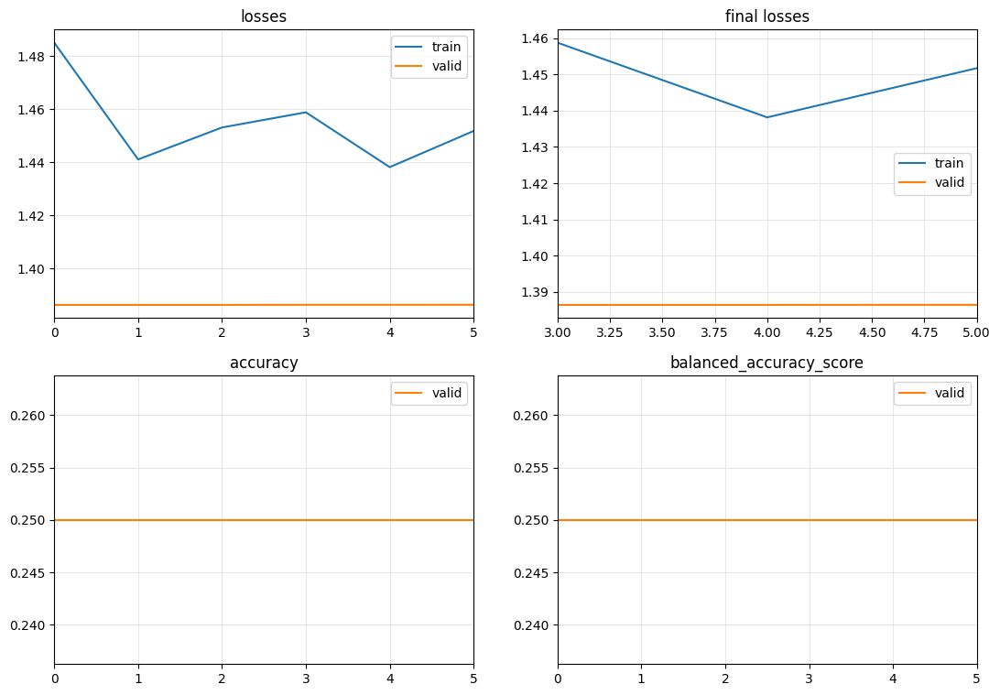

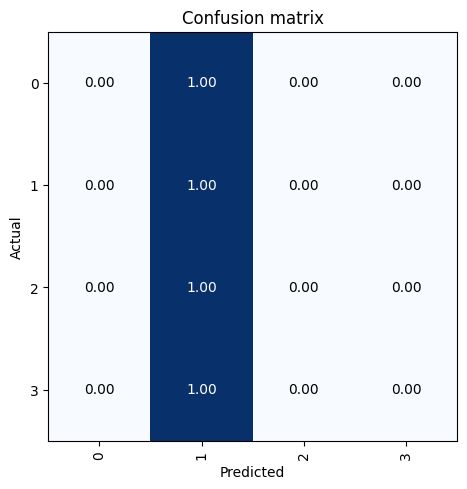

[I 2023-11-04 11:48:04,857] Trial 52 finished with value: 0.25 and parameters: {'num_days': 21, 'batch_size': 12, 'normalize': False, 'n_heads': 28, 'd_model': 2, 'd_k': 1, 'd_v': 4, 'd_ff': 384, 'tst_dropout': 0.8, 'n_layers': 13, 'tst_attn_dropout': 0.6000000000000001, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


{'num_days': 56, 'batch_size': 28, 'normalize': False, 'n_heads': 3, 'd_model': 4, 'd_k': 2, 'd_v': 3, 'd_ff': 256, 'tst_dropout': 0.6000000000000001, 'n_layers': 10, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.431492,1.386345,0.250000,0.250000,02:59
1,1.429825,1.386362,0.250000,0.250000,02:59
2,1.427765,1.386360,0.250000,0.250000,02:59
3,1.440982,1.386340,0.250000,0.250000,02:59
4,1.430262,1.386344,0.250000,0.250000,02:59
5,1.429664,1.386365,0.250000,0.250000,02:59


No improvement since epoch 0: early stopping


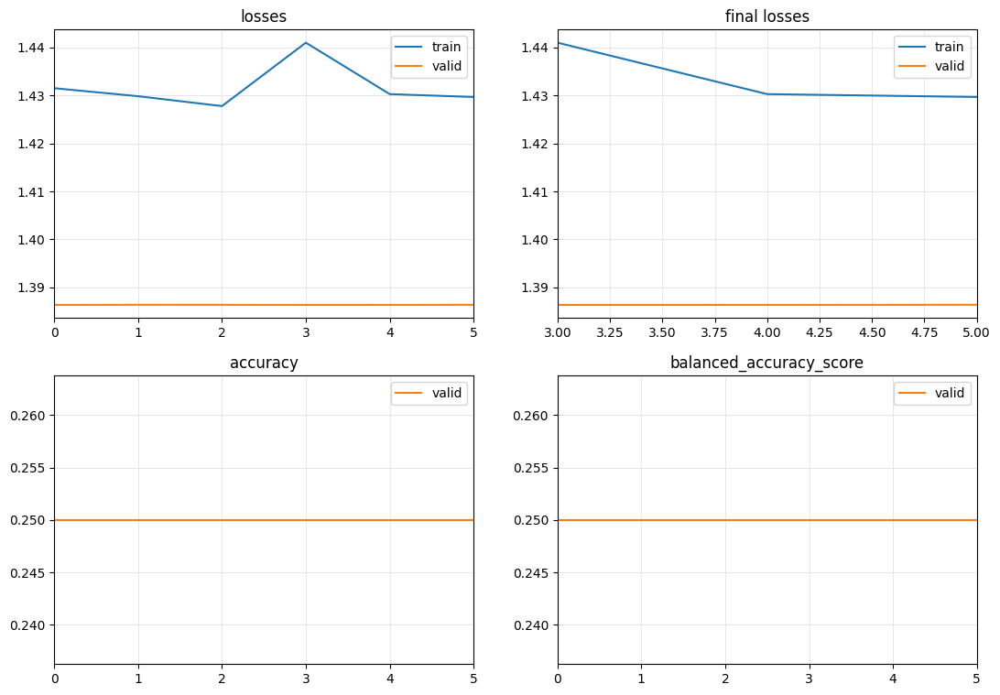

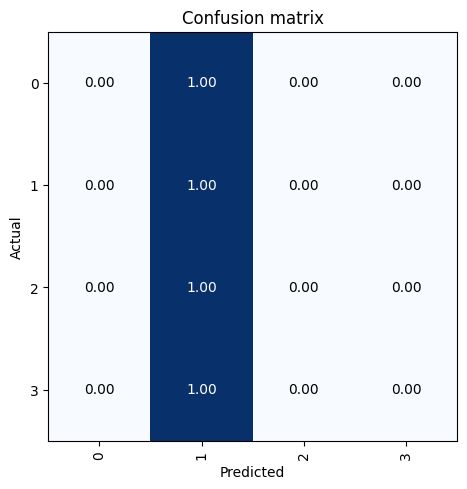

[I 2023-11-04 12:06:44,379] Trial 53 finished with value: 0.25 and parameters: {'num_days': 56, 'batch_size': 28, 'normalize': False, 'n_heads': 3, 'd_model': 4, 'd_k': 2, 'd_v': 3, 'd_ff': 256, 'tst_dropout': 0.6000000000000001, 'n_layers': 10, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


{'num_days': 56, 'batch_size': 24, 'normalize': True, 'n_heads': 45, 'd_model': 2, 'd_k': 5, 'd_v': 2, 'd_ff': 128, 'tst_dropout': 0.2, 'n_layers': 16, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'None', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[I 2023-11-04 12:07:06,173] Trial 54 finished with value: 0.0 and parameters: {'num_days': 56, 'batch_size': 24, 'normalize': True, 'n_heads': 45, 'd_model': 2, 'd_k': 5, 'd_v': 2, 'd_ff': 128, 'tst_dropout': 0.2, 'n_layers': 16, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'None', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 50 with value: 0.5745.


Runtime error CUDA out of memory. Tried to allocate 828.00 MiB (GPU 0; 11.00 GiB total capacity; 10.18 GiB already allocated; 0 bytes free; 10.29 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF


[W 2023-11-04 12:07:25,859] Trial 55 failed with parameters: {'num_days': 35, 'batch_size': 24, 'normalize': False, 'n_heads': 41, 'd_model': 3, 'd_k': 3, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.4, 'n_layers': 10, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.2} because of the following error: RuntimeError('CUDA error: out of memory\nCUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.\nFor debugging consider passing CUDA_LAUNCH_BLOCKING=1.\nCompile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.\n').
Traceback (most recent call last):
  File "c:\Users\scott\miniconda3\envs\tsai\lib\site-packages\optuna\study\_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
  File "C:\Users\scott\AppData\Local\Temp\ipykernel_26796\2406734117.py", line 44, in objective
    model = TSTPlus(dls.vars, dls.c, dls.len, d_model=d_model, n_heads=n_heads, d_k=d_k, d_v=d_v, d_ff=d_ff, store_attn=False, dropout=t

RuntimeError: CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [24]:

study.optimize(objective, n_trials=149)

{'num_days': 35, 'batch_size': 24, 'normalize': False, 'n_heads': 41, 'd_model': 3, 'd_k': 3, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.4, 'n_layers': 10, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.354784,1.303533,0.429125,0.429125,11:36
1,1.336224,1.251799,0.446750,0.446750,11:51
2,1.317634,1.213525,0.470250,0.470250,11:40
3,1.293098,1.213040,0.467875,0.467875,11:45
4,1.273648,1.186410,0.475500,0.475500,11:27
5,1.249674,1.164793,0.485125,0.485125,11:27
6,1.246909,1.154802,0.495500,0.495500,11:27
7,1.249703,1.174688,0.493875,0.493875,11:42
8,1.214858,1.144160,0.495250,0.495250,11:30
9,1.198857,1.145636,0.512250,0.512250,11:44


No improvement since epoch 11: early stopping


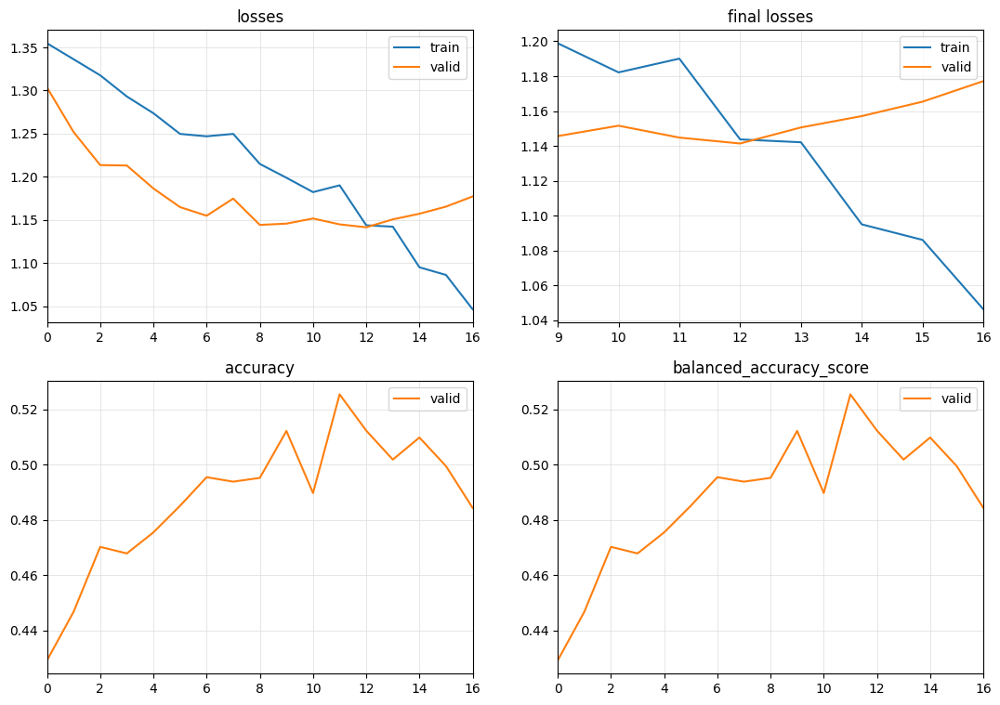

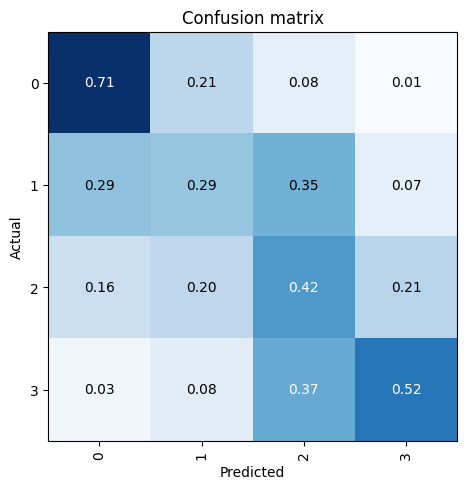

[I 2023-11-04 19:32:01,600] Trial 55 finished with value: 0.5255000000000001 and parameters: {'num_days': 35, 'batch_size': 24, 'normalize': False, 'n_heads': 41, 'd_model': 3, 'd_k': 3, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.4, 'n_layers': 10, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


{'num_days': 70, 'batch_size': 32, 'normalize': True, 'n_heads': 44, 'd_model': 2, 'd_k': 1, 'd_v': 3, 'd_ff': 512, 'tst_dropout': 0.4, 'n_layers': 22, 'tst_attn_dropout': 0.6000000000000001, 'tst_fc_dropout': 0.2, 'loss_func': 'None', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[I 2023-11-04 19:34:48,575] Trial 56 finished with value: 0.0 and parameters: {'num_days': 70, 'batch_size': 32, 'normalize': True, 'n_heads': 44, 'd_model': 2, 'd_k': 1, 'd_v': 3, 'd_ff': 512, 'tst_dropout': 0.4, 'n_layers': 22, 'tst_attn_dropout': 0.6000000000000001, 'tst_fc_dropout': 0.2, 'loss_func': 'None', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


Runtime error CUDA out of memory. Tried to allocate 1.38 GiB (GPU 0; 11.00 GiB total capacity; 9.25 GiB already allocated; 0 bytes free; 9.26 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
{'num_days': 21, 'batch_size': 20, 'normalize': False, 'n_heads': 49, 'd_model': 5, 'd_k': 4, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.2, 'n_layers': 7, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.061299,1.160242,0.520625,0.520625,03:59
1,0.996448,1.137309,0.540125,0.540125,04:00
2,0.949817,1.135732,0.539500,0.539500,03:59
3,0.911713,1.155685,0.532500,0.532500,03:59
4,0.894820,1.139281,0.534375,0.534375,03:59
5,0.856014,1.159343,0.534500,0.534500,04:00
6,0.827440,1.179521,0.516125,0.516125,04:00


No improvement since epoch 1: early stopping


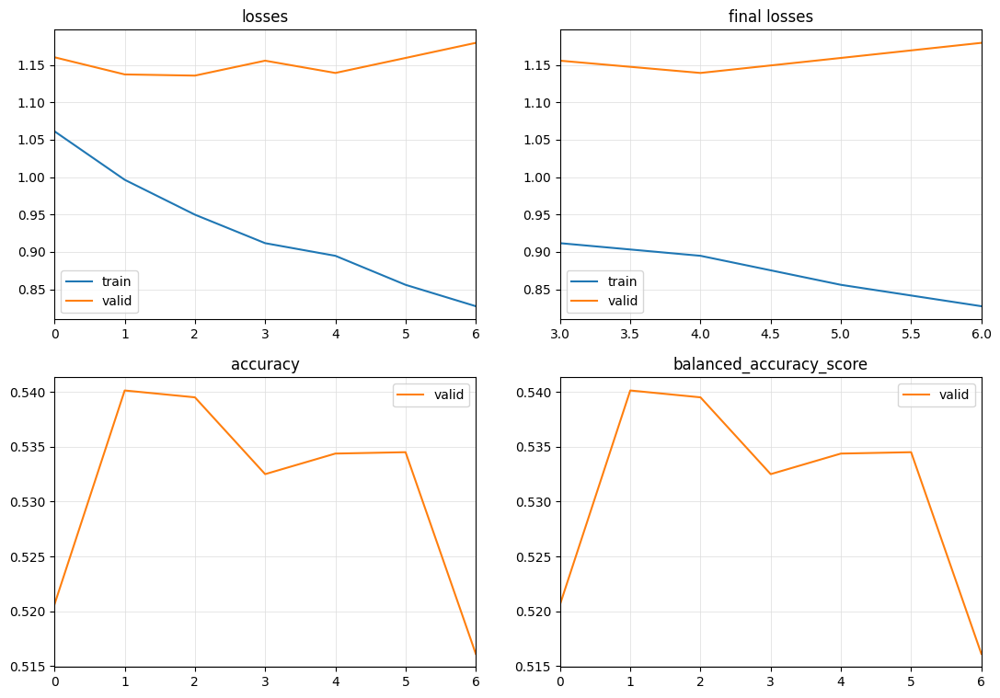

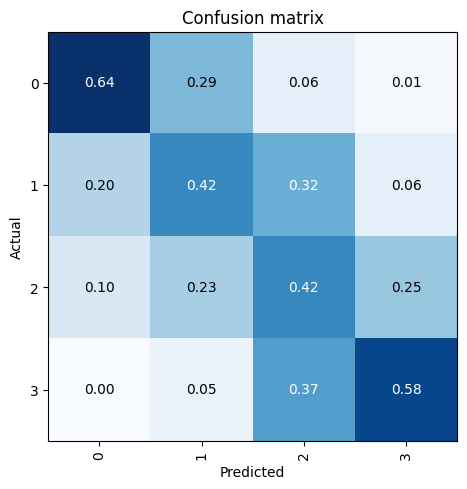

[I 2023-11-04 20:03:37,593] Trial 57 finished with value: 0.540125 and parameters: {'num_days': 21, 'batch_size': 20, 'normalize': False, 'n_heads': 49, 'd_model': 5, 'd_k': 4, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.2, 'n_layers': 7, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


{'num_days': 42, 'batch_size': 20, 'normalize': True, 'n_heads': 33, 'd_model': 5, 'd_k': 5, 'd_v': 1, 'd_ff': 128, 'tst_dropout': 0.8, 'n_layers': 4, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.458112,1.380931,0.344000,0.344000,04:45
1,1.460464,1.374162,0.305250,0.305250,04:44
2,1.434299,1.363660,0.282500,0.282500,04:44
3,1.413916,1.347389,0.279000,0.279000,04:44
4,1.398919,1.320593,0.316375,0.316375,04:43
5,1.340505,1.306725,0.332000,0.332000,04:50


No improvement since epoch 0: early stopping


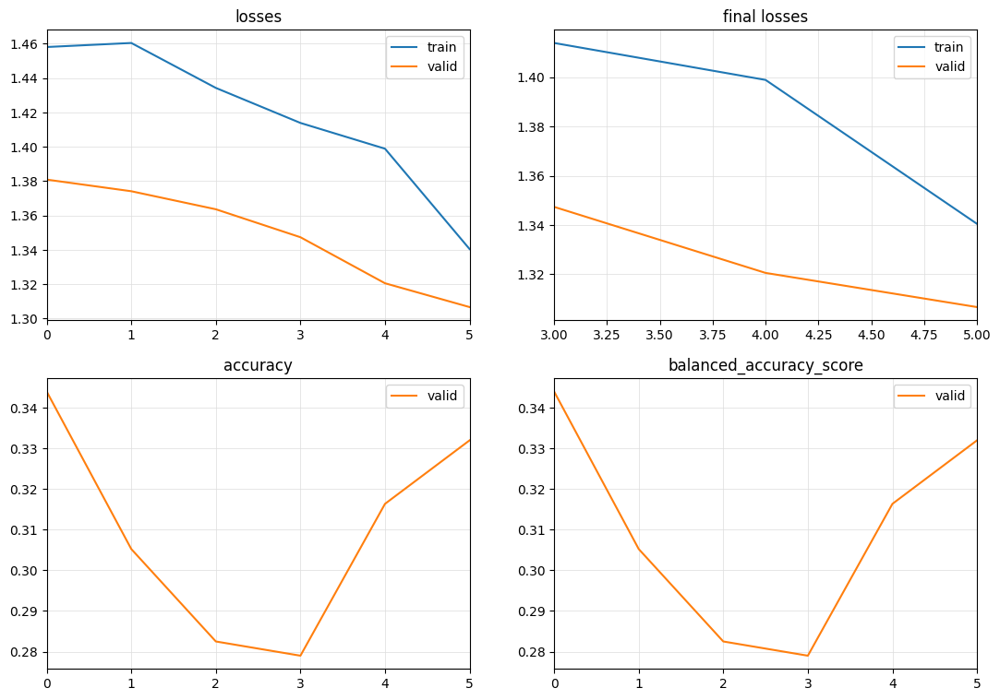

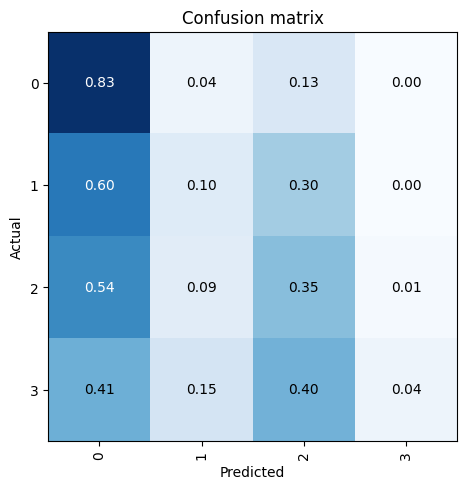

[I 2023-11-04 20:33:02,795] Trial 58 finished with value: 0.344 and parameters: {'num_days': 42, 'batch_size': 20, 'normalize': True, 'n_heads': 33, 'd_model': 5, 'd_k': 5, 'd_v': 1, 'd_ff': 128, 'tst_dropout': 0.8, 'n_layers': 4, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 50 with value: 0.5745.


{'num_days': 21, 'batch_size': 16, 'normalize': False, 'n_heads': 14, 'd_model': 4, 'd_k': 4, 'd_v': 5, 'd_ff': 256, 'tst_dropout': 0.4, 'n_layers': 4, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.216370,1.219618,0.451250,0.451250,01:31
1,1.130730,1.190820,0.479250,0.479250,01:31
2,1.085100,1.179247,0.499000,0.499000,01:30
3,1.086479,1.159475,0.514875,0.514875,01:29
4,1.035148,1.148102,0.526500,0.526500,01:30
5,1.029632,1.146788,0.530125,0.530125,01:30
6,0.996442,1.138416,0.525500,0.525500,01:30
7,0.996062,1.140477,0.530250,0.530250,01:30
8,0.973931,1.141029,0.539500,0.539500,01:30
9,0.977038,1.151557,0.533750,0.533750,01:30


No improvement since epoch 8: early stopping


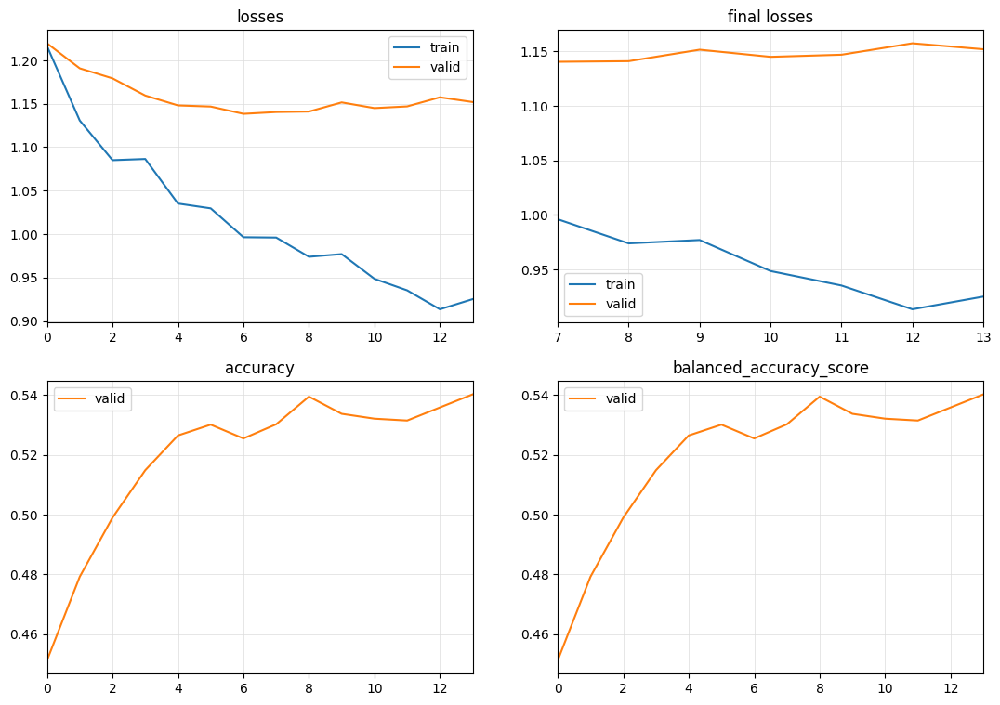

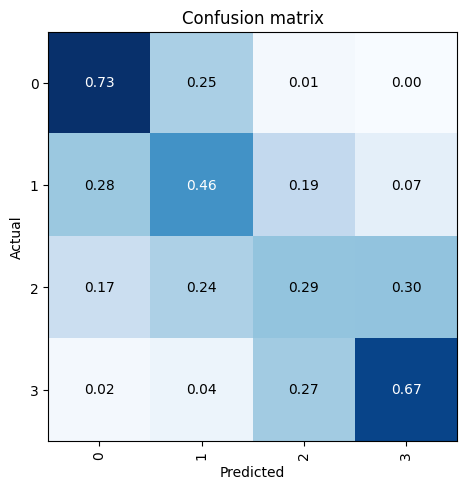

[I 2023-11-04 20:54:42,310] Trial 59 finished with value: 0.54025 and parameters: {'num_days': 21, 'batch_size': 16, 'normalize': False, 'n_heads': 14, 'd_model': 4, 'd_k': 4, 'd_v': 5, 'd_ff': 256, 'tst_dropout': 0.4, 'n_layers': 4, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 50 with value: 0.5745.


{'num_days': 28, 'batch_size': 28, 'normalize': True, 'n_heads': 27, 'd_model': 4, 'd_k': 4, 'd_v': 4, 'd_ff': 512, 'tst_dropout': 0.6000000000000001, 'n_layers': 4, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.426724,1.305284,0.425375,0.425375,02:16
1,1.315074,1.235641,0.438625,0.438625,02:16
2,1.268694,1.219726,0.449000,0.449000,02:16
3,1.214776,1.208405,0.460250,0.460250,02:22
4,1.161112,1.199423,0.475750,0.475750,02:23
5,1.145267,1.181846,0.480375,0.480375,02:15
6,1.087868,1.176390,0.497750,0.497750,02:15
7,1.096837,1.171340,0.506250,0.506250,02:15
8,1.063395,1.181296,0.512250,0.512250,02:15
9,1.062083,1.177753,0.511375,0.511375,02:15


No improvement since epoch 8: early stopping


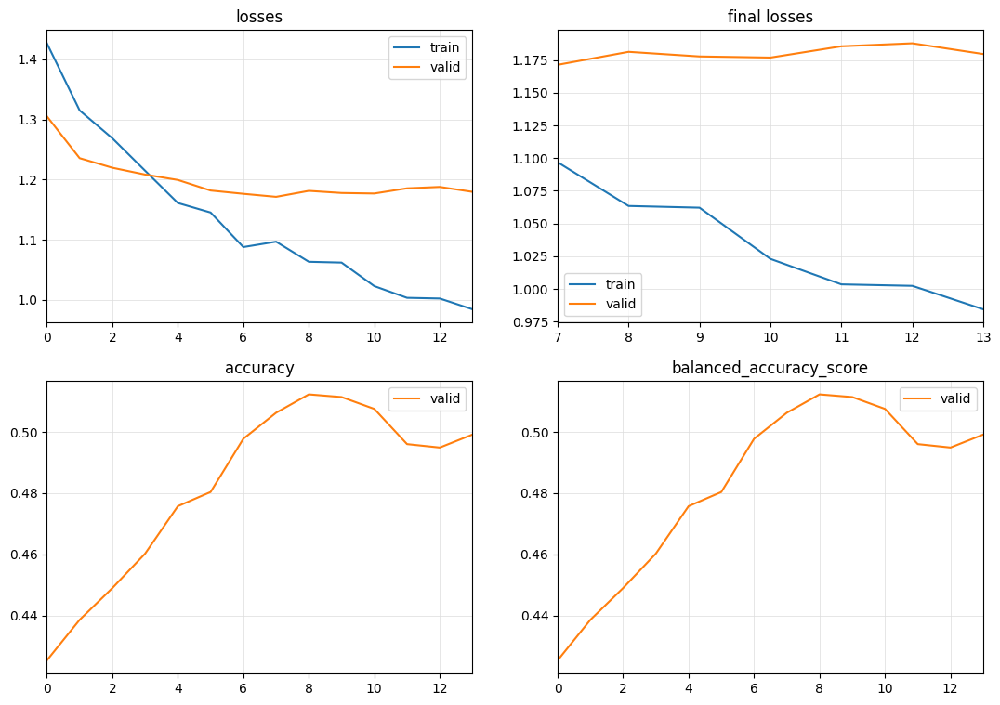

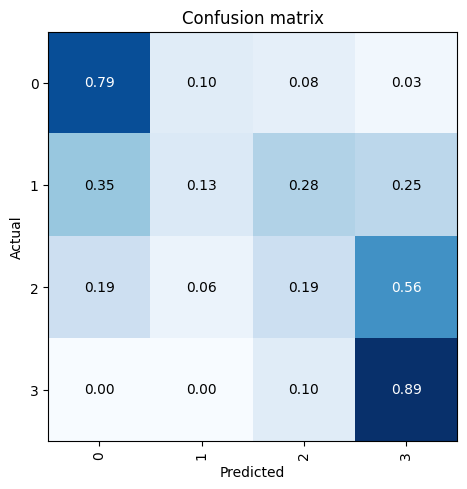

[I 2023-11-04 21:27:13,171] Trial 60 finished with value: 0.51225 and parameters: {'num_days': 28, 'batch_size': 28, 'normalize': True, 'n_heads': 27, 'd_model': 4, 'd_k': 4, 'd_v': 4, 'd_ff': 512, 'tst_dropout': 0.6000000000000001, 'n_layers': 4, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


{'num_days': 84, 'batch_size': 32, 'normalize': True, 'n_heads': 11, 'd_model': 5, 'd_k': 3, 'd_v': 1, 'd_ff': 512, 'tst_dropout': 0.4, 'n_layers': 16, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[I 2023-11-04 21:27:33,369] Trial 61 finished with value: 0.0 and parameters: {'num_days': 84, 'batch_size': 32, 'normalize': True, 'n_heads': 11, 'd_model': 5, 'd_k': 3, 'd_v': 1, 'd_ff': 512, 'tst_dropout': 0.4, 'n_layers': 16, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


Runtime error CUDA out of memory. Tried to allocate 32.00 MiB (GPU 0; 11.00 GiB total capacity; 10.25 GiB already allocated; 0 bytes free; 10.31 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF


[W 2023-11-04 21:27:51,145] Trial 62 failed with parameters: {'num_days': 14, 'batch_size': 24, 'normalize': False, 'n_heads': 26, 'd_model': 2, 'd_k': 1, 'd_v': 4, 'd_ff': 512, 'tst_dropout': 0.4, 'n_layers': 13, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.4} because of the following error: RuntimeError('CUDA error: out of memory\nCUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.\nFor debugging consider passing CUDA_LAUNCH_BLOCKING=1.\nCompile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.\n').
Traceback (most recent call last):
  File "c:\Users\scott\miniconda3\envs\tsai\lib\site-packages\optuna\study\_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
  File "C:\Users\scott\AppData\Local\Temp\ipykernel_6264\2406734117.py", line 44, in objective
    model = TSTPlus(dls.vars, dls.c, dls.len, d_model=d_model, n_heads=n_heads, d_k=d_k, d_v=d_v, d_ff=d_ff, store_attn=False, dropout=ts

RuntimeError: CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [24]:
study.optimize(objective, n_trials=150)

{'num_days': 14, 'batch_size': 24, 'normalize': False, 'n_heads': 26, 'd_model': 2, 'd_k': 1, 'd_v': 4, 'd_ff': 512, 'tst_dropout': 0.4, 'n_layers': 13, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.4, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.431888,1.386386,0.251500,0.251500,02:54
1,1.453315,1.386281,0.250625,0.250625,02:53
2,1.433428,1.385830,0.274750,0.274750,02:55
3,1.437111,1.385839,0.251125,0.251125,02:55
4,1.446105,1.385737,0.251375,0.251375,02:55
5,1.421135,1.385436,0.307375,0.307375,02:55
6,1.430199,1.384082,0.333500,0.333500,02:55
7,1.416023,1.384130,0.279500,0.279500,02:53
8,1.416156,1.381972,0.286250,0.286250,02:55
9,1.409823,1.382996,0.453750,0.453750,02:55


No improvement since epoch 9: early stopping


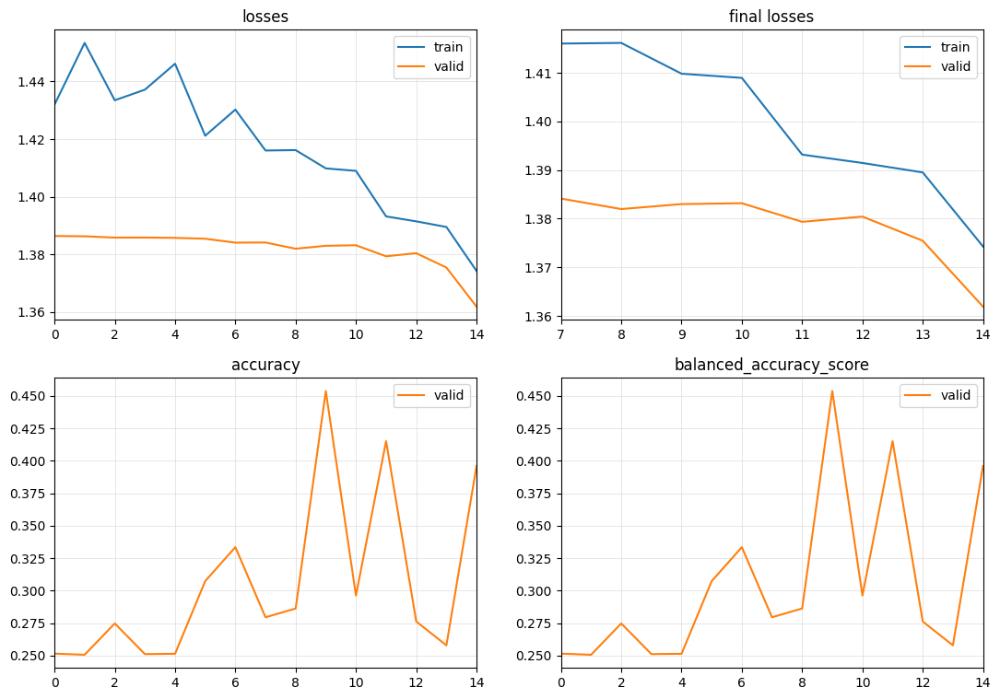

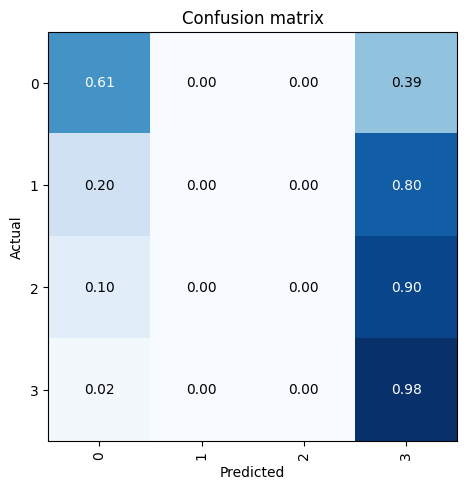

[I 2023-11-05 06:34:25,956] Trial 62 finished with value: 0.45375 and parameters: {'num_days': 14, 'batch_size': 24, 'normalize': False, 'n_heads': 26, 'd_model': 2, 'd_k': 1, 'd_v': 4, 'd_ff': 512, 'tst_dropout': 0.4, 'n_layers': 13, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.4, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 50 with value: 0.5745.


{'num_days': 14, 'batch_size': 16, 'normalize': False, 'n_heads': 14, 'd_model': 4, 'd_k': 1, 'd_v': 4, 'd_ff': 256, 'tst_dropout': 0.4, 'n_layers': 4, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.217566,1.159841,0.505250,0.505250,01:22
1,1.138046,1.121527,0.520000,0.520000,01:22
2,1.128535,1.108756,0.527250,0.527250,01:22
3,1.087265,1.108476,0.529500,0.529500,01:21
4,1.062239,1.093601,0.538500,0.538500,01:21
5,1.051410,1.090036,0.540625,0.540625,01:21
6,1.011085,1.091453,0.543000,0.543000,01:21
7,1.008409,1.079732,0.551625,0.551625,01:21
8,1.027831,1.083641,0.550125,0.550125,01:22
9,0.983833,1.083523,0.552500,0.552500,01:22


No improvement since epoch 7: early stopping


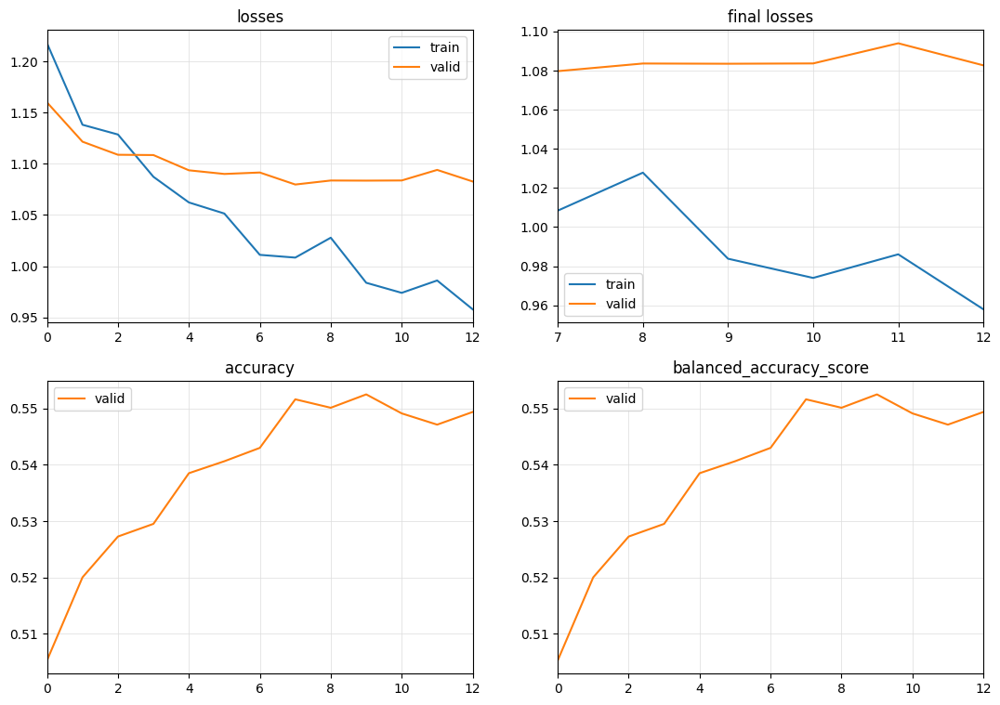

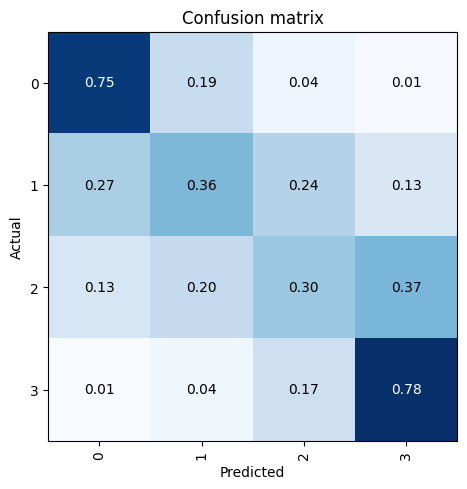

[I 2023-11-05 06:52:38,311] Trial 63 finished with value: 0.5525 and parameters: {'num_days': 14, 'batch_size': 16, 'normalize': False, 'n_heads': 14, 'd_model': 4, 'd_k': 1, 'd_v': 4, 'd_ff': 256, 'tst_dropout': 0.4, 'n_layers': 4, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


{'num_days': 28, 'batch_size': 20, 'normalize': False, 'n_heads': 34, 'd_model': 3, 'd_k': 1, 'd_v': 3, 'd_ff': 384, 'tst_dropout': 0.8, 'n_layers': 13, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.437741,1.386357,0.250000,0.250000,08:26
1,1.439110,1.386334,0.250000,0.250000,08:12
2,1.444677,1.386326,0.250000,0.250000,08:15
3,1.432591,1.386341,0.250000,0.250000,08:22
4,1.445351,1.386333,0.250000,0.250000,08:12
5,1.429531,1.386345,0.250000,0.250000,08:11


No improvement since epoch 0: early stopping


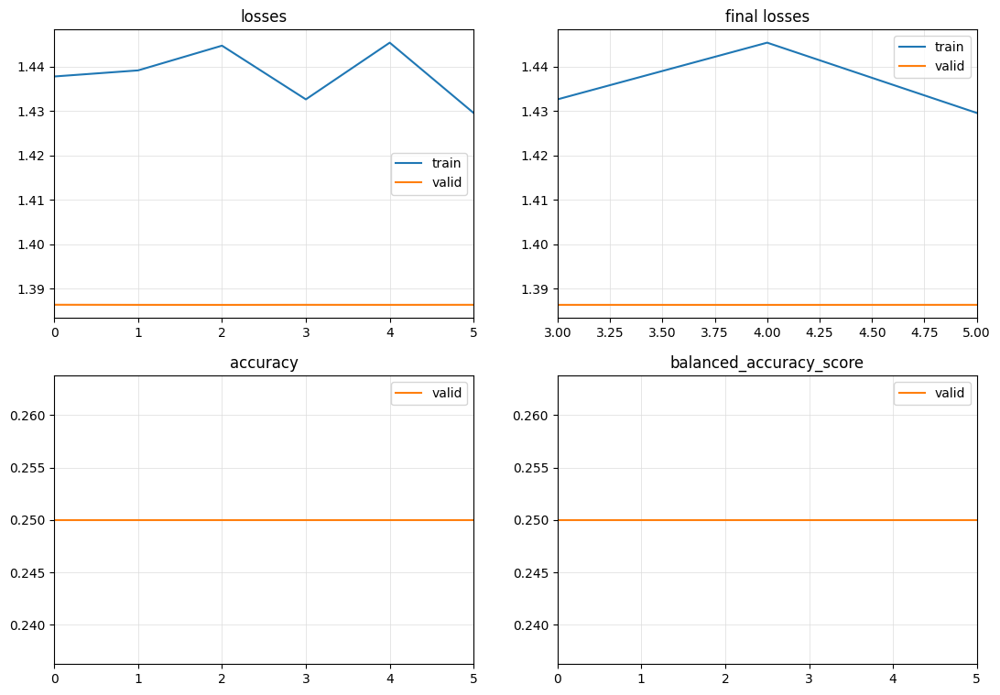

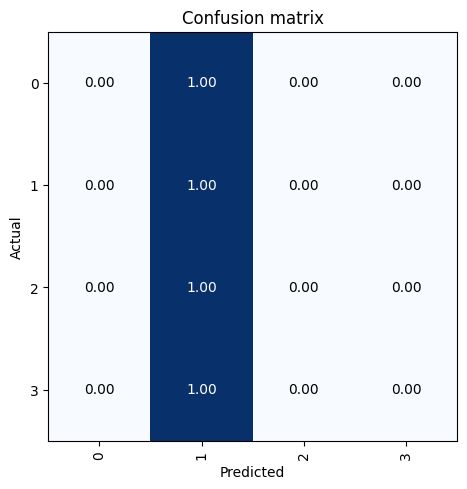

[I 2023-11-05 07:43:36,545] Trial 64 finished with value: 0.25 and parameters: {'num_days': 28, 'batch_size': 20, 'normalize': False, 'n_heads': 34, 'd_model': 3, 'd_k': 1, 'd_v': 3, 'd_ff': 384, 'tst_dropout': 0.8, 'n_layers': 13, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 50 with value: 0.5745.


{'num_days': 21, 'batch_size': 28, 'normalize': True, 'n_heads': 11, 'd_model': 5, 'd_k': 1, 'd_v': 2, 'd_ff': 256, 'tst_dropout': 0.4, 'n_layers': 16, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.524525,1.288661,0.373375,0.373375,03:10
1,1.456078,1.295689,0.391000,0.391000,03:09
2,1.444025,1.330691,0.391125,0.391125,03:09
3,1.418009,1.335761,0.402000,0.402000,03:09
4,1.375486,1.332428,0.409625,0.409625,03:09
5,1.347469,1.360430,0.410875,0.410875,03:10
6,1.317472,1.308540,0.432750,0.432750,03:19
7,1.223850,1.328942,0.442750,0.442750,03:12
8,1.192370,1.335522,0.440875,0.440875,03:10
9,1.189770,1.343642,0.431750,0.431750,03:10


No improvement since epoch 7: early stopping


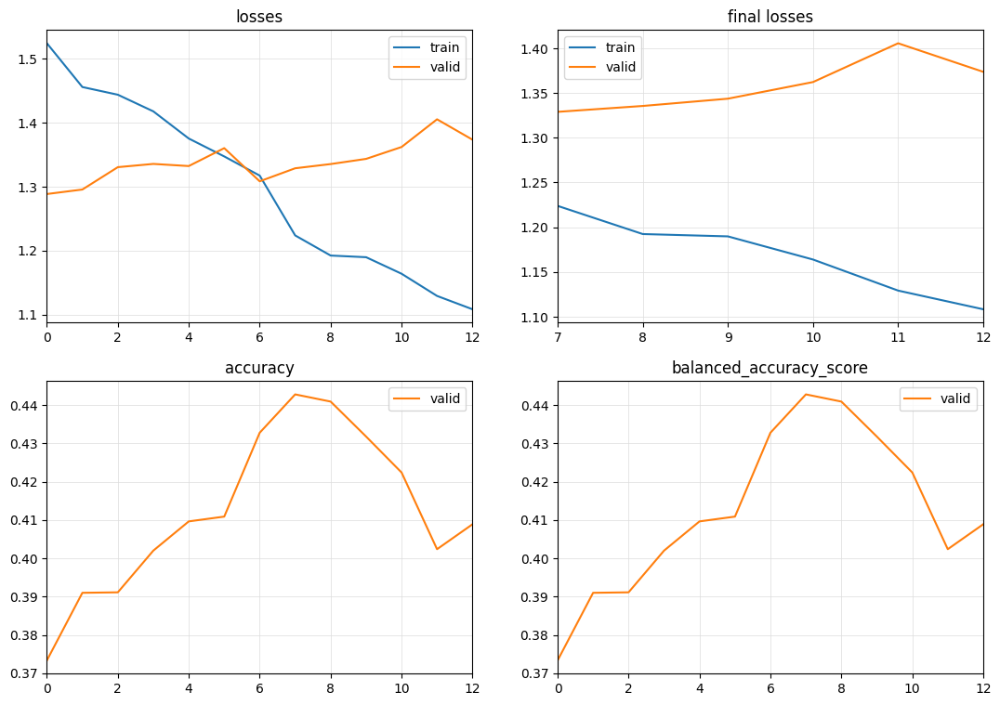

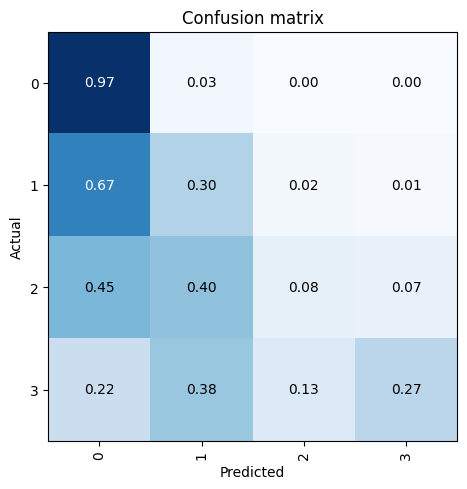

[I 2023-11-05 08:25:36,441] Trial 65 finished with value: 0.44275 and parameters: {'num_days': 21, 'batch_size': 28, 'normalize': True, 'n_heads': 11, 'd_model': 5, 'd_k': 1, 'd_v': 2, 'd_ff': 256, 'tst_dropout': 0.4, 'n_layers': 16, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}. Best is trial 50 with value: 0.5745.


{'num_days': 7, 'batch_size': 12, 'normalize': True, 'n_heads': 16, 'd_model': 2, 'd_k': 5, 'd_v': 4, 'd_ff': 384, 'tst_dropout': 0.8, 'n_layers': 16, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.2, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.452100,1.386474,0.250000,0.250000,06:00
1,1.432699,1.386437,0.250000,0.250000,06:12
2,1.444646,1.386415,0.250000,0.250000,06:04
3,1.409952,1.386395,0.250000,0.250000,06:14
4,1.439080,1.386416,0.250000,0.250000,06:07
5,1.422093,1.386374,0.250000,0.250000,05:54


No improvement since epoch 0: early stopping


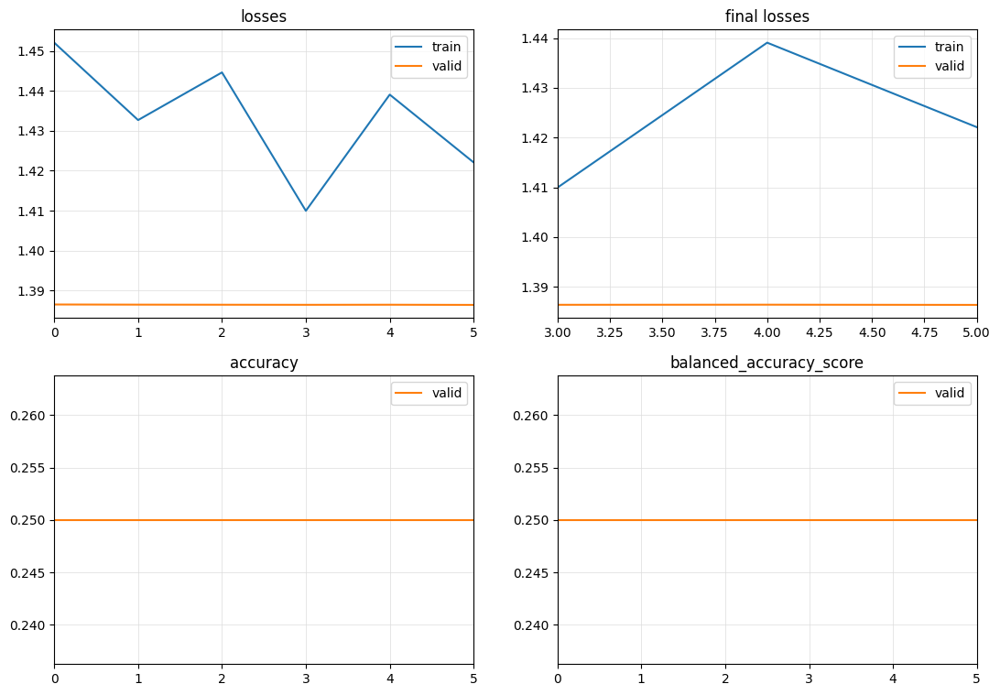

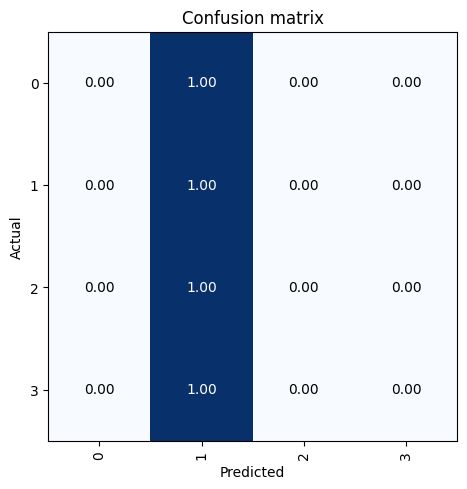

[I 2023-11-05 09:02:56,465] Trial 66 finished with value: 0.25 and parameters: {'num_days': 7, 'batch_size': 12, 'normalize': True, 'n_heads': 16, 'd_model': 2, 'd_k': 5, 'd_v': 4, 'd_ff': 384, 'tst_dropout': 0.8, 'n_layers': 16, 'tst_attn_dropout': 0.8, 'tst_fc_dropout': 0.2, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 50 with value: 0.5745.


{'num_days': 49, 'batch_size': 4, 'normalize': True, 'n_heads': 37, 'd_model': 1, 'd_k': 3, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.2, 'n_layers': 4, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.0, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.150244,1.103105,0.489000,0.489000,09:20
1,1.091453,1.071082,0.503125,0.503125,09:08
2,1.097570,1.070595,0.508500,0.508500,09:08
3,1.014982,1.070140,0.520250,0.520250,09:08
4,0.995710,1.074878,0.520500,0.520500,09:08
5,0.898021,1.080956,0.516375,0.516375,09:08
6,0.964520,1.099439,0.506000,0.506000,09:28
7,0.939686,1.098570,0.502750,0.502750,09:14
8,0.876345,1.103029,0.505500,0.505500,09:08


No improvement since epoch 3: early stopping


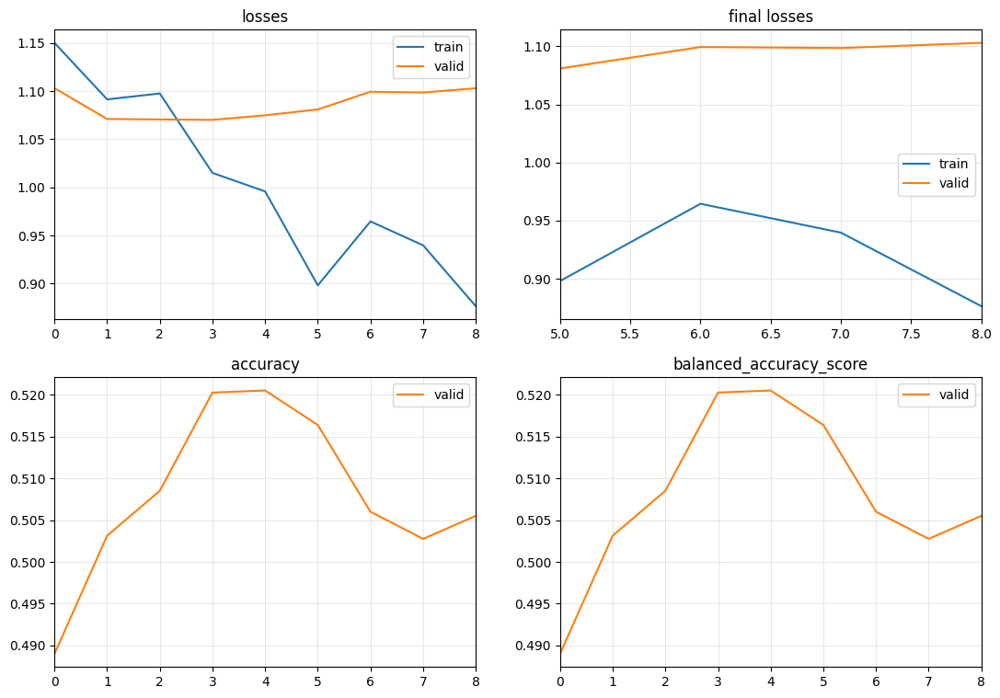

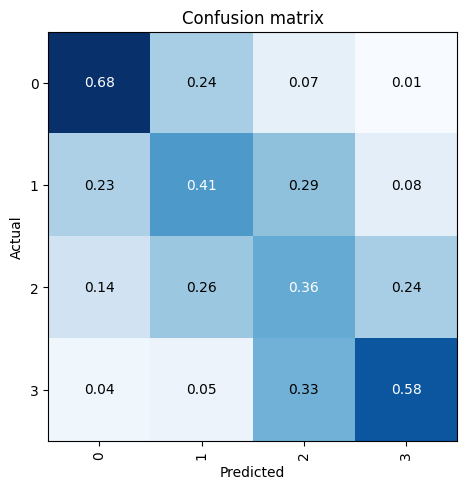

[I 2023-11-05 10:27:24,783] Trial 67 finished with value: 0.5205 and parameters: {'num_days': 49, 'batch_size': 4, 'normalize': True, 'n_heads': 37, 'd_model': 1, 'd_k': 3, 'd_v': 5, 'd_ff': 384, 'tst_dropout': 0.2, 'n_layers': 4, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.0, 'loss_func': 'None', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 50 with value: 0.5745.


{'num_days': 21, 'batch_size': 20, 'normalize': False, 'n_heads': 34, 'd_model': 3, 'd_k': 5, 'd_v': 4, 'd_ff': 512, 'tst_dropout': 0.0, 'n_layers': 4, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.039025,1.156291,0.503125,0.503125,01:58
1,0.996890,1.147962,0.514000,0.514000,01:58
2,0.953205,1.146190,0.514125,0.514125,01:58
3,0.932746,1.152868,0.515500,0.515500,01:58
4,0.909743,1.140489,0.523750,0.523750,01:58
5,0.886977,1.135741,0.539375,0.539375,01:58
6,0.850371,1.147576,0.531125,0.531125,01:58
7,0.836183,1.142925,0.533750,0.533750,01:58
8,0.857029,1.156393,0.525250,0.525250,01:58
9,0.845633,1.156079,0.529375,0.529375,01:58


No improvement since epoch 5: early stopping


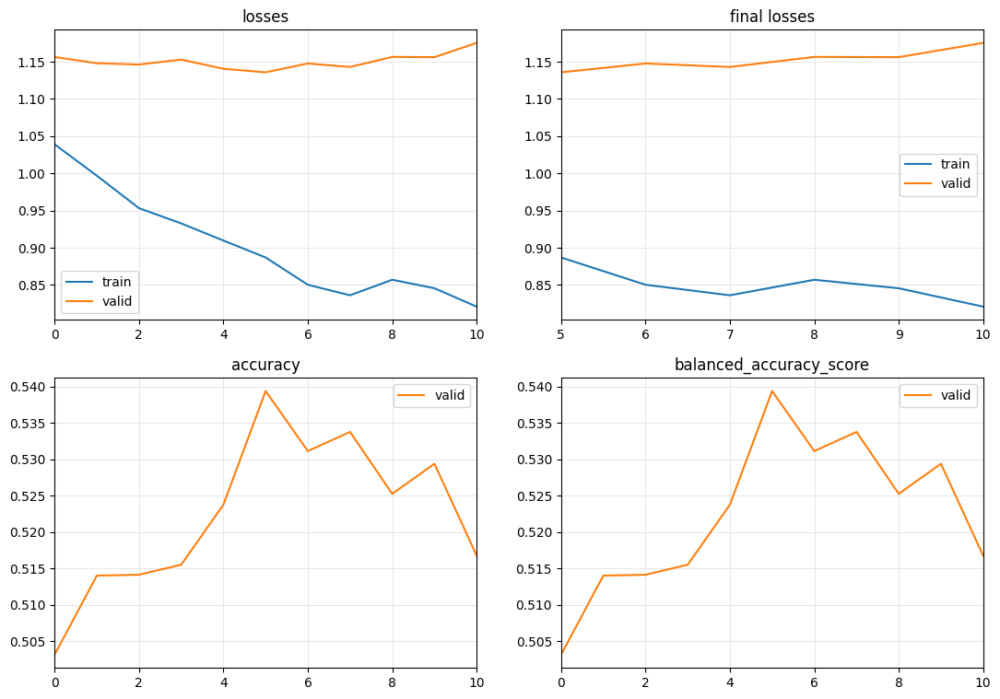

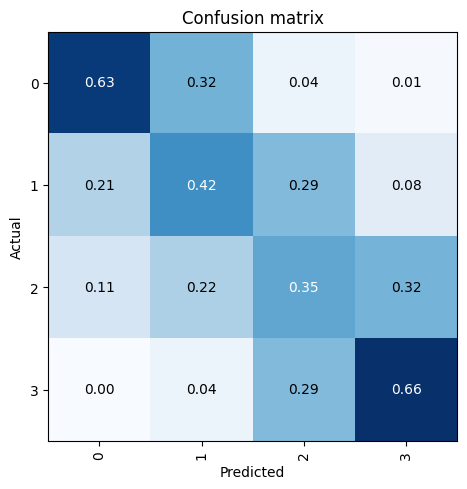

[I 2023-11-05 10:49:39,622] Trial 68 finished with value: 0.539375 and parameters: {'num_days': 21, 'batch_size': 20, 'normalize': False, 'n_heads': 34, 'd_model': 3, 'd_k': 5, 'd_v': 4, 'd_ff': 512, 'tst_dropout': 0.0, 'n_layers': 4, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


{'num_days': 21, 'batch_size': 32, 'normalize': False, 'n_heads': 11, 'd_model': 5, 'd_k': 4, 'd_v': 5, 'd_ff': 256, 'tst_dropout': 0.4, 'n_layers': 16, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.541754,1.379978,0.359375,0.359375,03:12
1,1.522516,1.374753,0.401750,0.401750,03:01
2,1.532988,1.362300,0.412625,0.412625,03:00
3,1.501837,1.352117,0.412875,0.412875,03:00
4,1.468482,1.341236,0.421000,0.421000,03:00
5,1.458447,1.328809,0.426875,0.426875,02:59
6,1.451557,1.303684,0.432375,0.432375,03:00
7,1.393518,1.289988,0.440000,0.440000,03:00
8,1.382668,1.259555,0.438375,0.438375,03:00
9,1.364825,1.243617,0.449375,0.449375,03:00


No improvement since epoch 20: early stopping


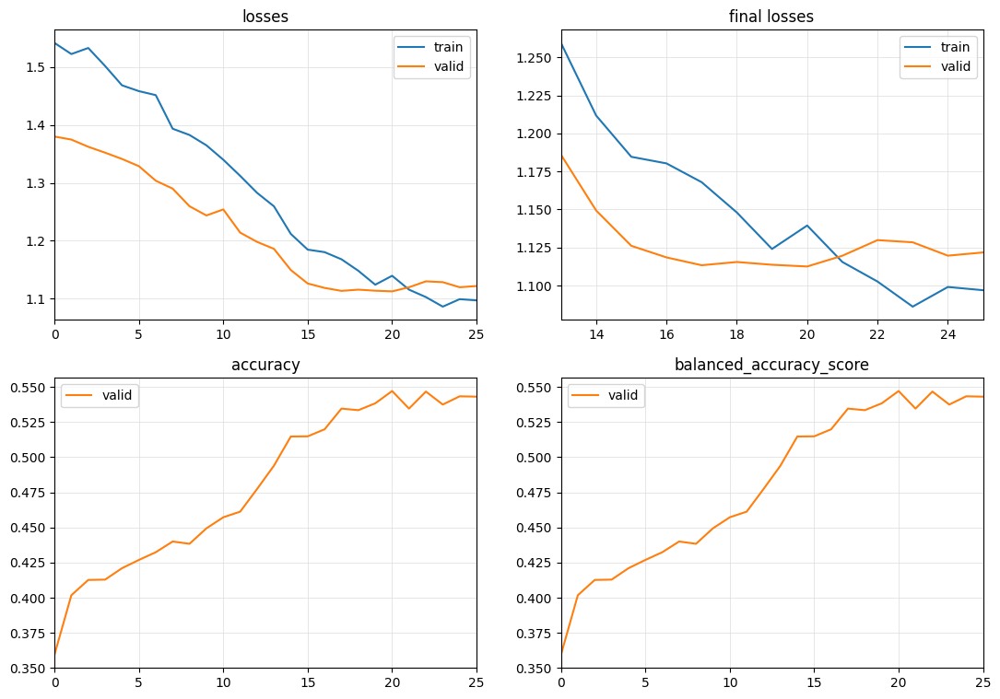

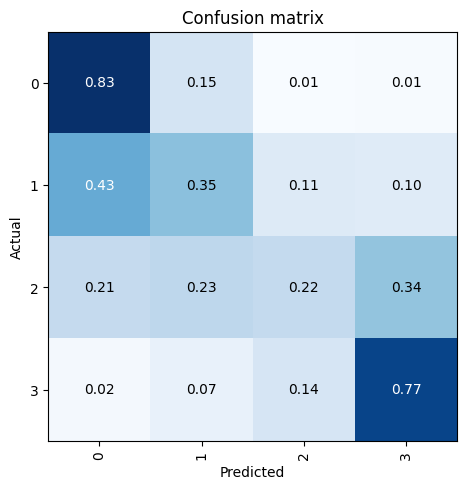

[I 2023-11-05 12:09:39,980] Trial 69 finished with value: 0.547125 and parameters: {'num_days': 21, 'batch_size': 32, 'normalize': False, 'n_heads': 11, 'd_model': 5, 'd_k': 4, 'd_v': 5, 'd_ff': 256, 'tst_dropout': 0.4, 'n_layers': 16, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}. Best is trial 50 with value: 0.5745.


{'num_days': 70, 'batch_size': 24, 'normalize': False, 'n_heads': 39, 'd_model': 4, 'd_k': 4, 'd_v': 5, 'd_ff': 512, 'tst_dropout': 0.6000000000000001, 'n_layers': 7, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[I 2023-11-05 12:10:05,208] Trial 70 finished with value: 0.0 and parameters: {'num_days': 70, 'batch_size': 24, 'normalize': False, 'n_heads': 39, 'd_model': 4, 'd_k': 4, 'd_v': 5, 'd_ff': 512, 'tst_dropout': 0.6000000000000001, 'n_layers': 7, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.6000000000000001, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


Runtime error CUDA out of memory. Tried to allocate 936.00 MiB (GPU 0; 11.00 GiB total capacity; 9.59 GiB already allocated; 0 bytes free; 9.94 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF
{'num_days': 35, 'batch_size': 16, 'normalize': True, 'n_heads': 58, 'd_model': 4, 'd_k': 3, 'd_v': 4, 'd_ff': 256, 'tst_dropout': 0.6000000000000001, 'n_layers': 25, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.4, 'loss_func': 'None', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time


[I 2023-11-05 12:10:23,983] Trial 71 finished with value: 0.0 and parameters: {'num_days': 35, 'batch_size': 16, 'normalize': True, 'n_heads': 58, 'd_model': 4, 'd_k': 3, 'd_v': 4, 'd_ff': 256, 'tst_dropout': 0.6000000000000001, 'n_layers': 25, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.4, 'loss_func': 'None', 'learner_callback': 'None', 'optimizer': 'AdamWDTrue'}. Best is trial 50 with value: 0.5745.


Runtime error CUDA out of memory. Tried to allocate 278.00 MiB (GPU 0; 11.00 GiB total capacity; 10.09 GiB already allocated; 0 bytes free; 10.28 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF


[W 2023-11-05 12:10:43,163] Trial 72 failed with parameters: {'num_days': 14, 'batch_size': 8, 'normalize': True, 'n_heads': 46, 'd_model': 3, 'd_k': 2, 'd_v': 3, 'd_ff': 384, 'tst_dropout': 0.6000000000000001, 'n_layers': 22, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.4} because of the following error: RuntimeError('CUDA error: out of memory\nCUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.\nFor debugging consider passing CUDA_LAUNCH_BLOCKING=1.\nCompile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.\n').
Traceback (most recent call last):
  File "c:\Users\scott\miniconda3\envs\tsai\lib\site-packages\optuna\study\_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
  File "C:\Users\scott\AppData\Local\Temp\ipykernel_26244\2406734117.py", line 44, in objective
    model = TSTPlus(dls.vars, dls.c, dls.len, d_model=d_model, n_heads=n_heads, d_k=d_k, d_v=d_v, d_ff=d_ff, store_attn=Fal

RuntimeError: CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1.
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [25]:
study.optimize(objective, n_trials=140)

{'num_days': 14, 'batch_size': 8, 'normalize': True, 'n_heads': 46, 'd_model': 3, 'd_k': 2, 'd_v': 3, 'd_ff': 384, 'tst_dropout': 0.6000000000000001, 'n_layers': 22, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.342184,1.250236,0.394500,0.394500,11:39
1,1.274814,1.407975,0.349625,0.349625,11:53
2,1.299313,1.405366,0.335250,0.335250,11:54
3,1.198851,1.577408,0.297375,0.297375,11:36
4,1.124183,1.629333,0.277750,0.277750,11:37
5,1.152538,1.407800,0.369625,0.369625,11:41


No improvement since epoch 0: early stopping


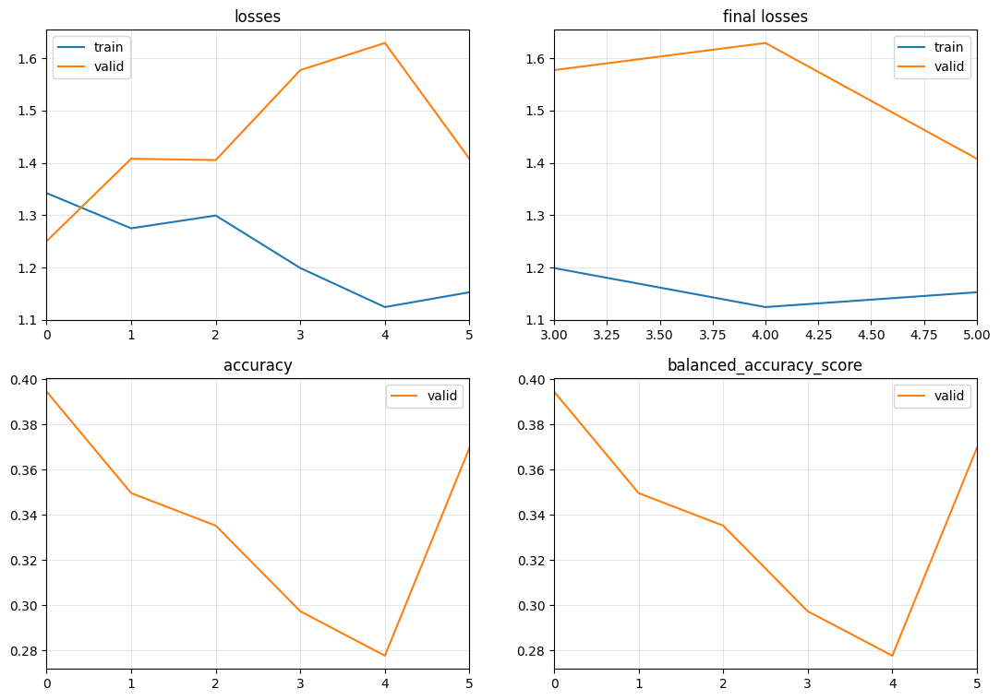

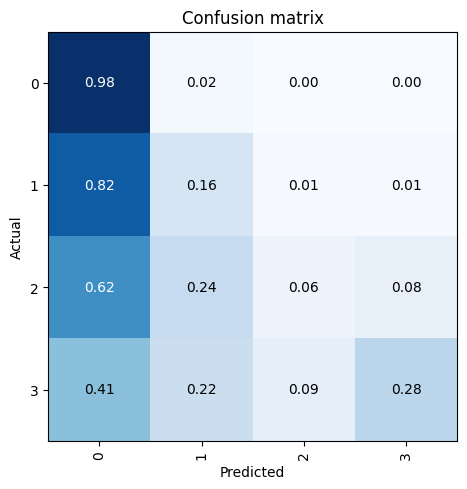

[I 2023-11-05 14:32:20,547] Trial 72 finished with value: 0.39449999999999996 and parameters: {'num_days': 14, 'batch_size': 8, 'normalize': True, 'n_heads': 46, 'd_model': 3, 'd_k': 2, 'd_v': 3, 'd_ff': 384, 'tst_dropout': 0.6000000000000001, 'n_layers': 22, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


{'num_days': 77, 'batch_size': 20, 'normalize': True, 'n_heads': 33, 'd_model': 5, 'd_k': 5, 'd_v': 1, 'd_ff': 128, 'tst_dropout': 0.8, 'n_layers': 4, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.464469,1.381726,0.337375,0.337375,09:16
1,1.444230,1.375358,0.324875,0.324875,09:15
2,1.421126,1.366655,0.366875,0.366875,09:15
3,1.400213,1.353763,0.373875,0.373875,09:15
4,1.345359,1.334309,0.360875,0.360875,09:15
5,1.301053,1.313184,0.368375,0.368375,09:15
6,1.233988,1.300766,0.368875,0.368875,09:21
7,1.220359,1.288931,0.391125,0.391125,09:27
8,1.184431,1.271541,0.425125,0.425125,09:15
9,1.179209,1.256670,0.443875,0.443875,09:15


No improvement since epoch 13: early stopping


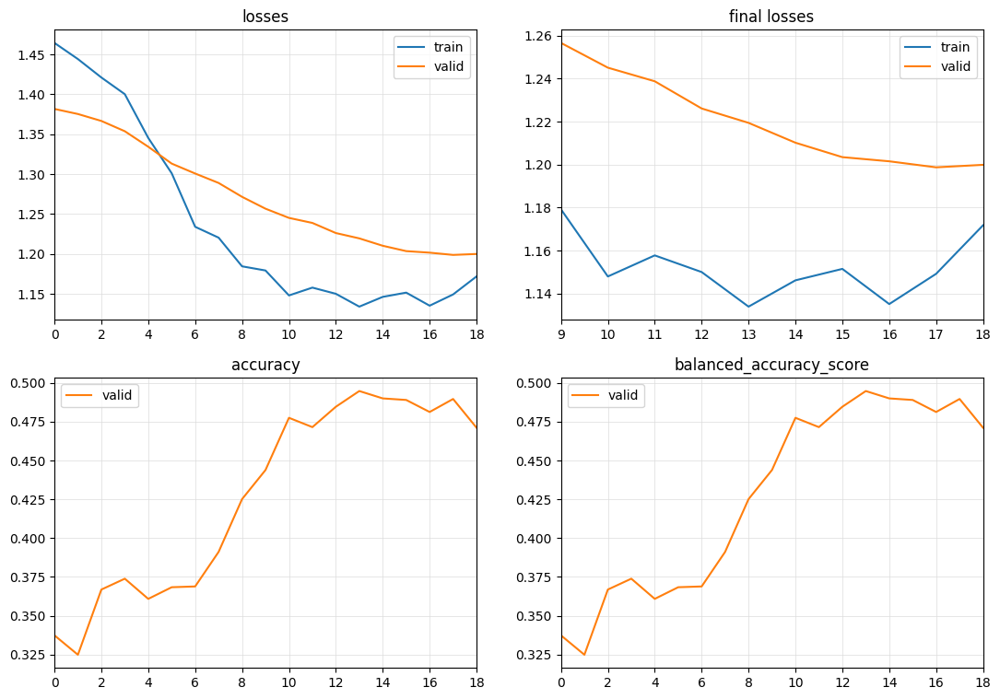

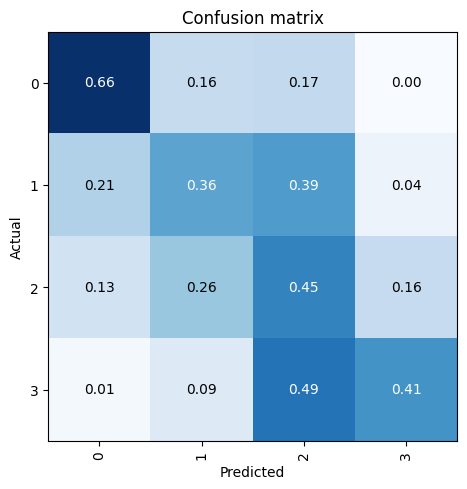

[I 2023-11-05 17:32:19,022] Trial 73 finished with value: 0.49475 and parameters: {'num_days': 77, 'batch_size': 20, 'normalize': True, 'n_heads': 33, 'd_model': 5, 'd_k': 5, 'd_v': 1, 'd_ff': 128, 'tst_dropout': 0.8, 'n_layers': 4, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 50 with value: 0.5745.


{'num_days': 35, 'batch_size': 24, 'normalize': True, 'n_heads': 27, 'd_model': 1, 'd_k': 1, 'd_v': 4, 'd_ff': 512, 'tst_dropout': 0.4, 'n_layers': 13, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.390861,1.271804,0.409500,0.409500,09:14
1,1.376878,1.295175,0.364125,0.364125,09:45
2,1.366240,1.292902,0.371000,0.371000,09:33
3,1.333099,1.279060,0.404750,0.404750,09:17
4,1.297964,1.270149,0.457125,0.457125,09:33
5,1.260734,1.240554,0.491250,0.491250,09:17
6,1.255548,1.213577,0.503875,0.503875,09:17
7,1.241097,1.196328,0.524375,0.524375,09:17
8,1.237421,1.179041,0.531000,0.531000,09:32
9,1.238320,1.233285,0.489500,0.489500,09:17


No improvement since epoch 8: early stopping


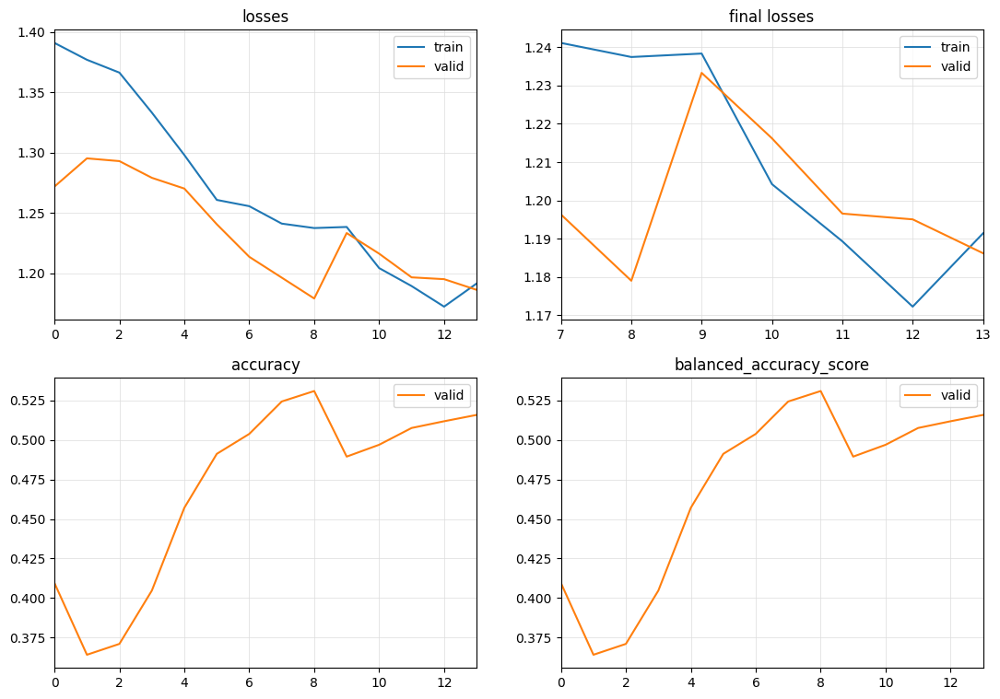

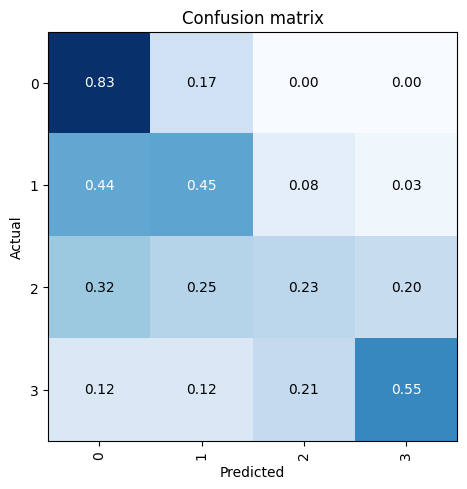

[I 2023-11-05 19:47:47,613] Trial 74 finished with value: 0.5309999999999999 and parameters: {'num_days': 35, 'batch_size': 24, 'normalize': True, 'n_heads': 27, 'd_model': 1, 'd_k': 1, 'd_v': 4, 'd_ff': 512, 'tst_dropout': 0.4, 'n_layers': 13, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDTrue'}. Best is trial 50 with value: 0.5745.


{'num_days': 42, 'batch_size': 8, 'normalize': False, 'n_heads': 33, 'd_model': 4, 'd_k': 5, 'd_v': 1, 'd_ff': 384, 'tst_dropout': 0.8, 'n_layers': 25, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.464549,1.386361,0.250000,0.250000,34:31
1,1.460873,1.386436,0.250000,0.250000,34:26
2,1.474841,1.386479,0.250000,0.250000,34:20
3,1.442326,1.386530,0.250000,0.250000,34:32
4,1.453648,1.386445,0.250000,0.250000,34:20
5,1.450284,1.386489,0.250000,0.250000,34:17


No improvement since epoch 0: early stopping


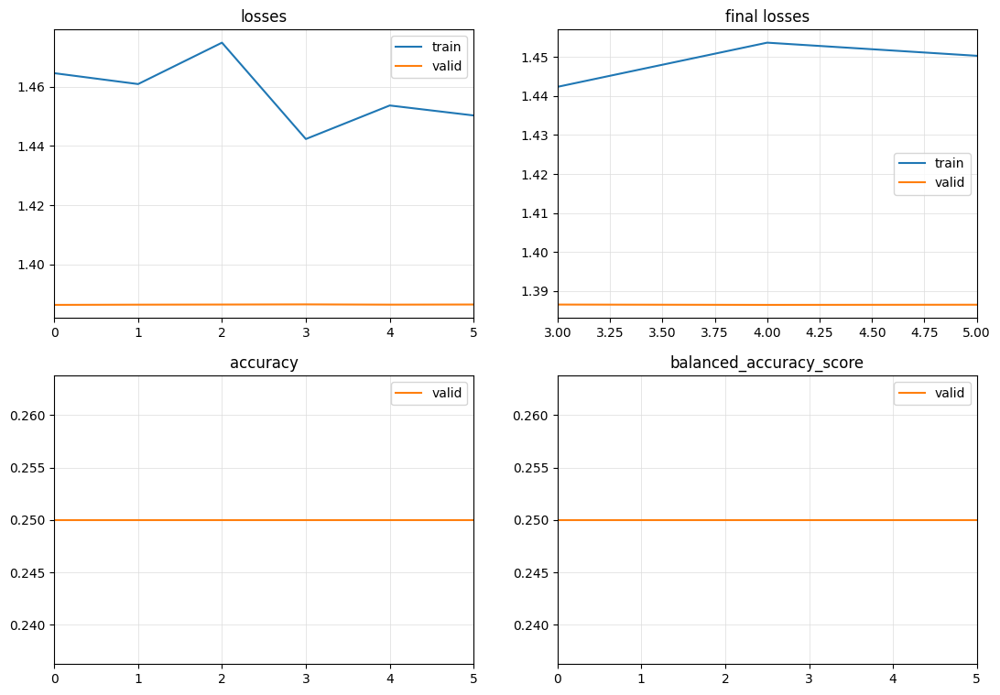

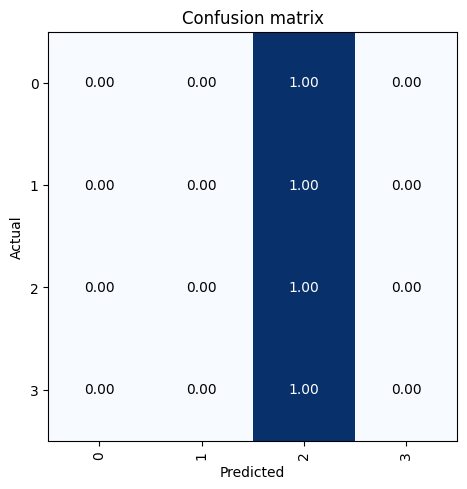

[I 2023-11-05 23:20:23,367] Trial 75 finished with value: 0.25 and parameters: {'num_days': 42, 'batch_size': 8, 'normalize': False, 'n_heads': 33, 'd_model': 4, 'd_k': 5, 'd_v': 1, 'd_ff': 384, 'tst_dropout': 0.8, 'n_layers': 25, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


{'num_days': 14, 'batch_size': 4, 'normalize': True, 'n_heads': 46, 'd_model': 5, 'd_k': 2, 'd_v': 1, 'd_ff': 256, 'tst_dropout': 0.6000000000000001, 'n_layers': 7, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.481061,1.242200,0.468875,0.468875,08:02
1,1.448650,1.223713,0.482500,0.482500,08:01
2,1.337474,1.209991,0.493000,0.493000,07:58
3,1.316668,1.143816,0.531750,0.531750,08:06
4,1.189196,1.123317,0.544750,0.544750,08:02
5,1.221564,1.156910,0.524000,0.524000,07:56
6,1.180093,1.152182,0.521375,0.521375,08:00
7,1.168955,1.106748,0.546375,0.546375,08:03
8,1.187594,1.117785,0.540125,0.540125,08:00
9,1.115370,1.116383,0.544375,0.544375,08:06


No improvement since epoch 7: early stopping


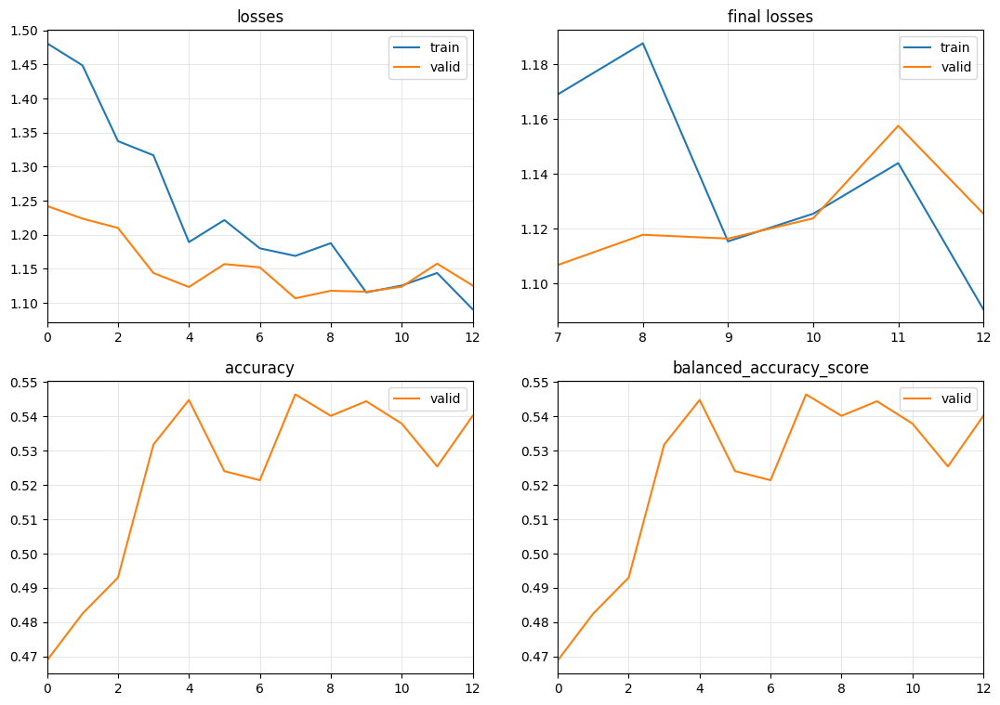

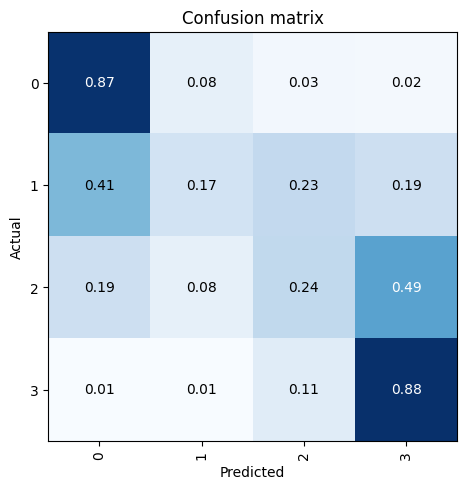

[I 2023-11-06 01:06:00,099] Trial 76 finished with value: 0.546375 and parameters: {'num_days': 14, 'batch_size': 4, 'normalize': True, 'n_heads': 46, 'd_model': 5, 'd_k': 2, 'd_v': 1, 'd_ff': 256, 'tst_dropout': 0.6000000000000001, 'n_layers': 7, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.8, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


{'num_days': 77, 'batch_size': 16, 'normalize': True, 'n_heads': 11, 'd_model': 5, 'd_k': 1, 'd_v': 5, 'd_ff': 256, 'tst_dropout': 0.6000000000000001, 'n_layers': 7, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.419829,1.345496,0.366750,0.366750,06:38
1,1.369384,1.301430,0.394500,0.394500,06:39
2,1.323442,1.271600,0.412250,0.412250,06:39
3,1.228501,1.228913,0.440000,0.440000,06:38
4,1.151545,1.177584,0.456625,0.456625,06:39
5,1.092769,1.142189,0.473625,0.473625,06:38
6,1.067672,1.110480,0.508250,0.508250,06:38
7,1.043007,1.137364,0.486500,0.486500,06:38
8,1.001942,1.139579,0.488875,0.488875,06:39
9,0.984372,1.179189,0.470250,0.470250,06:39


No improvement since epoch 6: early stopping


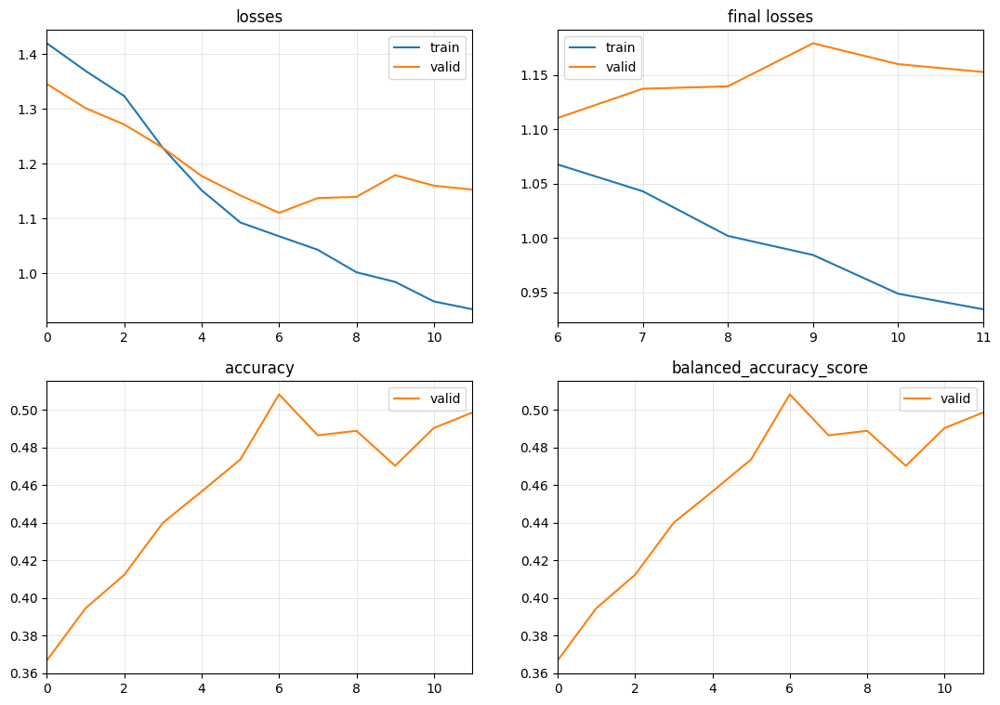

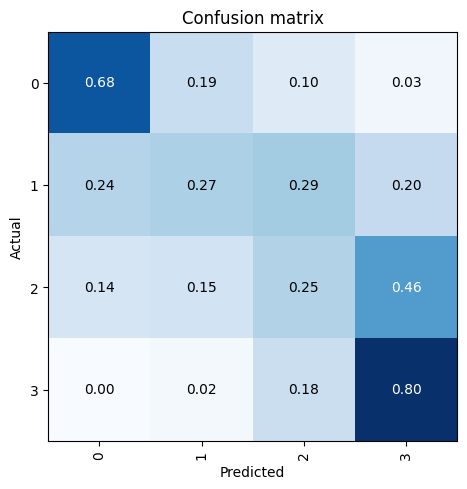

[I 2023-11-06 02:27:03,081] Trial 77 finished with value: 0.50825 and parameters: {'num_days': 77, 'batch_size': 16, 'normalize': True, 'n_heads': 11, 'd_model': 5, 'd_k': 1, 'd_v': 5, 'd_ff': 256, 'tst_dropout': 0.6000000000000001, 'n_layers': 7, 'tst_attn_dropout': 0.4, 'tst_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropy', 'learner_callback': 'None', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


{'num_days': 28, 'batch_size': 4, 'normalize': False, 'n_heads': 11, 'd_model': 4, 'd_k': 2, 'd_v': 4, 'd_ff': 128, 'tst_dropout': 0.0, 'n_layers': 25, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.197651,1.181898,0.481750,0.481750,24:45
1,1.184735,1.155531,0.498375,0.498375,24:39
2,1.164653,1.148358,0.498750,0.498750,24:38
3,1.134021,1.140100,0.503625,0.503625,24:40
4,1.123420,1.118681,0.521250,0.521250,24:44
5,1.081701,1.117161,0.527250,0.527250,24:39
6,1.110652,1.125630,0.526125,0.526125,24:45
7,1.095723,1.142934,0.519125,0.519125,24:58
8,1.049405,1.149018,0.514500,0.514500,24:49
9,1.025633,1.158551,0.503000,0.503000,24:51


No improvement since epoch 5: early stopping


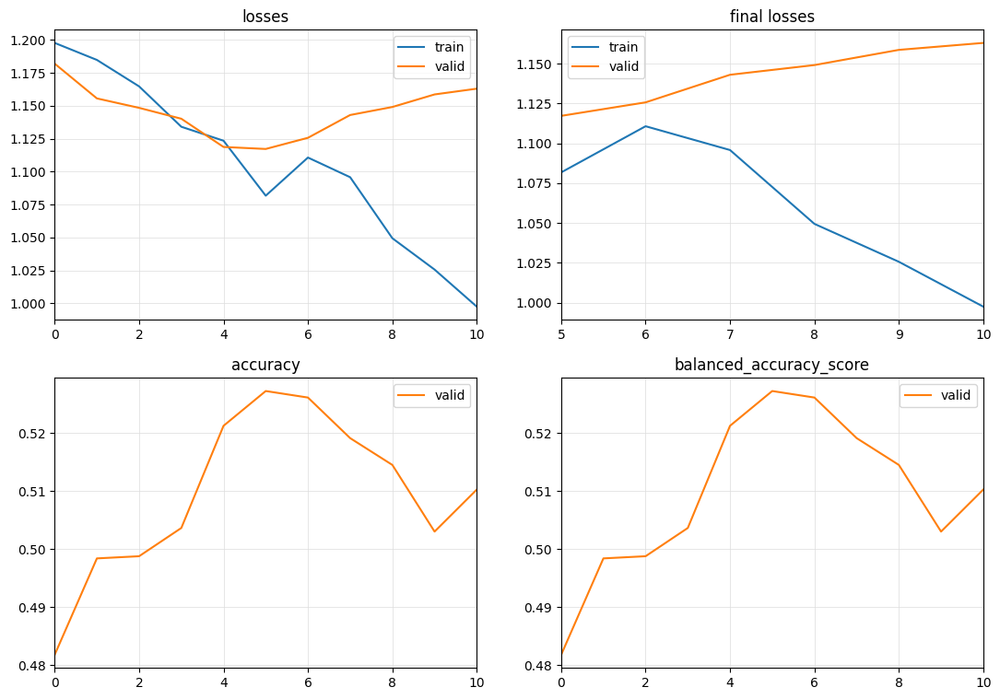

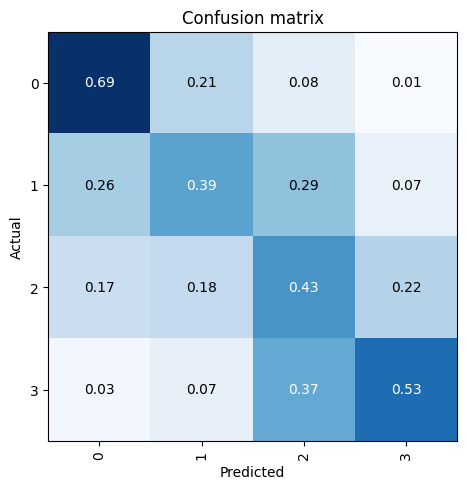

[I 2023-11-06 07:01:39,503] Trial 78 finished with value: 0.52725 and parameters: {'num_days': 28, 'batch_size': 4, 'normalize': False, 'n_heads': 11, 'd_model': 4, 'd_k': 2, 'd_v': 4, 'd_ff': 128, 'tst_dropout': 0.0, 'n_layers': 25, 'tst_attn_dropout': 0.0, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


{'num_days': 42, 'batch_size': 24, 'normalize': False, 'n_heads': 15, 'd_model': 5, 'd_k': 5, 'd_v': 1, 'd_ff': 384, 'tst_dropout': 0.0, 'n_layers': 7, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDFalse'}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.245044,1.183583,0.481500,0.481500,04:19
1,1.191076,1.158682,0.491375,0.491375,04:16
2,1.132497,1.138358,0.521125,0.521125,04:23
3,1.146159,1.140623,0.510750,0.510750,04:21
4,1.125543,1.138997,0.516875,0.516875,04:13
5,1.089246,1.153544,0.492625,0.492625,04:23
6,1.078066,1.149093,0.502125,0.502125,04:18
7,1.072166,1.160405,0.498125,0.498125,04:31


No improvement since epoch 2: early stopping


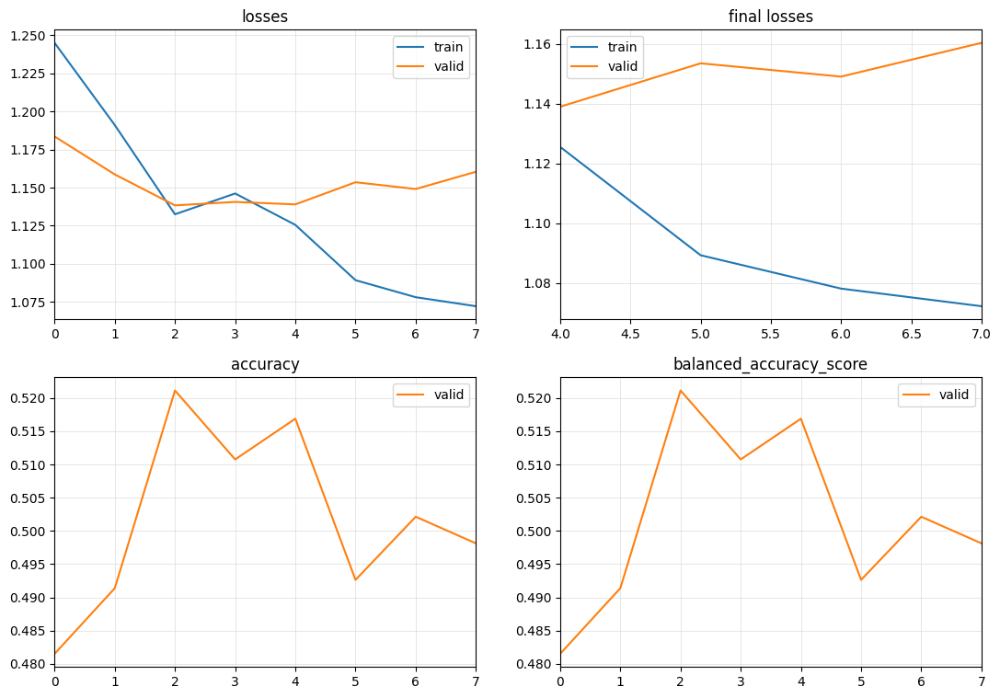

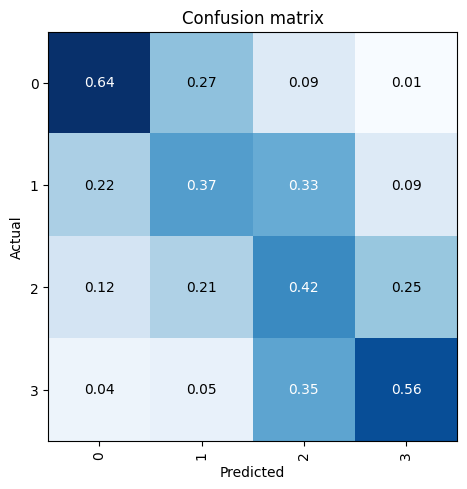

[I 2023-11-06 07:39:48,853] Trial 79 finished with value: 0.5211250000000001 and parameters: {'num_days': 42, 'batch_size': 24, 'normalize': False, 'n_heads': 15, 'd_model': 5, 'd_k': 5, 'd_v': 1, 'd_ff': 384, 'tst_dropout': 0.0, 'n_layers': 7, 'tst_attn_dropout': 0.2, 'tst_fc_dropout': 0.2, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWDFalse'}. Best is trial 50 with value: 0.5745.


In [25]:
study.optimize(objective, n_trials=130)

In [2]:
study = joblib.load("study.pkl")
#study.optimize(objective, n_trials=200)

NameError: name 'joblib' is not defined

FrozenTrial(number=60, state=TrialState.COMPLETE, values=[0.58203125], datetime_start=datetime.datetime(2023, 10, 23, 2, 0, 12, 409543), datetime_complete=datetime.datetime(2023, 10, 23, 2, 7, 58, 715510), params={'num_days': 14, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'XCM', 'window_perc': 1.0, 'xcm_nf': 192, 'xcm_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -3, 'learner_callback': 'None', 'optimizer': 'AdamWD'}, user_attrs={}, system_attrs={'nsga2:generation': 1}, intermediate_values={}, distributions={'num_days': IntDistribution(high=84, log=False, low=7, step=7), 'sample_frac': FloatDistribution(high=1.0, log=False, low=0.1, step=0.1), 'batch_size': IntDistribution(high=100, log=False, low=4, step=32), 'model': CategoricalDistribution(choices=('InceptionTimePlus', 'TST', 'XCM', 'LSTM', 'FCN', 'LSTM_FCNPlus', 'TCN', 'ResNetPlus', 'OmniScaleCNN', 'TSiTPlus', 'XceptionTimePlus')), 'window_perc': FloatDistribution(high=1.0, log=False, low=0.2

In [ ]:
#totry: {'num_days': 14, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'XceptionTimePlus', 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}
#{'num_days': 84, 'sample_frac': 0.5, 'batch_size': 100, 'model': 'TST', 'd_model': 128, 'n_heads': 1, 'd_k': 48, 'd_v': 48, 'd_ff': 128, 'tst_dropout': 0.6000000000000001, 'n_layers': 1, 'tst_fc_dropout': 0.8, 'store_attn': False, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -5, 'learner_callback': 'CutMix1d', 'optimizer': 'AdamNoWD'}
#{'num_days': 21, 'sample_frac': 0.9, 'batch_size': 68, 'model': 'TSiTPlus', 'TSiTPlus_attn_dropout': 0.8, 'TSiTPlus_dropout': 0.4, 'loss_func': 'None', 'learning_rate': -4, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}
#{'num_days': 14, 'sample_frac': 0.8, 'batch_size': 68, 'model': 'XCM', 'window_perc': 1.0, 'xcm_nf': 192, 'xcm_fc_dropout': 0.4, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': -3, 'learner_callback': 'None', 'optimizer': 'AdamWD'}

In [24]:
study.best_params

{'num_days': 14,
 'batch_size': 4,
 'normalize': True,
 'n_heads': 46,
 'd_model': 3,
 'd_k': 2,
 'd_v': 5,
 'd_ff': 384,
 'tst_dropout': 0.6000000000000001,
 'n_layers': 25,
 'tst_attn_dropout': 0.6000000000000001,
 'tst_fc_dropout': 0.0,
 'loss_func': 'LabelSmoothingCrossEntropyFlat',
 'learner_callback': 'None',
 'optimizer': 'AdamWDFalse'}

In [28]:
optuna.importance.get_param_importances(study).keys()

dict_keys(['num_days', 'n_heads', 'tst_dropout', 'n_layers', 'tst_attn_dropout', 'batch_size', 'd_k', 'normalize', 'd_model', 'loss_func', 'tst_fc_dropout', 'd_v', 'learner_callback', 'optimizer', 'd_ff'])

In [31]:
#loop through each param_importance key and plot it with plot_rank
for key in optuna.importance.get_param_importances(study).keys():
    print(key)
    fig = optuna.visualization.plot_rank(study, params=[key])
    fig.show()

num_days


n_heads


tst_dropout


n_layers


batch_size


tst_attn_dropout


d_model


d_k


tst_fc_dropout


loss_func


normalize


d_v


d_ff


learner_callback


optimizer


[I 2023-10-13 16:56:28,386] A new study created in memory with name: no-name-13f17cb1-333d-4218-81a2-6a77de840d3a


{'num_days': 14, 'sample_frac': 0.7000000000000001, 'batch_size': 128, 'itp_depth': 6, 'learning_rate': 0.001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.607278,1.280798,0.455804,0.358025,01:20
1,0.442500,1.443100,0.449286,0.476582,01:20
2,0.370166,1.892364,0.486250,0.394941,01:16
3,0.326444,2.481216,0.419018,0.326510,01:16
4,0.291099,2.338745,0.396429,0.306878,01:16
5,0.255413,2.557266,0.390268,0.303088,01:16
6,0.239884,2.187387,0.459911,0.356749,01:16
7,0.225261,2.628989,0.452589,0.382304,01:16
8,0.208677,1.826985,0.485179,0.390892,01:16
9,0.198231,1.987518,0.476875,0.379973,01:16


No improvement since epoch 2: early stopping


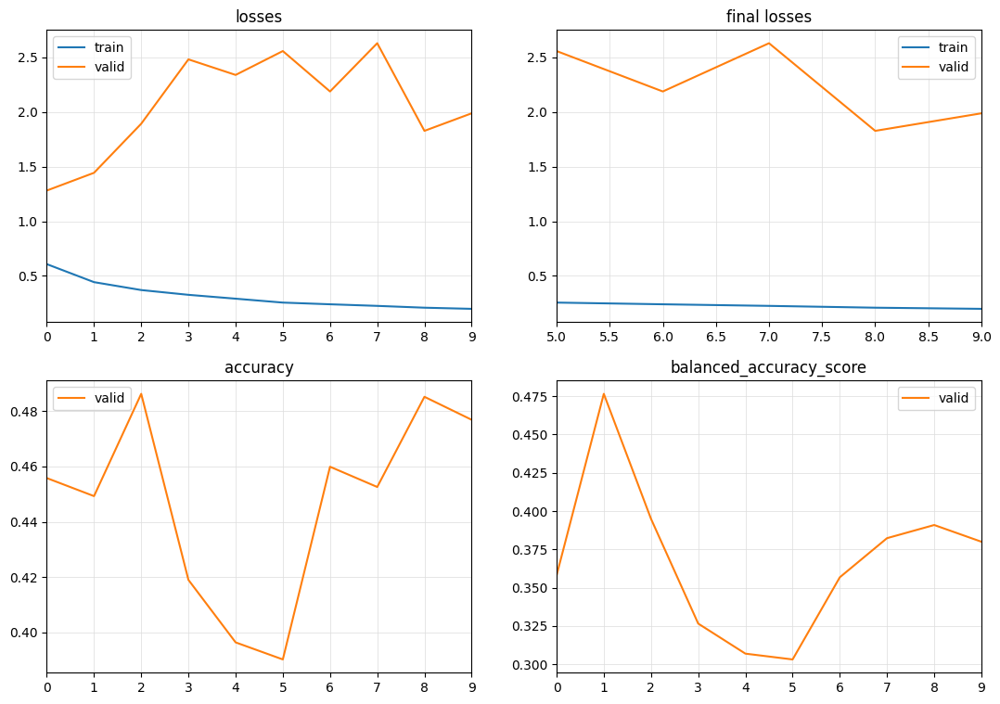

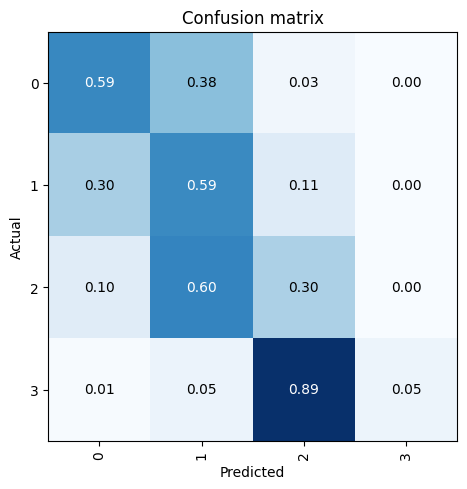

[I 2023-10-13 17:10:24,082] Trial 0 finished with value: 0.4765824864013327 and parameters: {'num_days': 14, 'sample_frac': 0.7000000000000001, 'batch_size': 128, 'itp_depth': 6, 'learning_rate': 0.001}. Best is trial 0 with value: 0.4765824864013327.


{'num_days': 14, 'sample_frac': 0.8, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.0001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.470365,1.195504,0.502578,0.395153,02:37
1,0.332538,1.629833,0.454844,0.355640,02:37
2,0.296461,1.736084,0.443984,0.350016,02:38
3,0.248937,1.951037,0.419141,0.329215,02:37
4,0.237201,1.651222,0.461875,0.379358,02:37
5,0.201307,1.826368,0.464453,0.359979,02:37
6,0.196439,1.991570,0.449688,0.354984,02:38
7,0.190716,2.351180,0.414609,0.332135,02:37


No improvement since epoch 0: early stopping


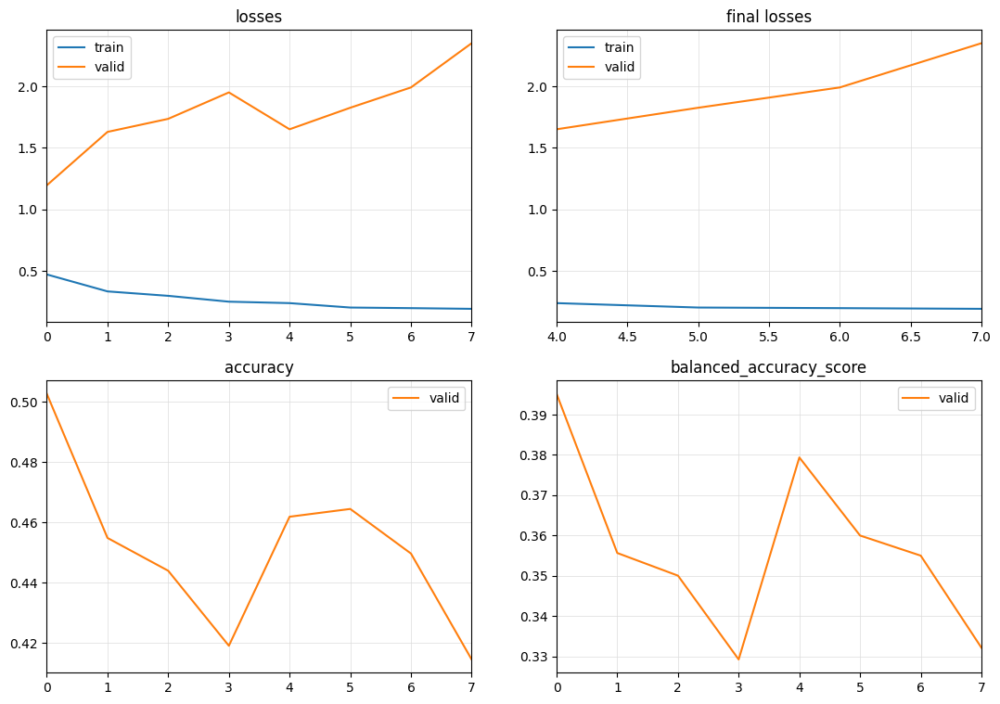

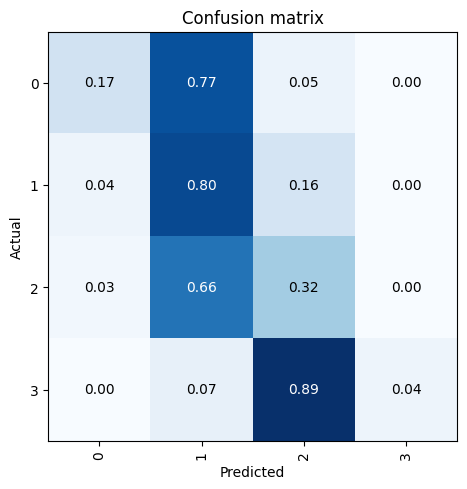

[I 2023-10-13 17:32:13,172] Trial 1 finished with value: 0.3951532940262743 and parameters: {'num_days': 14, 'sample_frac': 0.8, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.0001}. Best is trial 0 with value: 0.4765824864013327.


{'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.0001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.559589,1.215303,0.462109,0.357677,03:43
1,0.407357,1.438972,0.409063,0.359206,03:45
2,0.350577,1.609784,0.411016,0.368178,03:45
3,0.331395,1.727465,0.431094,0.336046,03:47
4,0.287853,1.764174,0.419219,0.324534,03:47
5,0.249181,1.611496,0.438516,0.349180,03:44
6,0.215103,1.785956,0.430156,0.355452,03:50
7,0.253433,1.745522,0.448906,0.350912,03:50


No improvement since epoch 0: early stopping


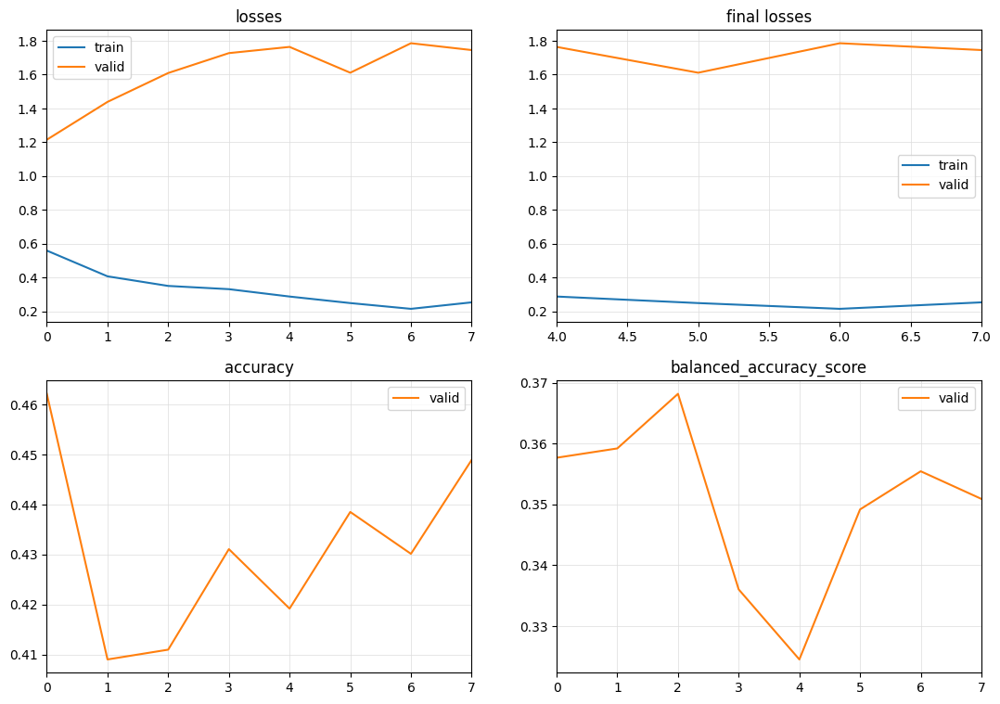

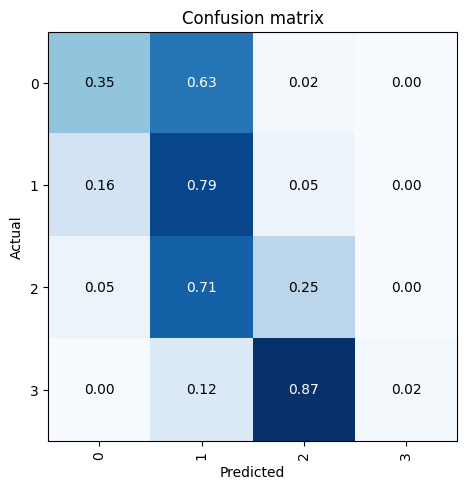

[I 2023-10-13 18:03:26,355] Trial 2 finished with value: 0.3681783208748054 and parameters: {'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.0001}. Best is trial 0 with value: 0.4765824864013327.


{'num_days': 14, 'sample_frac': 0.30000000000000004, 'batch_size': 32, 'itp_depth': 3, 'learning_rate': 1e-05}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.175697,1.169910,0.475417,0.363641,00:24
1,1.071574,1.086171,0.507083,0.387665,00:24
2,1.029147,1.049090,0.557500,0.426433,00:24
3,0.991363,1.027920,0.538333,0.412035,00:24
4,0.971160,1.034358,0.494792,0.379926,00:24
5,0.952996,1.129810,0.448958,0.345398,00:24
6,0.933010,0.985295,0.578958,0.445110,00:24
7,0.922633,1.041377,0.488750,0.376802,00:24
8,0.889221,0.948382,0.620417,0.476808,00:24
9,0.893519,0.975991,0.536458,0.413247,00:24


No improvement since epoch 8: early stopping


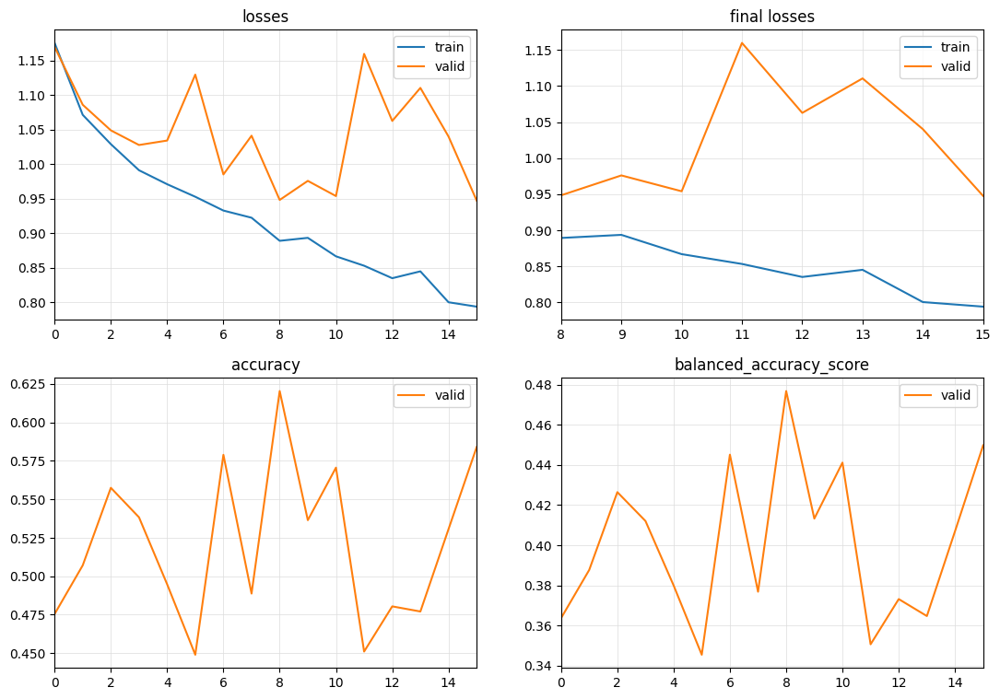

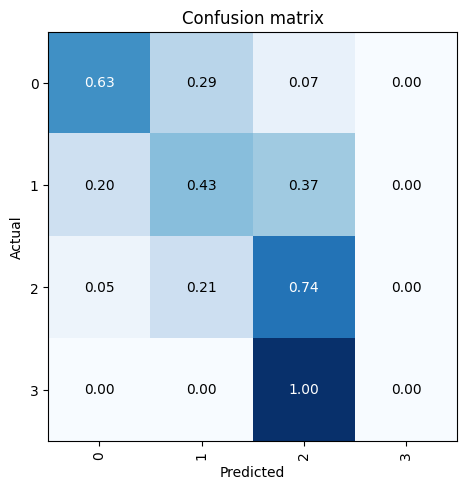

[I 2023-10-13 18:10:35,827] Trial 3 finished with value: 0.47680765207535225 and parameters: {'num_days': 14, 'sample_frac': 0.30000000000000004, 'batch_size': 32, 'itp_depth': 3, 'learning_rate': 1e-05}. Best is trial 3 with value: 0.47680765207535225.


{'num_days': 14, 'sample_frac': 0.8, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.0001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.456929,1.471789,0.420781,0.328160,02:37
1,0.344554,1.545217,0.424766,0.338492,02:38
2,0.284121,2.142159,0.420703,0.326537,02:47
3,0.256347,2.316272,0.463359,0.378105,02:40
4,0.230665,1.847847,0.468984,0.395520,02:37
5,0.204636,1.719991,0.460000,0.372514,02:38
6,0.189563,2.041961,0.449062,0.348783,02:37
7,0.155218,2.182432,0.445781,0.348960,02:37
8,0.174036,2.198436,0.444687,0.349320,02:37
9,0.148893,2.338873,0.454531,0.366358,02:37


No improvement since epoch 4: early stopping


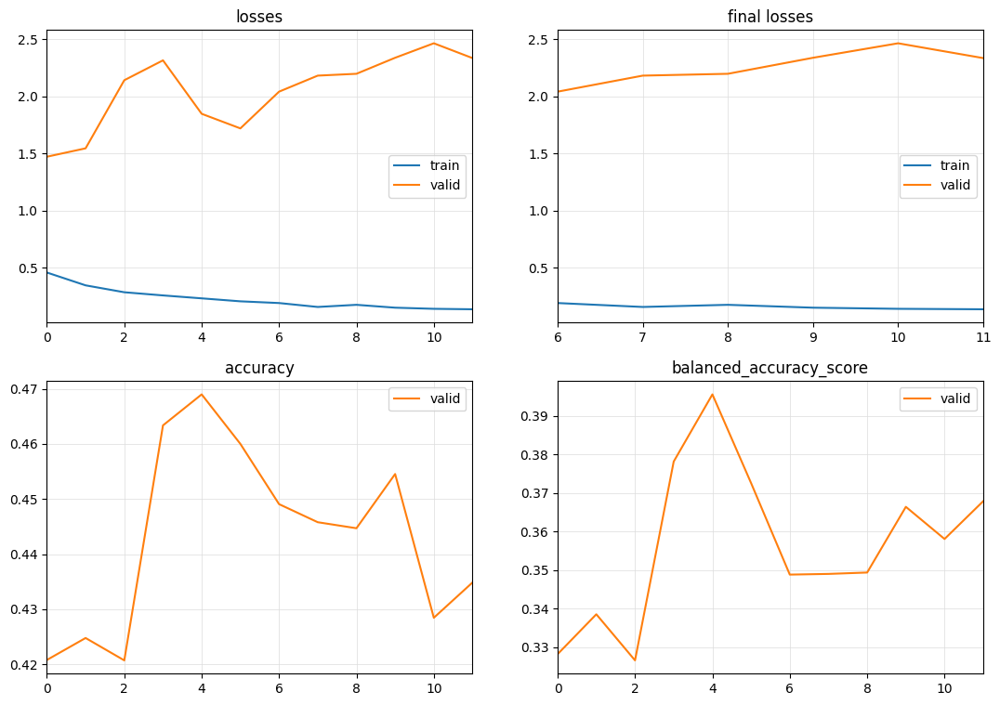

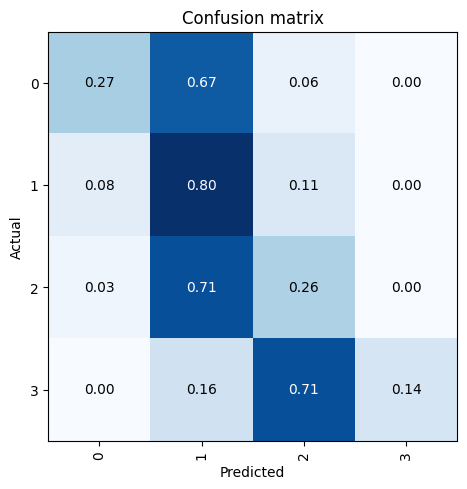

[I 2023-10-13 18:43:09,265] Trial 4 finished with value: 0.39551951852607453 and parameters: {'num_days': 14, 'sample_frac': 0.8, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.0001}. Best is trial 3 with value: 0.47680765207535225.


{'num_days': 14, 'sample_frac': 0.5, 'batch_size': 128, 'itp_depth': 3, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.852090,2.288751,0.323250,0.250658,00:31
1,0.718384,2.205060,0.312375,0.318407,00:31
2,0.657856,2.855433,0.382500,0.296318,00:32
3,0.584284,1.711739,0.474875,0.392410,00:31
4,0.527737,1.733873,0.476500,0.368285,00:32
5,0.460613,2.078783,0.471375,0.369207,00:32
6,0.427468,5.465590,0.381625,0.389406,00:31
7,0.371535,2.476868,0.412000,0.323869,00:32
8,0.345592,4.822392,0.388875,0.316852,00:32
9,0.335887,2.894786,0.436375,0.440551,00:32


No improvement since epoch 4: early stopping


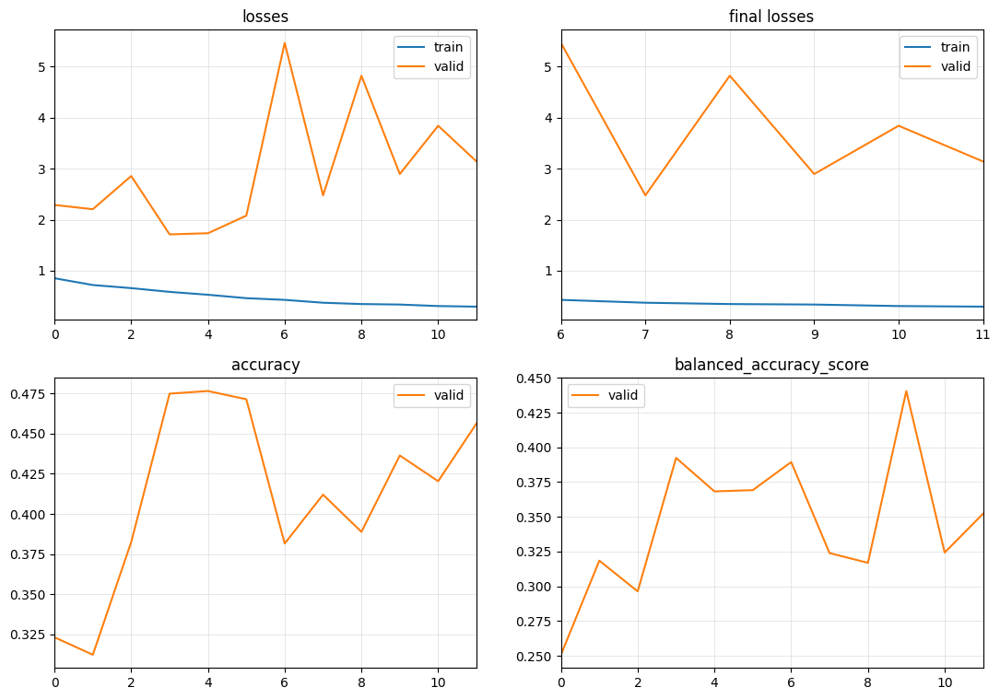

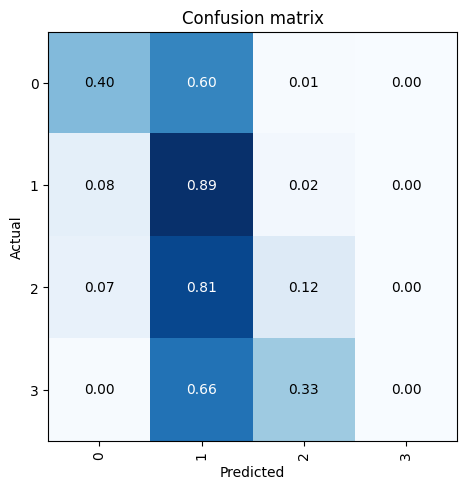

[I 2023-10-13 18:50:09,173] Trial 5 finished with value: 0.4405508585084251 and parameters: {'num_days': 14, 'sample_frac': 0.5, 'batch_size': 128, 'itp_depth': 3, 'learning_rate': 0.01}. Best is trial 3 with value: 0.47680765207535225.


{'num_days': 84, 'sample_frac': 0.7000000000000001, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.0001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.592842,1.132944,0.489018,0.377300,03:18
1,0.501297,1.576449,0.406339,0.313223,03:18
2,0.352497,1.469616,0.463482,0.366292,03:19
3,0.269082,1.634846,0.462411,0.401391,03:19
4,0.291869,1.664050,0.485536,0.380523,03:19
5,0.240689,2.112300,0.432589,0.401632,03:18
6,0.227878,1.670346,0.475893,0.422033,03:17
7,0.227440,1.930517,0.475179,0.418375,03:17


No improvement since epoch 0: early stopping


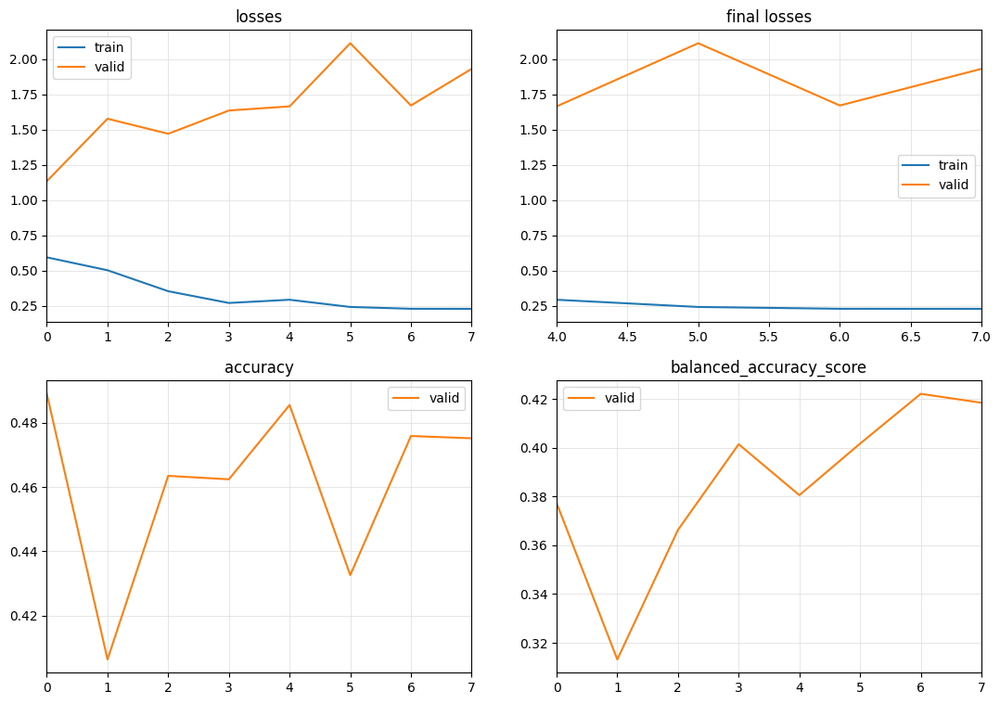

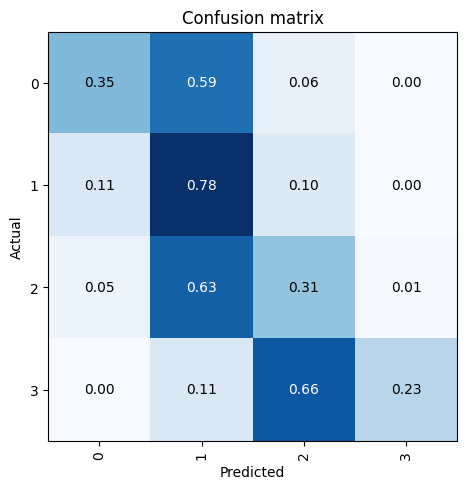

[I 2023-10-13 19:17:33,005] Trial 6 finished with value: 0.4220329931024235 and parameters: {'num_days': 84, 'sample_frac': 0.7000000000000001, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.0001}. Best is trial 3 with value: 0.47680765207535225.


{'num_days': 84, 'sample_frac': 0.7000000000000001, 'batch_size': 32, 'itp_depth': 6, 'learning_rate': 0.001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.592761,1.337899,0.404375,0.325853,01:37
1,0.451524,1.970908,0.398661,0.309268,01:38
2,0.365947,1.374009,0.503214,0.464257,01:37
3,0.318270,1.813855,0.466607,0.421509,01:38
4,0.289890,2.635654,0.348750,0.279822,01:37
5,0.278389,2.335416,0.421964,0.329882,01:37
6,0.251520,2.430261,0.425000,0.336254,01:37
7,0.224294,2.651303,0.438929,0.356766,01:37
8,0.237745,3.441707,0.401875,0.314308,01:37
9,0.199369,2.625773,0.420536,0.352013,01:37


No improvement since epoch 2: early stopping


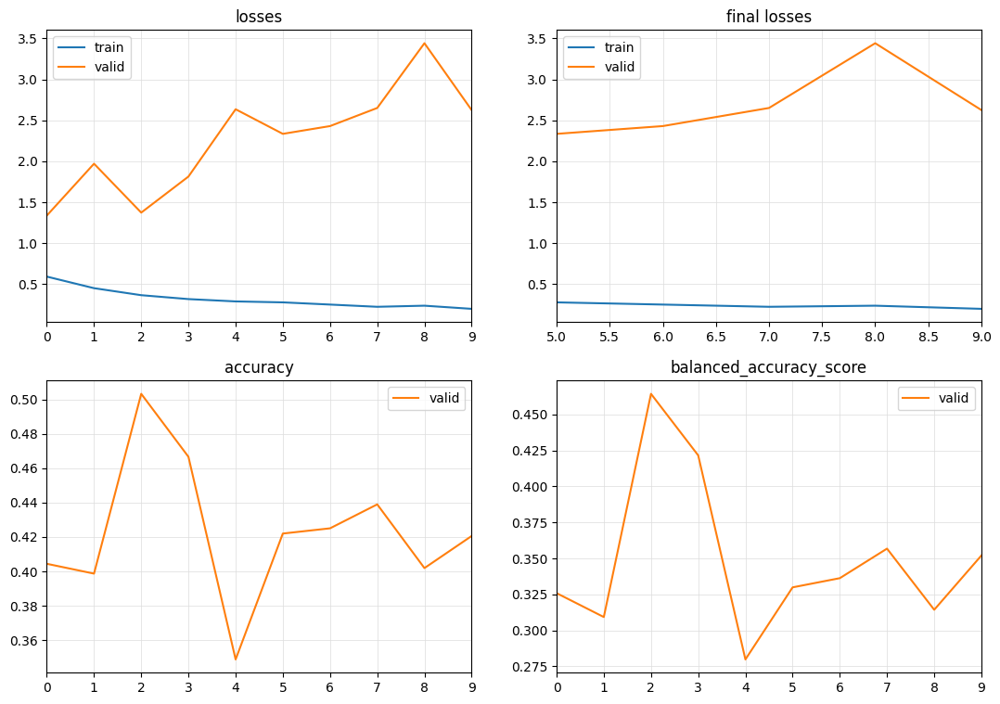

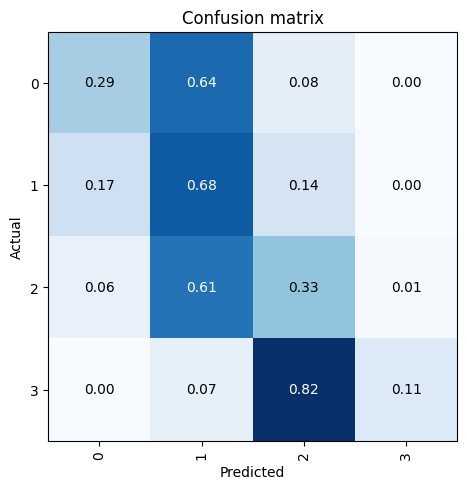

[I 2023-10-13 19:34:33,351] Trial 7 finished with value: 0.46425674953649654 and parameters: {'num_days': 84, 'sample_frac': 0.7000000000000001, 'batch_size': 32, 'itp_depth': 6, 'learning_rate': 0.001}. Best is trial 3 with value: 0.47680765207535225.


{'num_days': 56, 'sample_frac': 0.5, 'batch_size': 128, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.697942,1.841661,0.453125,0.351105,01:15
1,0.593437,1.411160,0.470625,0.363816,01:17
2,0.488925,3.214230,0.371500,0.300602,01:17
3,0.443761,1.634417,0.463750,0.398364,01:17
4,0.383863,2.308193,0.421500,0.339832,01:17
5,0.343287,8.252503,0.318875,0.247043,01:17
6,0.337557,2.260284,0.422500,0.390965,01:17
7,0.299741,2.511285,0.432875,0.334538,01:17
8,0.281158,4.421077,0.412000,0.347291,01:17


No improvement since epoch 1: early stopping


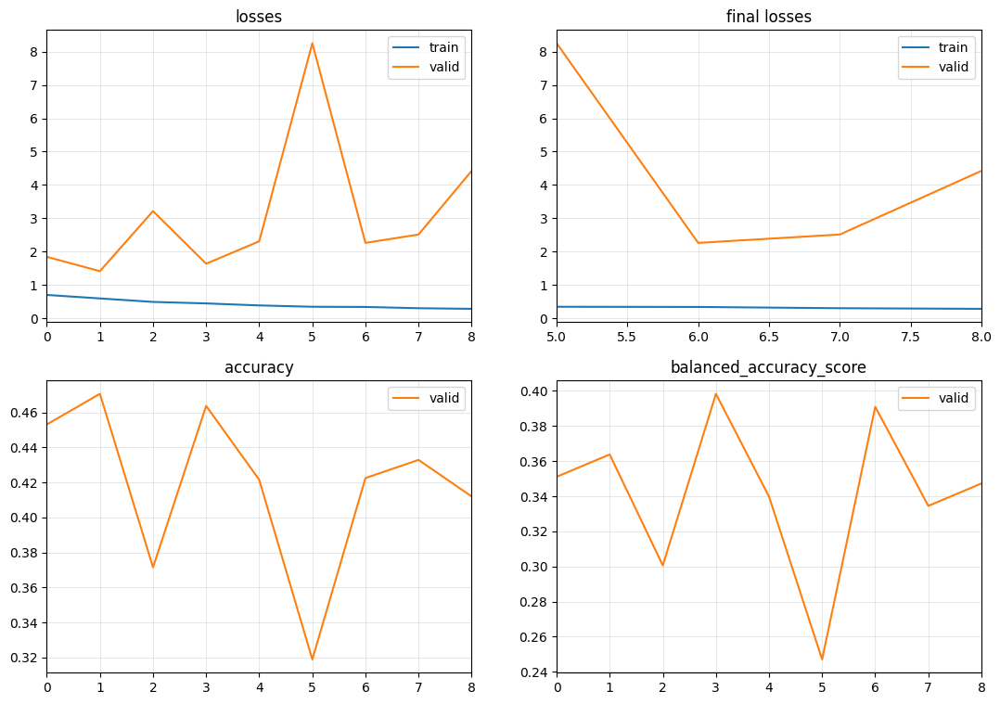

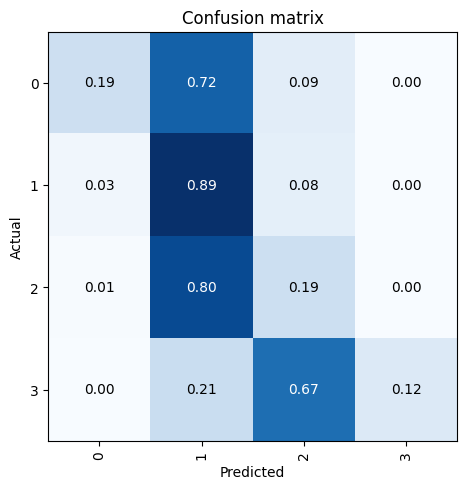

[I 2023-10-13 19:51:42,138] Trial 8 finished with value: 0.3983638160702546 and parameters: {'num_days': 56, 'sample_frac': 0.5, 'batch_size': 128, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 3 with value: 0.47680765207535225.


{'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.789853,1.002990,0.525312,0.403502,01:16
1,0.777104,0.988920,0.573750,0.484784,01:16
2,0.754064,1.130085,0.503438,0.414835,01:17
3,0.750644,2.161935,0.387500,0.336889,01:17
4,0.709441,1.346261,0.506250,0.408268,01:16
5,0.663471,1.189328,0.507187,0.465550,01:16
6,0.670997,1.209635,0.525937,0.509401,01:16
7,0.621695,1.149691,0.516563,0.401786,01:16
8,0.598408,1.216987,0.515000,0.397388,01:16


No improvement since epoch 1: early stopping


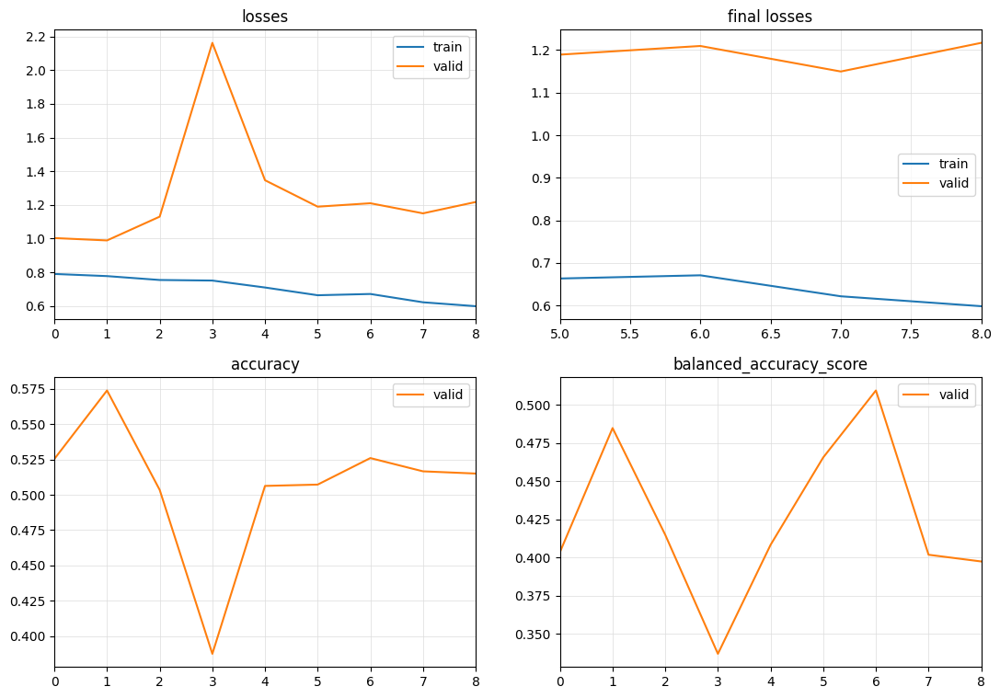

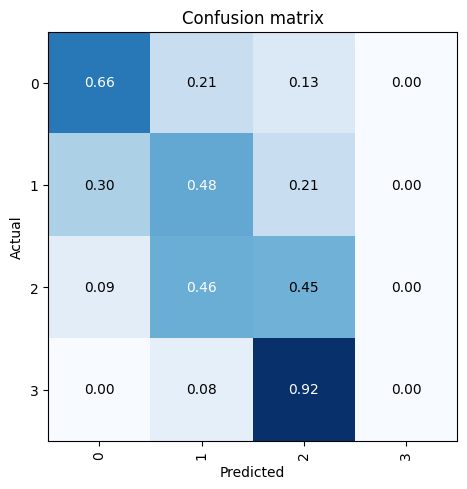

[I 2023-10-13 20:03:52,430] Trial 9 finished with value: 0.5094013710537073 and parameters: {'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 28, 'sample_frac': 0.1, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.068539,2.400253,0.208750,0.166001,00:21
1,0.835435,2.298993,0.373750,0.285989,00:21
2,0.746215,1.145639,0.541250,0.419752,00:21
3,0.694673,1.369581,0.517500,0.401058,00:21
4,0.648955,1.395466,0.494375,0.392886,00:21
5,0.635403,1.816068,0.450625,0.354509,00:21
6,0.588875,1.907611,0.528750,0.410306,00:21
7,0.555690,1.390058,0.503750,0.393439,00:21
8,0.524954,7.180263,0.355000,0.320527,00:21
9,0.486861,1.713074,0.423125,0.338485,00:21


No improvement since epoch 2: early stopping


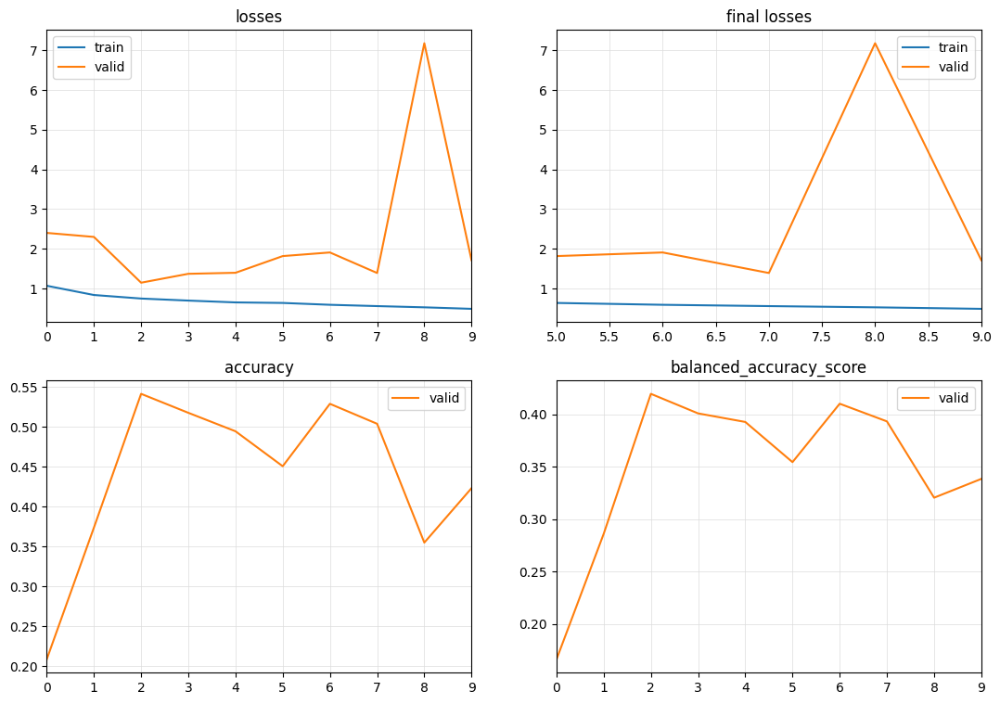

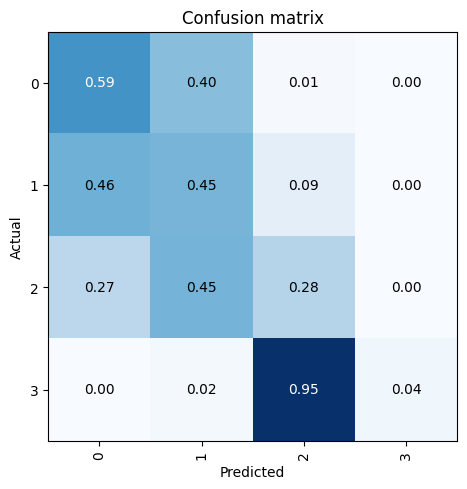

[I 2023-10-13 20:08:01,191] Trial 10 finished with value: 0.41975154898707545 and parameters: {'num_days': 28, 'sample_frac': 0.1, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 3, 'learning_rate': 1e-05}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.115430,1.101919,0.502187,0.380505,00:34
1,1.024666,1.127018,0.411875,0.317973,00:34
2,1.004618,1.108026,0.424375,0.319843,00:34
3,1.000619,1.061598,0.485625,0.369383,00:34
4,0.959899,1.013755,0.558125,0.426558,00:34
5,0.948291,0.976680,0.570312,0.436961,00:35
6,0.949044,1.004003,0.557187,0.430849,00:34
7,0.962104,0.999624,0.556562,0.427296,00:35
8,0.844519,1.000581,0.586875,0.451160,00:35
9,0.892080,1.257814,0.420625,0.318231,00:35


No improvement since epoch 8: early stopping


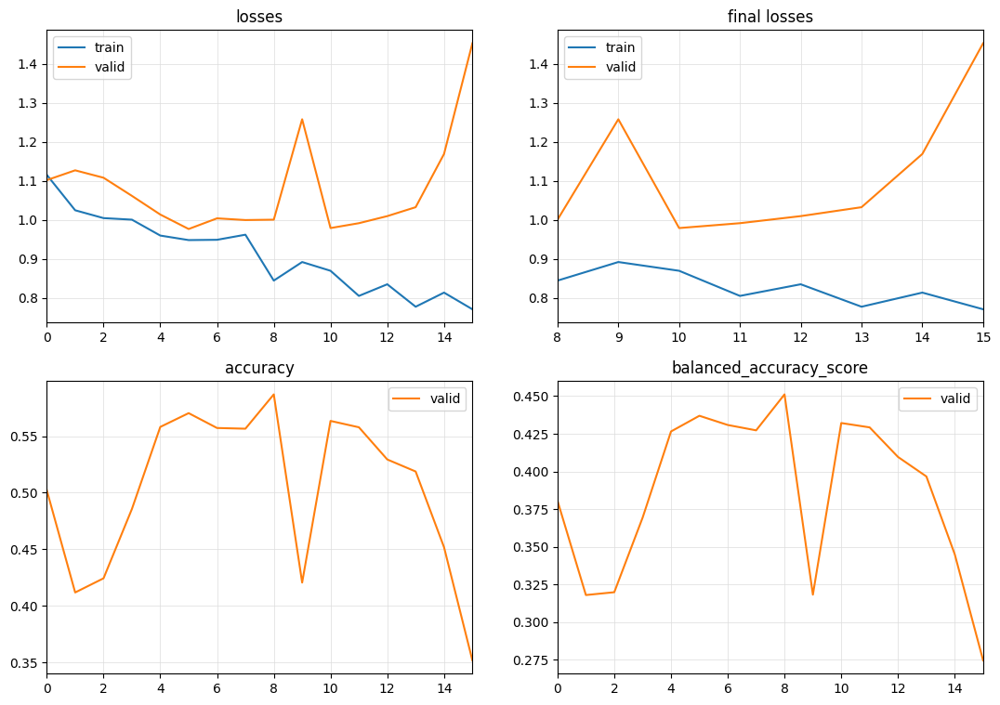

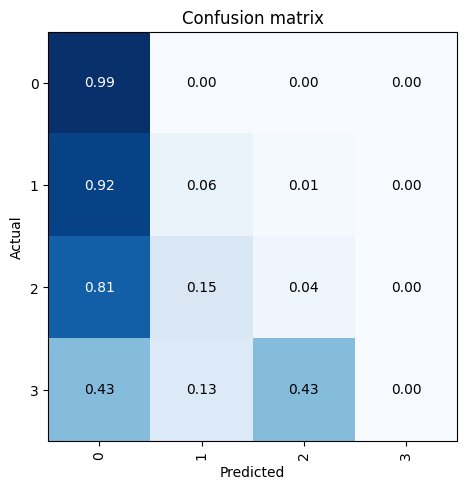

[I 2023-10-13 20:17:56,343] Trial 11 finished with value: 0.4511596446977517 and parameters: {'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 3, 'learning_rate': 1e-05}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 56, 'sample_frac': 0.30000000000000004, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 1e-05}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.038013,1.174826,0.467708,0.362742,01:05
1,0.846113,1.116897,0.516250,0.399525,01:05
2,0.758885,1.058320,0.527500,0.407696,01:05
3,0.662594,1.080804,0.523542,0.404745,01:05
4,0.596871,1.097582,0.505625,0.390846,01:05
5,0.539793,1.075920,0.530625,0.410024,01:05
6,0.494844,1.172434,0.489375,0.378163,01:05
7,0.459252,1.156519,0.507917,0.392506,01:05
8,0.402929,1.162402,0.511042,0.405659,01:05
9,0.381203,1.346173,0.471667,0.367548,01:05


No improvement since epoch 5: early stopping


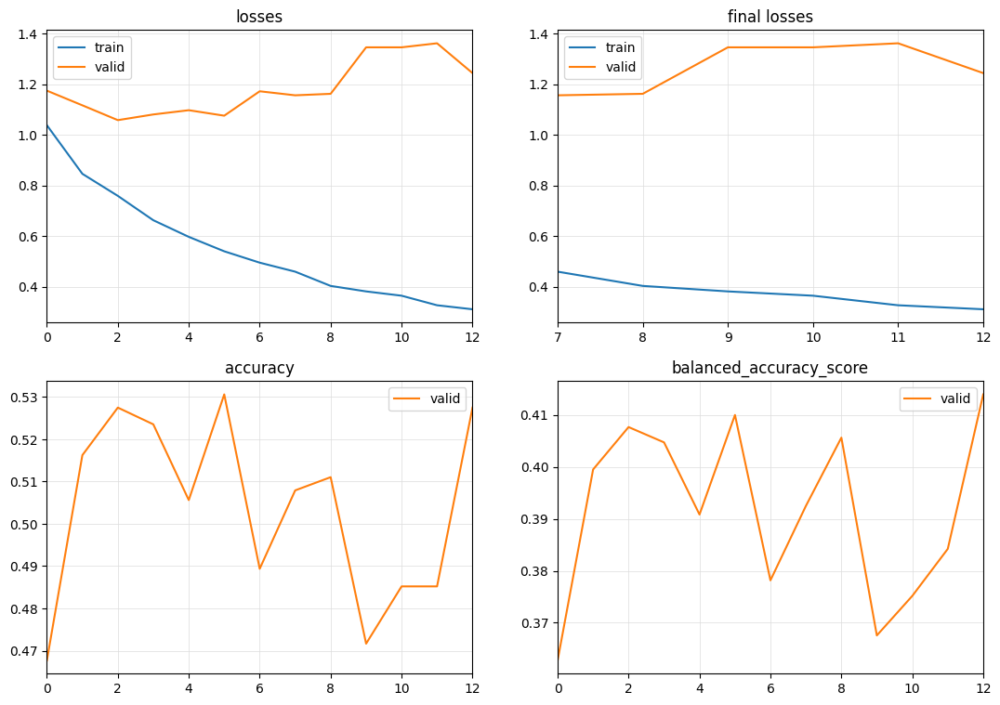

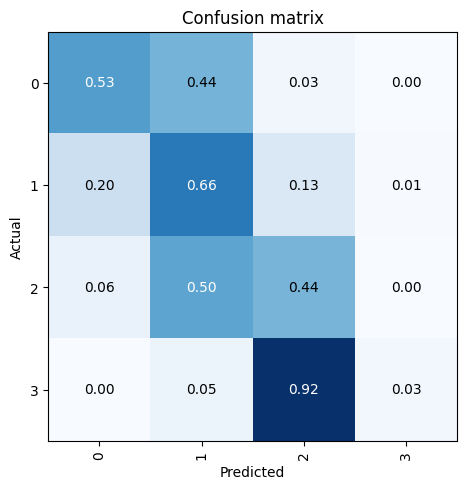

[I 2023-10-13 20:32:41,806] Trial 12 finished with value: 0.413992220705905 and parameters: {'num_days': 56, 'sample_frac': 0.30000000000000004, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 1e-05}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 28, 'sample_frac': 0.30000000000000004, 'batch_size': 8, 'itp_depth': 3, 'learning_rate': 1e-05}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,1.087083,1.091036,0.442083,0.341701,00:52
1,1.005380,1.044654,0.544375,0.421260,00:52
2,0.986206,1.012543,0.585833,0.453311,00:52
3,0.922227,1.263726,0.356667,0.278005,00:52
4,0.937541,1.023619,0.532083,0.411133,00:53
5,0.912908,1.146808,0.423333,0.329734,00:52
6,0.884632,1.217533,0.401667,0.309175,00:52
7,0.831125,0.969683,0.570625,0.441806,00:52
8,0.846278,1.029724,0.509167,0.393840,00:52
9,0.817828,1.028565,0.499167,0.385817,00:52


No improvement since epoch 2: early stopping


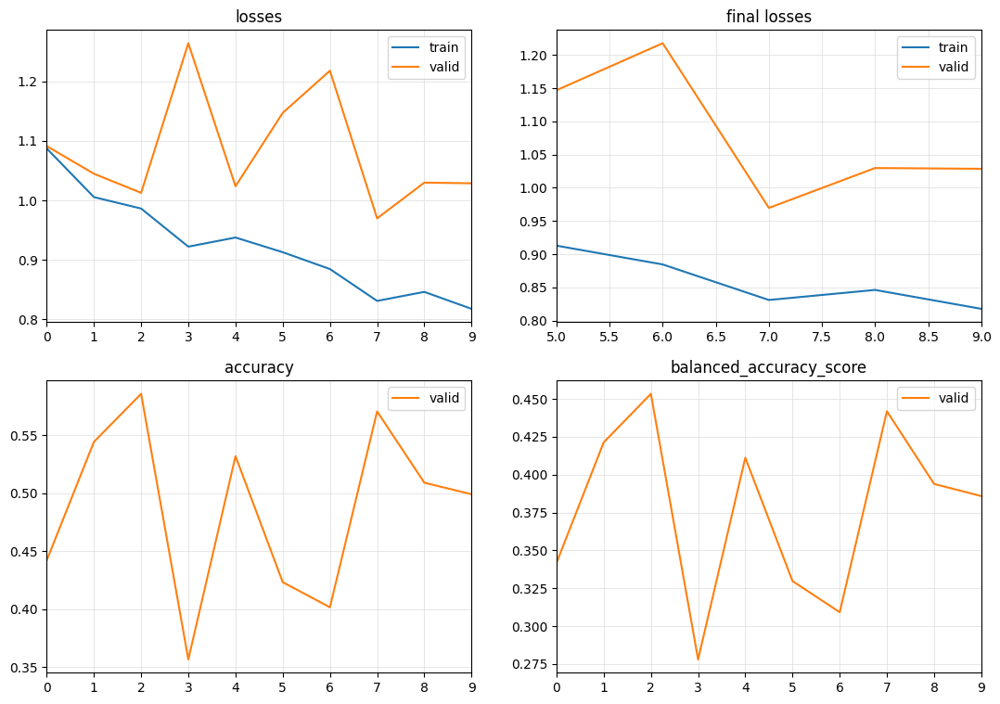

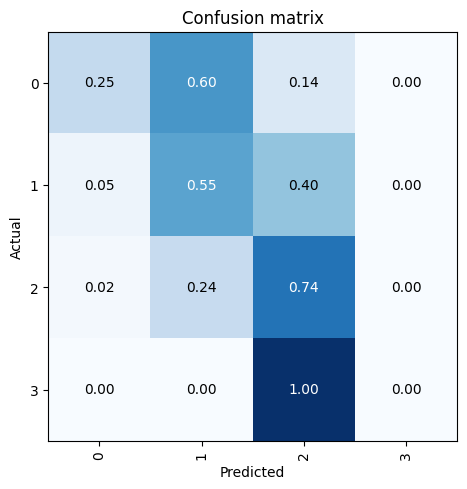

[I 2023-10-13 20:42:08,092] Trial 13 finished with value: 0.4533105525014945 and parameters: {'num_days': 28, 'sample_frac': 0.30000000000000004, 'batch_size': 8, 'itp_depth': 3, 'learning_rate': 1e-05}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 14, 'sample_frac': 0.4, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 1e-05}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.902363,1.023857,0.566875,0.436864,01:18
1,0.753444,0.966174,0.580938,0.449086,01:18
2,0.669884,1.181638,0.486406,0.377439,01:18
3,0.614238,0.984694,0.565000,0.436367,01:18
4,0.527324,1.021226,0.557031,0.429818,01:18
5,0.480153,1.163833,0.498437,0.387497,01:18
6,0.452801,1.343124,0.438750,0.339881,01:18
7,0.414094,1.253082,0.496250,0.390462,01:18
8,0.397687,1.284792,0.478281,0.371063,01:19


No improvement since epoch 1: early stopping


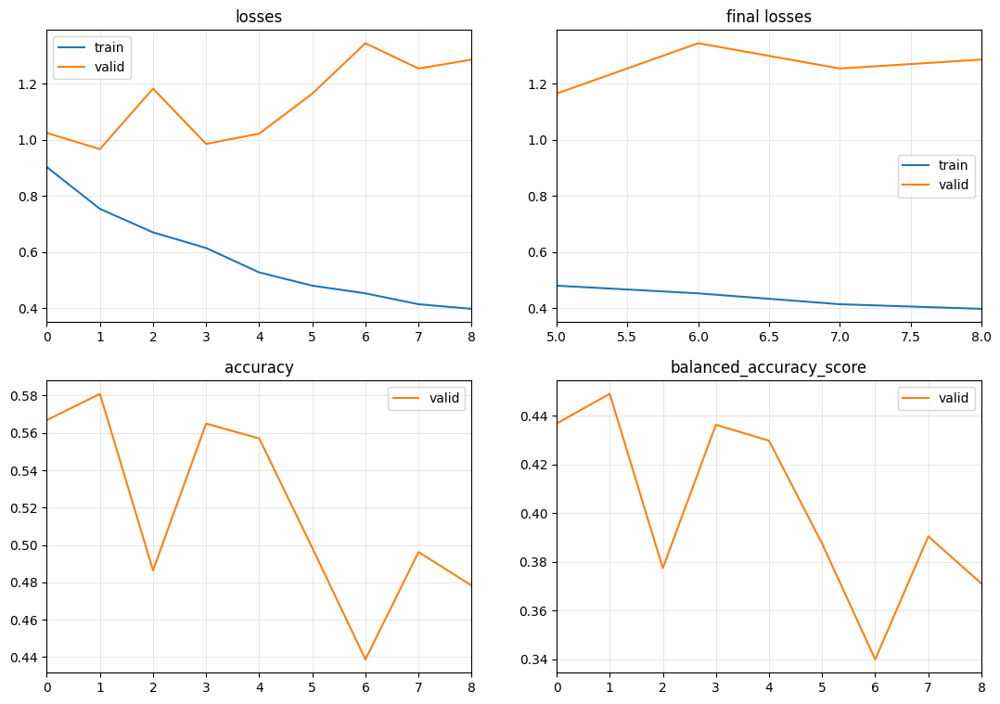

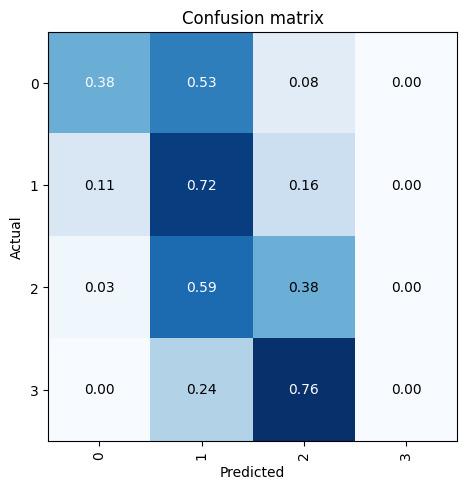

[I 2023-10-13 20:54:37,031] Trial 14 finished with value: 0.44908642836024154 and parameters: {'num_days': 14, 'sample_frac': 0.4, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 1e-05}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 28, 'sample_frac': 0.1, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.945804,1.327602,0.347500,0.270586,00:48
1,0.832976,3.212616,0.303125,0.235430,00:48
2,0.767319,1.431454,0.452500,0.355354,00:48
3,0.734469,1.053785,0.526250,0.440982,00:48
4,0.754236,0.980565,0.546875,0.440883,00:48
5,0.679316,1.201786,0.521875,0.404871,00:48
6,0.690542,1.090841,0.510625,0.400717,00:48
7,0.679038,1.318485,0.531875,0.412602,00:48
8,0.610247,0.990329,0.541875,0.424672,00:48
9,0.654854,1.074595,0.548125,0.442033,00:48


No improvement since epoch 13: early stopping


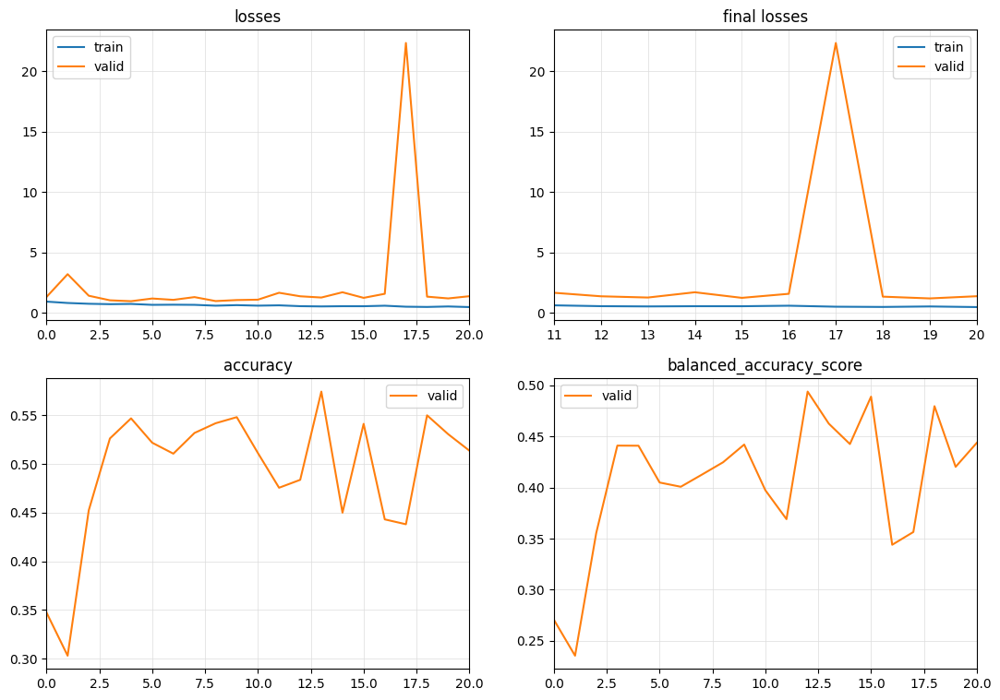

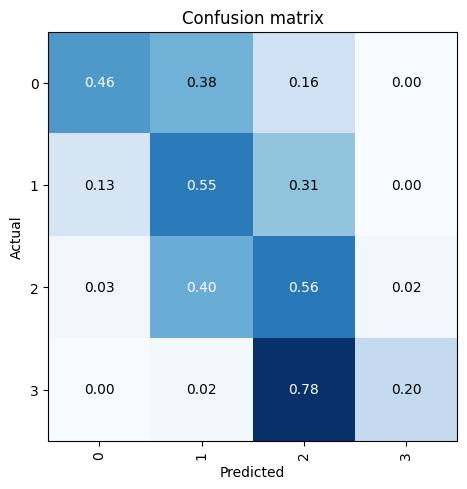

[I 2023-10-13 21:12:15,652] Trial 15 finished with value: 0.4938383827401973 and parameters: {'num_days': 28, 'sample_frac': 0.1, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 28, 'sample_frac': 0.1, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.936721,0.962981,0.492500,0.377360,00:48
1,0.878235,0.996240,0.555000,0.427977,00:48
2,0.833354,0.984526,0.557500,0.429686,00:49
3,0.783194,1.489067,0.481875,0.382033,00:48
4,0.755344,1.266566,0.479375,0.367370,00:48
5,0.654138,1.679275,0.490625,0.383061,00:48
6,0.691035,1.001937,0.535625,0.435620,00:49
7,0.658397,1.093487,0.463750,0.355595,00:49
8,0.598416,1.078982,0.534375,0.422616,00:48
9,0.643658,1.346928,0.488125,0.374630,00:48


No improvement since epoch 2: early stopping


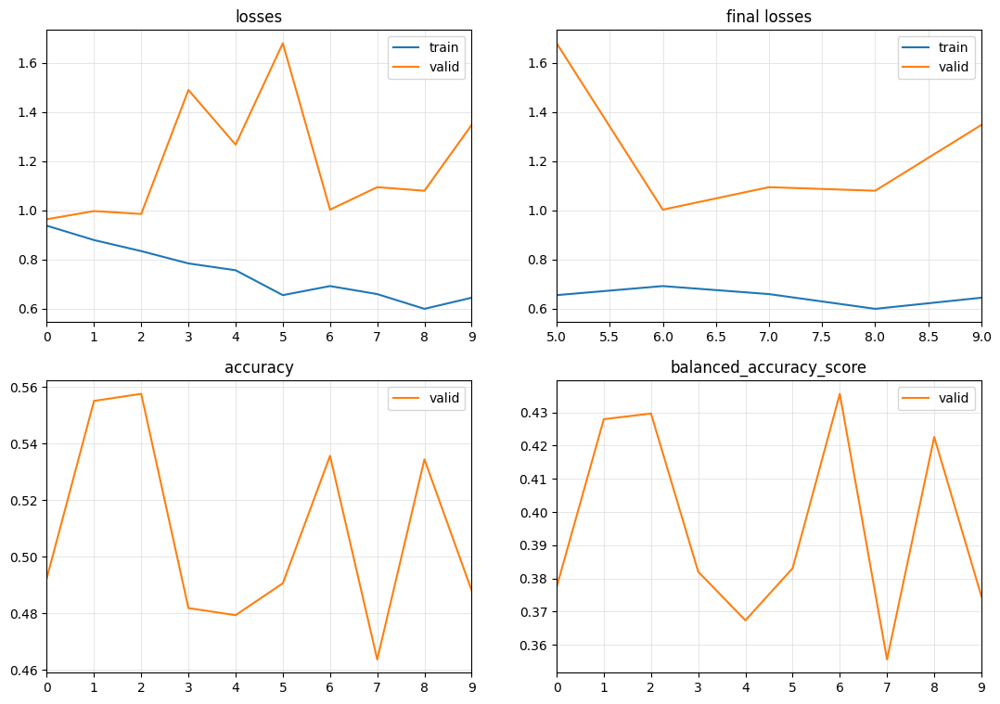

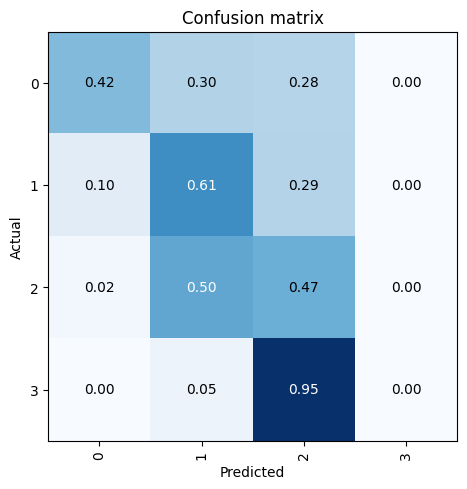

[I 2023-10-13 21:21:00,643] Trial 16 finished with value: 0.4356204121559665 and parameters: {'num_days': 28, 'sample_frac': 0.1, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 9 with value: 0.5094013710537073.


{'num_days': 28, 'sample_frac': 0.1, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.891829,1.171574,0.488125,0.423473,00:49
1,0.807882,1.884623,0.406875,0.312053,00:49
2,0.793739,1.020363,0.495625,0.375665,00:50
3,0.769740,1.522635,0.447500,0.519930,00:48
4,0.747462,0.943043,0.550625,0.426075,00:48
5,0.713357,1.066427,0.520000,0.402758,00:48
6,0.679742,1.235814,0.523125,0.434036,00:48
7,0.661291,1.350887,0.455625,0.385894,00:48
8,0.657369,1.131622,0.558750,0.444841,00:48
9,0.613144,1.245199,0.525000,0.410796,00:48


No improvement since epoch 13: early stopping


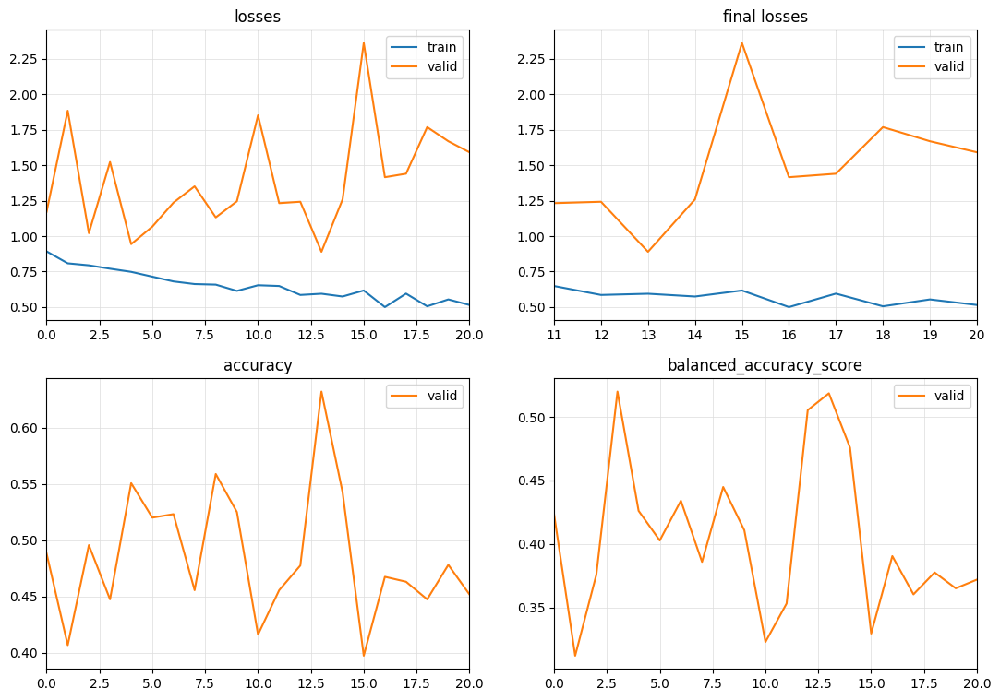

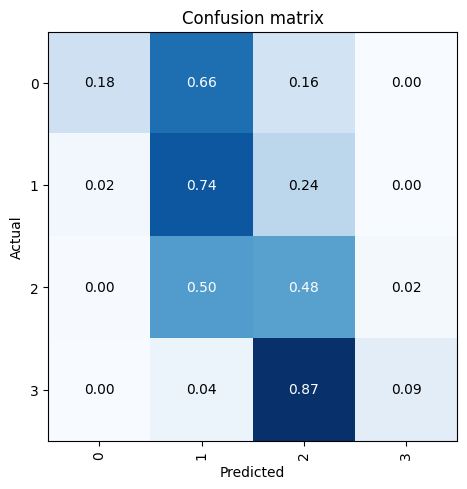

[I 2023-10-13 21:43:54,800] Trial 17 finished with value: 0.5199303369701481 and parameters: {'num_days': 28, 'sample_frac': 0.1, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 17 with value: 0.5199303369701481.


{'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.675197,1.372476,0.485000,0.375242,08:04
1,0.548581,1.445138,0.515938,0.407191,08:05
2,0.487177,1.007564,0.616813,0.530881,08:05
3,0.489789,1.111415,0.526312,0.472788,08:05
4,0.501053,1.704129,0.420312,0.354040,08:05
5,0.483694,1.334645,0.541313,0.456278,08:06
6,0.391924,1.334766,0.516500,0.483754,08:05
7,0.470748,1.123978,0.524750,0.468464,08:05
8,0.416208,1.475392,0.483938,0.422627,08:05
9,0.442738,1.232581,0.495750,0.422079,08:05


No improvement since epoch 2: early stopping


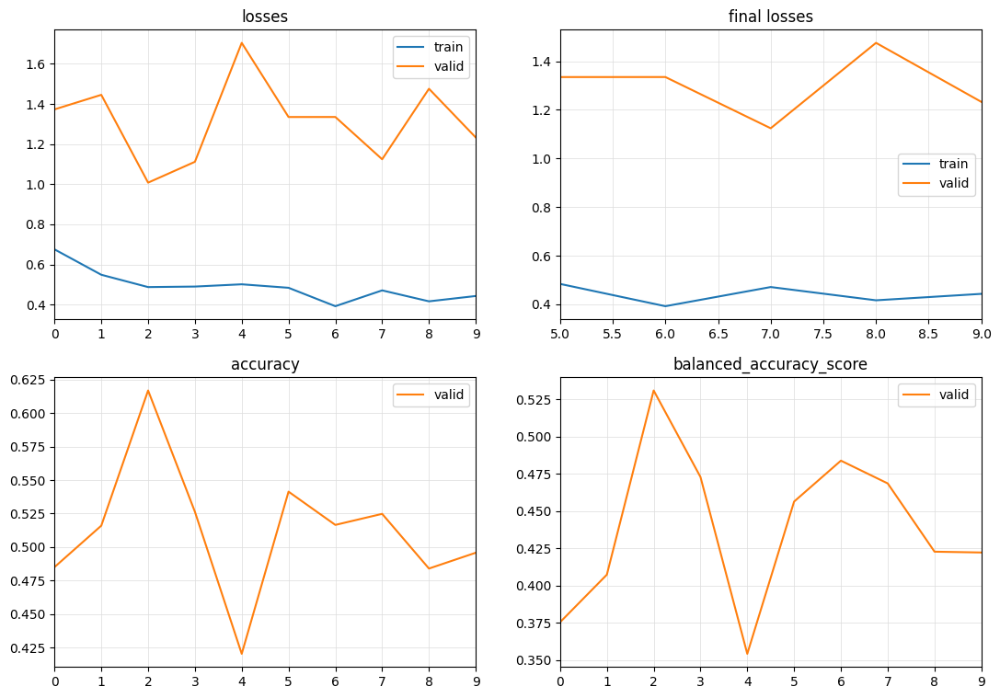

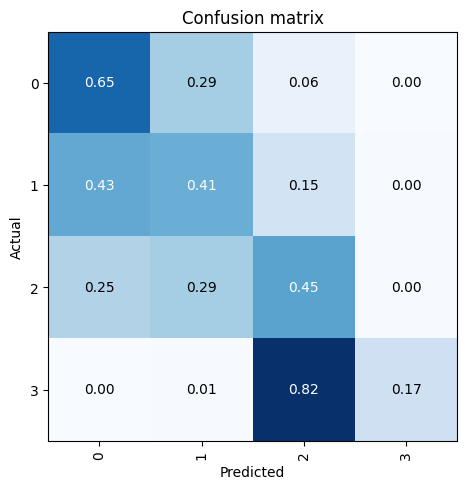

[I 2023-10-13 23:06:08,957] Trial 18 finished with value: 0.5308813818119389 and parameters: {'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 18 with value: 0.5308813818119389.


{'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.669574,1.551786,0.424313,0.356078,08:06
1,0.517892,1.169126,0.493813,0.428798,08:05
2,0.556778,1.142452,0.506000,0.420667,08:06
3,0.456324,1.306745,0.494938,0.428414,08:06
4,0.458438,2.274131,0.374375,0.350013,08:06
5,0.469600,1.357574,0.510188,0.412736,08:07
6,0.459936,1.213863,0.479313,0.407445,08:07
7,0.408826,2.019137,0.420625,0.325829,08:06
8,0.402828,2.188230,0.398625,0.469523,08:06
9,0.416233,2.027326,0.419562,0.369626,08:06


No improvement since epoch 12: early stopping


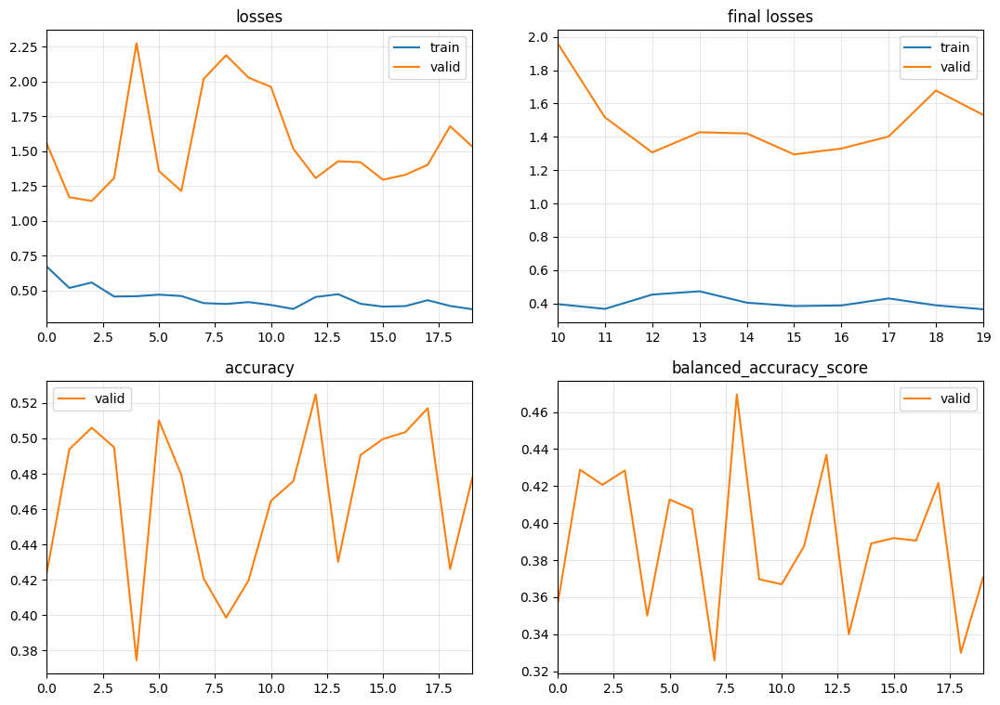

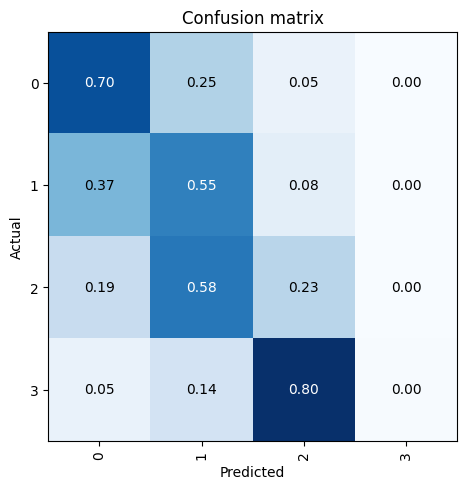

[I 2023-10-14 01:49:40,330] Trial 19 finished with value: 0.46952308981331914 and parameters: {'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 18 with value: 0.5308813818119389.


{'num_days': 84, 'sample_frac': 1.0, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.551790,1.376638,0.510375,0.394184,03:36
1,0.440469,2.389018,0.488250,0.377787,03:36
2,0.386331,4.203073,0.404125,0.465191,03:36
3,0.341304,2.616187,0.470625,0.364391,03:35
4,0.323953,2.242436,0.503500,0.390112,03:35
5,0.296397,2.584800,0.465125,0.378063,03:36
6,0.293138,1.831297,0.468375,0.423303,03:35
7,0.272271,3.650401,0.399250,0.312258,03:37


No improvement since epoch 0: early stopping


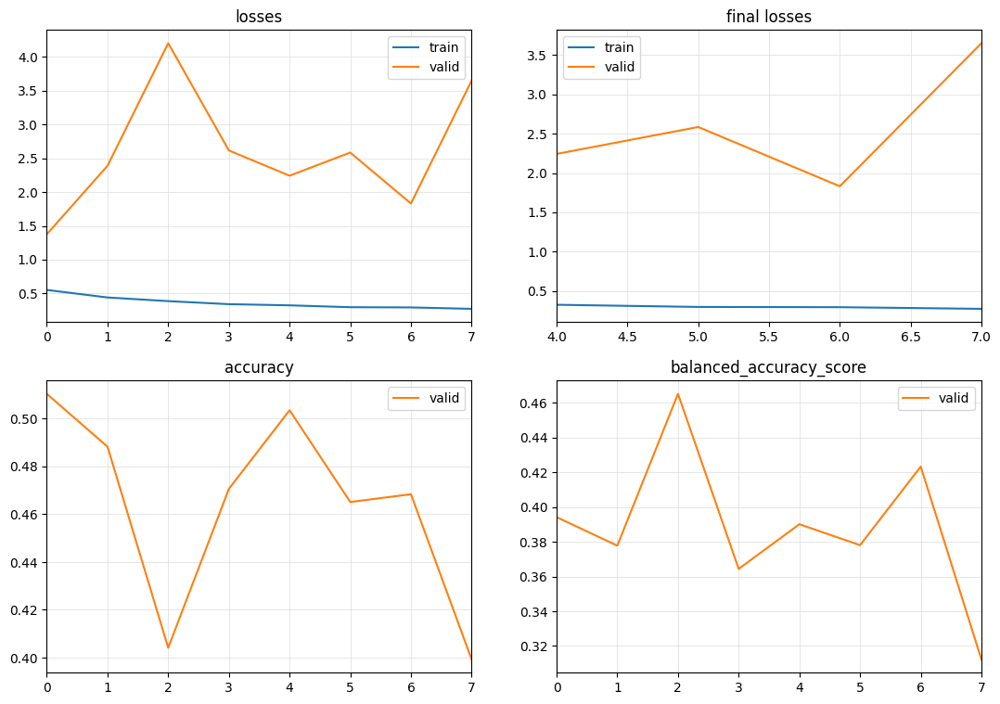

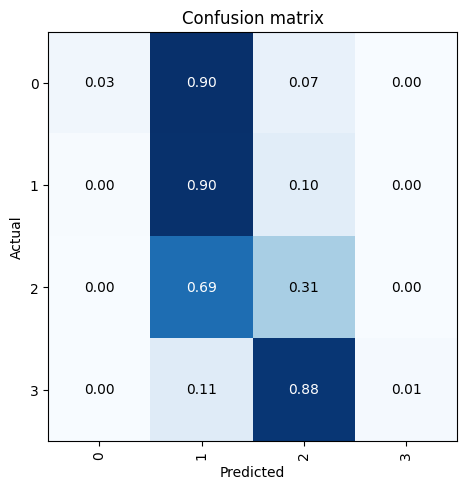

[I 2023-10-14 02:19:21,771] Trial 20 finished with value: 0.4651910113438077 and parameters: {'num_days': 84, 'sample_frac': 1.0, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 18 with value: 0.5308813818119389.


{'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.776526,1.325448,0.436875,0.339795,01:15
1,0.748312,1.052607,0.502500,0.390433,01:16
2,0.705753,1.167653,0.459375,0.364794,01:16
3,0.661400,0.996187,0.551250,0.427617,01:16
4,0.655073,1.064768,0.577187,0.453343,01:16
5,0.628204,1.072332,0.536563,0.424710,01:16
6,0.673730,1.237206,0.523125,0.415604,01:16
7,0.595550,1.173678,0.535625,0.434670,01:16
8,0.576442,1.054623,0.539688,0.447852,01:16
9,0.582382,1.248135,0.484688,0.398943,01:16


No improvement since epoch 4: early stopping


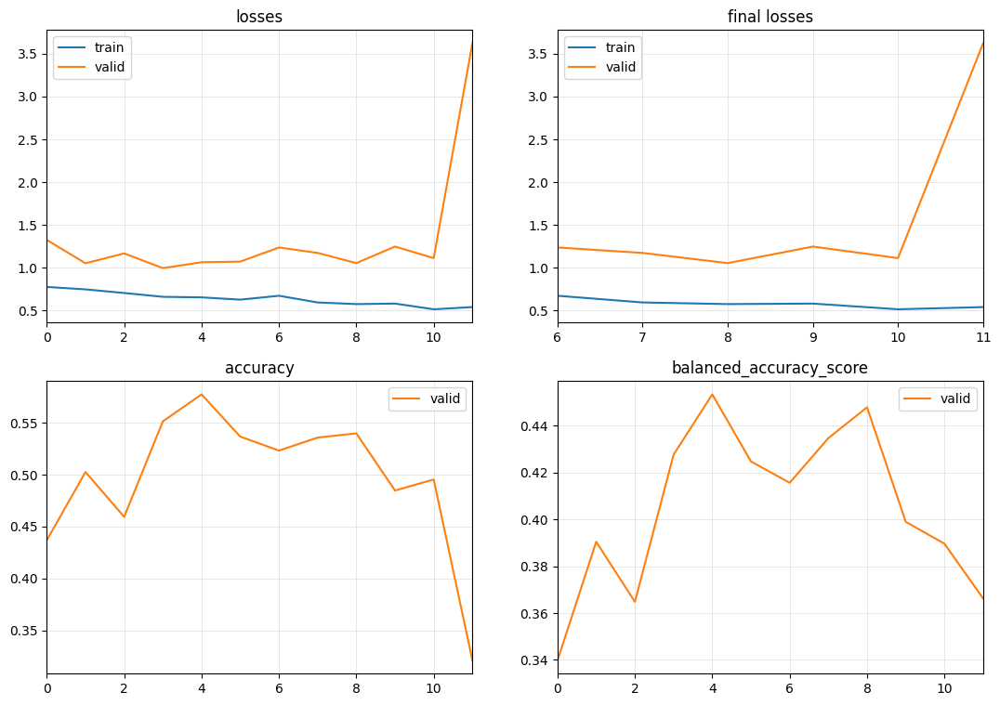

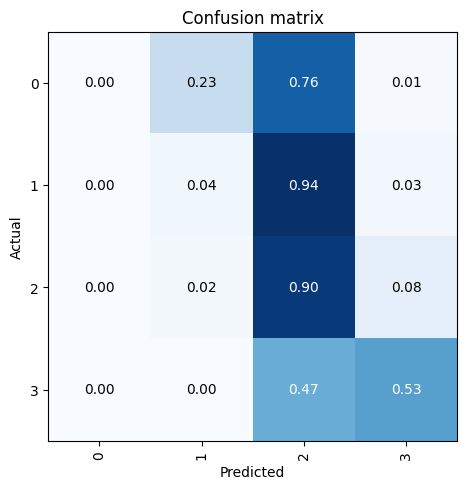

[I 2023-10-14 02:35:19,938] Trial 21 finished with value: 0.45334252938419606 and parameters: {'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 18 with value: 0.5308813818119389.


{'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.821929,0.929345,0.568438,0.447481,01:36
1,0.772626,1.242643,0.476875,0.372107,01:37
2,0.762840,1.563721,0.371875,0.288825,01:36
3,0.668325,1.145349,0.463125,0.361857,01:36
4,0.657649,1.436101,0.484062,0.369805,01:36
5,0.673354,1.190067,0.518438,0.446371,01:37
6,0.601127,2.026989,0.454375,0.352554,01:37
7,0.585542,1.226639,0.494687,0.382661,01:37


No improvement since epoch 0: early stopping


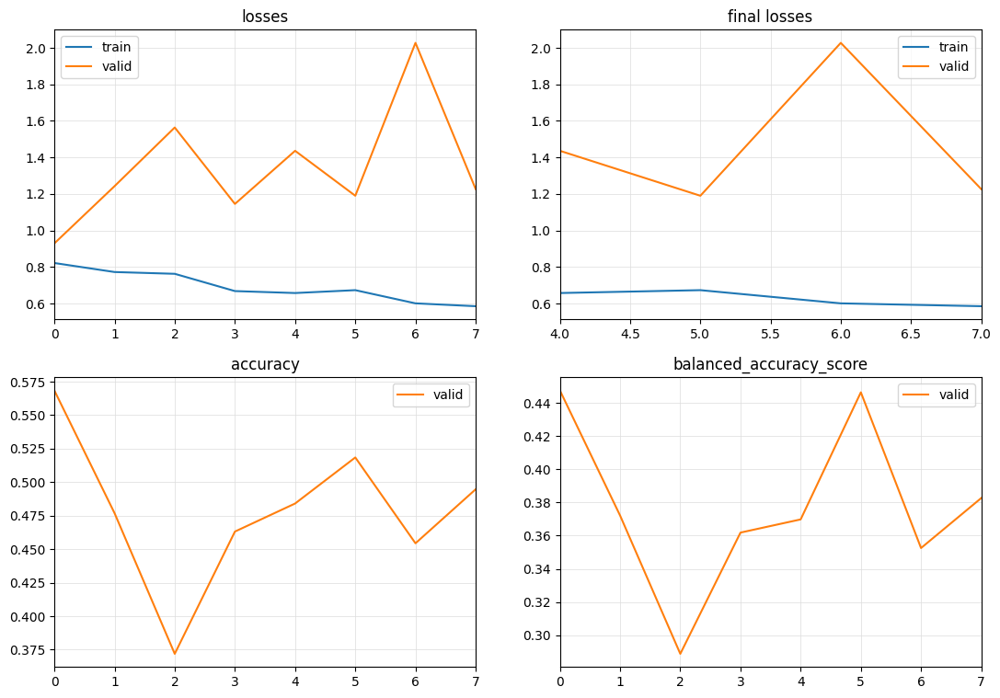

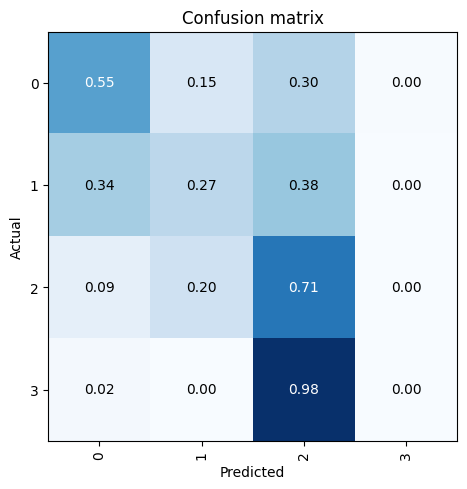

[I 2023-10-14 02:48:55,890] Trial 22 finished with value: 0.4474806008967056 and parameters: {'num_days': 28, 'sample_frac': 0.2, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 18 with value: 0.5308813818119389.


{'num_days': 28, 'sample_frac': 0.4, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.809581,1.294747,0.392188,0.307658,02:32
1,0.735585,1.385802,0.508906,0.392165,02:32
2,0.642506,1.046281,0.545937,0.543746,02:32
3,0.672149,1.255288,0.471719,0.364061,02:33
4,0.602402,1.353241,0.477344,0.380235,02:33
5,0.578316,1.145679,0.534688,0.516563,02:33
6,0.551081,1.083539,0.553906,0.589089,02:33
7,0.516264,1.780217,0.501094,0.387899,02:32
8,0.482580,1.866003,0.462969,0.365285,02:33
9,0.498984,1.490939,0.478125,0.419149,02:32


No improvement since epoch 6: early stopping


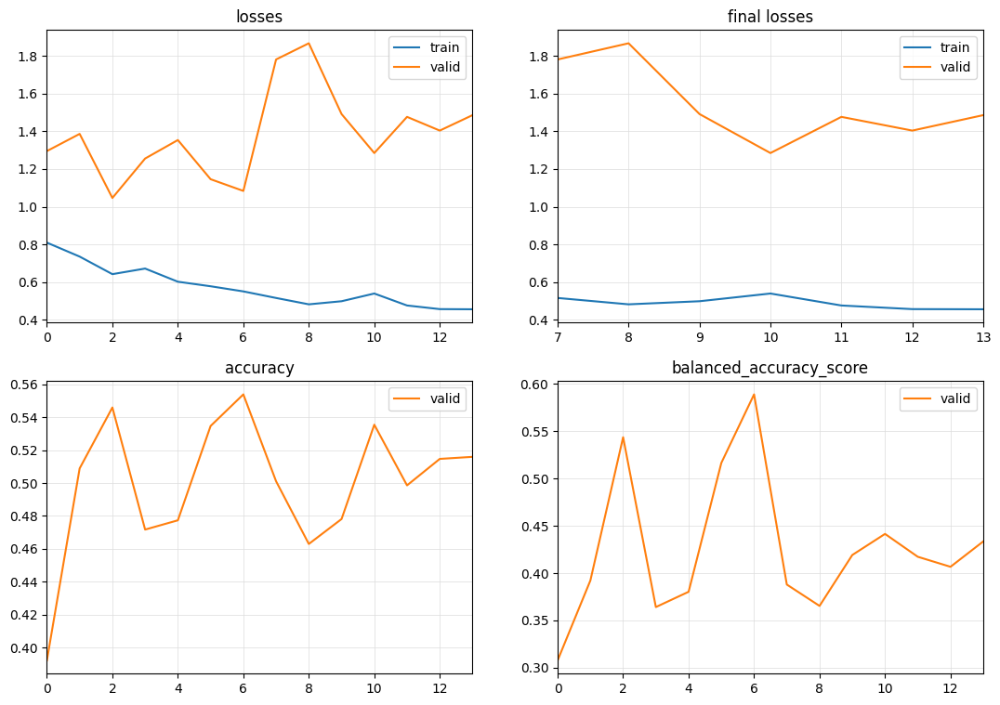

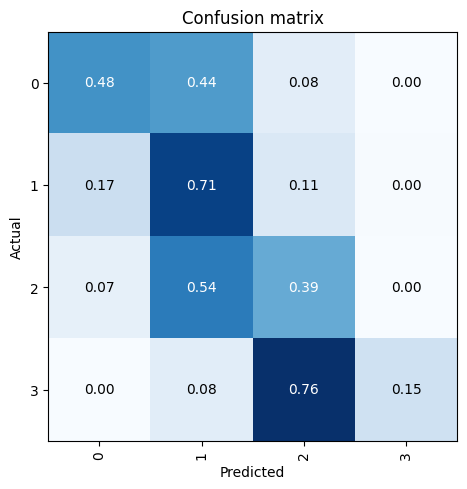

[I 2023-10-14 03:25:27,980] Trial 23 finished with value: 0.5890887407459792 and parameters: {'num_days': 28, 'sample_frac': 0.4, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 56, 'sample_frac': 0.6, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.699280,1.293043,0.481458,0.411093,04:50
1,0.607223,1.123829,0.531563,0.448647,04:50
2,0.504663,1.265625,0.480729,0.379447,04:50
3,0.391857,1.283110,0.458958,0.363677,04:50
4,0.370807,1.413833,0.496146,0.408534,04:50
5,0.310652,1.637029,0.497917,0.397424,04:50
6,0.319347,1.572995,0.493125,0.386931,04:50
7,0.266034,1.732772,0.474479,0.381122,04:50
8,0.254806,1.725747,0.471250,0.368137,04:50


No improvement since epoch 1: early stopping


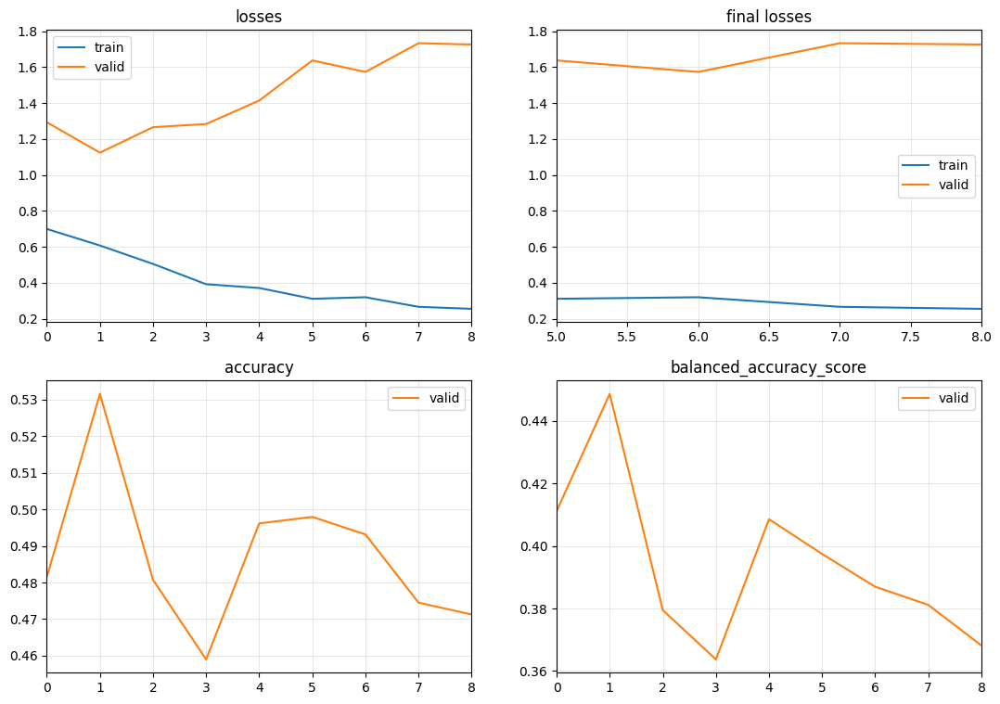

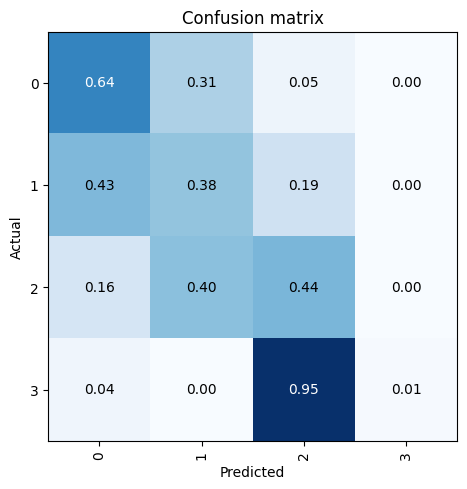

[I 2023-10-14 04:10:03,293] Trial 24 finished with value: 0.4486473836018464 and parameters: {'num_days': 56, 'sample_frac': 0.6, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.001}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.4, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.745827,1.756324,0.428438,0.338520,02:33
1,0.668291,0.952187,0.585469,0.481052,02:32
2,0.667539,1.414851,0.420625,0.432010,02:33
3,0.616790,1.035616,0.547031,0.435702,02:32
4,0.518277,0.999484,0.571563,0.451809,02:32
5,0.583685,1.549361,0.401250,0.317104,02:32
6,0.526030,1.473920,0.404687,0.321461,02:32
7,0.477763,1.601532,0.448594,0.346139,02:33
8,0.485250,1.933020,0.436719,0.335777,02:32


No improvement since epoch 1: early stopping


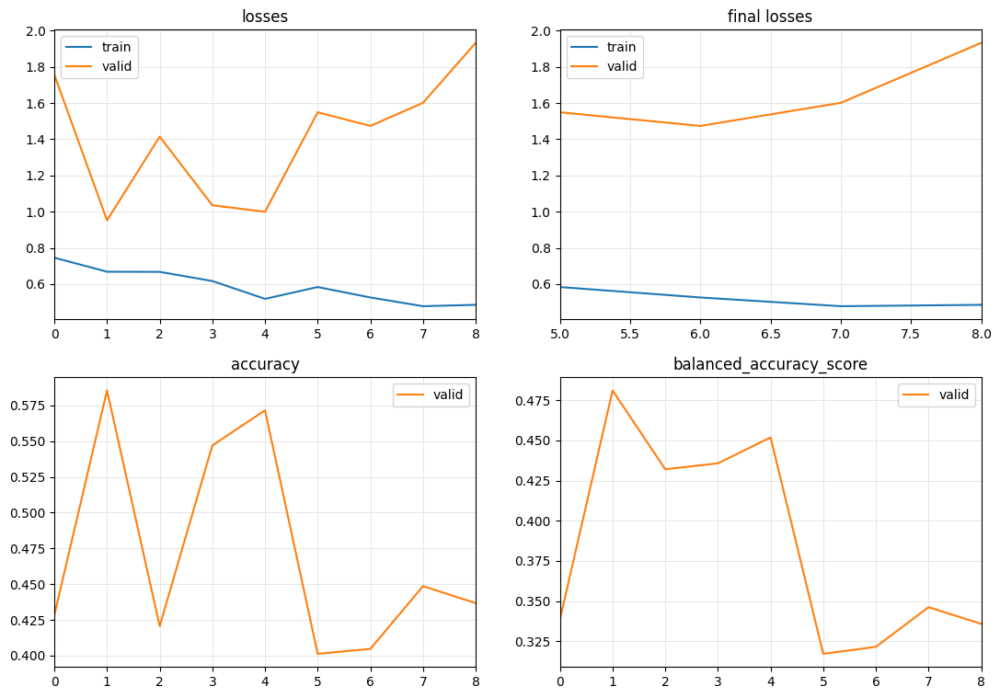

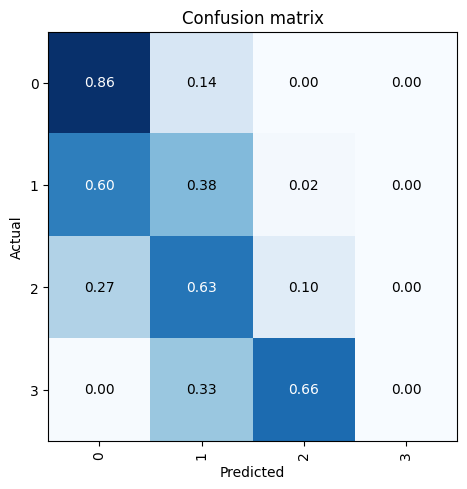

[I 2023-10-14 04:33:45,758] Trial 25 finished with value: 0.4810521236532234 and parameters: {'num_days': 28, 'sample_frac': 0.4, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.660569,1.608714,0.464028,0.416576,07:14
1,0.552917,1.092399,0.545278,0.422078,07:16
2,0.551525,1.784804,0.514306,0.397741,07:17
3,0.469587,1.289052,0.494444,0.396830,07:16
4,0.469412,1.438120,0.484028,0.525084,07:17
5,0.454709,1.376403,0.474861,0.470780,07:16
6,0.436898,1.179729,0.534861,0.510904,07:17
7,0.441364,1.445978,0.484861,0.498807,07:18
8,0.434734,1.706239,0.438264,0.348855,07:17


No improvement since epoch 1: early stopping


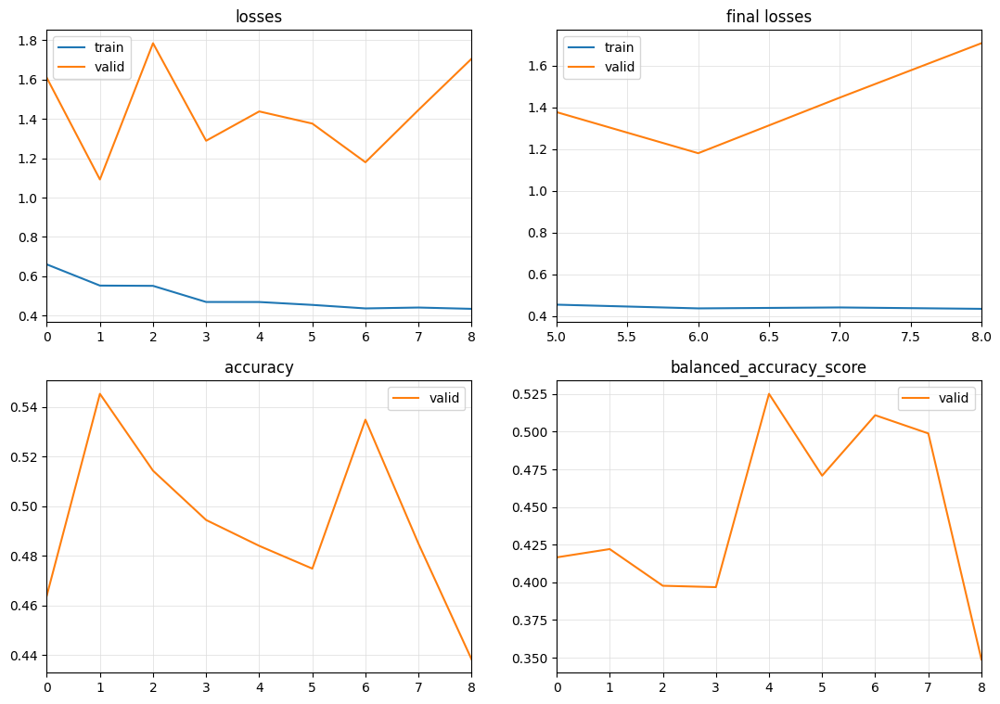

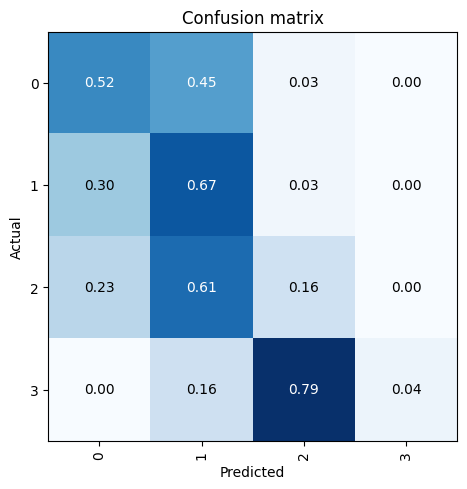

[I 2023-10-14 05:40:34,317] Trial 26 finished with value: 0.5250844472588974 and parameters: {'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.687100,1.472027,0.436250,0.343207,05:44
1,0.585243,1.378956,0.448333,0.394085,05:46
2,0.495883,1.369892,0.440417,0.396832,05:46
3,0.519452,1.796381,0.463472,0.359440,05:48
4,0.459588,1.577279,0.483056,0.375634,05:45
5,0.448939,2.080219,0.396597,0.332241,05:46
6,0.420937,1.942301,0.426458,0.329741,05:46
7,0.484125,1.573647,0.478958,0.395354,05:49
8,0.388081,2.340513,0.429444,0.332109,05:46
9,0.441305,1.371371,0.442500,0.374469,05:55


No improvement since epoch 4: early stopping


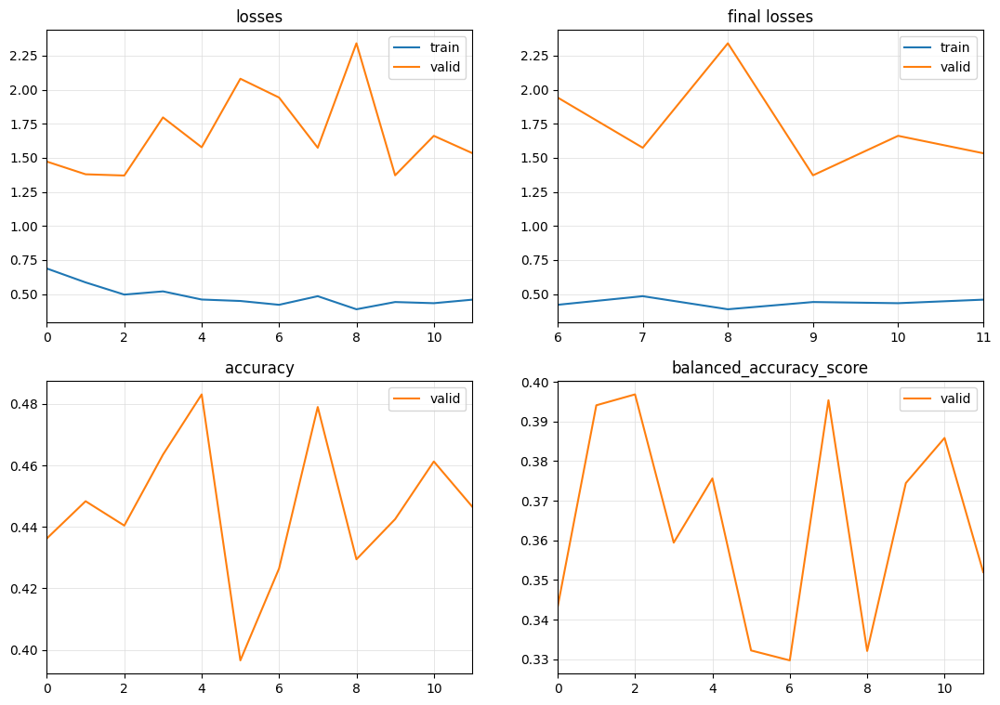

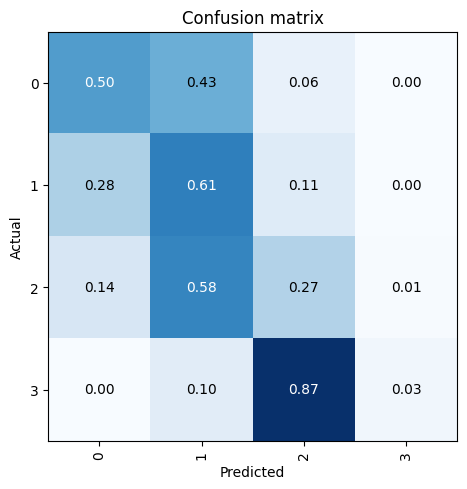

[I 2023-10-14 06:51:14,681] Trial 27 finished with value: 0.3968322237602898 and parameters: {'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.9, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.606518,3.214010,0.350764,0.281027,03:15
1,0.449459,4.588808,0.334722,0.450328,03:14
2,0.381914,3.972958,0.389444,0.372279,03:14
3,0.350161,1.676620,0.446597,0.361429,03:14
4,0.308885,2.277123,0.437778,0.349220,03:14
5,0.296698,3.063292,0.419861,0.330799,03:14
6,0.269726,1.927681,0.477083,0.410190,03:14
7,0.255067,2.063555,0.448681,0.361406,03:14
8,0.245403,3.189106,0.424514,0.395766,03:14
9,0.243649,2.208785,0.442083,0.397448,03:19


No improvement since epoch 6: early stopping


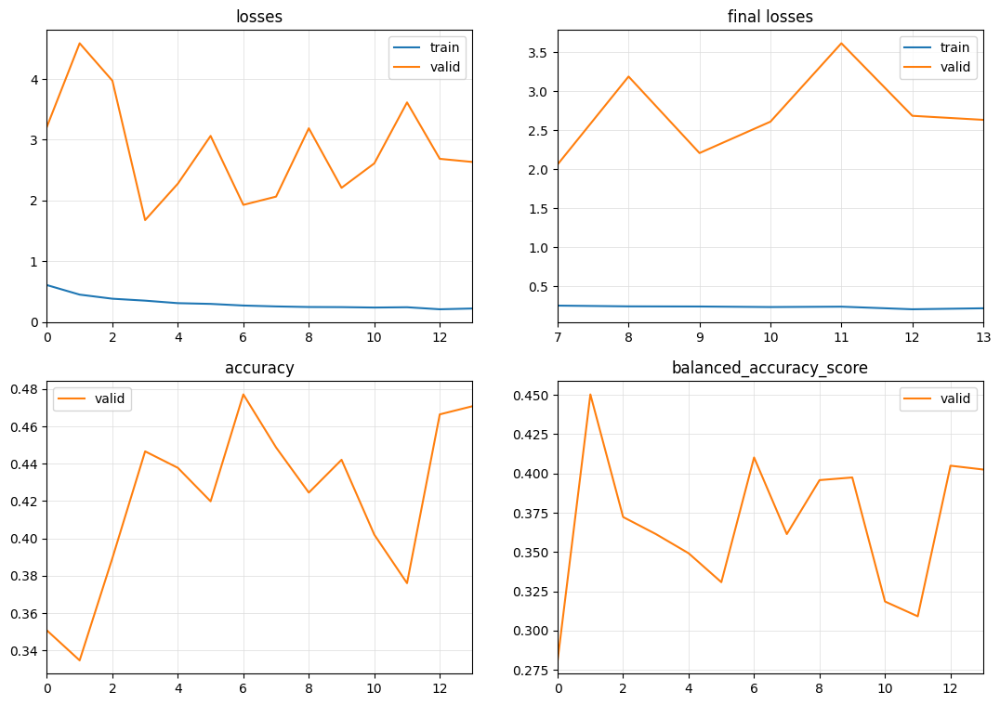

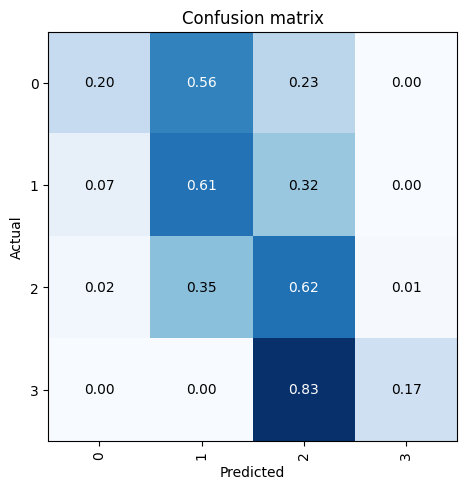

[I 2023-10-14 07:37:47,780] Trial 28 finished with value: 0.45032755175312 and parameters: {'num_days': 28, 'sample_frac': 0.9, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 84, 'sample_frac': 0.9, 'batch_size': 128, 'itp_depth': 6, 'learning_rate': 0.001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.537156,1.273889,0.449861,0.378946,01:38
1,0.389306,2.324756,0.397500,0.417668,01:38
2,0.326407,1.820788,0.497639,0.388350,01:38
3,0.280216,2.313534,0.400556,0.310158,01:38
4,0.264552,2.332558,0.457014,0.355174,01:38
5,0.234829,2.756741,0.391944,0.308838,01:38
6,0.217358,2.710199,0.450556,0.349843,01:38
7,0.203445,2.436218,0.451042,0.357625,01:38
8,0.187836,2.605871,0.417500,0.322923,01:38
9,0.180507,4.151682,0.362083,0.282803,01:38


No improvement since epoch 2: early stopping


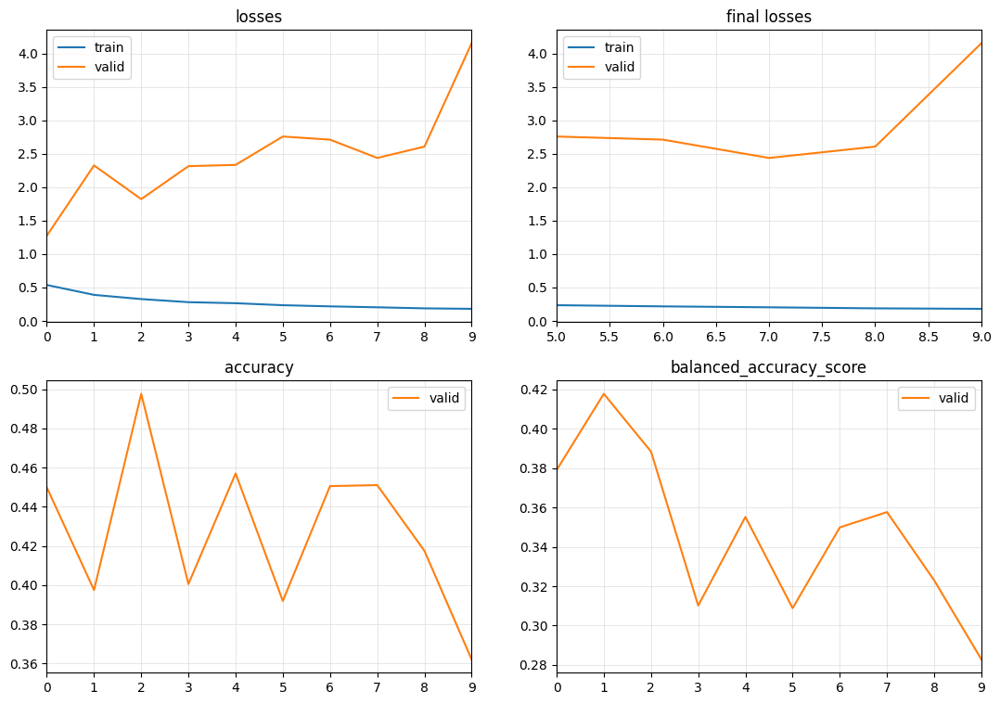

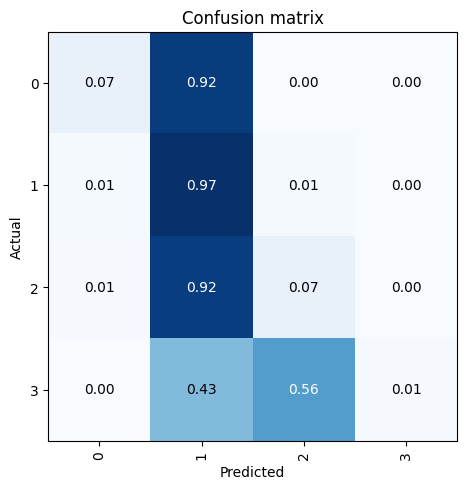

[I 2023-10-14 07:54:57,014] Trial 29 finished with value: 0.41766788217583345 and parameters: {'num_days': 84, 'sample_frac': 0.9, 'batch_size': 128, 'itp_depth': 6, 'learning_rate': 0.001}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 56, 'sample_frac': 0.6, 'batch_size': 128, 'itp_depth': 12, 'learning_rate': 0.001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.578992,1.701065,0.467396,0.464229,02:00
1,0.446426,1.454042,0.422812,0.343328,02:00
2,0.381641,2.417127,0.482812,0.504110,02:00
3,0.330772,2.082296,0.389479,0.308846,02:00
4,0.291955,2.458016,0.490208,0.397850,02:00
5,0.267082,2.233756,0.426667,0.380512,02:00
6,0.236110,1.903302,0.465625,0.363829,02:00
7,0.221758,2.710974,0.405104,0.360613,02:00
8,0.212027,4.254533,0.387396,0.303789,02:00
9,0.195410,2.694497,0.422188,0.327477,02:00


No improvement since epoch 4: early stopping


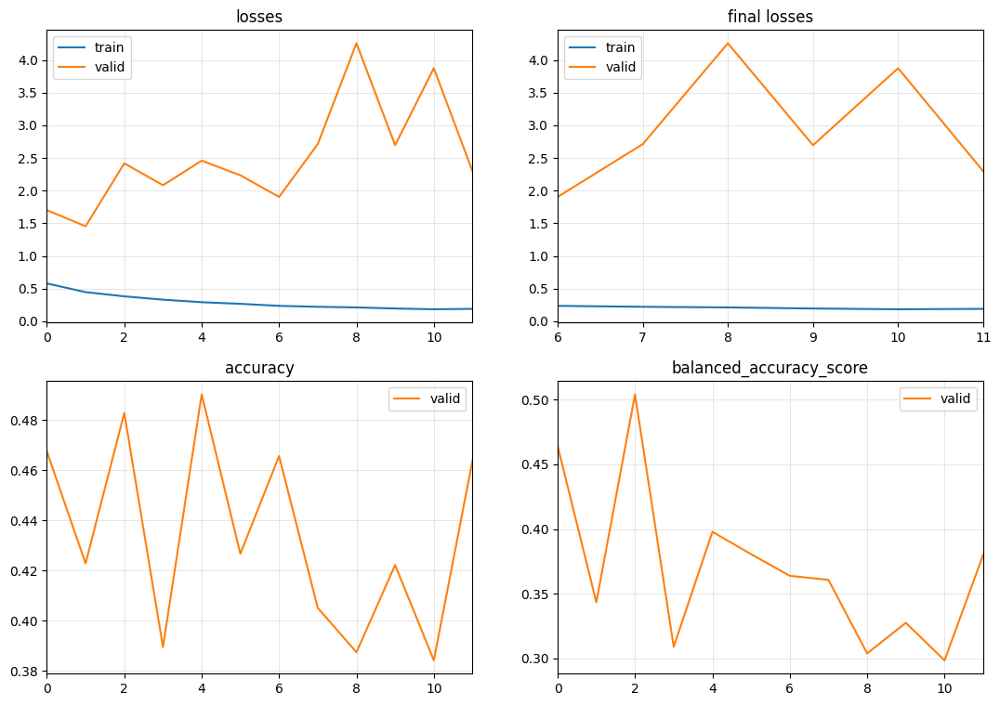

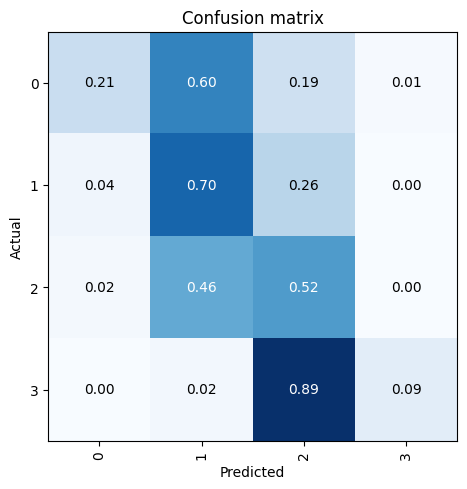

[I 2023-10-14 08:19:59,420] Trial 30 finished with value: 0.5041097946216648 and parameters: {'num_days': 56, 'sample_frac': 0.6, 'batch_size': 128, 'itp_depth': 12, 'learning_rate': 0.001}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.639378,1.642076,0.466812,0.401009,08:06
1,0.535094,1.860491,0.409312,0.347646,08:06
2,0.501709,1.719250,0.505063,0.401474,08:06
3,0.451744,5.542218,0.427812,0.332617,08:06
4,0.505356,1.963423,0.466000,0.452601,08:19
5,0.470429,2.255895,0.438250,0.339499,08:06
6,0.399788,1.159148,0.531500,0.431319,08:06
7,0.466708,1.585388,0.414375,0.351962,08:06
8,0.420382,1.396757,0.463250,0.358518,08:07
9,0.434867,1.416301,0.480437,0.415177,08:07


No improvement since epoch 6: early stopping


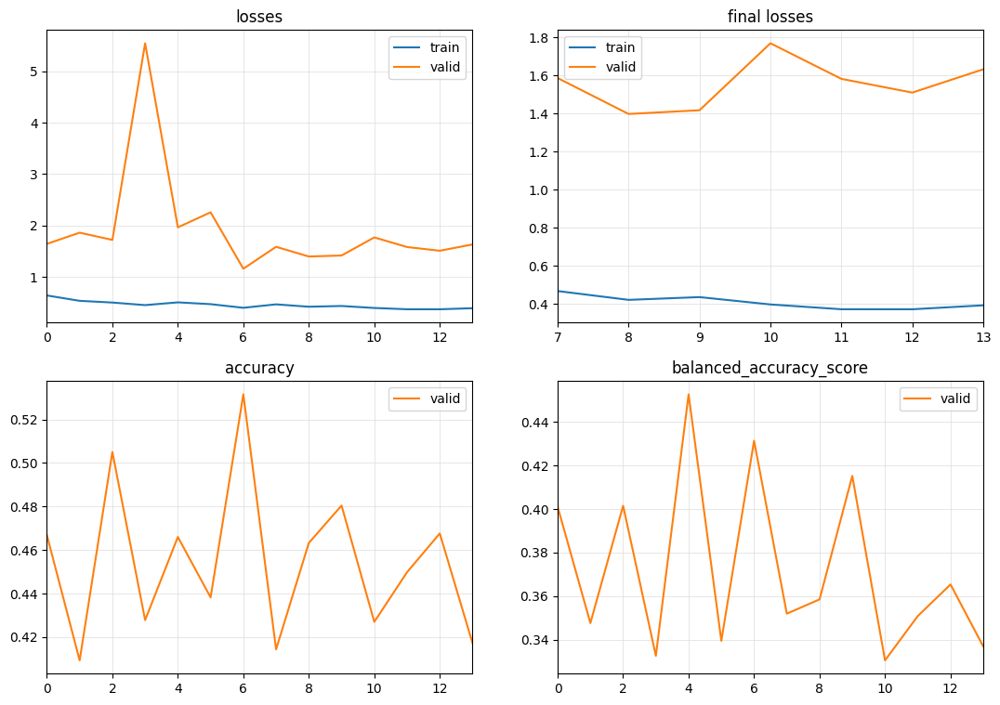

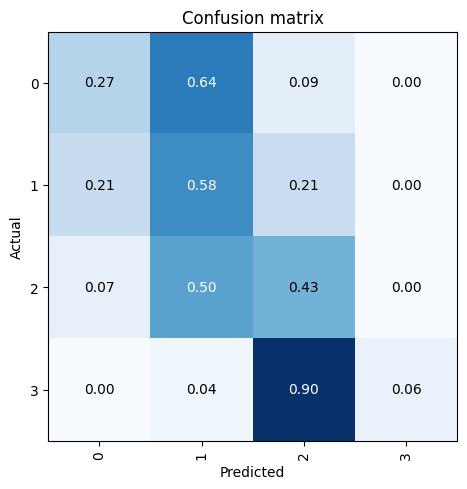

[I 2023-10-14 10:15:22,300] Trial 31 finished with value: 0.4526013593110102 and parameters: {'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.746221,1.138533,0.542708,0.482692,07:14
1,0.637722,1.304577,0.473403,0.450701,07:16
2,0.521392,3.100133,0.334097,0.257835,07:17
3,0.472575,13.384669,0.432986,0.395022,07:36
4,0.451832,1.183923,0.498056,0.405672,07:21
5,0.461198,1.532935,0.464167,0.363215,07:30
6,0.454315,1.959799,0.391181,0.302666,07:17
7,0.461624,2.310212,0.359306,0.277463,07:18


No improvement since epoch 0: early stopping


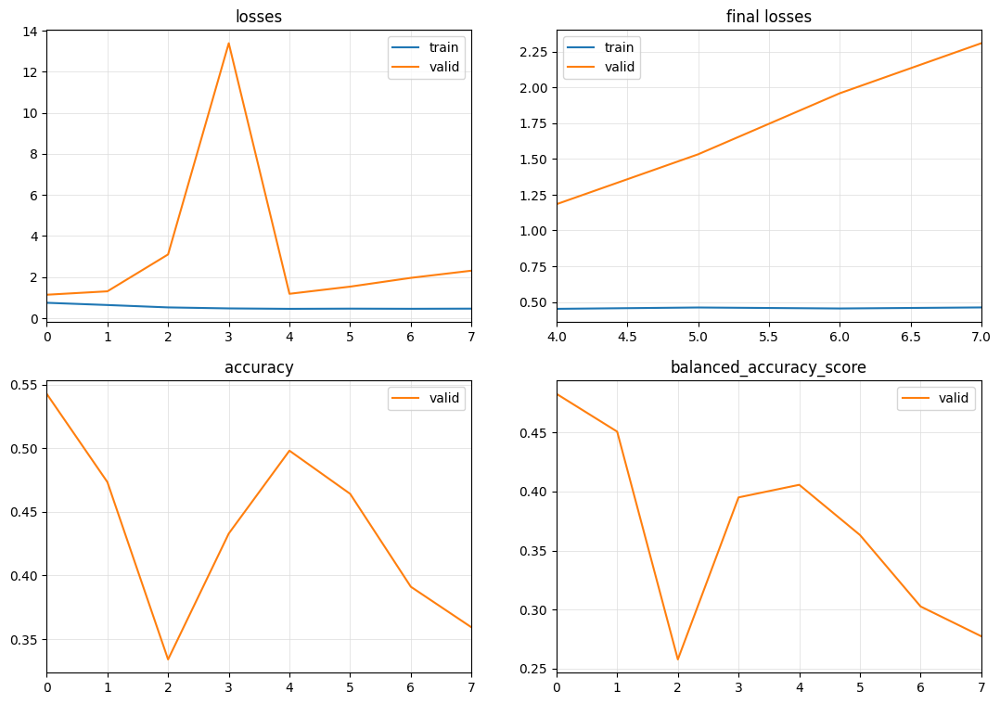

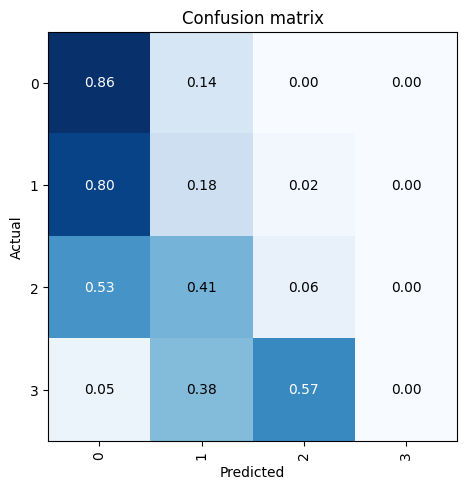

[I 2023-10-14 11:20:48,630] Trial 32 finished with value: 0.48269196608029563 and parameters: {'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.688848,1.185557,0.474922,0.370730,05:19
1,0.615813,1.500170,0.482031,0.374117,05:08
2,0.568484,1.165060,0.510156,0.501949,05:07
3,0.527858,1.542755,0.390391,0.303115,05:07
4,0.473343,1.375625,0.508828,0.438184,05:07
5,0.480435,1.945423,0.447031,0.390855,05:07
6,0.414812,1.518783,0.466016,0.408490,05:08
7,0.441908,2.415492,0.432266,0.334135,05:07
8,0.384737,1.294386,0.487031,0.398231,05:08
9,0.429110,1.724146,0.438281,0.352519,05:08


No improvement since epoch 2: early stopping


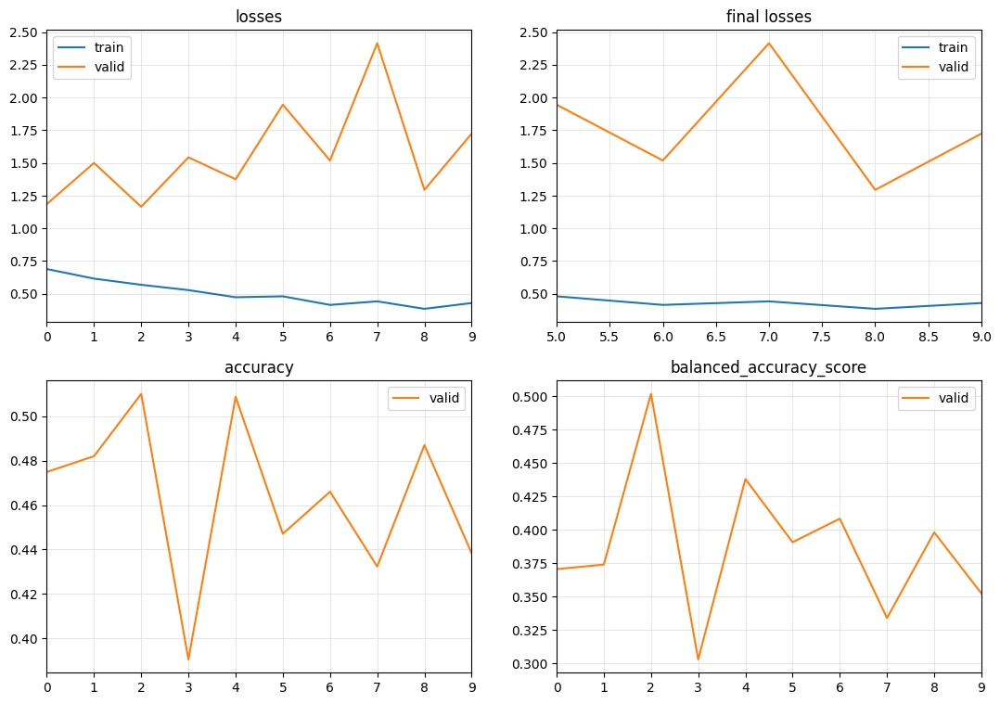

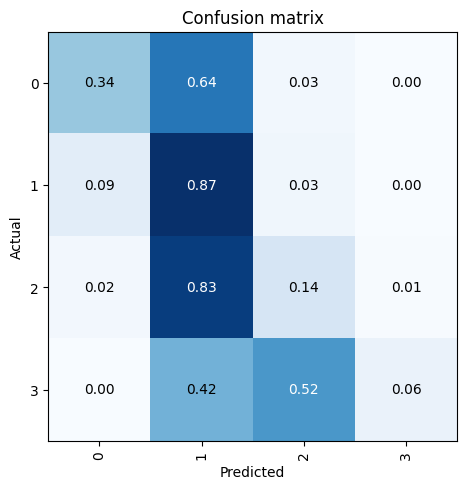

[I 2023-10-14 12:13:25,005] Trial 33 finished with value: 0.501948769014084 and parameters: {'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.4, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.0001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.615956,1.211466,0.476562,0.372582,03:14
1,0.438721,1.366973,0.473594,0.388504,03:14
2,0.395548,1.549428,0.409375,0.353328,03:14
3,0.382579,1.844641,0.405469,0.333808,03:14
4,0.316408,1.965955,0.380156,0.298664,03:15
5,0.276084,1.866434,0.385156,0.344869,03:14
6,0.270181,2.342125,0.412656,0.329059,03:14
7,0.236124,2.067000,0.366562,0.302754,03:19


No improvement since epoch 0: early stopping


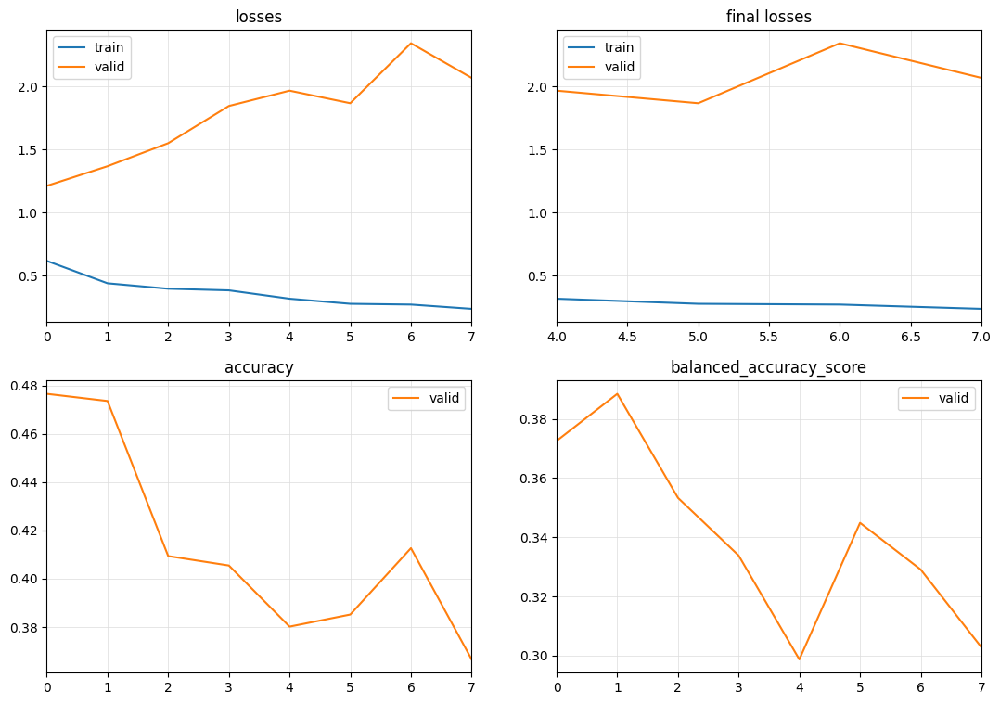

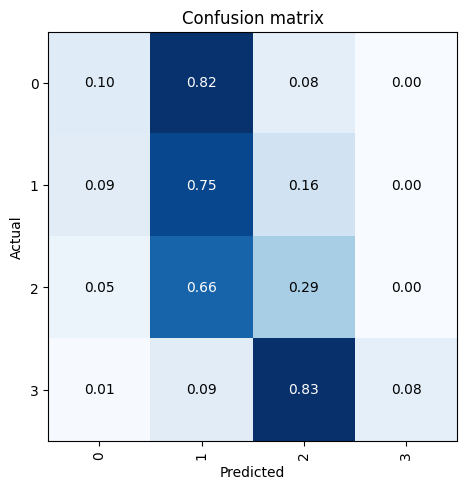

[I 2023-10-14 12:40:18,519] Trial 34 finished with value: 0.3885044347160893 and parameters: {'num_days': 28, 'sample_frac': 0.4, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.0001}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.684360,1.833385,0.493203,0.579958,05:20
1,0.621002,0.955931,0.567187,0.439818,05:08
2,0.535637,1.144529,0.504922,0.433694,05:08
3,0.513243,1.102937,0.541016,0.533174,05:08
4,0.501637,1.457891,0.446094,0.381978,05:08
5,0.462914,1.424772,0.454922,0.377334,05:07
6,0.442900,1.165732,0.495391,0.432538,05:08
7,0.465059,2.081792,0.361406,0.293332,05:08
8,0.449271,1.531609,0.446484,0.355378,05:08


No improvement since epoch 1: early stopping


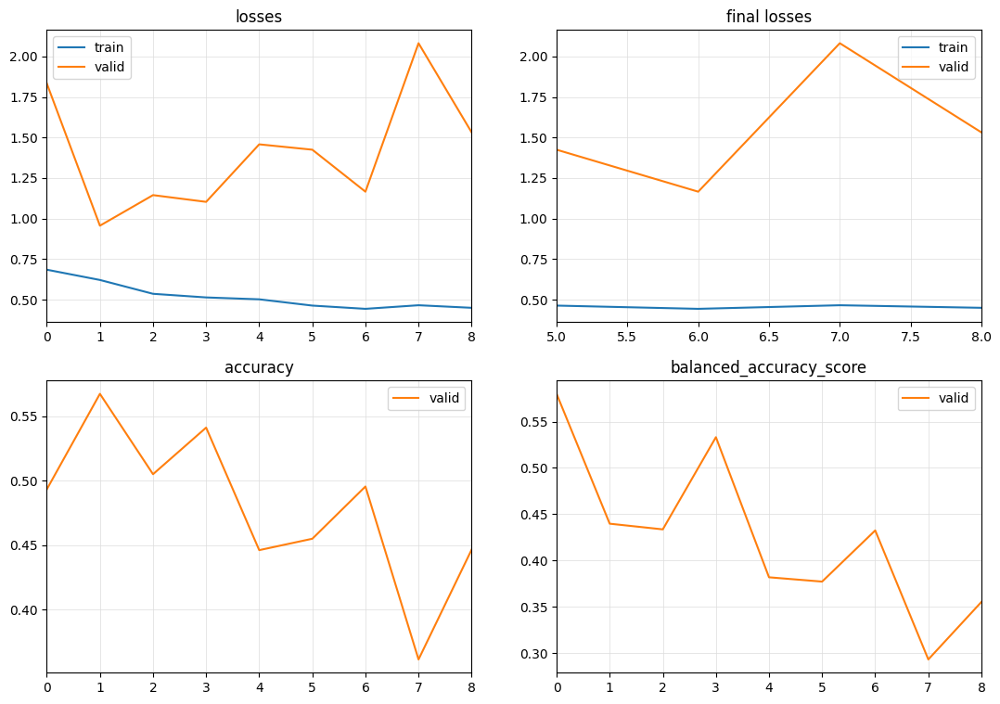

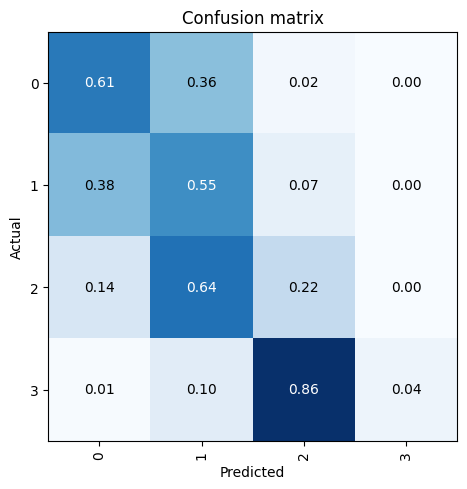

[I 2023-10-14 13:27:50,844] Trial 35 finished with value: 0.5799579944979235 and parameters: {'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 14, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.669161,2.315776,0.354453,0.277673,05:05
1,0.659025,1.154771,0.520156,0.403306,05:07
2,0.536119,1.376918,0.464531,0.367747,05:08
3,0.507401,1.102879,0.578672,0.468386,05:07
4,0.509197,2.206326,0.410156,0.317193,05:07
5,0.474091,1.906442,0.416484,0.347748,05:09
6,0.447786,1.608994,0.445703,0.380790,05:09
7,0.441447,2.224702,0.408984,0.447692,05:08
8,0.400731,1.192588,0.534609,0.425923,05:08
9,0.414492,1.230440,0.502266,0.406400,05:08


No improvement since epoch 3: early stopping


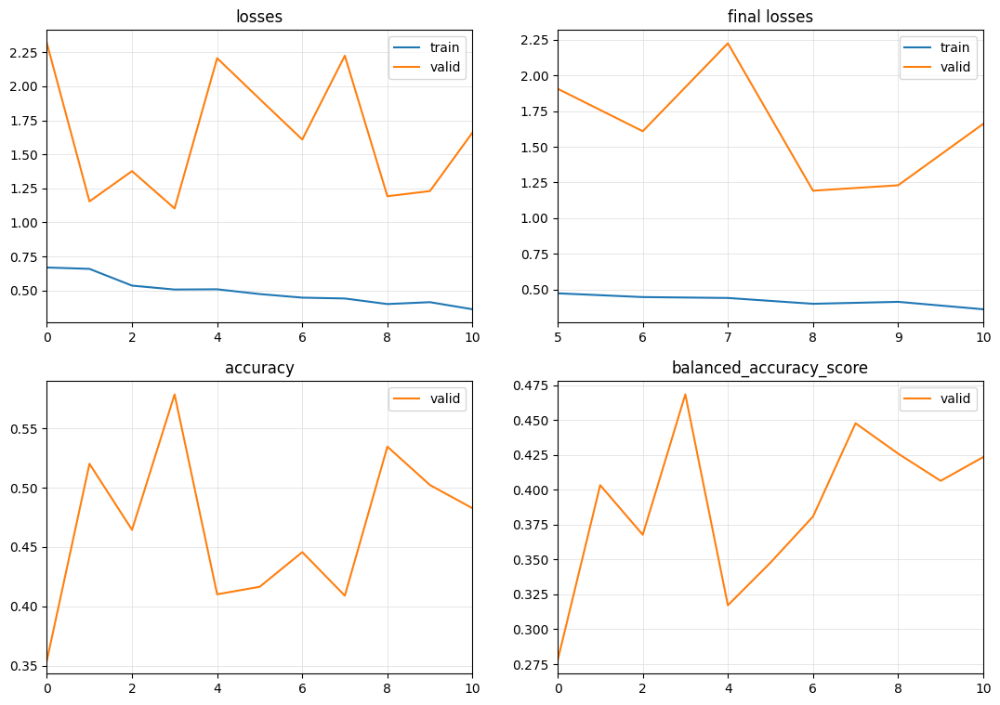

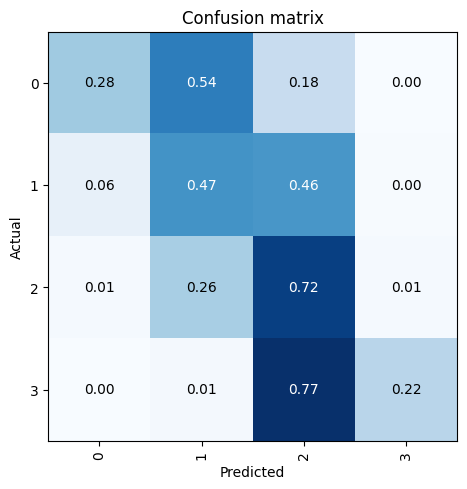

[I 2023-10-14 14:25:26,915] Trial 36 finished with value: 0.4683860648652234 and parameters: {'num_days': 14, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.7000000000000001, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.0001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.481509,1.457073,0.453125,0.351415,02:17
1,0.375410,1.857792,0.404464,0.316600,02:17
2,0.301113,1.595062,0.436250,0.338076,02:17
3,0.261611,2.258198,0.416429,0.324745,02:18
4,0.237150,2.217768,0.439018,0.340716,02:18
5,0.217889,1.778673,0.469286,0.364831,02:17
6,0.187773,1.847277,0.458839,0.367961,02:18
7,0.182140,2.326582,0.432679,0.341604,02:18
8,0.168913,2.677042,0.418036,0.324699,02:26
9,0.162426,2.302716,0.431964,0.335278,02:28


No improvement since epoch 5: early stopping


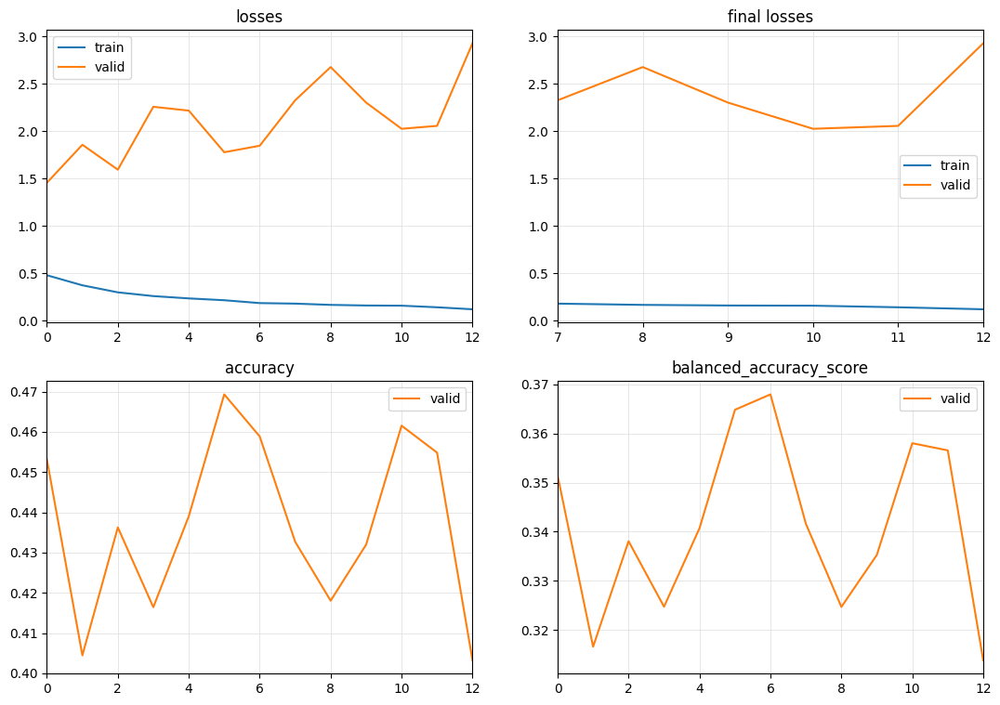

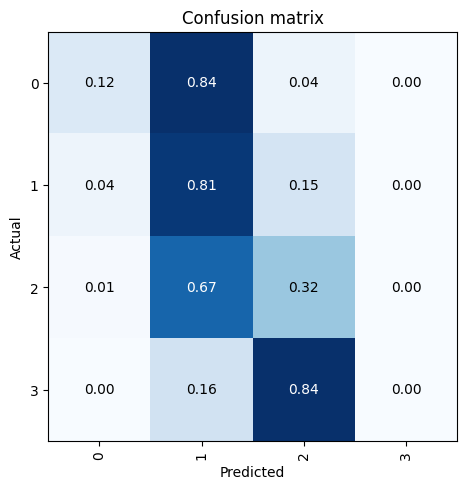

[I 2023-10-14 14:56:29,990] Trial 37 finished with value: 0.36796136281443287 and parameters: {'num_days': 28, 'sample_frac': 0.7000000000000001, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.0001}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.706567,1.157167,0.501188,0.389684,04:42
1,0.594922,1.124515,0.537125,0.433020,04:43
2,0.527012,1.504062,0.464875,0.376306,04:42
3,0.475781,2.444412,0.354250,0.273652,04:44
4,0.437006,1.781060,0.420500,0.325273,04:44
5,0.466738,1.486202,0.438937,0.339438,04:43
6,0.394207,1.503452,0.440437,0.386639,04:44
7,0.429317,1.587357,0.389000,0.300862,04:43
8,0.392469,1.618490,0.468188,0.362928,04:43


No improvement since epoch 1: early stopping


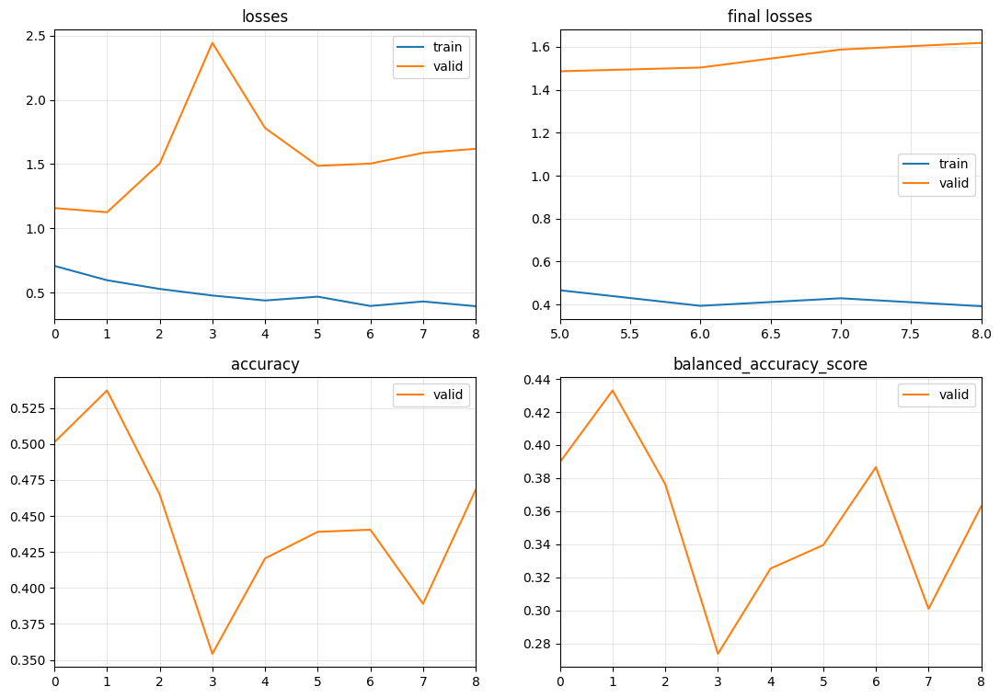

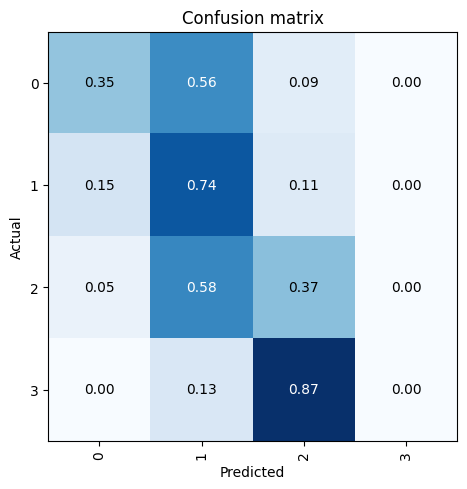

[I 2023-10-14 15:40:30,578] Trial 38 finished with value: 0.4330204299698051 and parameters: {'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 84, 'sample_frac': 0.8, 'batch_size': 128, 'itp_depth': 9, 'learning_rate': 0.0001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.512352,1.414252,0.465859,0.360310,02:04
1,0.371024,1.590358,0.523750,0.405117,02:04
2,0.296649,1.990593,0.481406,0.372084,02:04
3,0.255534,2.732876,0.439531,0.353652,02:05
4,0.227090,1.682823,0.436641,0.337586,02:04
5,0.196160,2.105217,0.457109,0.353345,02:04
6,0.188207,2.315371,0.444219,0.343342,02:04
7,0.178146,1.796970,0.488281,0.377610,02:04
8,0.163358,1.981060,0.441719,0.341560,02:04


No improvement since epoch 1: early stopping


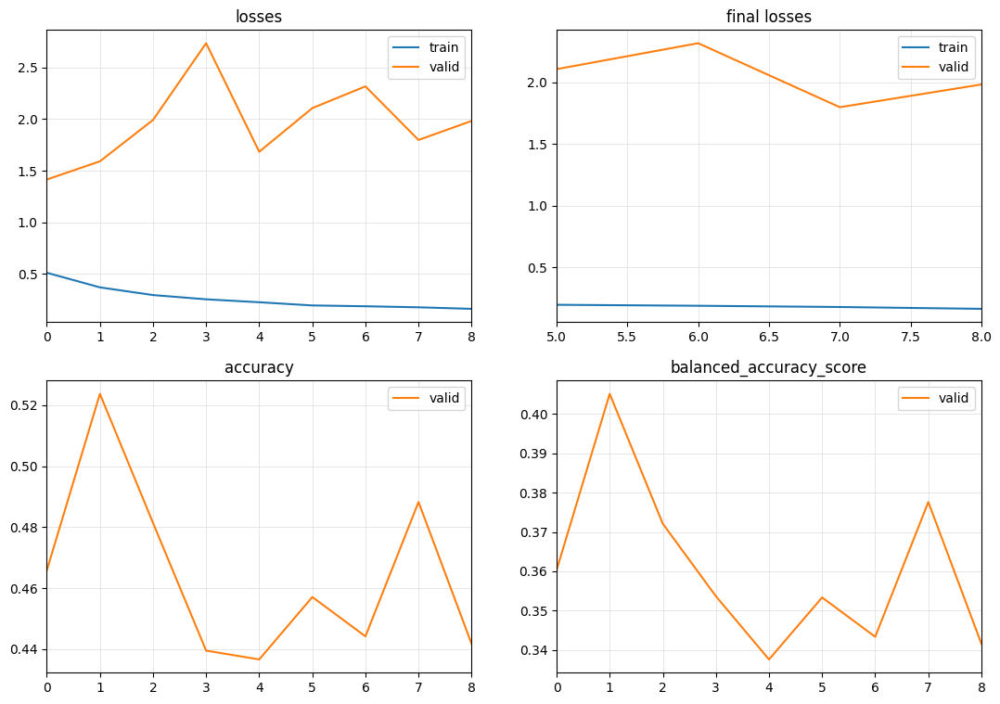

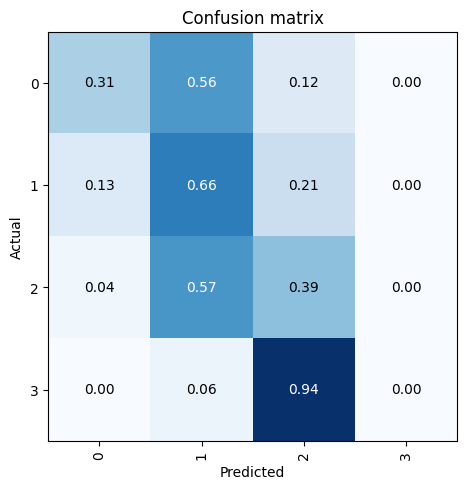

[I 2023-10-14 15:59:58,125] Trial 39 finished with value: 0.40511687333652696 and parameters: {'num_days': 84, 'sample_frac': 0.8, 'batch_size': 128, 'itp_depth': 9, 'learning_rate': 0.0001}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 14, 'sample_frac': 0.9, 'batch_size': 32, 'itp_depth': 6, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.624937,1.236355,0.505139,0.389576,02:06
1,0.480303,1.708857,0.492917,0.384320,02:05
2,0.418983,1.609481,0.469306,0.364969,02:05
3,0.377911,2.195312,0.462083,0.377276,02:05
4,0.358939,2.588683,0.438056,0.340009,02:05
5,0.322912,2.268267,0.443125,0.365083,02:05
6,0.297000,2.004749,0.463403,0.363956,02:06
7,0.298534,2.261790,0.450764,0.372627,02:05


No improvement since epoch 0: early stopping


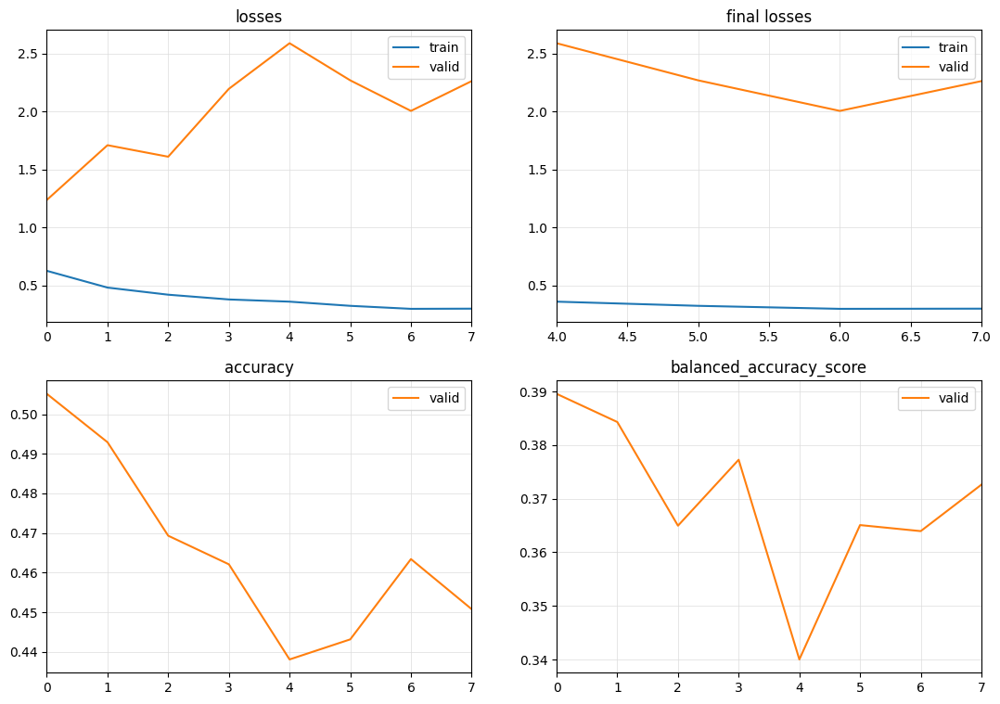

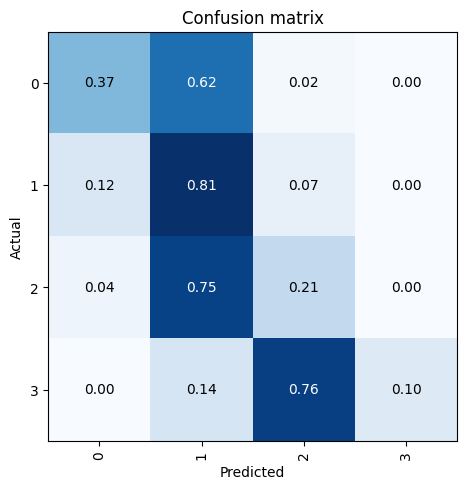

[I 2023-10-14 16:17:32,871] Trial 40 finished with value: 0.3895760496470193 and parameters: {'num_days': 14, 'sample_frac': 0.9, 'batch_size': 32, 'itp_depth': 6, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.7000000000000001, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.697420,1.362696,0.451071,0.406838,05:39
1,0.635405,1.376515,0.468661,0.363233,05:41
2,0.624466,1.124338,0.505446,0.461960,05:51
3,0.553630,1.319897,0.491607,0.451219,05:40
4,0.531642,4.265483,0.338661,0.261968,05:39
5,0.479607,1.585793,0.495000,0.414282,05:41
6,0.494375,1.624244,0.477143,0.391682,05:41
7,0.441547,1.551194,0.483929,0.480112,05:41
8,0.423825,1.378385,0.465536,0.390439,05:40
9,0.436622,1.548516,0.450446,0.352411,05:45


No improvement since epoch 2: early stopping


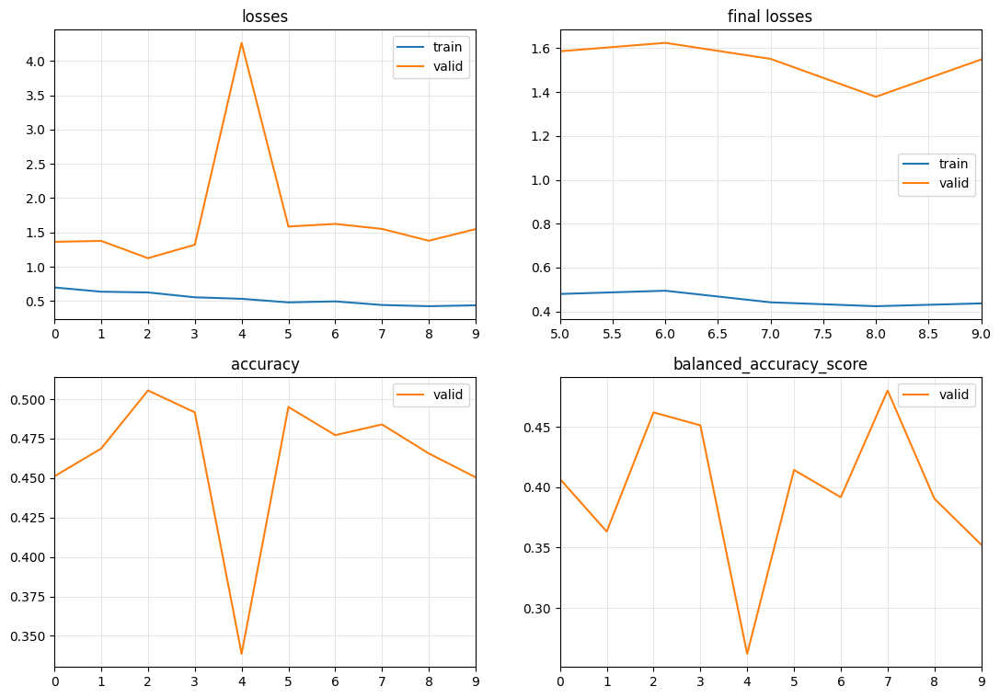

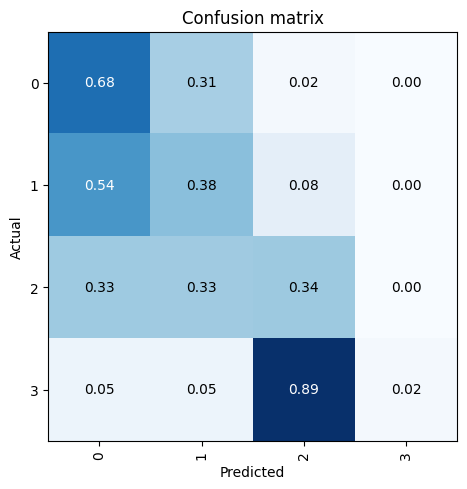

[I 2023-10-14 17:15:43,750] Trial 41 finished with value: 0.4801115410830161 and parameters: {'num_days': 28, 'sample_frac': 0.7000000000000001, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.5, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.790308,0.938180,0.573125,0.491955,03:24
1,0.591873,1.127700,0.530875,0.447007,03:12
2,0.607208,1.271354,0.477875,0.403468,03:11
3,0.552512,1.495809,0.471000,0.379664,03:11
4,0.524758,1.694965,0.426125,0.333858,03:12
5,0.475966,1.377015,0.455625,0.354959,03:12
6,0.469625,1.717955,0.416250,0.323677,03:11
7,0.431251,1.466284,0.459875,0.402228,03:12


No improvement since epoch 0: early stopping


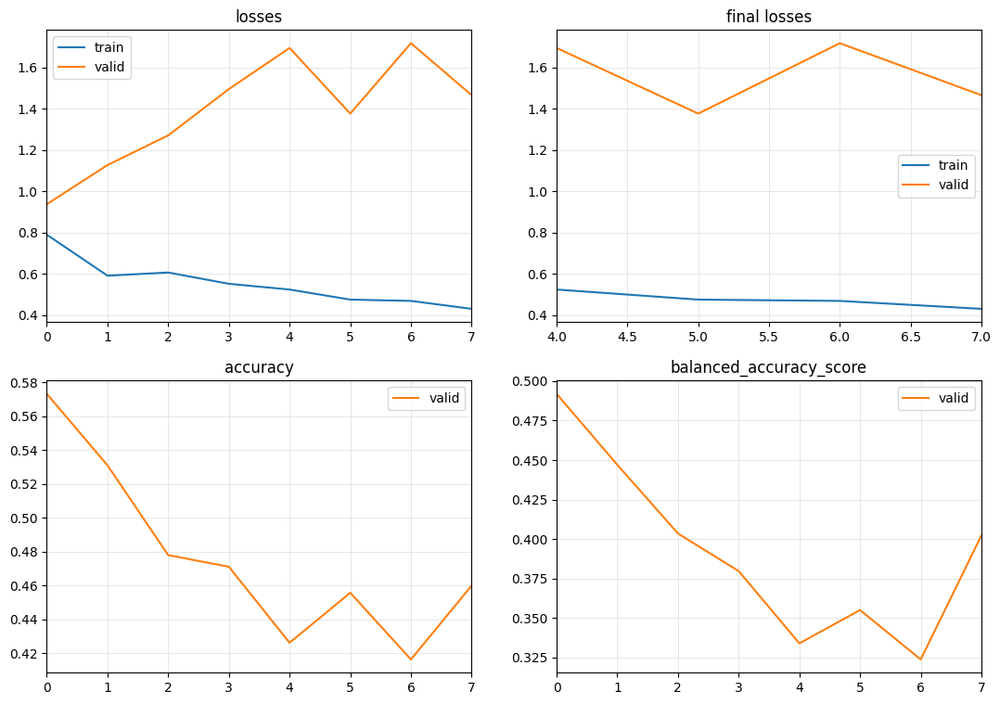

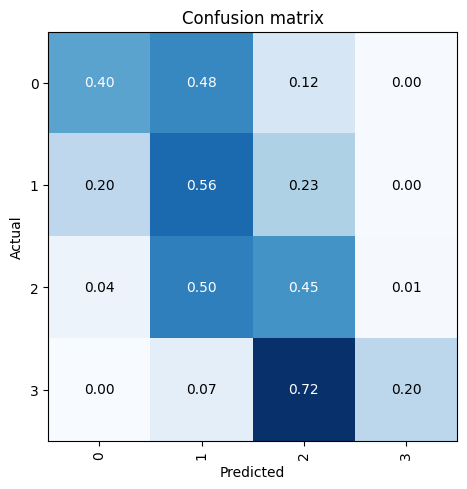

[I 2023-10-14 17:42:43,775] Trial 42 finished with value: 0.4919551126496564 and parameters: {'num_days': 28, 'sample_frac': 0.5, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.6, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.738349,1.422319,0.557187,0.504461,04:52
1,0.622104,1.231326,0.505208,0.388958,04:52
2,0.536645,1.506957,0.427604,0.329765,04:51
3,0.514425,1.246186,0.473021,0.400726,04:52
4,0.466632,1.886197,0.475313,0.381267,04:52
5,0.480700,1.156167,0.485938,0.425528,04:52
6,0.453388,1.384224,0.455417,0.369294,04:53
7,0.462324,1.303669,0.443958,0.352617,04:52


No improvement since epoch 0: early stopping


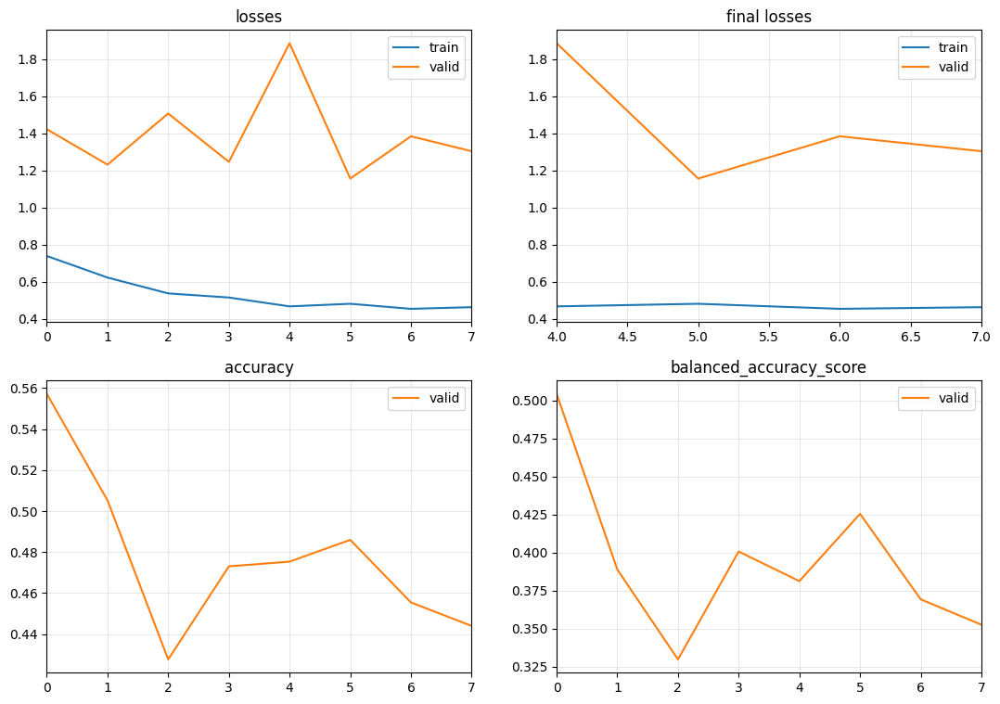

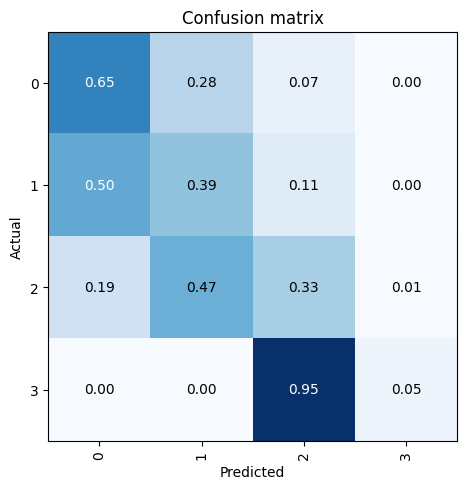

[I 2023-10-14 18:22:43,594] Trial 43 finished with value: 0.5044606174939202 and parameters: {'num_days': 28, 'sample_frac': 0.6, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.692736,1.171732,0.473062,0.365575,06:23
1,0.592522,1.190564,0.503563,0.413265,06:23
2,0.493547,1.401396,0.513875,0.438114,06:24
3,0.508132,1.470789,0.450812,0.366649,06:31
4,0.462619,1.420686,0.457625,0.428298,06:25
5,0.445526,1.640470,0.401875,0.333811,06:22
6,0.437320,1.254430,0.459812,0.378636,06:23
7,0.430224,1.921559,0.402938,0.328279,06:23
8,0.446220,1.365651,0.533000,0.433388,06:24
9,0.433120,1.509737,0.459437,0.376929,06:24


No improvement since epoch 8: early stopping


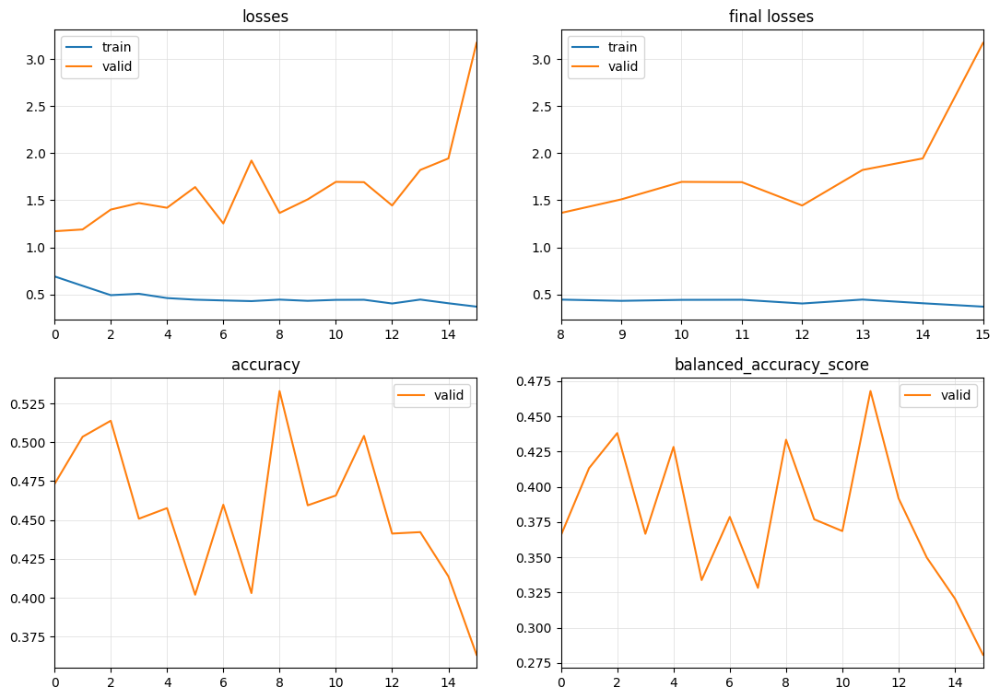

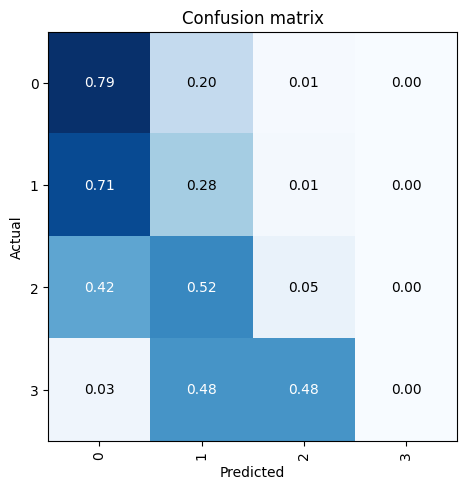

[I 2023-10-14 20:06:34,992] Trial 44 finished with value: 0.46795422434393974 and parameters: {'num_days': 28, 'sample_frac': 1.0, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.651298,1.127247,0.498750,0.441551,07:16
1,0.558618,1.151088,0.505347,0.405614,07:18
2,0.529296,1.356048,0.471597,0.376067,07:18
3,0.558975,1.138679,0.505833,0.403541,07:18
4,0.489645,1.461729,0.423194,0.347594,07:19
5,0.441458,1.848167,0.405903,0.324054,07:17
6,0.403162,1.477644,0.471944,0.364253,07:19
7,0.416822,2.836933,0.394583,0.306613,07:19
8,0.448105,1.927906,0.415069,0.319880,07:30


No improvement since epoch 1: early stopping


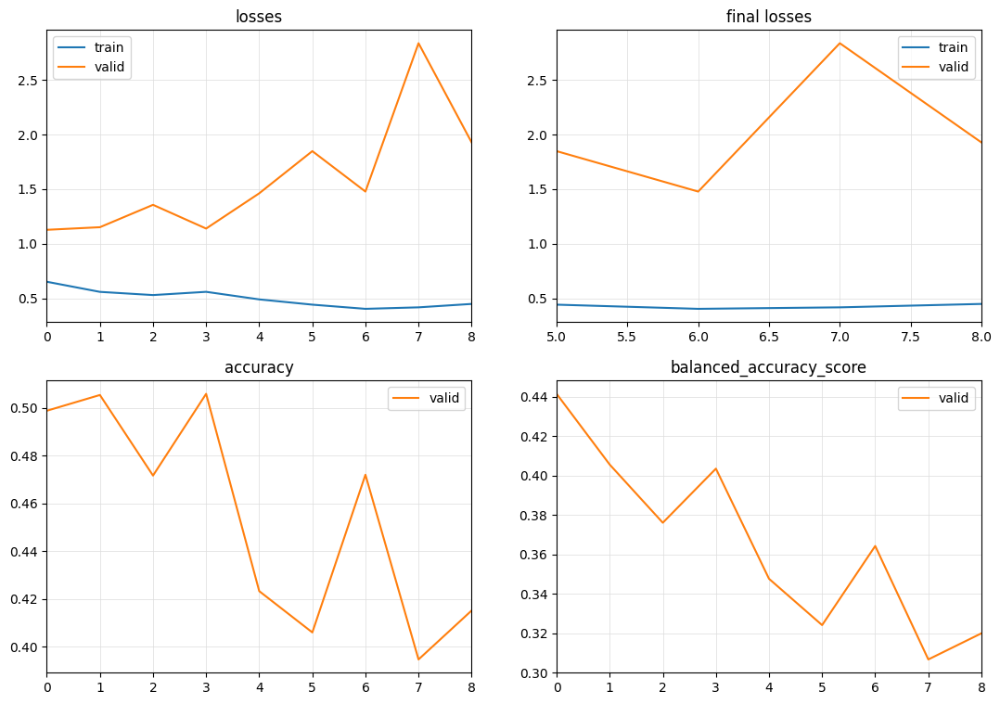

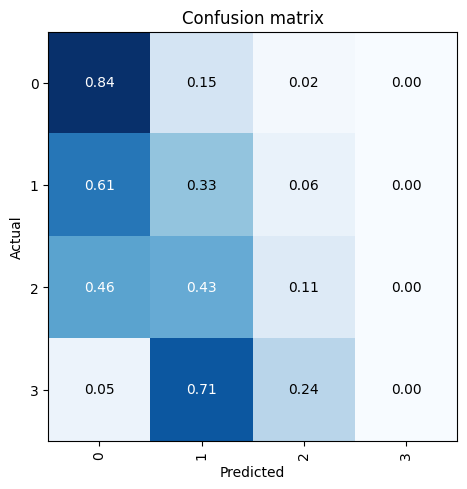

[I 2023-10-14 21:18:59,261] Trial 45 finished with value: 0.4415509929968153 and parameters: {'num_days': 28, 'sample_frac': 0.9, 'batch_size': 8, 'itp_depth': 12, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 56, 'sample_frac': 0.5, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.001}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.619595,1.387897,0.424375,0.326572,01:49
1,0.480522,1.925339,0.457250,0.354610,01:48
2,0.413904,3.081821,0.375625,0.293222,01:48
3,0.356055,2.968216,0.413375,0.320994,01:48
4,0.313889,3.129990,0.401000,0.313708,01:48
5,0.290318,2.247638,0.463875,0.370161,01:48
6,0.272947,1.831910,0.474875,0.368151,01:48
7,0.238601,2.488786,0.446750,0.346418,01:48
8,0.237520,1.943684,0.484875,0.374993,01:48
9,0.214466,2.510587,0.445000,0.345843,01:48


No improvement since epoch 8: early stopping


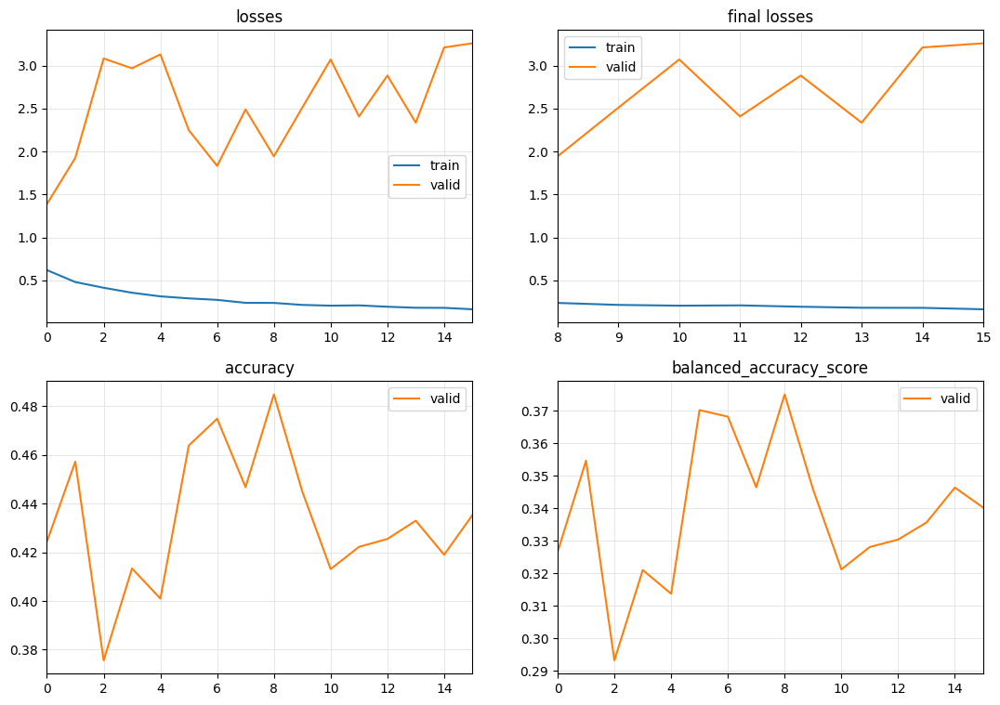

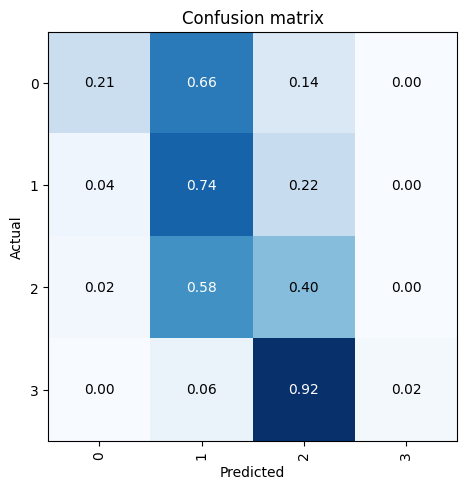

[I 2023-10-14 21:48:34,495] Trial 46 finished with value: 0.3749934823083553 and parameters: {'num_days': 56, 'sample_frac': 0.5, 'batch_size': 64, 'itp_depth': 12, 'learning_rate': 0.001}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.30000000000000004, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 1e-05}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.888183,1.131952,0.491250,0.381978,01:54
1,0.718761,1.085788,0.511875,0.397195,01:54
2,0.621754,1.161742,0.487083,0.377328,01:54
3,0.559862,1.103151,0.476250,0.368415,01:55
4,0.516383,1.147350,0.495000,0.388692,01:54
5,0.477149,1.226879,0.488333,0.392480,01:54
6,0.475989,1.244586,0.485208,0.404268,01:54
7,0.386996,1.351342,0.467917,0.374475,01:54
8,0.404002,1.378755,0.474792,0.396236,01:54


No improvement since epoch 1: early stopping


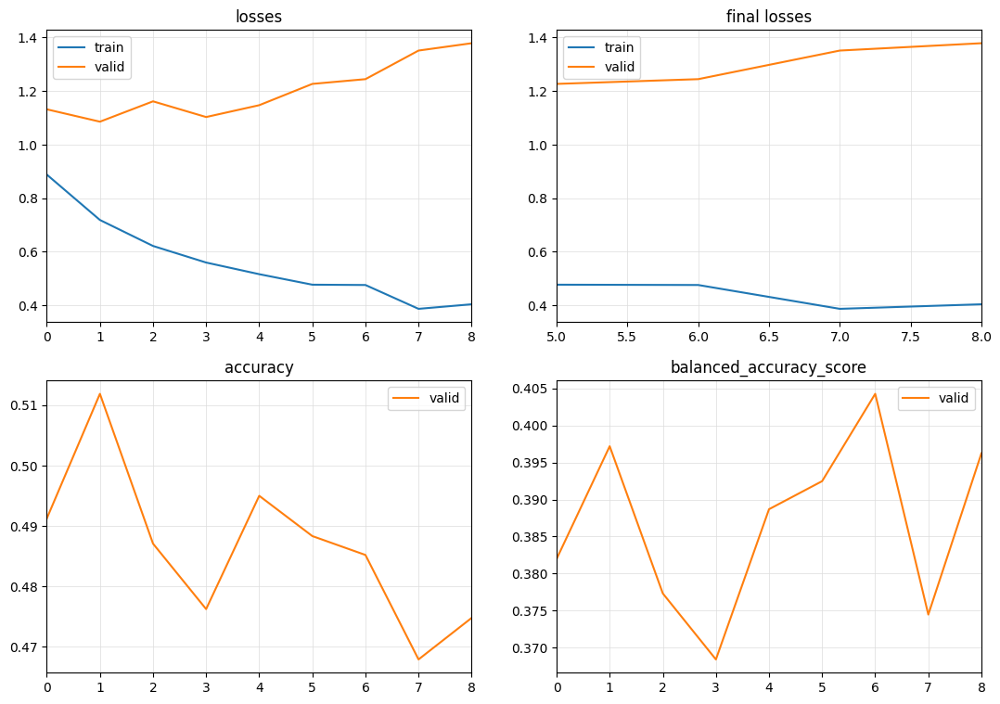

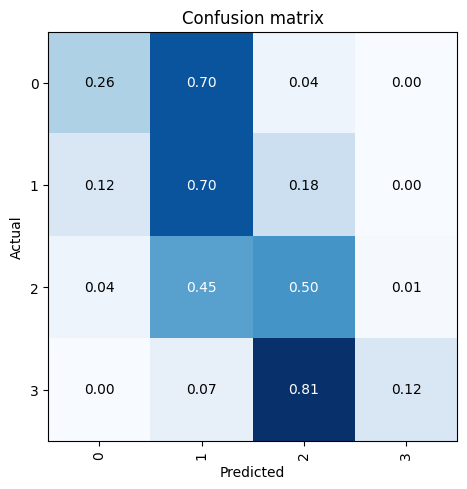

[I 2023-10-14 22:06:30,386] Trial 47 finished with value: 0.404268119998198 and parameters: {'num_days': 28, 'sample_frac': 0.30000000000000004, 'batch_size': 8, 'itp_depth': 9, 'learning_rate': 1e-05}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.761374,1.195699,0.441328,0.354153,03:46
1,0.598437,1.911953,0.430078,0.393284,03:47
2,0.533778,1.048536,0.551562,0.434506,03:46
3,0.546321,1.172097,0.535703,0.500215,03:46
4,0.509861,1.394405,0.455000,0.359244,03:46
5,0.481517,1.237020,0.511406,0.431539,03:46
6,0.453532,1.536114,0.424688,0.354551,03:47
7,0.443174,2.319609,0.416016,0.328932,03:44
8,0.434406,1.429539,0.469766,0.394048,03:44
9,0.424078,1.659072,0.413672,0.385204,03:47


No improvement since epoch 2: early stopping


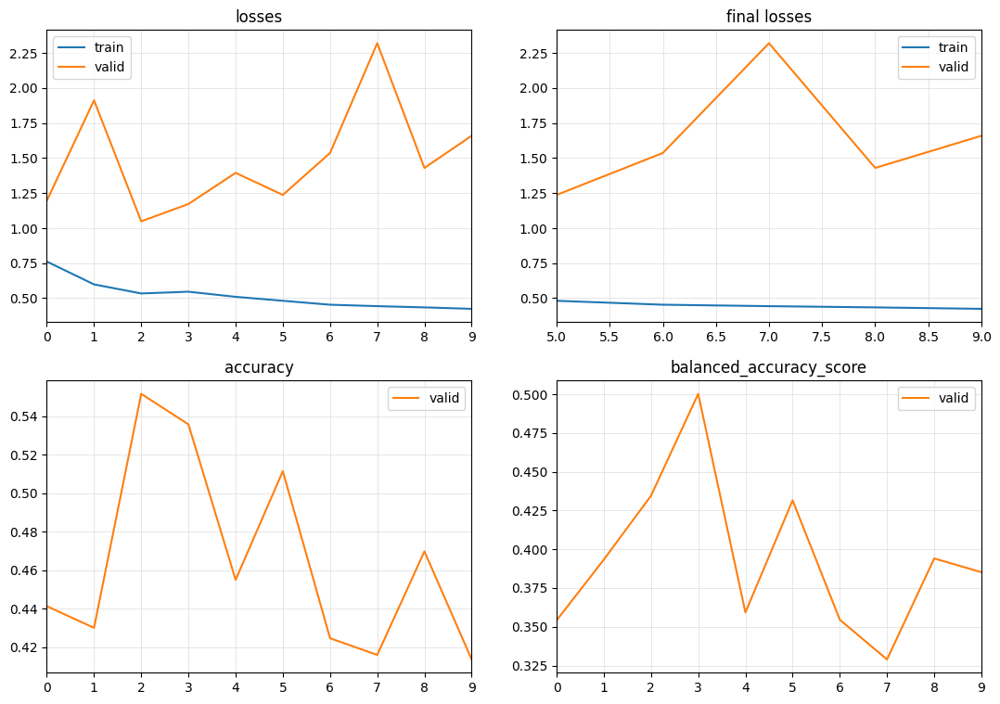

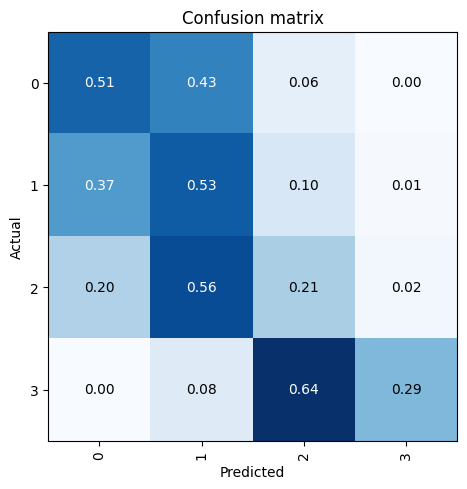

[I 2023-10-14 22:45:15,101] Trial 48 finished with value: 0.5002149284380603 and parameters: {'num_days': 28, 'sample_frac': 0.8, 'batch_size': 8, 'itp_depth': 6, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


{'num_days': 14, 'sample_frac': 1.0, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.01}


epoch,train_loss,valid_loss,accuracy,balanced_accuracy_score,time
0,0.554493,1.734491,0.474375,0.367360,03:14
1,0.481368,1.421960,0.477437,0.483535,03:15
2,0.384638,2.615484,0.425563,0.333747,03:15
3,0.368151,1.819435,0.421438,0.379868,03:15
4,0.344663,1.836415,0.439063,0.390990,03:15
5,0.327379,1.706538,0.427750,0.401120,03:15
6,0.296689,2.093585,0.435688,0.361960,03:15
7,0.300815,1.791416,0.455438,0.361947,03:15
8,0.283229,1.676903,0.468500,0.389432,03:15


No improvement since epoch 1: early stopping


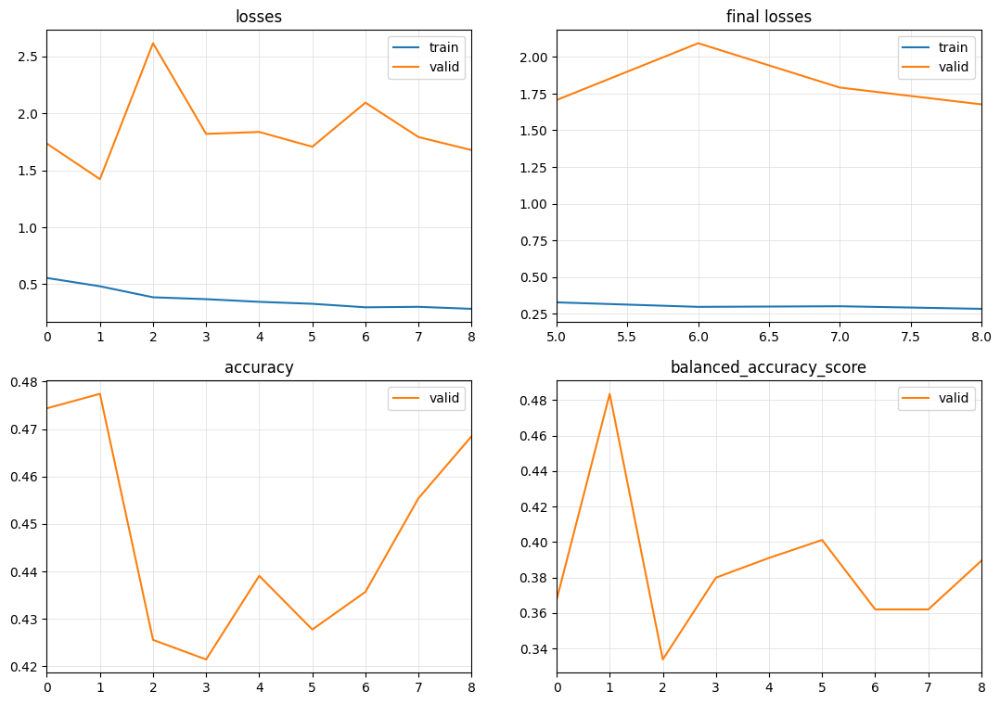

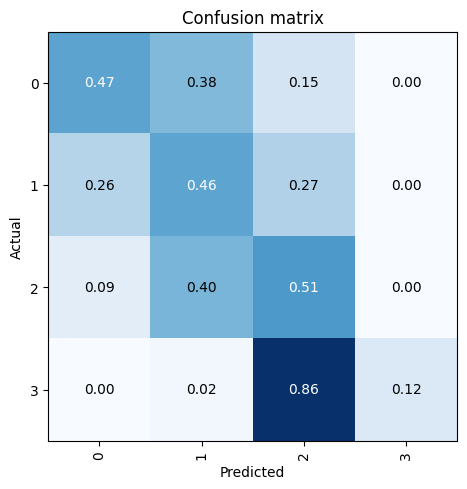

[I 2023-10-14 23:20:22,254] Trial 49 finished with value: 0.4835345274423787 and parameters: {'num_days': 14, 'sample_frac': 1.0, 'batch_size': 32, 'itp_depth': 9, 'learning_rate': 0.01}. Best is trial 23 with value: 0.5890887407459792.


In [30]:
study = optuna.create_study(direction='maximize')#, sampler=optuna.samplers.NSGAIISampler())
#if exists("study.pkl"):
#   study = joblib.load("study.pkl")
    
#with bug to filter features instead of days
study.optimize(objective, n_trials=50)

In [ ]:
from optuna.visualization import plot_contour
from optuna.visualization import plot_edf
from optuna.visualization import plot_intermediate_values
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice
#if exists("study.pkl"):
#   study = joblib.load("study.pkl")
plot_optimization_history(study)

## Top Values
Trial 289 finished with value: 0.617 and parameters: {'num_days': 28, 'batch_size': 8, 'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_depth': 6, 'itp_dropout_rate': 0.0, 'loss_func': 'LabelSmoothingCrossEntropyFlat', 'learning_rate': 0.0024792334740007253}
        
Trial 454 finished with value: 0.616 and parameters: {'num_days': 28, 'batch_size': 8, 'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_depth': 9, 'itp_dropout_rate': 0.0, 'loss_func': 'None', 'learning_rate': 0.0024792334740007253}
        
Trial 161 finished with value: 0.609 and parameters: {'num_days': 84, 'batch_size': 8, 'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_depth': 9, 'itp_dropout_rate': 0.0, 'loss_func': 'None', 'learning_rate': 0.0006723398746247245}
        
Trial 26  finished with value: 0.611 and parameters: {'num_days': 84, 'batch_size': 8, 'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_depth': 6, 'itp_dropout_rate': 0.2, 'loss_func': 'None', 'learning_rate': 1.339568695002037e-05}

## TOp Values with Trend
{'model': 'InceptionTimePlus', 'itp_num_filters': 64, 'itp_depth': 6, 'itp_dropout_rate': 0.0, 'itp_ks': 50, 'loss_func': 'None', 'learning_rate': 5.313916392384214e-05, 'learner_callback': 'None', 'optimizer': 'AdamWD'}

{'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_depth': 9, 'itp_dropout_rate': 0.0, 'itp_ks': 20, 'loss_func': 'None', 'learning_rate': 0.0005038686183117699, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}

{'model': 'InceptionTimePlus', 'itp_num_filters': 32, 'itp_depth': 9, 'itp_dropout_rate': 0.0, 'itp_ks': 20, 'loss_func': 'None', 'learning_rate': 0.0008308573431574618, 'learner_callback': 'IntraClassCutMix1d', 'optimizer': 'AdamWD'}

In [ ]:
plot_contour(study, params=[''learner_callback', 'learning_rate''])

In [ ]:
?plot_contour

In [ ]:
plot_parallel_coordinate(study, params=['learning_rate', 'model'])

In [ ]:
plot_param_importances(study)

In [ ]:
splits

In [ ]:
?LSTMPlus

In [ ]:
splits, dls = utils.create_dls(X, y, feature_mins=np.asarray(feature_mins[filtered_feature_indexes]), 
                                   feature_maxs=np.asarray(feature_maxs[filtered_feature_indexes]), 
                                   splits=splits, sample_frac=1)

In [ ]:
#{'model': 'LSTM', 'hidden_size': 150, 'lstm_n_layers': 3, 
#'rnn_dropout': 0.8, 'bidirectional': False, 'lstm_fc_dropout': 0.6000000000000001, 
#'lstm_cell_type': 'GRU', 'loss_func': 'None', 'learning_rate': 0.001038746221962459,
#'learner_callback': 'CutMix1d', 'optimizer': 'AdamWD'}
#new
#{'model': 'LSTM', 'hidden_size': 100, 'lstm_n_layers': 3, 
#'rnn_dropout': 0.6000000000000001, 'bidirectional': True, 'lstm_fc_dropout': 0.2,
#'lstm_cell_type': 'GRU', 'loss_func': 'None', 'learning_rate': 0.000167599474812371, 
#'learner_callback': 'None', 'optimizer': 'AdamWD'}
model = GRUPlus(dls.vars, dls.c, hidden_size=150, n_layers=3, rnn_dropout=.8, bidirectional=False, 
                fc_dropout=.6)
learn = Learner(dls, model, loss_func=None, opt_func=partial(Adam, decouple_wd=True),  metrics=accuracy, cbs=CutMix1d())   

In [ ]:
#{'model': 'InceptionTimePlus', 'itp_num_filters': 64, 'itp_depth': 6, 
#'itp_dropout_rate': 0.2, 'itp_ks': 40, 'loss_func': 'None', 
#'learning_rate': 0.0001258783818975996, 'learner_callback': 'None', 'optimizer': 'AdamNoWD'}

model = InceptionTimePlus(dls.vars, dls.c, nf=64, depth=6, conv_dropout=.2, ks=40 )
learn = Learner(dls, model, loss_func=None, opt_func=partial(Adam, decouple_wd=False),  metrics=accuracy, cbs=IntraClassCutMix1d())   

In [ ]:
#optimum for 30k samples {'arch': 'InceptionTimePlus', 'bottleneck': True, 'coord': False, 'depth': 3, 'dropout': 0.0, 'ks': 60, 'lr': 0.001, 'num_filters': 64}
#for 180k samples 72 features {'arch': 'InceptionTimePlus', 'bottleneck': True, 'coord': False, 'depth': 6, 'dropout': 0.8, 'ks': 5, 'loss': 'LabelSmoothingCrossEntropy', 'lr': 0.01, 'num_filters': 32}
#{'arch': 'InceptionTimePlus', 'bottleneck': True, 'coord': False, 'depth': 6, 'dropout': 0.8, 'ks': 5, 'loss': 'LabelSmoothingCrossEntropy', 'lr': 0.001, 'num_filters': 64}
dls = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64], batch_tfms=batch_tfms, num_workers=12, inplace=False)
model = InceptionTimePlus(dls.vars, dls.c, bottleneck=True, coord=False, ks=5, conv_dropout=.8, depth=6, nf=32)
learn = Learner(dls, model, loss_func=LabelSmoothingCrossEntropy(), metrics=accuracy)   

In [ ]:
learn.lr_find()

In [ ]:
learn.fit(200, lr=.001, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.001, patience=1)])

In [ ]:
learn.feature_importance()

In [ ]:
#small dset
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)
conf_matrix = interp.plot_confusion_matrix(normalize=False)

In [ ]:
learn.fit(200, lr=0.0001, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.001, patience=7)])

In [ ]:
#large dset, 77.6% at hidden_size: 350
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)
conf_matrix = interp.plot_confusion_matrix(normalize=False)

In [ ]:
learn.recorder.plot_metrics()

In [ ]:
models = []
for i in range(5):
    model = None
    dls = TSDataLoaders.from_dsets(dsets.train, dsets.valid, bs=[64], batch_tfms=batch_tfms, num_workers=12, inplace=False)
    model = TST(dls.vars, dls.c, dls.len, d_ff=512, d_k=64, d_model=128, d_v=64, dropout=.7, fc_dropout=.1, n_heads=16, n_layers=4)
    learn = Learner(dls, model, loss_func=LabelSmoothingCrossEntropyFlat(), metrics=accuracy,  cbs=ShowGraphCallback2())
    learn.fit_one_cycle(25, lr_max=1e-4, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.001, patience=3)])
    interp = ClassificationInterpretation.from_learner(learn)
    conf_matrix = interp.plot_confusion_matrix(normalize=True)
    print(str(accuracy_local(interp)))
    models.append(model)
    

In [ ]:
y[splits_2[1]]

In [ ]:
ys = []
ys[0] = models[0]

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

In [ ]:
#30 days, 50% samples , 74 features
learn.fit_one_cycle(25, lr_max=1e-4, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.001, patience=5)])#, SaveModelCallback(every_epoch=True)])


In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

In [ ]:
X_valid = learn.dls.valid.dataset[:100][0].data
y_valid = learn.dls.valid.dataset[:100][1].data.numpy()

In [ ]:
X_valid.dtype

In [ ]:
sys.getsizeof(X_valid)

In [ ]:
learn.dls.valid.splits

In [ ]:
X_valid.shape

In [ ]:
y_valid.numpy()

In [ ]:
metrics = [mn for mn in learn.recorder.metric_names if mn not in ['epoch', 'train_loss', 'valid_loss', 'time']]

In [ ]:
key_metric_idx=0
if len(metrics) == 0 or key_metric_idx is None:
    metric_name = learner.loss_func.__class__.__name__
    key_metric_idx = None
else:
    metric_name = metrics[key_metric_idx]
    metric = learn.recorder.metrics[key_metric_idx].func
print(f'Selected metric: {metric_name}')

In [ ]:
feature_names = pd.read_csv(ml_path + '/FeatureLabels_' + file_label + '.csv')
feature_names = feature_names['0'].sort_values().values

In [ ]:
if feature_names is None:
    feature_names = [f"var_{i}" for i in range(X_valid.shape[1])]

In [ ]:
results = []
print('Computing feature importance...')

COLS = ['BASELINE'] + list(feature_names)

In [ ]:
len(dls.valid.dataset.tls[0]._splits)

In [ ]:
dls.valid.dataset[0:10][0].data.shape

In [ ]:
X_valid[:, k-1].clone()

In [ ]:
k = 5
random_state=23
if k>0:
    save_feat = X_valid[:, k-1].clone()
    X_valid[:, k-1] = random_shuffle(X_valid[:, k-1].flatten(), random_state=random_state).reshape(X_valid[:, k-1].shape)
if key_metric_idx is None:
    value = learn.get_X_preds(X_valid, y_valid, with_loss=True)[-1].mean().item()
else:
    output = learn.get_X_preds(X_valid, y_valid)
    value = metric(output[0], output[1]).item()
    print(f"{k:3} feature: {COLS[k]:20} {metric_name}: {value:8.6f}")
    results.append([COLS[k], value])
if k>0:
    X_valid[:, k-1] = save_feat
    del save_feat; gc.collect()

In [ ]:
??learn.dls.valid.new_dl

In [ ]:
from __future__ import print_function
from sys import getsizeof, stderr
from itertools import chain
from collections import deque
try:
    from reprlib import repr
except ImportError:
    pass

def total_size(o, handlers={}, verbose=False):
    """ Returns the approximate memory footprint an object and all of its contents.

    Automatically finds the contents of the following builtin containers and
    their subclasses:  tuple, list, deque, dict, set and frozenset.
    To search other containers, add handlers to iterate over their contents:

        handlers = {SomeContainerClass: iter,
                    OtherContainerClass: OtherContainerClass.get_elements}

    """
    dict_handler = lambda d: chain.from_iterable(d.items())
    all_handlers = {tuple: iter,
                    list: iter,
                    deque: iter,
                    dict: dict_handler,
                    set: iter,
                    frozenset: iter,
                   }
    all_handlers.update(handlers)     # user handlers take precedence
    seen = set()                      # track which object id's have already been seen
    default_size = getsizeof(0)       # estimate sizeof object without __sizeof__

    def sizeof(o):
        if id(o) in seen:       # do not double count the same object
            return 0
        seen.add(id(o))
        s = getsizeof(o, default_size)

        if verbose:
            print(s, type(o), repr(o), file=stderr)

        for typ, handler in all_handlers.items():
            if isinstance(o, typ):
                s += sum(map(sizeof, handler(o)))
                break
        return s

    return sizeof(o)



In [ ]:
del dl; gc.collect()

In [ ]:
bs=64
with_input=False
with_decoded=True
with_loss=False
dl = learn.dls.valid.new_dl(X_valid, y=y_valid)
if bs: setattr(dl, "bs", bs)
else: assert dl.bs, "you need to pass a bs != 0"
output = list(learn.get_preds(dl=dl, with_input=with_input, with_decoded=with_decoded, with_loss=with_loss, reorder=False))
if with_decoded and len(learn.dls.tls) >= 2 and hasattr(learn.dls.tls[-1], "tfms") and hasattr(learn.dls.tls[-1].tfms, "decodes"):
    output[2 + with_input] = learn.dls.tls[-1].tfms.decode(output[2 + with_input])


In [ ]:
learn.dls.tls[-1]

In [ ]:
output = learn.get_X_preds(X_valid, y_valid)

In [ ]:
import sys

In [ ]:
total_size(learn)

In [ ]:
total_size(dl)

In [ ]:
total_size(output)

In [ ]:
total_size(X_valid)

In [ ]:
total_size(results)

In [ ]:
total_size(value)

In [ ]:
results

In [ ]:
gc.collect()

In [ ]:
b = dls.valid.one_batch()



In [ ]:
dsets.valid

In [ ]:
probas, target, preds  = learn.get_preds(dl=dls.valid, with_input=False, with_loss=False, with_decoded=True, act=None)

In [ ]:
X[splits_2[1]].shape

In [ ]:
dls.bs

In [ ]:
learn.feature_importance(X[splits_2[1]], y[splits_2[1]])

In [ ]:
for i in range(75):
    print(str(i))
    probas, target, preds = learn.get_X_preds(X[splits_2[1]], y[splits_2[1]])

In [ ]:
import gc
gc.collect()

In [ ]:
#60000 samples 0 dropout
learn.fit_one_cycle(25, lr_max=1e-4, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.01, patience=5)])#, SaveModelCallback(every_epoch=True)])
learn.recorder.plot_metrics()
interp = ClassificationInterpretation.from_learner(learn)
#conf_matrix = interp.plot_confusion_matrix(normalize=True)

print(accuracy_local(interp))

In [ ]:
conf_matrix = interp.plot_confusion_matrix(normalize=True)

In [ ]:
#60000 samples
learn.fit_one_cycle(25, lr_max=1e-3, cbs=[EarlyStoppingCallback(monitor='accuracy', min_delta=0.01, patience=3)])#, SaveModelCallback(every_epoch=True)])
learn.recorder.plot_metrics()
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

print(accuracy_local(interp))

In [ ]:
torch.cuda.empty_cache()

In [ ]:
learn.fit_one_cycle(5, lr_max=1e-2)#, cbs=EarlyStoppingCallback(monitor='accuracy', min_delta=0.1, patience=5))
learn.recorder.plot_metrics()
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

print(accuracy_local(interp))

In [ ]:
ordered_label_errors.shape

In [ ]:
[[x for x in splits_2[0] if x not in ordered_label_errors], splits_2[1]]

In [ ]:
batch_tfms = [TSStandardize(by_var=True), Nan2Value()]
clf = TSClassifier(X, y, splits=[[x for x in splits_2[0] if x not in ordered_label_errors], splits_2[1]], arch=InceptionTimePlus, batch_tfms=batch_tfms, metrics=accuracy, cbs=ShowGraph(), verbose=True)
clf.fit_one_cycle(3, 1e-2)

In [ ]:
interp = ClassificationInterpretation.from_learner(clf)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

In [ ]:
feature_names = pd.read_csv(ml_path + '/FeatureLabels_' + file_label + '.csv')
feature_names = feature_names['0'].sort_values().values

In [ ]:
feature_names.shape

In [ ]:
X.shape

In [ ]:
import xarray as xr

In [ ]:
da = xr.DataArray(X, dims=['sample','feature', 'timestep'], coords=[range(0,12000),feature_names,range(0,180)])

In [ ]:
feature_names

In [ ]:
filtered_feature_indexes

In [ ]:
avg_features = [x for x in feature_names if 'avg' in x ]

In [ ]:
many_level_features = ['ABSV', 'HGT']

In [ ]:
filtered_features

In [ ]:
feature = ['WEASD_surface_max', 'SNOD_surface_max', 'UGRD_30M0mbaboveground_max', 'VGRD_30M0mbaboveground_max', 'TMP_surface_min', 'HGT_surface_min', 'VVEL_150mb_avg', 'APCP_surface_sum', 'ACPCP_surface_sum', 'WATR_surface_sum']
small_feature_indexes = [list(feature_names).index(x) for x in feature]

In [ ]:
da.sel(feature='SNOD_surface_avg', sample=4).plot()

In [ ]:
da.sel(feature='APCP_surface_sum', sample=range(0,100)).plot()

In [ ]:
y.shape


In [ ]:
#X, y, splits = get_classification_data('ECG200', split_data=False)

In [ ]:
X.shape

In [ ]:
da.sel(feature=feature, timestep=timestep).values.reshape(6500,len(feature),len(timestep))[splits_2[0][8]][7]

In [ ]:
timestep=range(0,180)
feature = ['WEASD_surface_max', 'SNOD_surface_max', 'UGRD_30M0mbaboveground_max', 'VGRD_30M0mbaboveground_max', 'TMP_surface_min', 'HGT_surface_min', 'VVEL_150mb_avg', 'APCP_surface_sum', 'ACPCP_surface_sum', 'WATR_surface_sum']
bad_features = ['PRES_surface_max', 'TSOIL_1M2mbelowground_max', 'TMP_surface_min', 'RH_2maboveground_max']
tfms = [None, [Categorize()]]
X = da.sel(feature=feature, timestep=timestep).values.reshape(12000,len(feature),len(timestep))
dsets2 = TSDatasets(X, y, tfms=tfms, splits=splits_2, inplace=True)
#create the dataloader
dls2 = TSDataLoaders.from_dsets(dsets2.train, dsets2.valid, bs=[64], batch_tfms=[TSStandardize(by_var=True), Nan2Value()], num_workers=0)

In [ ]:
ts_features = get_ts_features(np.nan_to_num(X), y, n_jobs=20)

In [ ]:
ts_features.shape

In [ ]:
dls2.train.show_batch()

In [ ]:
dls2.valid.show_batch()

In [ ]:
??get_ts_features

In [ ]:
#TST: 30: .29
#TST: 80: .2
#TST: 180: .4

#Try TST
model = InceptionTimePlus(dls2.vars, dls2.c, dls2.len)#, res_dropout=.3, fc_dropout=.8)
#config = {'res_dropout':.3, 'fc_dropout':.8}
learn = Learner(dls2, model, loss_func=LabelSmoothingCrossEntropy(), metrics=[RocAuc(), accuracy],  cbs=ShowGraphCallback2())
#learn = TSClassifier( y, splits=splits_3, arch=TST, arch_config=config, batch_tfms=[TSStandardize(), Nan2Value()], metrics=accuracy, cbs=ShowGraph(), verbose=True)
#learn.fit_one_cycle(10, 1e-4)

In [ ]:
learn.lr_find()

In [ ]:
learn.fit_one_cycle(10, 1e-4)

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
conf_matrix = interp.plot_confusion_matrix(normalize=True)

print(accuracy_local(interp))


In [ ]:
from captum.attr import IntegratedGradients
from captum.attr import LayerConductance
from captum.attr import NeuronConductance

In [ ]:
net = learn.model.cpu()

In [ ]:
b = dls.one_batch()

In [ ]:
test_input_tensor = b[0].type(torch.FloatTensor)

In [ ]:
test_labels = b[1].cpu().data.numpy()

In [ ]:
out_probs = net(test_input_tensor).detach().cpu().numpy()
out_classes = np.argmax(out_probs, axis=1)
train_accuracy = sum(out_classes == test_labels) / len(test_labels)
print("Accuracy:", train_accuracy )

In [ ]:
mlflow.log_metric('Train Accuracy', train_accuracy)

In [ ]:
ig = IntegratedGradients(net)

In [ ]:
#test_input_tensor.requires_grad_()
attr, delta = ig.attribute(test_input_tensor,target=1, return_convergence_delta=True)
attr = attr.detach().numpy()

In [ ]:
feature_names = feature_names[feature_filter]

In [ ]:
# Helper method to print importances and visualize distribution
def visualize_importances(feature_names, importances, title="Average Feature Importances", plot=True, axis_title="Features"):
    pd.DataFrame(zip(feature_names, np.mean(importances, axis=(0,2)))).sort_values(1, ascending=False)[:25].plot.barh(x=0, y=1)

visualize_importances(feature_names, attr)

In [ ]:
top_features =  pd.DataFrame(zip(feature_names, np.mean(attr, axis=(0,2))), columns=['Feature', 'Importance']).sort_values('Importance', ascending=False)

In [ ]:
top_features.to_csv('../Scratch/Notebooks/' + '/FeatureImportances.csv')

In [ ]:
top_features = pd.read_csv('../Scratch/Notebooks/' + '/FeatureImportances.csv')

In [ ]:
orig_X = X

In [ ]:
orig_feature_means = feature_means

In [ ]:
orig_feature_std = feature_std

In [ ]:
mlflow.end_run()

In [ ]:
feature_filter = top_features[:100].index

In [ ]:
X = orig_X[:, feature_filter, :]
feature_means = orig_feature_means[feature_filter]
feature_std = orig_feature_std[feature_filter]

In [ ]:
fill_values = torch.zeros_like(TSTensor(X))
for i in range(0,X.shape[1]):
    fill_values[:,i,:] = torch.full_like(TSTensor(X[:,i,:]), feature_means[i])
        
X_noNan = torch.where(torch.isnan(TSTensor(X)), fill_values, TSTensor(X))

In [ ]:
X_noNan[:,:,-30:].shape